# Final Project Submission

Please fill out:
* Student name: Jessica Miles
* Student pace: Full Time
* Scheduled project review date/time: July 21, 2021
* Instructor name: James Irving

## TABLE OF CONTENTS 

*Click to jump to matching Markdown Header.*<br><br>
 
- **[Introduction](#INTRODUCTION)<br>**
- **[OBTAIN](#OBTAIN)**<br>
- **[SCRUB](#SCRUB)**<br>
- **[EXPLORE](#EXPLORE---All-Facebook-Posts)**<br>
- **[MODEL](#Model-Facebook-Posts-Only)**<br>
- **[iNTERPRET](#iNTERPRET)**<br>
- **[Conclusions/Recommendations](#CONCLUSIONS-&-RECOMMENDATIONS)<br>**
___

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mat
import seaborn as sns
import joblib
import hashlib
import json
import pickle
import gzip
import re
from ml_tools import model_eval, nlp_prep, eda

import nltk
from nltk.probability import FreqDist
from nltk.tokenize import TweetTokenizer, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tag import StanfordPOSTagger

from wordcloud import WordCloud

import spacy

from sklearn import metrics
from sklearn.base import clone
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.dummy import DummyClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer, CountVectorizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, SGDClassifier

In [2]:
#nltk.download('averaged_perceptron_tagger')

# INTRODUCTION

> This analysis uses machine learning to understand the characteristics of New York Times Facebook posts that predict higher engagement.

## Business Problem

Modern Americans consume news in multiple formats: printed newspaper, online on websites, and on social media. To remain relevant in modern times, news outlets need to be able to engage users on platforms such as Facebook as well as using traditional methods. However, what Facebook users engage with more may differ from consumers of print media.

One criterion Facebook's News Feed algorithm uses to prioritize what its users see is amount of engagement (shares, comments, and likes) on a given post. Higher prioritization in News Feed may help content be disseminated to a wider audience, some of whom may decide to become subscribers.

Relevant and important news is not always the most popular, so outlets like The New York Times will likely not want to simply use top predictors of engagement on Facebook to decide what to report on. However, understanding what people engage with the most will shed light on what Facebook users care about, and may help The Times decide which articles to prioritize for posting. I also modeled how and when posts were made, to shed insights on steps The Times could take to increase engagement on any topic.


# OBTAIN

## Data Understanding

I started with a [found dataset](https://data.world/martinchek/2012-2016-facebook-posts) of about 48,000 Facebook posts from the New York Times' account covering the time period from late 2012 to late 2016.

Given Facebook's policies around what can be pulled from pages unless you control it, it wasn't possible for me to gather any more recent data myself.

I wanted to try to match the Facebook posts up to actual articles from the NYT using their API. It was my hope that I could both compare the level of engagement on Facebook versus the Times' main site (comment counts) as well as get additional article metadata to use in modeling, such as word counts of the articles, news desk/section, and the keywords the Times has assigned to people, places, and topics addressed in each article.

See the separate notebook [data_gathering](data_gathering.ipynb) for the steps I took to query the Times' article API to get basic metadata for all articles during the desired time frame, and then attempted to match Facebook Posts to articles accurately. It proved somewhat challenging for a few reasons:
- There was no hard and fast rule to map the Facebook post metadata (name, message, and description) to the article metadata (such as snippet, abstract, and main headline).
- Descriptions and titles were often changed for the Facebook post (or perhaps the article info changed over time as well) so exact matches were often not possible.
- The article links seem to occasionally have changed since articles were posted to Facebook, as links were not reliable matches. Some Facebook posts were links to videos that were uploaded to Facebook directly and not links to the Times' main site, so these could also not be matched directly.
- Many Facebook links were shortened, so I had to go through and use `urllib` to follow them and record the final expanded link to attempt using these for matching.
- An article may have been shared on Facebook on a different date than when the article was first published, so this could not be used reliably to match either.
- Not all articles may have been included in the Article API results, such as recipes. This may be due to type of content, but also may be due to some recipes or articles having been published before the time period I searched for, but shared to Facebook later (for instance, the same Thanksgiving recipes may be shared year after year).
- The Times has some recurring features such as daily information to start your day, which tended to have the same name, message and description. These had to be matched on text information as well as date.
- There were sometimes legitimately multiple versions of NYT features listed in its API results due to there being a written article, an interactive feature, and a slideshow, for instance. Where a single Facebook post matched on multiple articles, I manually reviewed and judged the best match.

Ultimately, I was able to match 43k out of 48k, which I considered to be pretty good.

Target variable will be some combination of shares, comments, and likes. I don't believe Facebook's News Feed prioritization algorithm weights any one of these more than the other, so I plan to take all three into consideration. However, I will need to review the distributions of each engagement metric to decide how to engineer the target.

In [3]:
df = pd.read_csv('data/the-new-york-times-5281959998.csv', encoding='utf_16_le', 
                 engine='python')
df.head()

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,shares_count,love_count,wow_count,haha_count,sad_count,thankful_count,angry_count,link,picture,posted_at
0,5281959998_416259568436280,5281959998,Did Barack Obama Save Ohio?,"'There are several pivotal states — Ohio, Flor...",Why the battle to take credit for Ohio’s ever-...,nytimes.com,link,shared_story,413,44,68,0,0,0,0,0,0,http://www.nytimes.com/2012/09/09/magazine/ohi...,https://external.xx.fbcdn.net/safe_image.php?d...,2012-09-08 15:16:55
1,5281959998_268320586619940,5281959998,The Weatherman Is Not a Moron,"In 1940, the chance of an American being kille...",In the hocus-pocus realm of predicting the fut...,nytimes.com,link,shared_story,338,14,78,0,0,0,0,0,0,http://www.nytimes.com/2012/09/09/magazine/the...,https://external.xx.fbcdn.net/safe_image.php?d...,2012-09-08 16:01:13
2,5281959998_467433813289503,5281959998,The Organic Fable,"'Organic has long since become an ideology, th...",A study exposes the hype behind a pseudoscient...,nytimes.com,link,shared_story,812,290,421,0,0,0,0,0,0,http://www.nytimes.com/2012/09/07/opinion/roge...,https://external.xx.fbcdn.net/safe_image.php?d...,2012-09-08 16:44:02
3,5281959998_10150252974589999,5281959998,Timeline Photos,Our special Arts & Leisure section 'The New Se...,NaN,NaN,photo,added_photos,513,17,99,0,0,0,0,0,0,https://www.facebook.com/nytimes/photos/a.2835...,https://scontent.xx.fbcdn.net/v/t1.0-0/s130x13...,2012-09-08 17:32:18
4,5281959998_463550620334374,5281959998,Pot for Parents,'When I’m rolling around the floor with my gig...,"I am a more loving, attentive and patient fath...",nytimes.com,link,shared_story,502,83,170,0,0,0,0,0,0,http://www.nytimes.com/2012/09/08/opinion/how-...,https://external.xx.fbcdn.net/safe_image.php?d...,2012-09-08 19:14:51


In [4]:
# import NYT article metadata matched to Facebook posts in separate notebook
f = gzip.open('data/final_matches.pickle.gz','rb')
df_matches = pickle.load(f)
f.close()

In [5]:
df_matches.head()

,id,_id,print_section,print_page,snippet,lead_paragraph,main_headline,keywords,news_desk,section_name,type_of_material,word_count
0,5281959998_416259568436280,nyt://article/b122515f-2281-5ca8-8749-7a64f317...,MM,28,Why the battle to take credit for Ohio’s ever-...,"The way John Kasich sees it, he is fulfilling ...",Did Barack Obama Save Ohio?,"[{'name': 'glocations', 'value': 'Ohio', 'rank...",Magazine,Magazine,News,7113
1,5281959998_268320586619940,nyt://article/c45ee260-62ac-52cf-8937-29d1f731...,MM,34,In the hocus-pocus realm of predicting the fut...,"From the inside, the National Centers for Envi...",The Weatherman Is Not a Moron,"[{'name': 'persons', 'value': 'Richardson, Lew...",Magazine,Magazine,News,3915
2,5281959998_463550620334374,nyt://article/18ecc9e3-6e52-5c51-a7c2-9a788727...,A,21,"I am a more loving, attentive and patient fath...",San Francisco,Pot for Parents,"[{'name': 'subject', 'value': 'Medical Marijua...",OpEd,Opinion,Op-Ed,855
3,5281959998_10150253031069999,nyt://article/686b0747-bbe4-5436-86ad-ada41713...,NaN,NaN,"Introduced to a boy born in Hawaii, President ...","ORLANDO, Fla. — Birthers, you’re not going to ...",Obama Makes Birth Certificate Joke,"[{'name': 'subject', 'value': 'Presidential El...",,U.S.,News,114
4,5281959998_437214569655310,nyt://article/28e0313f-8660-56b8-9ed8-db9be898...,A,1,In 2011 the Department of Education paid $1.4 ...,"At a protest last year at New York University,...",Debt Collectors Cashing In on Student Loans,"[{'name': 'subject', 'value': 'Series', 'rank'...",Business,Business Day,News,2508


# SCRUB

## Article Metadata

In [6]:
df_matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43448 entries, 0 to 43447
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                43448 non-null  object
 1   _id               43448 non-null  object
 2   print_section     31714 non-null  object
 3   print_page        31714 non-null  object
 4   snippet           43448 non-null  object
 5   lead_paragraph    43448 non-null  object
 6   main_headline     43448 non-null  object
 7   keywords          43448 non-null  object
 8   news_desk         43448 non-null  object
 9   section_name      42711 non-null  object
 10  type_of_material  43443 non-null  object
 11  word_count        43448 non-null  int64 
dtypes: int64(1), object(11)
memory usage: 4.0+ MB


### Fill Nulls

In [7]:
# print section and print page have the same number of nulls, are the nulls
# happening on the same records?
df_matches.loc[df_matches['print_section'].isna(), 'print_page'].value_counts()

Series([], Name: print_page, dtype: int64)

In [8]:
df_matches.loc[df_matches['print_section'].isna(), 'type_of_material'].value_counts()

News                   6796
Interactive Feature    2358
Recipe                  737
Video                   605
Op-Ed                   568
briefing                172
Slideshow               164
Review                  156
Question                 58
Editorial                42
Special Report           14
List                     12
Series                   12
Letter                    7
Text                      7
News Analysis             7
Web Log                   3
Brief                     3
Obituary (Obit)           2
recipe                    2
Interview                 2
Schedule                  1
Quote                     1
Name: type_of_material, dtype: int64

No patterns emerged in terms of missing print info. I will just populate with a null placeholder.

In [9]:
df_matches.loc[df_matches['print_section'].isna(), 'print_section'] = 'None'
df_matches.loc[df_matches['print_page'].isna(), 'print_page'] = 'None'

In [10]:
df_matches['news_desk'].value_counts()[:40]

National             7719
Foreign              6844
Business             3482
OpEd                 2959
Sports               2655
Metro                2433
Culture              2370
                     2273
Science              1888
Styles               1520
Editorial            1351
Magazine             1155
Travel                763
Arts&Leisure          613
Dining                526
U.S.                  483
Upshot                465
Politics              425
Weekend               388
SundayBusiness        331
The Upshot            326
World                 321
TStyle                214
BookReview            213
NYTNow                182
RealEstate            167
Opinion               129
Society               107
Arts                   99
New York               98
EdLife                 83
Fashion & Style        79
Metropolitan           73
Blogs                  57
Business Day           57
Home                   57
Well                   44
NODESK                 38
Movies      

Hmmm, there are definitely some news_desk values that are empty. I also see a `'NODESK'` placeholder further down.

In [11]:
df_matches.loc[df_matches['news_desk']=='', 'type_of_material'].value_counts()

News      1452
Recipe     737
Video       80
Name: type_of_material, dtype: int64

Going to replace those empty strings with `'None'` to be consistent.

In [12]:
df_matches.loc[(df_matches['news_desk']=='') | (df_matches['news_desk']=='NODESK'), 
               'news_desk'] = 'None'

In [13]:
df_matches['section_name'].value_counts()

U.S.                          8319
World                         6823
Opinion                       4620
Sports                        2666
New York                      2588
Arts                          2504
Business Day                  2411
Health                        1614
Fashion & Style               1384
Science                       1280
The Upshot                    1230
Magazine                      1154
Technology                    1061
Travel                         762
Movies                         657
Food                           581
Multimedia/Photos              453
Books                          428
T Magazine                     287
Style                          283
Theater                        253
Blogs                          204
Education                      189
Your Money                     188
Real Estate                    180
NYT Now                        144
Sunday Review                   79
Well                            74
Home & Garden       

In [14]:
df_matches.loc[df_matches['section_name'].isna(), 'news_desk'].value_counts()

None    737
Name: news_desk, dtype: int64

Interesting, so the articles that don't have a section_name also don't have a news_desk.

In [15]:
df_matches.loc[df_matches['section_name'].isna(), 'type_of_material'].value_counts()

Recipe    737
Name: type_of_material, dtype: int64

And they're all recipes. None of the recipes marked as such as `type of material` seem to be classified in either `section_name` or `news_desk`. I'll make a new category for these, since I know the Times does have a separate Cooking section that's a subsection of Food and is dedicated to recipes and articles about cooking.

In [16]:
df_matches.loc[df_matches['type_of_material'] == 'Recipe', 
               ['news_desk', 'section_name']] = 'Cooking'

In [17]:
df_matches.loc[df_matches['type_of_material'] == 'Recipe']

,id,_id,print_section,print_page,snippet,lead_paragraph,main_headline,keywords,news_desk,section_name,type_of_material,word_count
42451,5281959998_10150276934359999,nyt://recipe/383cbf04-9dec-5ad8-a653-1fd686b42631,None,None,,The affinity that cauliflower has with black o...,Sicilian Cauliflower and Black Olive Gratin,[],Cooking,Cooking,Recipe,0
42481,5281959998_10150406016844999,nyt://recipe/69280bcf-8ac2-5d80-8bb4-60b06abdc0b0,None,None,,"The mint julep is, as Chris McMillian of the L...",Mint Julep,[],Cooking,Cooking,Recipe,0
42511,5281959998_10150458674129999,nyt://recipe/b32956e5-a287-5301-95b2-51a8070fd75d,None,None,,"This mashup of Julia Child recipes, combining ...",Bacon-Cheddar Quiche,[],Cooking,Cooking,Recipe,0
42532,5281959998_10150463643909999,nyt://recipe/8ee5bf90-d7d7-54dd-b950-3946edc5b5d4,None,None,,"A combination of soft beans, harissa-imbued ve...",Eggs With Gigante Beans and Harissa,[],Cooking,Cooking,Recipe,0
42535,5281959998_10150464102119999,nyt://recipe/66ac3312-2f89-5863-8050-9d637edc2306,None,None,,You probably already have a favorite pantry pa...,Pasta With Fried Lemons and Chile Flakes,[],Cooking,Cooking,Recipe,0
...,...,...,...,...,...,...,...,...,...,...,...,...
43443,5281959998_10150954475304999,nyt://recipe/43fa7001-6bf5-534c-a57e-4c590659346b,None,None,,This hearty pumpkin bread is a sophisticated t...,Pumpkin Bread With Brown Butter and Bourbon,[],Cooking,Cooking,Recipe,0
43444,5281959998_10150953811444999,nyt://recipe/8438a62c-1e62-557d-a0d9-133f9c812614,None,None,,This casserole may upset some mashed potato pu...,Mashed Potato Casserole,[],Cooking,Cooking,Recipe,0
43445,5281959998_1301608653216932,nyt://recipe/1c7d9d6b-bfcf-5f1a-a9b0-5c3a13b04c9e,None,None,,If you havenâ€™t yet figured out a go-to recip...,Roasted Brussels Sprouts With Garlic,[],Cooking,Cooking,Recipe,0
43446,5281959998_10150953848459999,nyt://recipe/80dd0d57-acce-58ba-8eb1-264c6ac32f88,None,None,,This is a classic Italian bean and pasta soup....,Pasta e Fagioli,[],Cooking,Cooking,Recipe,0


In [18]:
df_matches.loc[df_matches['type_of_material'].isna()]

,id,_id,print_section,print_page,snippet,lead_paragraph,main_headline,keywords,news_desk,section_name,type_of_material,word_count
42464,5281959998_10150366102944999,nyt://article/bf3e968c-1bb4-5630-a5e8-5e3cccf4...,None,None,From the Abstract City archive: An artist’s at...,,Let It Dough!,[],None,Opinion,NaN,1
42510,5281959998_10150458146549999,nyt://article/13c1a736-7484-5500-8eac-b7fede9a...,None,None,The runway gantlet looks very familiar. The ou...,Remember when hats were hattier?,When Hats Had Heart,"[{'name': 'subject', 'value': 'Fashion and App...",None,Multimedia/Photos,NaN,306
42650,5281959998_10150510449164999,nyt://article/46a291e1-a27c-54c8-ae80-eb51093e...,None,None,"He knows a thing or two about nice. And, as a ...","“Ho, ho, ho. You got a problem with that?”",North Pole Noir,"[{'name': 'subject', 'value': 'Archives and Re...",None,Multimedia/Photos,NaN,318
43039,5281959998_10150715658464999,nyt://interactive/59bc74fa-2f6b-4836-b5de-6a6a...,None,None,As part of a series of editorials about transg...,As part of a series of editorials about transg...,Transgender Lives: Your Stories,[],Opinion,Opinion,NaN,0
43286,5281959998_10150836010884999,nyt://article/2694ca1d-a271-59a2-b296-9ca63594...,None,None,The intrepid “On the Street” fashion photograp...,As anyone knows who has seen the documentary “...,Bill Cunningham: A Rare Bird’s Feathers,"[{'name': 'subject', 'value': 'Hats and Caps',...",None,Multimedia/Photos,NaN,242


In [19]:
df_matches['type_of_material'].value_counts()

News                   33428
Op-Ed                   3273
Interactive Feature     2359
Review                   839
Recipe                   737
Editorial                622
Video                    605
Obituary (Obit)          510
News Analysis            289
Question                 193
briefing                 172
Slideshow                164
Biography                 66
Letter                    31
List                      29
An Appraisal              26
Interview                 22
Special Report            19
Series                    16
Text                      10
Brief                      9
Web Log                    6
Summary                    4
recipe                     3
Caption                    2
An Analysis                2
Economic Analysis          2
Chronology                 1
Schedule                   1
Military Analysis          1
Quote                      1
Correction                 1
Name: type_of_material, dtype: int64

In [20]:
df_matches.loc[df_matches['type_of_material'].isna(), 'type_of_material'] = 'None'

Some of these have a title case and a lower case version. Let's standardize to title case.

In [21]:
df_matches['type_of_material'] = df_matches['type_of_material'].map(lambda x: x.title())

In [22]:
df_matches['type_of_material'].value_counts()

News                   33428
Op-Ed                   3273
Interactive Feature     2359
Review                   839
Recipe                   740
Editorial                622
Video                    605
Obituary (Obit)          510
News Analysis            289
Question                 193
Briefing                 172
Slideshow                164
Biography                 66
Letter                    31
List                      29
An Appraisal              26
Interview                 22
Special Report            19
Series                    16
Text                      10
Brief                      9
Web Log                    6
None                       5
Summary                    4
Caption                    2
Economic Analysis          2
An Analysis                2
Chronology                 1
Schedule                   1
Military Analysis          1
Quote                      1
Correction                 1
Name: type_of_material, dtype: int64

In [23]:
df_matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43448 entries, 0 to 43447
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                43448 non-null  object
 1   _id               43448 non-null  object
 2   print_section     43448 non-null  object
 3   print_page        43448 non-null  object
 4   snippet           43448 non-null  object
 5   lead_paragraph    43448 non-null  object
 6   main_headline     43448 non-null  object
 7   keywords          43448 non-null  object
 8   news_desk         43448 non-null  object
 9   section_name      43448 non-null  object
 10  type_of_material  43448 non-null  object
 11  word_count        43448 non-null  int64 
dtypes: int64(1), object(11)
memory usage: 4.0+ MB


### Expand keyword list of dicts

In [24]:
df_matches.at[0, 'keywords']

[{'name': 'glocations', 'value': 'Ohio', 'rank': 1, 'major': 'N'},
 {'name': 'subject', 'value': 'Automobiles', 'rank': 2, 'major': 'N'},
 {'name': 'persons', 'value': 'Kasich, John R', 'rank': 3, 'major': 'N'},
 {'name': 'persons', 'value': 'Portman, Rob', 'rank': 4, 'major': 'N'},
 {'name': 'persons', 'value': 'Geithner, Timothy F', 'rank': 5, 'major': 'N'},
 {'name': 'persons', 'value': 'Obama, Barack', 'rank': 6, 'major': 'N'},
 {'name': 'subject',
  'value': 'Economic Conditions and Trends',
  'rank': 7,
  'major': 'N'},
 {'name': 'glocations', 'value': 'Columbus (Ohio)', 'rank': 8, 'major': 'N'},
 {'name': 'organizations', 'value': 'JobsOhio', 'rank': 9, 'major': 'N'},
 {'name': 'persons', 'value': 'Strickland, Ted', 'rank': 10, 'major': 'N'},
 {'name': 'glocations', 'value': 'Lorain (Ohio)', 'rank': 11, 'major': 'N'},
 {'name': 'subject',
  'value': 'American Recovery and Reinvestment Act (2009)',
  'rank': 12,
  'major': 'N'},
 {'name': 'subject',
  'value': 'Presidential Elect

Looks like the same schema for each dictionary in the list, and that they're ranked by importance. I'm not sure what `major` stands for, but looking through a bunch, I don't see any populated with any value other than `N`.

I may not want every single keyword entry, maybe just the top 10 or something. I probably also want to keep them separated by `name`, so I can separate the subject from geolocations, people, organizations, etc.

In [25]:
# create list to hold all reorganized keyword values, entry per df row
kws_list = []

for i in df_matches.index:
    
    # get raw keywords list of dicts
    kws = df_matches.at[i, 'keywords']
    
    # new dict to hold reorganized keywords, with df row index as first value
    entry_dict = {'index': i}
    
    # loop through the entries in the keywords dict
    # reorgnanize with name as key, and values as a list per key
    for entry in kws:
        if entry['name'] in entry_dict.keys():
            entry_dict[entry['name']].append(entry['value'].lower())
        else:
            entry_dict[entry['name']] = [entry['value'].lower()]
            
    kws_list.append(entry_dict)
    
len(kws_list)

43448

In [26]:
df_kws = pd.DataFrame(kws_list)
df_kws.head()

,index,glocations,subject,persons,organizations,creative_works
0,0,"[ohio, columbus (ohio), lorain (ohio), cincinn...","[automobiles, economic conditions and trends, ...","[kasich, john r, portman, rob, geithner, timot...",[jobsohio],NaN
1,1,NaN,"[weather, books and literature, hurricanes and...","[richardson, lewis fry, lorenz, edward norton]","[national center for atmospheric research, int...",NaN
2,2,NaN,"[medical marijuana, marijuana, anxiety and str...",NaN,NaN,NaN
3,3,[florida],[presidential election of 2012],"[obama, barack]",NaN,NaN
4,4,NaN,"[series, credit and debt, student loans, unite...",NaN,NaN,NaN


In [27]:
df_kws.set_index('index', inplace=True)

In [28]:
# join the original matches df to expanded kws columns
df_matches = df_matches.join(df_kws)
df_matches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43448 entries, 0 to 43447
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                43448 non-null  object
 1   _id               43448 non-null  object
 2   print_section     43448 non-null  object
 3   print_page        43448 non-null  object
 4   snippet           43448 non-null  object
 5   lead_paragraph    43448 non-null  object
 6   main_headline     43448 non-null  object
 7   keywords          43448 non-null  object
 8   news_desk         43448 non-null  object
 9   section_name      43448 non-null  object
 10  type_of_material  43448 non-null  object
 11  word_count        43448 non-null  int64 
 12  glocations        20482 non-null  object
 13  subject           41159 non-null  object
 14  persons           30719 non-null  object
 15  organizations     21860 non-null  object
 16  creative_works    2842 non-null   object
dtypes: int64(1),

In [29]:
len(df_matches.loc[df_matches['keywords'].str.len() == 0])

1721

In [30]:
df_matches.loc[df_matches['keywords'].str.len() == 0, 'type_of_material'].value_counts()

Recipe                 737
News                   604
Interactive Feature    155
Briefing               135
Slideshow               73
Video                    5
Op-Ed                    5
Letter                   2
Editorial                2
None                     2
Text                     1
Name: type_of_material, dtype: int64

OK, so almost half of the 1600 entries without keywords populated are Cooking, which is the placeholder I added for recipes.

In [31]:
# does it looks like everything matched up correctly all the way to the end?
df_matches.tail()

,id,_id,print_section,print_page,snippet,lead_paragraph,main_headline,keywords,news_desk,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works
43443,5281959998_10150954475304999,nyt://recipe/43fa7001-6bf5-534c-a57e-4c590659346b,None,None,,This hearty pumpkin bread is a sophisticated t...,Pumpkin Bread With Brown Butter and Bourbon,[],Cooking,Cooking,Recipe,0,NaN,NaN,NaN,NaN,NaN
43444,5281959998_10150953811444999,nyt://recipe/8438a62c-1e62-557d-a0d9-133f9c812614,None,None,,This casserole may upset some mashed potato pu...,Mashed Potato Casserole,[],Cooking,Cooking,Recipe,0,NaN,NaN,NaN,NaN,NaN
43445,5281959998_1301608653216932,nyt://recipe/1c7d9d6b-bfcf-5f1a-a9b0-5c3a13b04c9e,None,None,,If you havenâ€™t yet figured out a go-to recip...,Roasted Brussels Sprouts With Garlic,[],Cooking,Cooking,Recipe,0,NaN,NaN,NaN,NaN,NaN
43446,5281959998_10150953848459999,nyt://recipe/80dd0d57-acce-58ba-8eb1-264c6ac32f88,None,None,,This is a classic Italian bean and pasta soup....,Pasta e Fagioli,[],Cooking,Cooking,Recipe,0,NaN,NaN,NaN,NaN,NaN
43447,5281959998_10150958024099999,nyt://recipe/dad2f214-402f-57b7-9a00-59a3c5e7a3b7,None,None,,Here is a vegetarian dinner course of impressi...,Whole-Roasted Stuffed Delicata Squash,[],Cooking,Cooking,Recipe,0,NaN,NaN,NaN,NaN,NaN


## Join articles to FB posts

In [32]:
# join df_matches to main df
df = df.merge(df_matches.drop(columns=['keywords', '_id']), how='left', on='id')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48088 entries, 0 to 48087
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                48088 non-null  object 
 1   page_id           48088 non-null  int64  
 2   name              46795 non-null  object 
 3   message           46351 non-null  object 
 4   description       43619 non-null  object 
 5   caption           43110 non-null  object 
 6   post_type         48088 non-null  object 
 7   status_type       48077 non-null  object 
 8   likes_count       48088 non-null  int64  
 9   comments_count    48088 non-null  int64  
 10  shares_count      48088 non-null  int64  
 11  love_count        48088 non-null  int64  
 12  wow_count         48088 non-null  int64  
 13  haha_count        48088 non-null  int64  
 14  sad_count         48088 non-null  int64  
 15  thankful_count    48088 non-null  int64  
 16  angry_count       48088 non-null  int64 

In [33]:
# Fill in Facebook columns with placeholders to indicate which could not be
# matched to articles
# since I filled all the nulls before I can choose from a few columns to
# identify these
df.loc[df['news_desk'].isna(), ['print_section', 'print_page', 'news_desk',
            'section_name', 'type_of_material']] = 'Not matched'

df.loc[df['word_count'].isna(), 'word_count'] = 0

# populate new column for is_matched
df.loc[df['news_desk']=='Not matched', 'is_matched'] = 0
df.loc[df['is_matched']!=0, 'is_matched'] = 1

In [34]:
df['is_matched'].value_counts()

1.0    43448
0.0     4640
Name: is_matched, dtype: int64

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48088 entries, 0 to 48087
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                48088 non-null  object 
 1   page_id           48088 non-null  int64  
 2   name              46795 non-null  object 
 3   message           46351 non-null  object 
 4   description       43619 non-null  object 
 5   caption           43110 non-null  object 
 6   post_type         48088 non-null  object 
 7   status_type       48077 non-null  object 
 8   likes_count       48088 non-null  int64  
 9   comments_count    48088 non-null  int64  
 10  shares_count      48088 non-null  int64  
 11  love_count        48088 non-null  int64  
 12  wow_count         48088 non-null  int64  
 13  haha_count        48088 non-null  int64  
 14  sad_count         48088 non-null  int64  
 15  thankful_count    48088 non-null  int64  
 16  angry_count       48088 non-null  int64 

## Fill Nulls in Facebok post fields

In [36]:
# are there any posts where there is neither Name, Message, or Description?
df.loc[(df['name'].isna()) & 
       (df['message'].isna()) & 
       (df['description'].isna())]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,news_desk,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched


Good; before filling nulls, I'm going to create a concatenated field with all three text fields. I think I will want to assess all three sets of text together as a bag of words.

In [37]:
# used suggestion from here: https://stackoverflow.com/questions/19377969/
# combine-two-columns-of-text-in-pandas-dataframe

# separator should be ". " so that the name/title is treated like a sentence
# later when I try lemmatization and need to get the sentences to determine
# POS
df['all_text'] = df['name'].str.cat(df[['message', 'description']], sep='. '
                                    , na_rep='')

In [38]:
# however, then this adds extra ". " where a column was empty. Let's remove 
# those
def clean_after_cat(doc):
    doc = re.sub(r"^(\. )", '', doc)
    doc = re.sub(r"(\. \.)", '.', doc)
    doc = re.sub(r"(\.\. )", '. ', doc)
    doc = re.sub(r"(\. )$", '', doc)
    return doc
    
df['all_text'] = df['all_text'].map(lambda x: clean_after_cat(x))

In [39]:
# review records that didn't have any nulls in text columns
df.loc[(df['name'].isna()==False) & 
       (df['message'].isna()==False) & 
       (df['description'].isna()==False)]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text
0,5281959998_416259568436280,5281959998,Did Barack Obama Save Ohio?,"'There are several pivotal states — Ohio, Flor...",Why the battle to take credit for Ohio’s ever-...,nytimes.com,link,shared_story,413,44,...,Magazine,News,7113.0,"[ohio, columbus (ohio), lorain (ohio), cincinn...","[automobiles, economic conditions and trends, ...","[kasich, john r, portman, rob, geithner, timot...",[jobsohio],NaN,1.0,Did Barack Obama Save Ohio?. 'There are severa...
1,5281959998_268320586619940,5281959998,The Weatherman Is Not a Moron,"In 1940, the chance of an American being kille...",In the hocus-pocus realm of predicting the fut...,nytimes.com,link,shared_story,338,14,...,Magazine,News,3915.0,NaN,"[weather, books and literature, hurricanes and...","[richardson, lewis fry, lorenz, edward norton]","[national center for atmospheric research, int...",NaN,1.0,"The Weatherman Is Not a Moron. In 1940, the ch..."
2,5281959998_467433813289503,5281959998,The Organic Fable,"'Organic has long since become an ideology, th...",A study exposes the hype behind a pseudoscient...,nytimes.com,link,shared_story,812,290,...,Opinion,Op-Ed,866.0,[great britain],"[food, organic foods and products, medicine an...",NaN,NaN,NaN,1.0,The Organic Fable. 'Organic has long since bec...
4,5281959998_463550620334374,5281959998,Pot for Parents,'When I’m rolling around the floor with my gig...,"I am a more loving, attentive and patient fath...",nytimes.com,link,shared_story,502,83,...,Opinion,Op-Ed,855.0,NaN,"[medical marijuana, marijuana, anxiety and str...",NaN,NaN,NaN,1.0,Pot for Parents. 'When I’m rolling around the ...
6,5281959998_437214569655310,5281959998,Debt Collectors Cashing In on Student Loan Rou...,Quotation of the Day: 'You are going to pay it...,The Department of Education last year paid $1....,nytimes.com,link,shared_story,260,74,...,Business Day,News,2508.0,NaN,"[series, credit and debt, student loans, unite...",NaN,NaN,NaN,1.0,Debt Collectors Cashing In on Student Loan Rou...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48083,5281959998_10150958194759999,5281959998,"‘Westworld’ Season 1, Episode 6: The Tipping P...",This week's 'Westworld' gave us the show's mos...,"The world as Maeve understood it is gone, as t...",nytimes.com,link,shared_story,549,37,...,Arts,Review,1226.0,NaN,[television],NaN,NaN,[westworld (tv program)],1.0,"‘Westworld’ Season 1, Episode 6: The Tipping P..."
48084,5281959998_10150958250414999,5281959998,What Ivanka Trump Can’t Sell,“She wants to preach an ideology of female emp...,She has remained loyal to her father. Will tha...,nytimes.com,link,shared_story,3970,621,...,Opinion,Op-Ed,1068.0,NaN,"[presidential election of 2016, women and girl...","[trump, ivanka, trump, donald j]",NaN,NaN,1.0,What Ivanka Trump Can’t Sell. “She wants to pr...
48085,5281959998_10150958439909999,5281959998,"This Time, There Really Is a Hispanic Voter Surge","The Hispanic voter surge is real, and it’s big...",Early voting data unequivocally indicates that...,nytimes.com,link,shared_story,34539,776,...,The Upshot,News,1016.0,[florida],"[presidential election of 2016, hispanic-ameri...","[cohn, nate, trump, donald j, clinton, hillary...",NaN,NaN,1.0,"This Time, There Really Is a Hispanic Voter Su..."
48086,5281959998_10150958425294999,5281959998,NYT Watching Recommendation of the Day: 'Bob's...,The most passionately pro-weirdo show on telev...,The comedy doesn’t just introduce weirdness bu...,nytimes.com,link,shared_story,4113,428,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NYT Watching Recommendation of the Day: 'Bob's...


In [40]:
# review records that have some nulls
df.loc[(df['name'].isna()) | 
       (df['message'].isna()) | 
       (df['description'].isna())]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text
3,5281959998_10150252974589999,5281959998,Timeline Photos,Our special Arts & Leisure section 'The New Se...,NaN,NaN,photo,added_photos,513,17,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Timeline Photos. Our special Arts & Leisure se...
5,5281959998_10150253031069999,5281959998,Timeline Photos,During a surprise visit to Gators Dockside bar...,NaN,NaN,photo,added_photos,9012,594,...,U.S.,News,114.0,[florida],[presidential election of 2012],"[obama, barack]",NaN,NaN,1.0,Timeline Photos. During a surprise visit to Ga...
13,5281959998_10150253189039999,5281959998,Timeline Photos,President Obama got a huge lift—literally — fr...,NaN,NaN,photo,added_photos,16918,1415,...,U.S.,News,336.0,[florida],NaN,"[obama, barack]",[secret service],NaN,1.0,Timeline Photos. President Obama got a huge li...
14,5281959998_10150253207659999,5281959998,Timeline Photos,Serena Williams defeated Victoria Azarenka to ...,NaN,NaN,photo,added_photos,7629,353,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Timeline Photos. Serena Williams defeated Vict...
22,5281959998_10150253392344999,5281959998,Timeline Photos,What's on your menu for lunch or dinner today?...,NaN,NaN,photo,added_photos,389,27,...,Health,News,498.0,NaN,"[medicine and health, rice, risotto]",NaN,NaN,NaN,1.0,Timeline Photos. What's on your menu for lunch...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48036,5281959998_10150957229929999,5281959998,Timeline Photos,Election week is here. Enjoy unlimited access ...,NaN,NaN,photo,added_photos,1196,532,...,U.S.,News,350.0,NaN,[presidential election of 2016],NaN,NaN,NaN,1.0,Timeline Photos. Election week is here. Enjoy ...
48057,5281959998_10150957195084999,5281959998,Ride Along With 'Souls to the Polls',"360° video: In North Carolina, where the presi...",NaN,NaN,video,added_video,995,83,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Ride Along With 'Souls to the Polls'. 360° vid...
48059,5281959998_10150957696529999,5281959998,Burning Effigies on Bonfire Night,Effigies of Donald J. Trump and Theresa May we...,NaN,NaN,video,added_video,2157,249,...,World,News,1142.0,"[lewes (england), great britain]",[holidays and special occasions],"[castle, stephen, fawkes, guy, trump, donald j]",NaN,NaN,1.0,Burning Effigies on Bonfire Night. Effigies of...
48074,5281959998_10150958141049999,5281959998,Naturalization: Becoming an American,Carmen Joan Edwards spent 15 years working tow...,NaN,NaN,video,added_video,3764,147,...,U.S.,Video,0.0,NaN,"[immigration and emigration, citizenship and n...",NaN,NaN,NaN,1.0,Naturalization: Becoming an American. Carmen J...


In [41]:
# review records that have some nulls
df.loc[(df['name'].isna()) | 
       (df['message'].isna()) | 
       (df['description'].isna()), 'post_type'].value_counts()

photo     2232
link      1921
video     1369
status     666
event        9
note         1
Name: post_type, dtype: int64

A lot of these are not links to articles, they are instead photos, videos, and status updates. I think `name` is only populated for links, so that makes sense.

### Caption

In [42]:
df.loc[df['caption'].isna()]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text
3,5281959998_10150252974589999,5281959998,Timeline Photos,Our special Arts & Leisure section 'The New Se...,NaN,NaN,photo,added_photos,513,17,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Timeline Photos. Our special Arts & Leisure se...
5,5281959998_10150253031069999,5281959998,Timeline Photos,During a surprise visit to Gators Dockside bar...,NaN,NaN,photo,added_photos,9012,594,...,U.S.,News,114.0,[florida],[presidential election of 2012],"[obama, barack]",NaN,NaN,1.0,Timeline Photos. During a surprise visit to Ga...
13,5281959998_10150253189039999,5281959998,Timeline Photos,President Obama got a huge lift—literally — fr...,NaN,NaN,photo,added_photos,16918,1415,...,U.S.,News,336.0,[florida],NaN,"[obama, barack]",[secret service],NaN,1.0,Timeline Photos. President Obama got a huge li...
14,5281959998_10150253207659999,5281959998,Timeline Photos,Serena Williams defeated Victoria Azarenka to ...,NaN,NaN,photo,added_photos,7629,353,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Timeline Photos. Serena Williams defeated Vict...
22,5281959998_10150253392344999,5281959998,Timeline Photos,What's on your menu for lunch or dinner today?...,NaN,NaN,photo,added_photos,389,27,...,Health,News,498.0,NaN,"[medicine and health, rice, risotto]",NaN,NaN,NaN,1.0,Timeline Photos. What's on your menu for lunch...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48061,5281959998_10150957971334999,5281959998,The New York Times - Theater,"We're with Mike Daisey, who is performing a po...","Learn about the making of Donald J. Trump, as ...",NaN,video,shared_story,229,59,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The New York Times - Theater. We're with Mike ...
48066,5281959998_10150958061204999,5281959998,Nicholas Kristof,"Nicholas Kristof, a columnist for The New York...",Our last Facebook Live before the election! Ch...,NaN,video,shared_story,144,40,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,"Nicholas Kristof. Nicholas Kristof, a columnis..."
48068,5281959998_10150958085764999,5281959998,The New York Times - Well - Health,Lauren Hard and Paul Moon of The New York Time...,"We're at Pure Yoga with Sarah Attia, founder o...",NaN,video,shared_story,70,6,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The New York Times - Well - Health. Lauren Har...
48074,5281959998_10150958141049999,5281959998,Naturalization: Becoming an American,Carmen Joan Edwards spent 15 years working tow...,NaN,NaN,video,added_video,3764,147,...,U.S.,Video,0.0,NaN,"[immigration and emigration, citizenship and n...",NaN,NaN,NaN,1.0,Naturalization: Becoming an American. Carmen J...


In [43]:
df.loc[df['caption'].isna(), 'status_type'].value_counts()

added_photos            2250
added_video             1576
mobile_status_update     654
shared_story             481
created_note              11
Name: status_type, dtype: int64

In [44]:
df.loc[df['caption'].isna(), 'post_type'].value_counts()

photo     2342
video     1846
status     666
link       123
note         1
Name: post_type, dtype: int64

Fill nulls in `caption` with `None`.

In [45]:
df.loc[df['caption'].isna(), 'caption'] = 'None'

### Status_Type

In [46]:
df.loc[df['status_type'].isna()]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,section_name,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text
4344,5281959998_10150545832854999,5281959998,The International Herald Tribune is renamed th...,NaN,NaN,The International Herald Tribune is renamed th...,link,NaN,1,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The International Herald Tribune is renamed th...
4908,5281959998_10150361446784999,5281959998,The New York Times,NaN,See photos from Macy's Thanksgiving Day Parade...,None,photo,NaN,6860,161,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The New York Times. See photos from Macy's Tha...
6806,5281959998_10150545833184999,5281959998,Launched NYT Now for iPhone.,NaN,NaN,Launched NYT Now for iPhone.,link,NaN,6,22,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Launched NYT Now for iPhone
7604,5281959998_10150545833684999,5281959998,Dean Baquet named executive editor of The New ...,NaN,NaN,Dean Baquet named executive editor of The New ...,link,NaN,2,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Dean Baquet named executive editor of The New ...
11614,5281959998_10150545833989999,5281959998,The New York Times launches NYT Cooking availa...,NaN,NaN,The New York Times launches NYT Cooking availa...,link,NaN,8,3,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The New York Times launches NYT Cooking availa...
11911,5281959998_10150545834179999,5281959998,"The New York Times debuts “First Draft,” new p...",NaN,NaN,"The New York Times debuts “First Draft,” new p...",link,NaN,7,1,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,"The New York Times debuts “First Draft,” new p..."
19716,5281959998_10150543266959999,5281959998,New York Today,NaN,The Times’s take on life in the New York regio...,None,link,NaN,0,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,New York Today. The Times’s take on life in th...
27192,5281959998_10150646408164999,5281959998,The New York Times Styles,NaN,"Coverage of the fashion industry, lifestyle tr...",None,link,NaN,0,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The New York Times Styles. Coverage of the fas...
28252,5281959998_10150662339134999,5281959998,The New York Times Books,NaN,"Book reviews, news, author profiles, interview...",None,link,NaN,0,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,"The New York Times Books. Book reviews, news, ..."
31206,5281959998_10150693452969999,5281959998,Sheri Fink,NaN,Sheri Fink. Author of Five Days at Memorial an...,None,link,NaN,0,0,...,Not matched,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Sheri Fink. Sheri Fink. Author of Five Days at...


There are only a handful here. I could probably guess based on `post_type` but I'm going to populate with `None` as with the others for now.

In [47]:
# Set null status_types to None
df.loc[df['status_type'].isna(), 'status_type'] = 'None'

In [48]:
# check that they have been fixed
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48088 entries, 0 to 48087
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                48088 non-null  object 
 1   page_id           48088 non-null  int64  
 2   name              46795 non-null  object 
 3   message           46351 non-null  object 
 4   description       43619 non-null  object 
 5   caption           48088 non-null  object 
 6   post_type         48088 non-null  object 
 7   status_type       48088 non-null  object 
 8   likes_count       48088 non-null  int64  
 9   comments_count    48088 non-null  int64  
 10  shares_count      48088 non-null  int64  
 11  love_count        48088 non-null  int64  
 12  wow_count         48088 non-null  int64  
 13  haha_count        48088 non-null  int64  
 14  sad_count         48088 non-null  int64  
 15  thankful_count    48088 non-null  int64  
 16  angry_count       48088 non-null  int64 

## Likes versus More Specific Reactions

The original data source says that the other reaction types such as `love`, `wow`, `sad`, `haha`, `thankful` and `angry` started towards the end of the data set. I'm not sure if these will translate into `likes` properly. How many are there, and can I just cut them off?

In [49]:
df.loc[df['haha_count']>0, ['name', 'likes_count', 'love_count', 'wow_count',
                           'haha_count', 'thankful_count', 'sad_count', 
                            'angry_count']]

,name,likes_count,love_count,wow_count,haha_count,thankful_count,sad_count,angry_count
5,Timeline Photos,9012,0,0,2,0,0,0
8470,"Stephanie L. Kwolek, Inventor of Kevlar, Is De...",4068,2,1,1,0,2,0
10496,Karen O Goes Solo with ‘Crush Songs’,8334,0,0,1,0,0,0
11562,"At Buckingham Palace, a Dancing Guard Throws D...",2833,0,0,1,0,0,0
12751,NaN,6160,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...
48083,"‘Westworld’ Season 1, Episode 6: The Tipping P...",549,37,9,1,0,0,0
48084,What Ivanka Trump Can’t Sell,3970,61,58,325,0,51,444
48085,"This Time, There Really Is a Hispanic Voter Surge",34539,4473,141,214,0,4,14
48086,NYT Watching Recommendation of the Day: 'Bob's...,4113,746,2,58,0,0,2


Hm, so they seem to start a ways back. Wondering if some people got early beta access or something, because there are only a few. Looking at [this article](https://www.wired.com/2016/02/facebook-reactions-totally-redesigned-like-button/) it seems this was released to the general public in February 2016.

According to [this article](https://blog.hootsuite.com/facebook-algorithm/) starting in 2017 reactions are given higher priority in Facebook's algorithm than likes. If I were doing this analysis on more recent data, I would probably try to account for that, since more reactions would lead to the posts showing up in more feeds. However, since our data only goes until November 2016, this wasn't applicable then, and most of the data I have was before reactions were released.

I could either combine likes and loves, or I could simply use likes and disregard the other reactions. I think I will combine the likes and loves, since the sentiment is quite similar, and discard the other reactions.

Another interesting thing I read in the Hootsuite article is that since 2018, posts that receive comments get higher priority in the algorithm, since those represent more meaningful interactions. Ultimately I think I will focus on shares and comments as opposed to likes:
- Shares are more likely to spread awareness of a particular article or post beyond the Times' sphere of direct followers.
- Comments are more likely to get posts boosted in the algorithm so they will be visible in people's feeds.

In [50]:
# create combined likes/loves column
df['likes_loves'] = df['likes_count'] + df['love_count']
df[['likes_loves', 'likes_count', 'love_count']]

,likes_loves,likes_count,love_count
0,413,413,0
1,338,338,0
2,812,812,0
3,513,513,0
4,502,502,0
...,...,...,...
48083,586,549,37
48084,4031,3970,61
48085,39012,34539,4473
48086,4859,4113,746


## Check for duplicates

In [51]:
df.loc[df.duplicated(subset=['all_text', 'posted_at'], keep=False)]

,id,page_id,name,message,description,caption,post_type,status_type,likes_count,comments_count,...,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text,likes_loves
246,5281959998_423902177671528,5281959998,Global Citizen Festival,"Beginning at 4:00pm ET, watch the free live we...","On Sept. 29 at 4:30 p.m. EST, watch a live vid...",nytimes.com,link,shared_story,177,10,...,Slideshow,0.0,NaN,[music],"[young, neil]",NaN,NaN,1.0,Global Citizen Festival. Beginning at 4:00pm E...,177
247,5281959998_423902177671528,5281959998,Global Citizen Festival,"Beginning at 4:00pm ET, watch the free live we...","On Sept. 29 at 4:30 p.m. EST, watch a live vid...",nytimes.com,link,shared_story,177,10,...,Slideshow,0.0,"[central park (manhattan, ny)]",[music],"[wonder, stevie, keys, alicia, evans, hugh]","[global poverty project, kings of leon (music ...",NaN,1.0,Global Citizen Festival. Beginning at 4:00pm E...,177
248,5281959998_423902177671528,5281959998,Global Citizen Festival,"Beginning at 4:00pm ET, watch the free live we...","On Sept. 29 at 4:30 p.m. EST, watch a live vid...",nytimes.com,link,shared_story,177,10,...,Slideshow,0.0,NaN,[music],"[colbert, stephen, dicaprio, leonardo, grande,...","[coldplay (music group), pearl jam (music group)]",NaN,1.0,Global Citizen Festival. Beginning at 4:00pm E...,177
1910,5281959998_350894045015656,5281959998,Q. and A. on the Papal Transition,White smoke poured from a chimney atop the Sis...,Times reporters covering the papal transition ...,thelede.blogs.nytimes.com,link,shared_story,813,102,...,News,1915.0,NaN,NaN,NaN,NaN,NaN,1.0,Q. and A. on the Papal Transition. White smoke...,813
1911,5281959998_350894045015656,5281959998,Q. and A. on the Papal Transition,White smoke poured from a chimney atop the Sis...,Times reporters covering the papal transition ...,thelede.blogs.nytimes.com,link,shared_story,813,102,...,News,1915.0,NaN,[cardinals (roman catholic prelates)],[benedict xvi],[roman catholic church],NaN,1.0,Q. and A. on the Papal Transition. White smoke...,813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43295,5281959998_10150859876799999,5281959998,"The Week in Pictures: July 29, 2016","A look back at the week, in photos.",Photos from The New York Times and photographe...,nytimes.com,link,shared_story,79,7,...,News,25.0,NaN,[photography],[stephen crowley],NaN,NaN,1.0,"The Week in Pictures: July 29, 2016. A look ba...",81
44625,5281959998_10150884067009999,5281959998,Black Women and Braids: Images Align Their His...,"“No matter what the trend, braids are always g...",Shani Crowe’s photographs capture the importan...,lens.blogs.nytimes.com,link,shared_story,207,16,...,Slideshow,0.0,NaN,NaN,NaN,NaN,NaN,1.0,Black Women and Braids: Images Align Their His...,233
44626,5281959998_10150884067009999,5281959998,Black Women and Braids: Images Align Their His...,"“No matter what the trend, braids are always g...",Shani Crowe’s photographs capture the importan...,lens.blogs.nytimes.com,link,shared_story,207,16,...,News,528.0,NaN,"[blacks, black people, hair]",NaN,[museum of contemporary african diasporan arts],NaN,1.0,Black Women and Braids: Images Align Their His...,233
44707,5281959998_10150885086169999,5281959998,Black Women and Braids: Images Align Their His...,Black-and-white photos illuminate the ancestra...,Shani Crowe’s photographs capture the importan...,lens.blogs.nytimes.com,link,shared_story,205,33,...,Slideshow,0.0,NaN,NaN,NaN,NaN,NaN,1.0,Black Women and Braids: Images Align Their His...,224


Only one instance of a duplicate based on the date posted and text of the name, message, and description. I will drop it.

In [52]:
df.drop_duplicates(subset=['all_text', 'posted_at'], keep='first', 
                   inplace=True)

## Drop unnecessary columns

In [53]:
df.columns

Index(['id', 'page_id', 'name', 'message', 'description', 'caption',
       'post_type', 'status_type', 'likes_count', 'comments_count',
       'shares_count', 'love_count', 'wow_count', 'haha_count', 'sad_count',
       'thankful_count', 'angry_count', 'link', 'picture', 'posted_at',
       'print_section', 'print_page', 'snippet', 'lead_paragraph',
       'main_headline', 'news_desk', 'section_name', 'type_of_material',
       'word_count', 'glocations', 'subject', 'persons', 'organizations',
       'creative_works', 'is_matched', 'all_text', 'likes_loves'],
      dtype='object')

In [54]:
df.drop(columns=['page_id', 'wow_count',
                 'haha_count', 'sad_count', 'thankful_count', 'angry_count', 
                 'picture', 'likes_count', 'love_count'] , inplace=True)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47866 entries, 0 to 48087
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                47866 non-null  object 
 1   name              46573 non-null  object 
 2   message           46131 non-null  object 
 3   description       43512 non-null  object 
 4   caption           47866 non-null  object 
 5   post_type         47866 non-null  object 
 6   status_type       47866 non-null  object 
 7   comments_count    47866 non-null  int64  
 8   shares_count      47866 non-null  int64  
 9   link              47200 non-null  object 
 10  posted_at         47866 non-null  object 
 11  print_section     47866 non-null  object 
 12  print_page        47866 non-null  object 
 13  snippet           43227 non-null  object 
 14  lead_paragraph    43227 non-null  object 
 15  main_headline     43227 non-null  object 
 16  news_desk         47866 non-null  object

# EXPLORE - All Facebook Posts

I did a little digging above to determine how to populate nulls, and I definitely think there are some columns that contain similar information, such as the categories of types of articles, sections, etc. I need to determine if any one of these seems to be more correlated with engagement than others.

I also need to decide how I'm going to engineer my target variable.

## Expore Links

In [56]:
# what are the posts without links?
df.loc[df['link'].isna(), 'status_type'].value_counts()

mobile_status_update    654
created_note             11
shared_story              1
Name: status_type, dtype: int64

OK so mostly mobile status updates.

In [57]:
df.loc[df['link'].isna()]

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,type_of_material,word_count,glocations,subject,persons,organizations,creative_works,is_matched,all_text,likes_loves
158,5281959998_10150255185794999,NaN,We are currently working with Facebook to reso...,NaN,None,status,mobile_status_update,50,18,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,We are currently working with Facebook to reso...,495
218,5281959998_10150256227144999,NaN,N.F.L. and Referees Union Agree on Deal to End...,NaN,None,status,mobile_status_update,48,93,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,N.F.L. and Referees Union Agree on Deal to End...,933
431,5281959998_10150260425944999,NaN,The Detroit Tigers defeated the New York Yanke...,NaN,None,status,mobile_status_update,200,191,NaN,...,News,3509.0,NaN,[baseball],"[cashman, brian, girardi, joe, rodriguez, alex]","[detroit tigers, new york yankees]",NaN,1.0,The Detroit Tigers defeated the New York Yanke...,2664
470,5281959998_10150261255114999,NaN,The San Francisco Giants beat the St. Louis Ca...,NaN,None,status,mobile_status_update,514,97,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,The San Francisco Giants beat the St. Louis Ca...,1542
596,5281959998_10150264210359999,NaN,Breaking News: President Obama Is Re-elected t...,NaN,None,status,mobile_status_update,703,2050,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,Breaking News: President Obama Is Re-elected t...,30660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42908,5281959998_10150854393309999,NaN,Breaking News: 10 people are dead in the shoot...,NaN,None,status,mobile_status_update,58,63,NaN,...,News,1276.0,[munich (germany)],"[murders, attempted murders and homicides]","[jacobs, andrew, eddy, melissa, sonboly, ali, ...",NaN,NaN,1.0,Breaking News: 10 people are dead in the shoot...,188
45293,5281959998_10150897137829999,NaN,"During a heated campaign, important issues can...",NaN,None,status,mobile_status_update,443,43,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,"During a heated campaign, important issues can...",94
46419,5281959998_10150915570479999,NaN,A Times photographer visited El Pampero Hospit...,NaN,None,status,mobile_status_update,35,47,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,A Times photographer visited El Pampero Hospit...,127
47315,5281959998_10150933823424999,NaN,UPDATE: The New York Times website is back up....,NaN,None,status,mobile_status_update,76,12,NaN,...,Not matched,0.0,NaN,NaN,NaN,NaN,NaN,0.0,UPDATE: The New York Times website is back up....,232


## Explore Shares

### Review Distribution and Identify Outliers

In [58]:
df['shares_count'].describe()

count     47866.000000
mean        503.106819
std        3258.855448
min           0.000000
25%          57.000000
50%         147.000000
75%         404.000000
max      528856.000000
Name: shares_count, dtype: float64

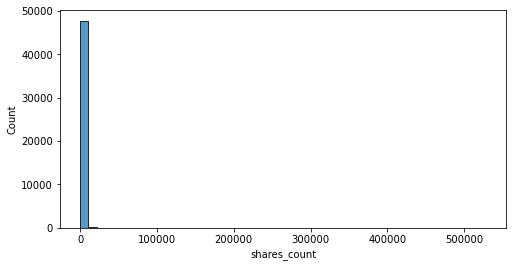

In [59]:
# histogram of shares
fig, ax = plt.subplots(figsize=(8, 4))
sns.histplot(x=df['shares_count'], ax=ax, bins=50);

Median is 147 and mean is 507, so definitely not normally distributed. Seems there are some high outliers and the histogram confirms it.

What's up with that max entry?

In [60]:
df.loc[df['shares_count']==528856].values

array([['5281959998_10150868636734999',
        'What makes Simone Biles the world’s best gymnast',
        "'At this point in time, nobody can beat Simone Biles,' Nastia Liukin, 2008 Olympic gold medalist said. http://nyti.ms/2az4AAu",
        nan, 'None', 'video', 'added_video', 30921, 528856,
        'https://www.facebook.com/nytimes/videos/10150868636734999/',
        '2016-08-09 19:24:00', 'None', 'None',
        'Mary Lou Retton has described her as the top gymnast in history.',
        'Mary Lou Retton has described her as the top gymnast in history.',
        'The Fine Line: What Makes Simone Biles the World’s Best Gymnast',
        'Sports', 'Sports', 'Interactive Feature', 0.0, nan,
        list(['olympic games (2016)', 'gymnastics']),
        list(['biles, simone']), nan, nan, 1.0,
        "What makes Simone Biles the world’s best gymnast. 'At this point in time, nobody can beat Simone Biles,' Nastia Liukin, 2008 Olympic gold medalist said. http://nyti.ms/2az4AAu",
        5

Well I'd definitely call this one an outlier, and say that with over 525k shares, almost 500k likes, and 31k comments, it pretty much went viral.

This is a video post as opposed to a link to an article. I had initially focused on the shared stories, but I see that although the link here is to a video uploaded to facebook, the message includes a link to an interactive features on the Times' site. I need to try to pull out these links so I can match them to the articles and get keywords, etc.

I would like to mark the outliers so I can exclude from visualization but potentially still include in modeling. I'm considering creating a feature to mark "high" engagement versus not so I can do a classification problem instead of regression.

In [61]:
# mark outliers for shares count
df = eda.mark_outliers(df, 'shares_count', 'shares_outliers')

Number of lower outliers to mark: 0
Number of upper outliers to mark: 5319


I want to visualize the distribution without outliers so I can actually see it, but mark percentiles based on the entire distribution since I don't intend to remove them.

In [62]:
def hist_with_vlines(df, x_col, x_label, title, lines_dict, cmap='Set1'):
    """Plots a histogram of a specified column in a dataframe,  and also plots
    vertical lines at intervals specified in `lines_dict.
    
    **Arguments
    ---------------
    `df`: Dataframe including `x_col`
    
    `x_col`: string. Name of column in `df` to plot on x-axis.
    
    `x_label`: string. Text label to plot on x-axis.
    
    `title`: string. Chart title to apply.
    
    `cmap`: string, or list, optional. Default is cmap "Set1". 
    Change to one of the qualitative color maps from here: 
    https://matplotlib.org/stable/gallery/color/colormap_reference.html
    Or provide a list of colors that will be converted to a custom
    colormap.
    
    `lines_dict`: dictionary. Key should be label, and value should be the
    x value to plot a line at.
    """
    if type(cmap)==str:
        colors = plt.get_cmap(cmap)
    elif type(cmap)==list:
        colors = mat.colors.LinearSegmentedColormap.from_list('_', cmap, 
                                                        N=len(cmap))
    
    with sns.plotting_context('talk'):

        fig, ax = plt.subplots(figsize=(8, 4))
        sns.histplot(x=df[x_col], ax=ax, color='silver')

        for i, (k, v) in enumerate(lines_dict.items()):
            ax.vlines(v, 0, 1, transform=ax.get_xaxis_transform(),
                 label=k, color=colors(i), linewidth=4)

        ax.set_title(title)
        ax.set_xlabel(x_label)
        plt.legend();

In [63]:
# get percentile cutoffs for entire distribution
shares_pcts = {}

for pct in [10, 25, 50, 75, 90]:
    shares_pcts[f'{pct}th Percentile'] = df['shares_count'].quantile(q=pct/100)

shares_pcts

{'10th Percentile': 26.0,
 '25th Percentile': 57.0,
 '50th Percentile': 147.0,
 '75th Percentile': 404.0,
 '90th Percentile': 1011.5}

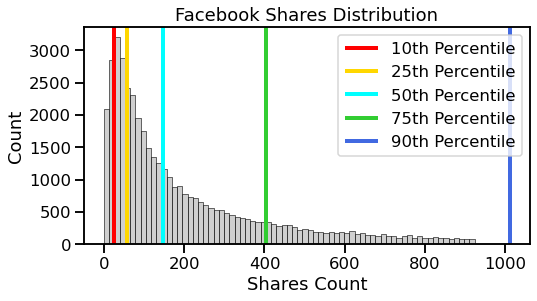

In [64]:
# let's look at that histogram without outliers
custom_cmap=['red', 'gold', 'cyan', 'limegreen', 'royalblue']

hist_with_vlines(df=df.loc[df['shares_outliers'].isna()], x_col='shares_count',
                x_label='Shares Count', 
                title='Facebook Shares Distribution', 
                lines_dict=shares_pcts, cmap=custom_cmap)

In [65]:
df.loc[df['shares_outliers'].isna(), 'shares_count'].describe()

count    42547.000000
mean       200.218558
std        206.150060
min          0.000000
25%         50.500000
50%        120.000000
75%        280.500000
max        924.000000
Name: shares_count, dtype: float64

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47866 entries, 0 to 48087
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                47866 non-null  object 
 1   name              46573 non-null  object 
 2   message           46131 non-null  object 
 3   description       43512 non-null  object 
 4   caption           47866 non-null  object 
 5   post_type         47866 non-null  object 
 6   status_type       47866 non-null  object 
 7   comments_count    47866 non-null  int64  
 8   shares_count      47866 non-null  int64  
 9   link              47200 non-null  object 
 10  posted_at         47866 non-null  object 
 11  print_section     47866 non-null  object 
 12  print_page        47866 non-null  object 
 13  snippet           43227 non-null  object 
 14  lead_paragraph    43227 non-null  object 
 15  main_headline     43227 non-null  object 
 16  news_desk         47866 non-null  object

### Relationship to Categorical Variables

---------------------------------------------------------------------------
Exploring column: status_type
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: status_type
---------------------------------------------------------------------------
shared_story            43359
added_photos             2248
added_video              1574
mobile_status_update      654
created_note               11
None                       11
created_event               9
Name: status_type, dtype: int64


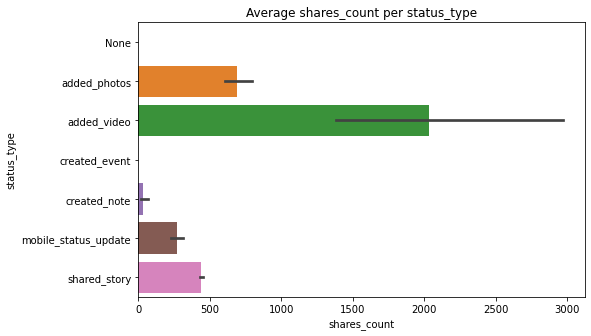

---------------------------------------------------------------------------
Exploring column: caption
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: caption
---------------------------------------------------------------------------
nytimes.com                                                               31246
nyti.ms                                                                    7700
None                                                                       4974
well.blogs.nytimes.com                                                      815
cooking.nytimes.com                                                         807
                                                                          ...  
Launched NYT Now for iPhone.                                                  1
nytco.com                                                          

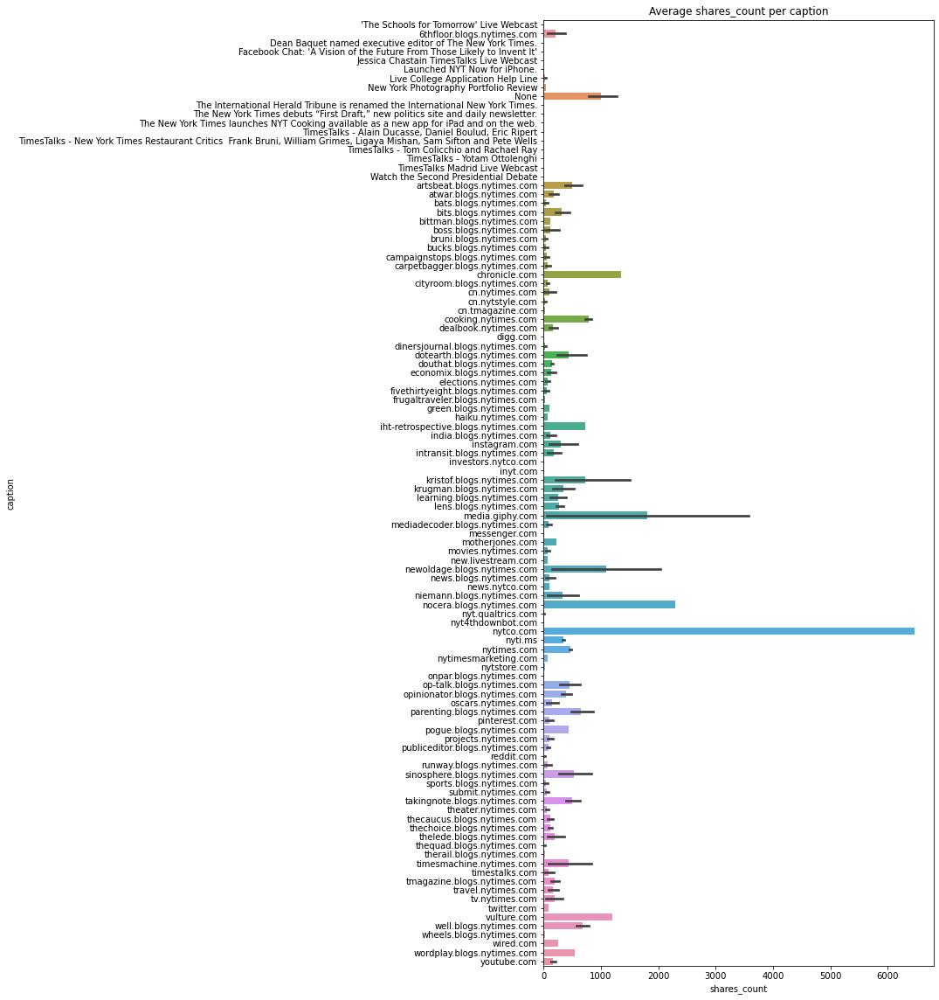

---------------------------------------------------------------------------
Exploring column: post_type
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: post_type
---------------------------------------------------------------------------
link      42785
photo      2340
video      2062
status      666
event        12
note          1
Name: post_type, dtype: int64


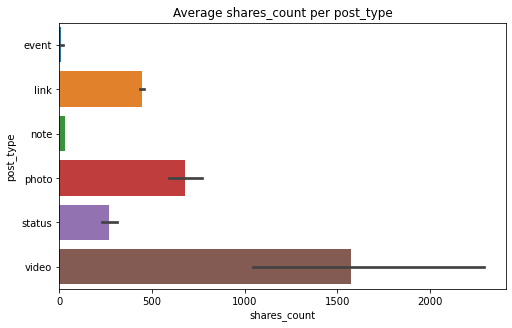

---------------------------------------------------------------------------
Exploring column: print_section
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: print_section
---------------------------------------------------------------------------
A              18527
None           11524
Not matched     4639
B               3359
D               2380
               ...  
6                  2
1                  1
CT                 1
LI                 1
G                  1
Name: print_section, Length: 29, dtype: int64


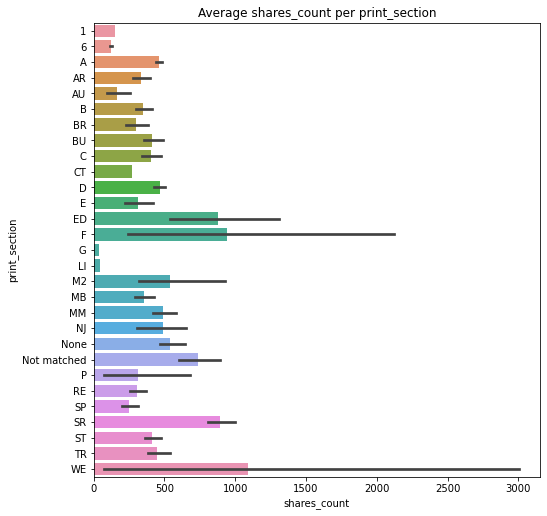

---------------------------------------------------------------------------
Exploring column: print_page
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: print_page
---------------------------------------------------------------------------
1              11676
None           11524
Not matched     4639
4               1755
6               1429
               ...  
237                1
85                 1
87                 1
114                1
104                1
Name: print_page, Length: 152, dtype: int64


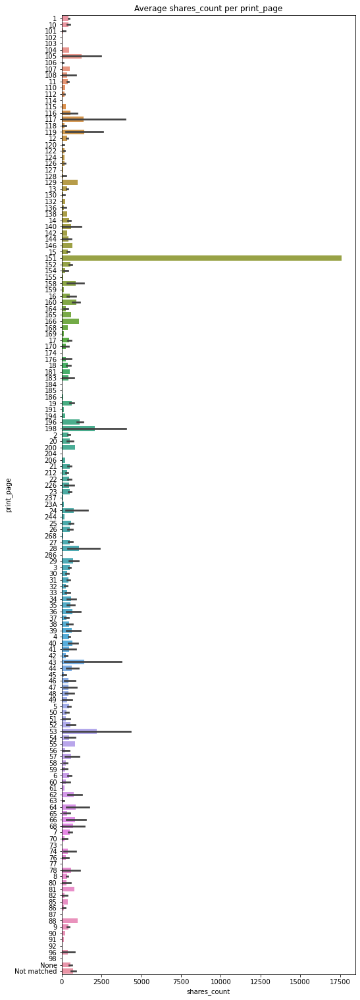

---------------------------------------------------------------------------
Exploring column: news_desk
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: news_desk
---------------------------------------------------------------------------
National                  7718
Foreign                   6844
Not matched               4639
Business                  3476
OpEd                      2957
                          ... 
Museums                      1
The Arts/Cultural Desk       1
Home & Garden                1
Jobs                         1
StateByState                 1
Name: news_desk, Length: 81, dtype: int64


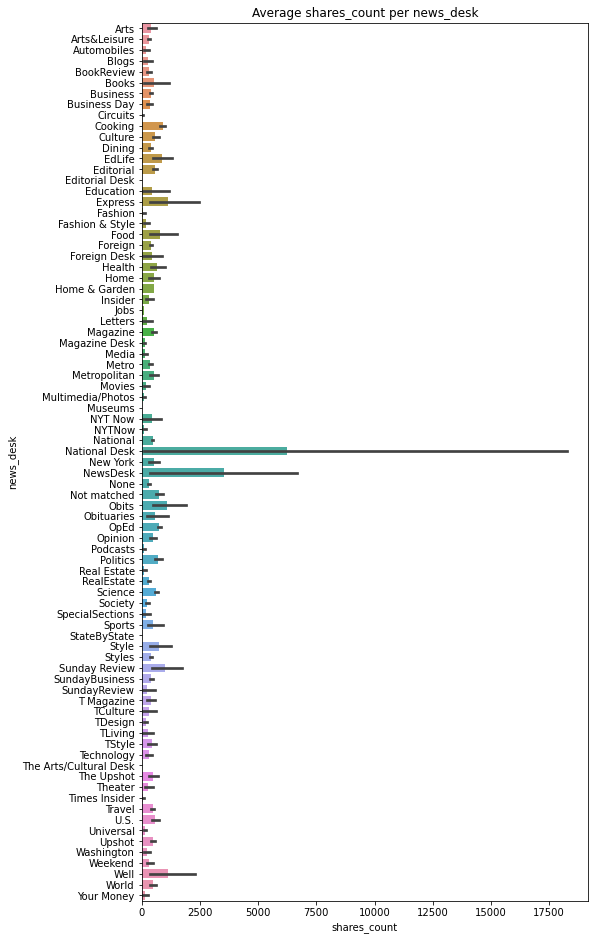

---------------------------------------------------------------------------
Exploring column: section_name
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: section_name
---------------------------------------------------------------------------
U.S.             8314
World            6811
Not matched      4639
Opinion          4616
Sports           2662
                 ... 
Giving              3
Watching            2
Public Editor       2
Universal           1
Archives            1
Name: section_name, Length: 45, dtype: int64


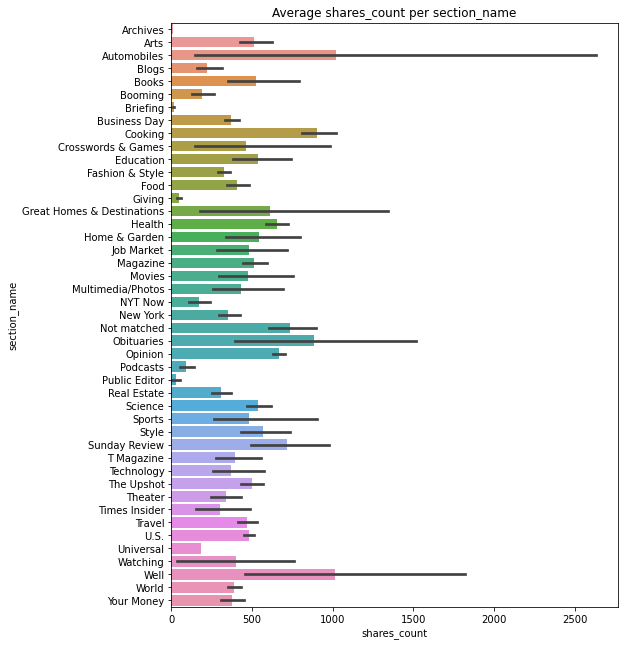

---------------------------------------------------------------------------
Exploring column: type_of_material
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: type_of_material
---------------------------------------------------------------------------
News                   33274
Not matched             4639
Op-Ed                   3272
Interactive Feature     2346
Review                   834
                       ...  
Chronology                 1
Schedule                   1
Military Analysis          1
Quote                      1
Correction                 1
Name: type_of_material, Length: 33, dtype: int64


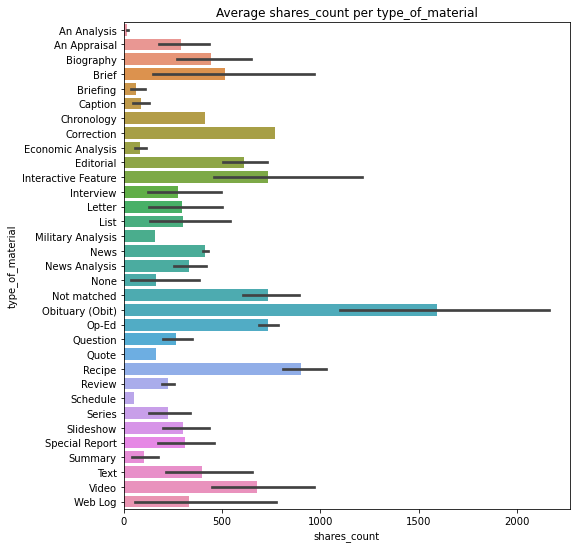

---------------------------------------------------------------------------
Exploring column: word_count
---------------------------------------------------------------------------
---------------------------------------------------------------------------
df.describe() for continuous data: word_count
---------------------------------------------------------------------------
count    47866.000000
mean       974.637216
std        938.075061
min          0.000000
25%        452.000000
50%        936.000000
75%       1267.000000
max      18273.000000
Name: word_count, dtype: float64


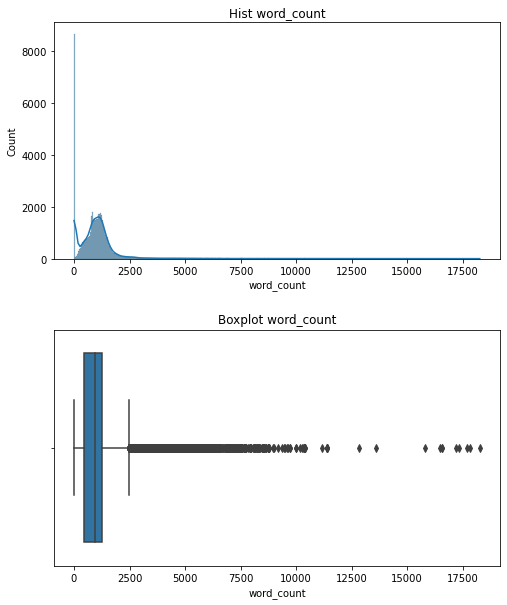

---------------------------------------------------------------------------
Exploring column: is_matched
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_matched
---------------------------------------------------------------------------
1.0    43227
0.0     4639
Name: is_matched, dtype: int64


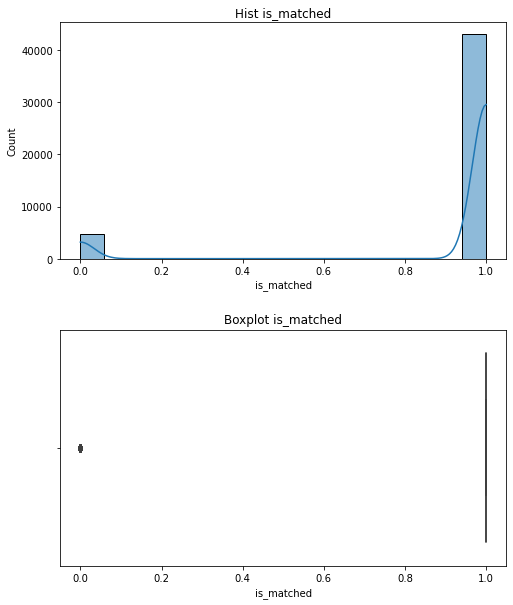

,col_name,corr_target,assumed_var_type,omnibus_k2,omnibus_pstat,is_normal,uniques,mean,median
0,word_count,-0.016502,continuous,None,None,None,NaN,974.637216,936.0
1,is_matched,-0.023358,categorical,None,None,None,2.0,NaN,NaN


In [67]:
to_explore = ['status_type', 'caption', 'post_type', 'print_section', 
              'print_page', 'news_desk', 'section_name', 'type_of_material',
             'word_count', 'is_matched']

eda.explore_data_cont(to_explore, df, 'shares_count', hist=True, box=True, 
                      plot_v_target=False,
                 summarize=True, norm_check=False)

In [68]:
# Let's take a look at nytco.com
df.loc[df['caption']=='nytco.com'].values

array([['5281959998_10150952720054999',
        'The New York Times to Offer Open Access To NYTimes.com November 7-9',
        "We're giving everyone unlimited access to The New York Times for 72 hours next week.",
        'Readers will have unlimited access to NYTimes.com for 72 hours from 12:01 a.m. ET on Monday, November 7 until 11:59 p.m. ET on Wednesday, November 9.',
        'nytco.com', 'link', 'shared_story', 548, 6477,
        'http://www.nytco.com/the-new-york-times-to-offer-open-access-to-nytimes-com-november-7-9/?smid=fb-nytimes&smtyp=cur',
        '2016-11-03 18:59:23', 'Not matched', 'Not matched', nan, nan,
        nan, 'Not matched', 'Not matched', 'Not matched', 0.0, nan, nan,
        nan, nan, nan, 0.0,
        "The New York Times to Offer Open Access To NYTimes.com November 7-9. We're giving everyone unlimited access to The New York Times for 72 hours next week. Readers will have unlimited access to NYTimes.com for 72 hours from 12:01 a.m. ET on Monday, November 7 un

In [411]:
# Let's take a look at print_page=151
df.loc[df['print_page']=='151'].values

array([['5281959998_10150931251884999', 'To the First Lady, With Love',
        'Michelle Obama has spent the past 8 years quietly and confidently changing the course of American history.',
        'Four thank-you notes to Michelle Obama.', 'nytimes.com', 'link',
        'shared_story', 1813, 17589,
        'http://www.nytimes.com/2016/10/17/t-magazine/michelle-obama-chimamanda-ngozi-adichie-gloria-steinem-letter.html?smid=fb-nytimes&smtyp=cur',
        Timestamp('2016-10-17 12:25:00'), 'M2', '151',
        'Four thank-you notes to Michelle Obama, who has spent the past eight years quietly and confidently changing the course of American history.',
        'She had rhythm, a flow and swerve, hands slicing air, body weight moving from foot to foot, a beautiful rhythm. In anything else but a black American body, it would have been contrived. The three-quarter sleeves of her teal dress announced its appropriateness, as did her matching brooch. But the cut of the dress scorned any “future f

In [412]:
# Let's take a look at print_section=WE and F
df.loc[df['print_section']=='WE']

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,hour,year,hour_cat,on_weekend,text_hash,cleaned,article_text,fb_pred,mat_pred,on_weekend_plot
10095,5281959998_10150445008109999,An Ear to the Horn of Time,“It’s an echo from a century ago — the only th...,"Peter Dilg, who has one of the largest private...",nytimes.com,link,shared_story,8,41,http://nyti.ms/1kSUpJv,...,19,2014,5_Evening (19-23),0.0,0a449f434f0363b0222c79828757d87f,"An Ear to the Horn of Time. ""It's an echo from...","An Ear to the Horn of Time. Peter Dilg, who ha...",1.0,NaN,Weekday
17051,5281959998_10150515450389999,"Arts | Woodstock: From the Band’s Music, the W...",NaN,"The guitarist Jim Weider, a longtime collabora...",nyti.ms,link,shared_story,2,96,http://nyti.ms/14b8NoR,...,22,2015,5_Evening (19-23),1.0,c25865e841cd5d8c4613e9fff3730a1f,"Arts | Woodstock: From the Band's Music, the W...","From the Band’s Music, the Weight Builds a Fut...",NaN,NaN,Weekend
17076,5281959998_10150515741844999,"From the Band’s Music, the Weight Builds a Future",The Weight is an ensemble dedicated to playing...,"The guitarist Jim Weider, a longtime collabora...",nytimes.com,link,shared_story,12,88,http://nyti.ms/1Kf3iGI,...,14,2015,3_Midday (11-15),0.0,60befeb25de17db3b1527db795e74e90,"From the Band's Music, the Weight Builds a Fut...","From the Band’s Music, the Weight Builds a Fut...",NaN,0.0,Weekday
24777,5281959998_10150613019824999,A Legoland Builder Turns Her Childhood Hobby I...,"She's the Picasso of LEGO, and she's got the p...",Her projects are more than children’s playthin...,nytimes.com,link,shared_story,356,4839,http://nyti.ms/1Lu2kaI,...,3,2015,1_Early morning (3-7),1.0,428afa3755190137d4a87a1051fa1109,A Legoland Builder Turns Her Childhood Hobby I...,A Legoland Builder Turns Her Childhood Hobby I...,1.0,NaN,Weekend
30128,5281959998_10150684643079999,The Spark Behind the Great Jack-o’-Lantern Blaze,Step inside a pumpkin planetarium.,Michael Natiello is an artist who turns pumpki...,nytimes.com,link,shared_story,73,400,http://nyti.ms/1PK1F8b,...,18,2015,4_Afternoon (15-19),1.0,597528f85186c174161a3c526630bc90,The Spark Behind the Great Jack-o'-Lantern Bla...,The Spark Behind the Great Jack-o’-Lantern Bla...,0.0,0.0,Weekend


In [413]:
df.loc[df['print_section']=='F']

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,hour,year,hour_cat,on_weekend,text_hash,cleaned,article_text,fb_pred,mat_pred,on_weekend_plot
628,5281959998_465841950121115,Komen Foundation Struggles to Regain Wide Support,"Susan G. Komen for the Cure, the nation’s larg...",Susan G. Komen for the Cure is still working t...,nytimes.com,link,shared_story,113,35,http://www.nytimes.com/2012/11/09/giving/komen...,...,15,2012,4_Afternoon (15-19),0.0,be2b55f5630c07a5e5bb250d7b63886f,Komen Foundation Struggles to Regain Wide Supp...,Komen Foundation Struggles to Regain Wide Supp...,NaN,0.0,Weekday
630,5281959998_444090335650702,"Joy That Lasts, on the Poorest of Playgrounds",Watch a short video (http://nyti.ms/VYbiA0) to...,"For children in impoverished countries, where ...",nytimes.com,link,shared_story,7,62,http://www.nytimes.com/2012/11/09/giving/the-o...,...,16,2012,4_Afternoon (15-19),0.0,aa74141f12396873c110a6e0d8eb6822,"Joy That Lasts, on the Poorest of Playgrounds....","Joy That Lasts, on the Poorest of Playgrounds....",0.0,NaN,Weekday
1027,5281959998_422066364533996,Snow Fall: The Avalanche at Tunnel Creek,"On Wednesday, here in our Facebook feed, we pu...",The first passage of New York Times reporter J...,projects.nytimes.com,link,shared_story,14,109,http://projects.nytimes.com/2012/snow-fall-pre...,...,0,2012,6_Late night (23-3),0.0,46e4fe45859ebd8f32909c355ff3dcf4,Snow Fall: The Avalanche at Tunnel Creek. On W...,Snow Fall: The Avalanche at Tunnel Creek. A gr...,NaN,NaN,Weekday
1037,5281959998_497482543629133,Snow Fall: The Avalanche at Tunnel Creek,Special ReportA group of world-class skiers an...,Fresh powder beckoned 16 expert skiers and sno...,nytimes.com,link,shared_story,64,322,http://www.nytimes.com/projects/2012/snow-fall/,...,16,2012,4_Afternoon (15-19),0.0,3ad4a216ae247d5faee01f38f740f2bc,Snow Fall: The Avalanche at Tunnel Creek. Spec...,Snow Fall: The Avalanche at Tunnel Creek. A gr...,NaN,NaN,Weekday
2064,5281959998_569888266368407,"Following Your Bliss, Right Off the Cliff",They quit their jobs to follow their passions....,Pursuing a passion into a career change may br...,nytimes.com,link,shared_story,137,531,http://www.nytimes.com/2013/03/26/your-money/t...,...,17,2013,4_Afternoon (15-19),0.0,730e95a289e29be610a87456dd1e5fd2,"Following Your Bliss, Right Off the Cliff. The...","Following Your Bliss, Right Off the Cliff. Pur...",NaN,NaN,Weekday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46324,5281959998_10150918431994999,The Home Designers Who Actually Move In,"They camp in the houses they renovate, moving ...","Beloved by blogs and clients, the couple behin...",nytimes.com,link,shared_story,11,17,http://www.nytimes.com/2016/10/06/style/home-d...,...,13,2016,3_Midday (11-15),0.0,a81a16b2000b1581e4567f109248f02f,The Home Designers Who Actually Move In. They ...,The Home Designers Who Actually Move In. Belov...,0.0,NaN,Weekday
47496,5281959998_10150946299799999,"Long Before Twitter, Martin Luther Was a Media...",He didn't just nail his 95 theses to a church ...,The 500th anniversary of Luther’s 95 theses is...,nytimes.com,link,shared_story,96,702,http://nyti.ms/2f03kYV,...,18,2016,4_Afternoon (15-19),1.0,aac5a552442e0ac9b2353f1fe2b377a8,"Long Before Twitter, Martin Luther Was a Media...","Long Before Twitter, Martin Luther Was a Media...",NaN,NaN,Weekend
47505,5281959998_10150945329194999,Cate Blanchett Morphs a Dozen Times in ‘Manife...,“She transforms herself from a tramp to a moth...,"The actress inhabits 12 characters, all reciti...",nytimes.com,link,shared_story,73,149,http://www.nytimes.com/2016/10/30/arts/design/...,...,6,2016,1_Early morning (3-7),1.0,b38dab36f5d25af8f7f159f909a75b41,Cate Blanchett Morphs a Dozen Times in 'Manife...,Cate Blanchett Morphs a Dozen Times in ‘Manife...,NaN,NaN,Weekend
47803,5281959998_10150956895449999,Mary Keitany of Kenya Wins 3rd Straight New Yo...,Mary Keitany was so far ahead of 

Links to articles are generally represented by:
- `status_type` = `shared_story`
- majority are`caption` = `nytimes.com`
- `post_type` = `link`

These do not generally receive the highest number of shares.
- Although there are far fewer of them, `added_video` and `added_photo` posts receive more shares than `shared_story`
- `nytco.com` has a ton of shares, although it represents only a single post where they're offering free access during the election. Other captions that look like outsides sources or non-news sources such as blogs also have more shares than the `nytimes.com`.
- `photo` and `video` have more shares than `link`s.
- I don't see much pattern in the `print_page` or `print_section` categories. Some stand out, but they seem to be singletons. I'm also not totally sure how to interpret these, since I don't know what the values stand for.
- Nothing stands out much in `news_desk`
- Cooking seems to have steadily more shares than other `section_names`. Others look to have high scores but very broad confidence intervals.
- Obituaries and Recipes have higher numbers of shares in `type_of_material`.


## Explore Comments

### Review Distribution and Identify Outliers

In [394]:
df['comments_count'].describe()

count     47866.000000
mean        179.165692
std         998.999651
min           0.000000
25%          33.000000
50%          73.000000
75%         173.000000
max      169805.000000
Name: comments_count, dtype: float64

Median is 73 and mean is 179, so definitely not normally distributed. Seems there are some high outliers and the histogram confirms it.

Let's look at the max entry here.

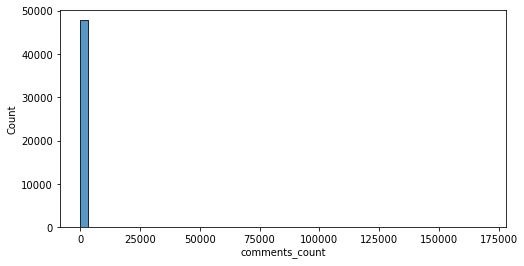

In [395]:
# histogram of comments
fig, ax = plt.subplots(figsize=(8, 4))
sns.histplot(x=df['comments_count'], ax=ax, bins=50);

In [396]:
df.loc[df['comments_count']==169805].values

array([['5281959998_10150912083309999', '2016 Presidential Debate',
        'Watch Donald J. Trump and Hillary Clinton’s first debate live here. Follow along in the comments for NYT reporters’ live analysis of the debate.',
        nan, 'None', 'video', 'added_video', 169805, 40387,
        'https://www.facebook.com/nytimes/videos/10150912083309999/',
        Timestamp('2016-09-27 01:04:52'), 'Not matched', 'Not matched',
        nan, nan, nan, 'Not matched', 'Not matched', 'Not matched', 0.0,
        nan, list(['No Subject']), nan, nan, nan, 0.0,
        '2016 Presidential Debate. Watch Donald J. Trump and Hillary Clinton’s first debate live here. Follow along in the comments for NYT reporters’ live analysis of the debate',
        123533, 1.0, 1.0, 1.0, 1.0, 0.999644841850165,
        0.9996239501942924, 1.0, 0.9997562640148191, 1.0, 2.0, nan, nan,
        nan, nan, nan, 0.0, 1.0, 0.0, 0.0, 0.0, 'None', 0, 0, 0, 0.0,
        'Monday', 'September', 21, 2016, '5_Evening (19-23)', 0.0,


Interesting, so the post that got the highest comments is not the one that got the highest number of shares. This post got way more comments than other types of interactions.

Since the message says to `"follow along in the comments"`, I assume that this was livestreamed.

In [397]:
# mark outliers for shares count
df = eda.mark_outliers(df, 'comments_count', 'comments_outliers')

Number of lower outliers to mark: 0
Number of upper outliers to mark: 4781


In [398]:
# get percentile cutoffs for entire distribution
comments_pcts = {}

for pct in [10, 25, 50, 75, 90]:
    comments_pcts[f'{pct}th Percentile'] = df['comments_count'].quantile(q=pct/100)

comments_pcts

{'10th Percentile': 17.0,
 '25th Percentile': 33.0,
 '50th Percentile': 73.0,
 '75th Percentile': 173.0,
 '90th Percentile': 383.0}

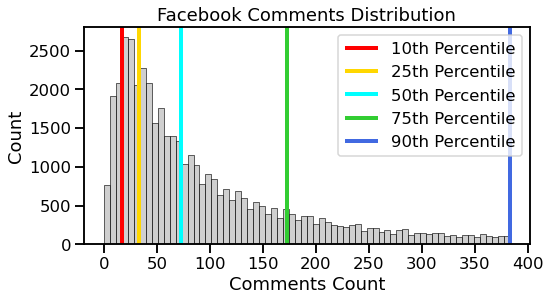

In [399]:
# let's look at that histogram without outliers
hist_with_vlines(df=df.loc[df['comments_outliers'].isna()], 
                x_col='comments_count',
                x_label='Comments Count', 
                title='Facebook Comments Distribution', 
                lines_dict=comments_pcts, cmap=custom_cmap)

In [400]:
df.loc[df['comments_outliers'].isna(), 'comments_count'].describe()

count    43085.000000
mean        93.178902
std         85.179312
min          0.000000
25%         30.000000
50%         63.000000
75%        130.000000
max        383.000000
Name: comments_count, dtype: float64

### Relationship to Categorical Variables

---------------------------------------------------------------------------
Exploring column: section_name
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: section_name
---------------------------------------------------------------------------
U.S.             8314
World            6811
Not matched      4639
Opinion          4616
Sports           2662
                 ... 
Giving              3
Watching            2
Public Editor       2
Universal           1
Archives            1
Name: section_name, Length: 45, dtype: int64


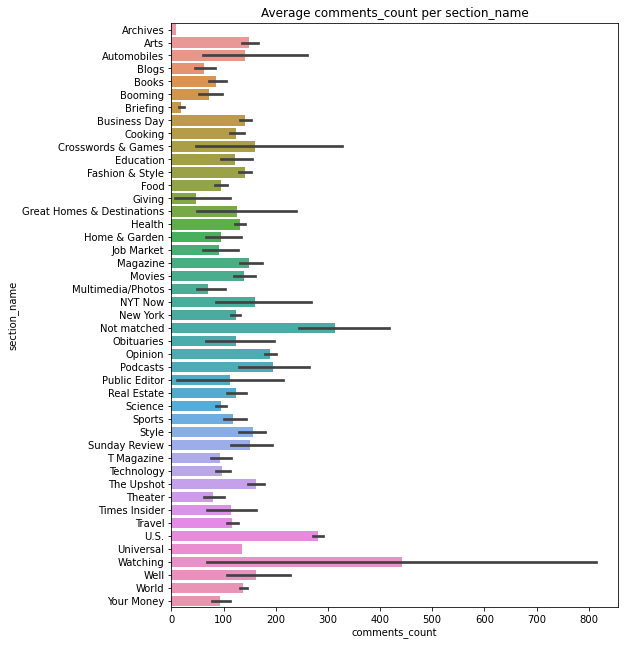

---------------------------------------------------------------------------
Exploring column: is_interactive
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_interactive
---------------------------------------------------------------------------
0.0    45520
1.0     2346
Name: is_interactive, dtype: int64


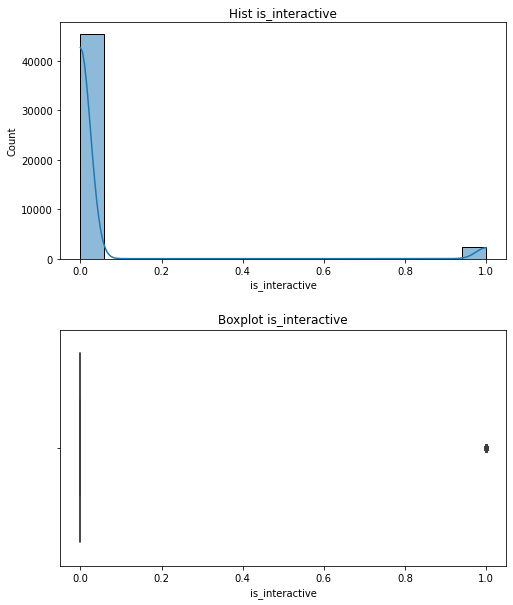

---------------------------------------------------------------------------
Exploring column: is_video
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_video
---------------------------------------------------------------------------
0.0    47264
1.0      602
Name: is_video, dtype: int64


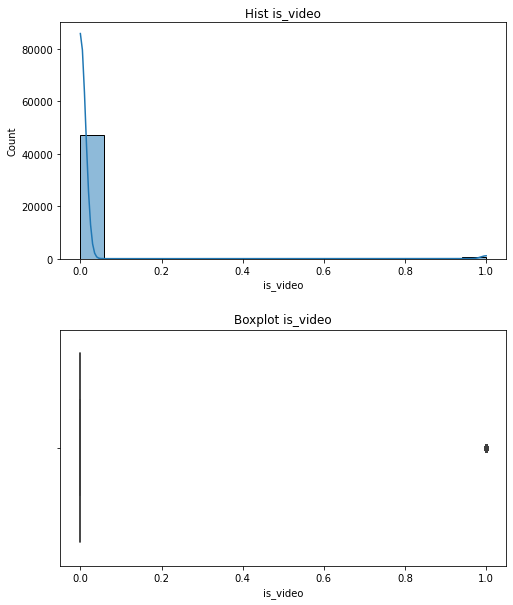

---------------------------------------------------------------------------
Exploring column: is_slideshow
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_slideshow
---------------------------------------------------------------------------
0.0    47747
1.0      119
Name: is_slideshow, dtype: int64


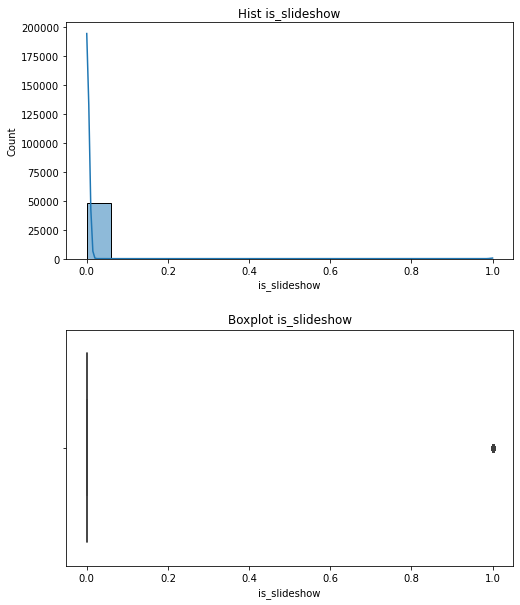

---------------------------------------------------------------------------
Exploring column: word_count_cat
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: word_count_cat
---------------------------------------------------------------------------
Average    19685
High        9864
Low         9806
None        8511
Name: word_count_cat, dtype: int64


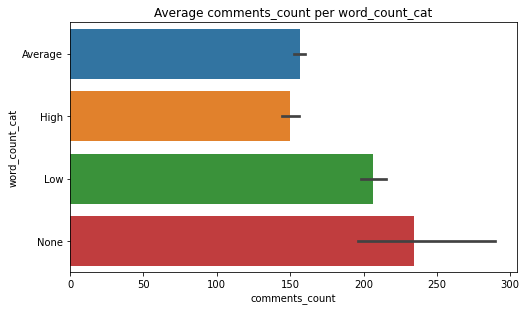

---------------------------------------------------------------------------
Exploring column: has_person
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_person
---------------------------------------------------------------------------
1    30693
0    17173
Name: has_person, dtype: int64


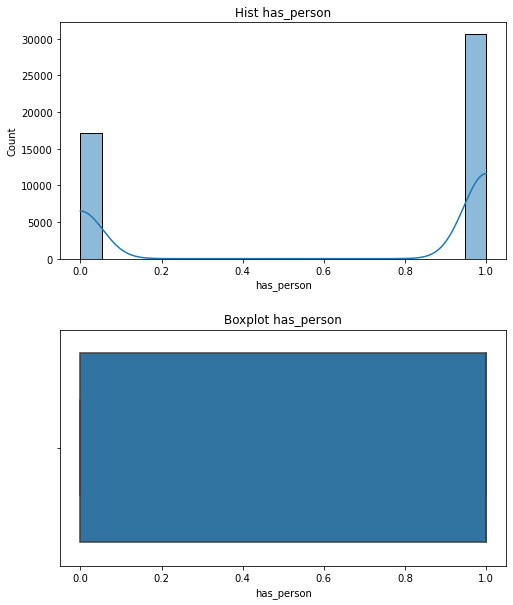

---------------------------------------------------------------------------
Exploring column: has_org
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_org
---------------------------------------------------------------------------
0    26029
1    21837
Name: has_org, dtype: int64


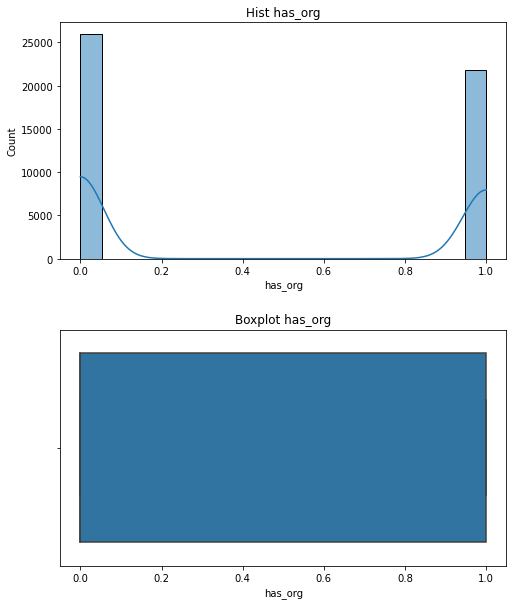

---------------------------------------------------------------------------
Exploring column: has_geo
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_geo
---------------------------------------------------------------------------
0    27493
1    20373
Name: has_geo, dtype: int64


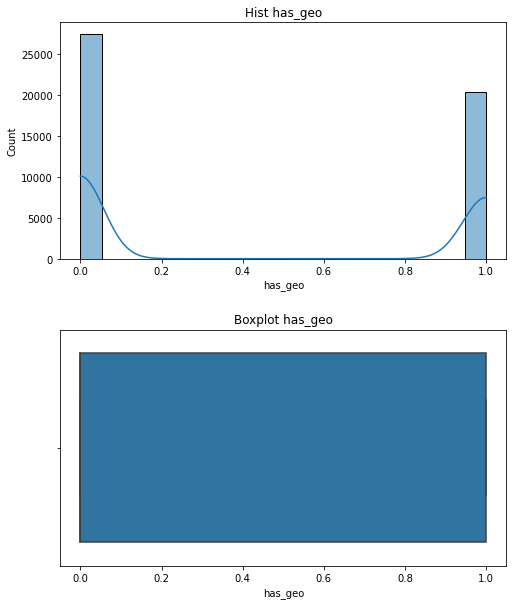

,col_name,corr_target,assumed_var_type,omnibus_k2,omnibus_pstat,is_normal,uniques,mean,median
0,is_interactive,-0.008124,categorical,None,None,None,2,NaN,NaN
1,is_video,-0.004089,categorical,None,None,None,2,NaN,NaN
2,is_slideshow,-0.005263,categorical,None,None,None,2,NaN,NaN
3,has_person,0.002813,categorical,None,None,None,2,NaN,NaN
4,has_org,-0.011192,categorical,None,None,None,2,NaN,NaN
5,has_geo,-0.018076,categorical,None,None,None,2,NaN,NaN


In [401]:
eda.explore_data_cont(to_explore, df, 'comments_count', hist=True, box=True, 
                      plot_v_target=False,
                 summarize=True, norm_check=False)

- Video posts seem to get a lot more comments than links to articles, photos, or status updates.
- In `news_desk`, both National Desk and NewsDesk were higher in shares as well as comments. But where Cooking was high in shares it isn't in comments, and instead Politics is high in comments.
- `Not Matched` seems to be high in comments in `type_of_material` and `section_name`, meaning the posts that I wasn't able to match up to articles.

## Explore Likes

### Review Distribution and Identify Outliers

In [402]:
df['likes_loves'].describe()

count     47866.000000
mean       1921.830276
std        6490.057071
min           0.000000
25%         338.000000
50%         703.000000
75%        1635.000000
max      553589.000000
Name: likes_loves, dtype: float64

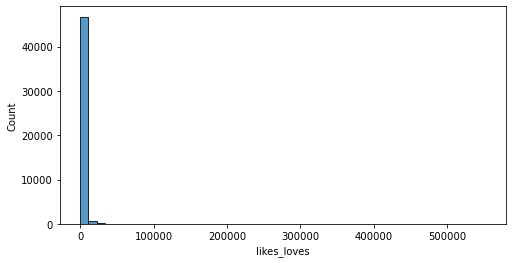

In [403]:
# histogram of likes/loves
fig, ax = plt.subplots(figsize=(8, 4))
sns.histplot(x=df['likes_loves'], ax=ax, bins=50);

Median is 703 and mean is 1921, so definitely not normally distributed.

Let's look at the max entry here.

In [404]:
df.loc[df['likes_loves']==553589].values

array([['5281959998_10150868636734999',
        'What makes Simone Biles the world’s best gymnast',
        "'At this point in time, nobody can beat Simone Biles,' Nastia Liukin, 2008 Olympic gold medalist said. http://nyti.ms/2az4AAu",
        nan, 'None', 'video', 'added_video', 30921, 528856,
        'https://www.facebook.com/nytimes/videos/10150868636734999/',
        Timestamp('2016-08-09 19:24:00'), 'None', 'None',
        'Mary Lou Retton has described her as the top gymnast in history.',
        'Mary Lou Retton has described her as the top gymnast in history.',
        'The Fine Line: What Makes Simone Biles the World’s Best Gymnast',
        'Sports', 'Sports', 'Interactive Feature', 0.0, nan,
        list(['olympic games (2016)', 'gymnastics']),
        list(['biles, simone']), nan, nan, 1.0,
        "What makes Simone Biles the world’s best gymnast. 'At this point in time, nobody can beat Simone Biles,' Nastia Liukin, 2008 Olympic gold medalist said. http://nyti.ms/2az4AAu"

Same as the post with highest shares.

In [405]:
# mark outliers for shares count
df = eda.mark_outliers(df, 'likes_loves', 'likelove_outliers')

Number of lower outliers to mark: 0
Number of upper outliers to mark: 5191


In [406]:
# get percentile cutoffs for entire distribution
likes_pcts = {}

for pct in [10, 25, 50, 75, 90]:
    likes_pcts[f'{pct}th Percentile'] = df['likes_loves'].quantile(q=pct/100)

likes_pcts

{'10th Percentile': 184.0,
 '25th Percentile': 338.0,
 '50th Percentile': 703.0,
 '75th Percentile': 1635.0,
 '90th Percentile': 3833.0}

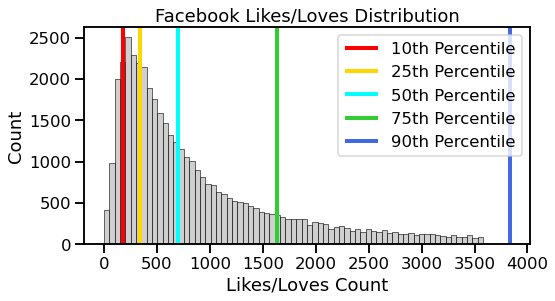

In [407]:
# let's look at that histogram without outliers
hist_with_vlines(df=df.loc[df['likelove_outliers'].isna()], 
                x_col='likes_loves',
                x_label='Likes/Loves Count', 
                title='Facebook Likes/Loves Distribution', 
                lines_dict=likes_pcts, cmap=custom_cmap)

In [408]:
df.loc[df['likelove_outliers'].isna(), 'likes_loves'].describe()

count    42675.000000
mean       875.987862
std        778.874725
min          0.000000
25%        308.000000
50%        602.000000
75%       1195.000000
max       3580.000000
Name: likes_loves, dtype: float64

### Relationship to Categorical Variables

---------------------------------------------------------------------------
Exploring column: section_name
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: section_name
---------------------------------------------------------------------------
U.S.             8314
World            6811
Not matched      4639
Opinion          4616
Sports           2662
                 ... 
Giving              3
Watching            2
Public Editor       2
Universal           1
Archives            1
Name: section_name, Length: 45, dtype: int64


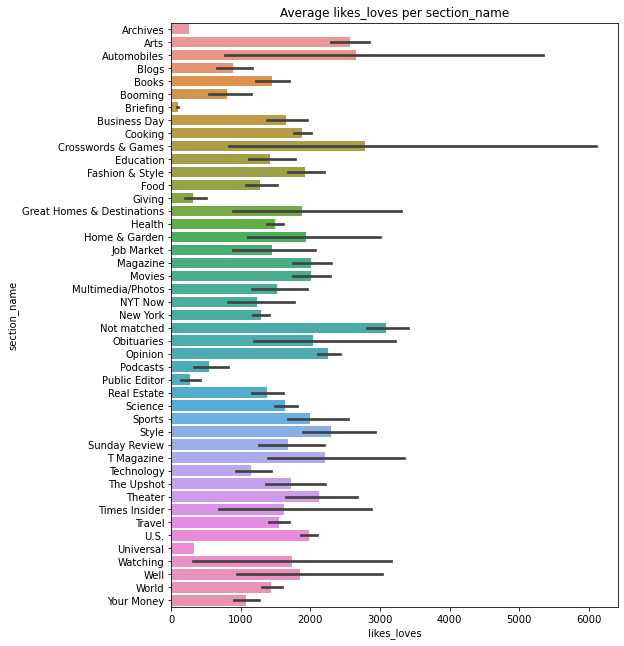

---------------------------------------------------------------------------
Exploring column: is_interactive
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_interactive
---------------------------------------------------------------------------
0.0    45520
1.0     2346
Name: is_interactive, dtype: int64


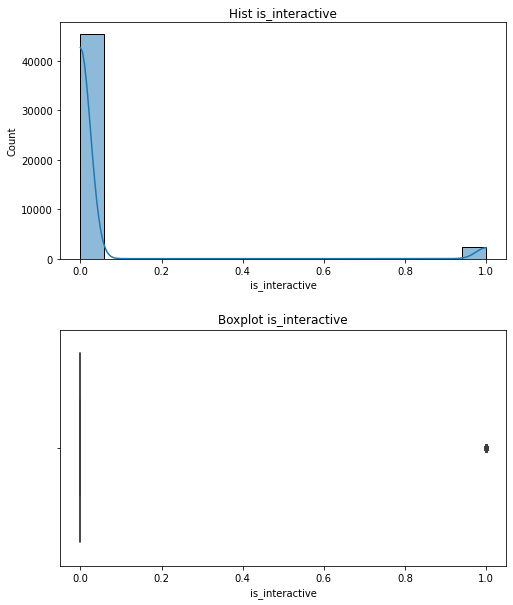

---------------------------------------------------------------------------
Exploring column: is_video
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_video
---------------------------------------------------------------------------
0.0    47264
1.0      602
Name: is_video, dtype: int64


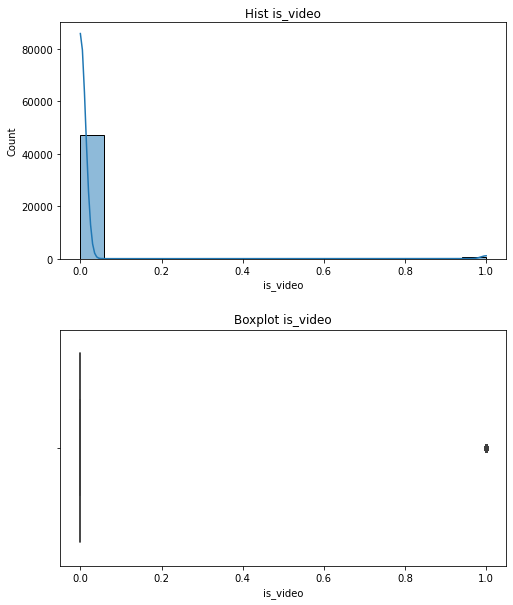

---------------------------------------------------------------------------
Exploring column: is_slideshow
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: is_slideshow
---------------------------------------------------------------------------
0.0    47747
1.0      119
Name: is_slideshow, dtype: int64


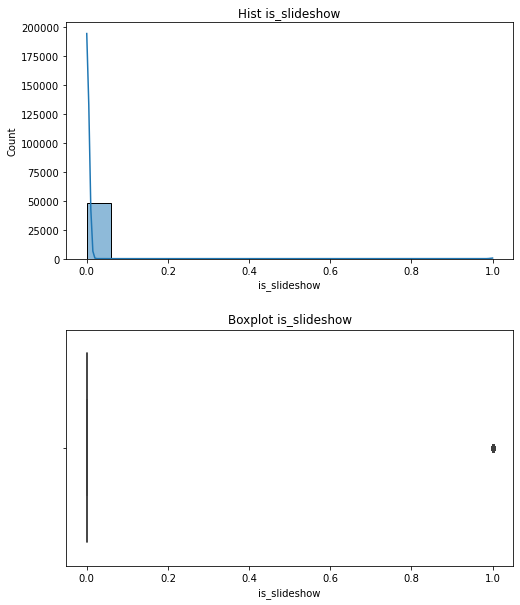

---------------------------------------------------------------------------
Exploring column: word_count_cat
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: word_count_cat
---------------------------------------------------------------------------
Average    19685
High        9864
Low         9806
None        8511
Name: word_count_cat, dtype: int64


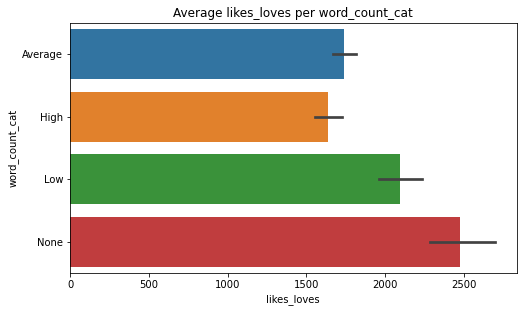

---------------------------------------------------------------------------
Exploring column: has_person
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_person
---------------------------------------------------------------------------
1    30693
0    17173
Name: has_person, dtype: int64


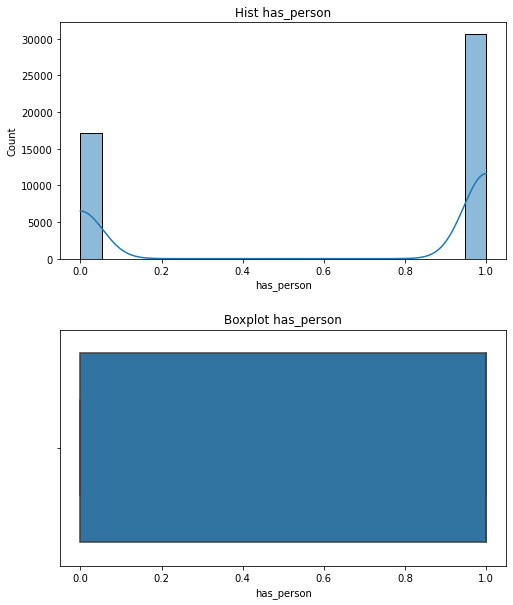

---------------------------------------------------------------------------
Exploring column: has_org
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_org
---------------------------------------------------------------------------
0    26029
1    21837
Name: has_org, dtype: int64


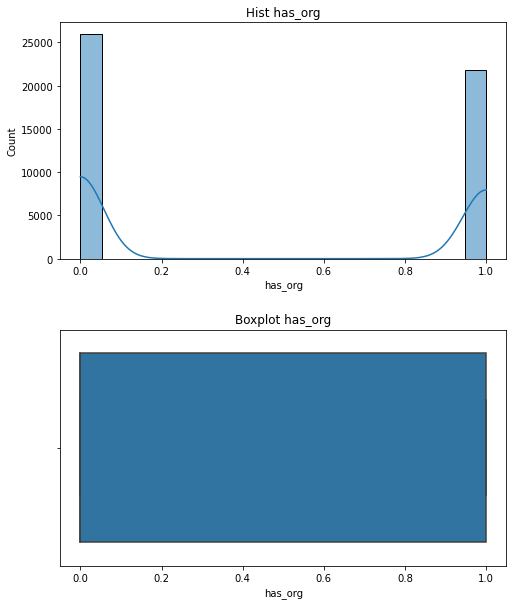

---------------------------------------------------------------------------
Exploring column: has_geo
---------------------------------------------------------------------------
---------------------------------------------------------------------------
Value Counts for categorical data: has_geo
---------------------------------------------------------------------------
0    27493
1    20373
Name: has_geo, dtype: int64


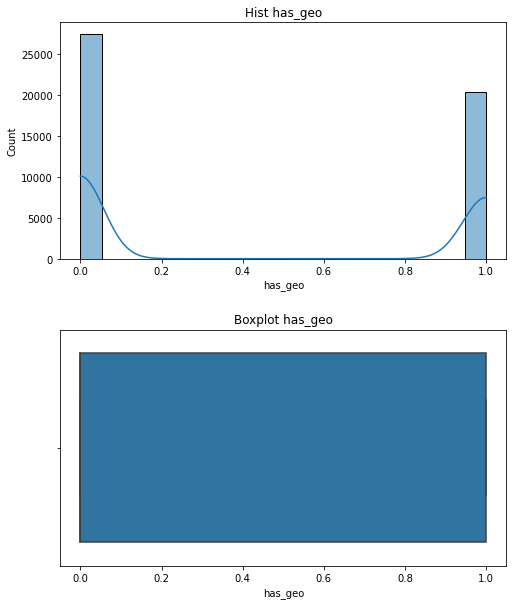

,col_name,corr_target,assumed_var_type,omnibus_k2,omnibus_pstat,is_normal,uniques,mean,median
0,is_interactive,-0.008782,categorical,None,None,None,2,NaN,NaN
1,is_video,-0.000358,categorical,None,None,None,2,NaN,NaN
2,is_slideshow,-0.001984,categorical,None,None,None,2,NaN,NaN
3,has_person,0.001388,categorical,None,None,None,2,NaN,NaN
4,has_org,-0.032564,categorical,None,None,None,2,NaN,NaN
5,has_geo,-0.046969,categorical,None,None,None,2,NaN,NaN


In [409]:
eda.explore_data_cont(to_explore, df, 'likes_loves', hist=True, box=True, 
                      plot_v_target=False,
                 summarize=True, norm_check=False)

Looks like photos get the most likes, videos get the second highest number of likes.

## Correlation between engagement metrics

In [410]:
corr = df[['shares_count', 'comments_count', 'likes_loves']].corr()
corr

,shares_count,comments_count,likes_loves
shares_count,1.000000,0.303432,0.584613
comments_count,0.303432,1.000000,0.294156
likes_loves,0.584613,0.294156,1.000000


OK, so Likes/Loves and Shares are decently correlated, at 0.58. Comments and Shares and Comments and Likes/Loves are each pretty weakly correlated, at about 0.3.

I would say in general that the factors that generate high amounts of comments are probably different than the factors that generate high amounts of likes/loves and shares. I could hypothesize that people like or love AND share something when they support it, but they may comment on something that they have a negative opinion of.

## Engineer target for All Posts

### Try > 75th percentile as binary target

In [89]:
# populate the percentiles for each engagement metric
df['comments_pct'] = df['comments_count'].rank(pct=True)
df['shares_pct'] = df['shares_count'].rank(pct=True)
df['likesloves_pct'] = df['likes_loves'].rank(pct=True)

df['max_pct'] = df[['comments_pct', 'shares_pct', 'likesloves_pct']]\
        .max(axis=1)
df['mean_pct'] = df[['comments_pct', 'shares_pct', 'likesloves_pct']]\
        .mean(axis=1)

In [90]:
# Create column indicating high engagement in any category
df.loc[df['mean_pct'] > 0.75, 'all_binary'] = 1

# populate null values with 0
df.loc[df['all_binary'].isna(), 'all_binary'] = 0

df['all_binary'].value_counts()

0.0    37584
1.0    10282
Name: all_binary, dtype: int64

In [91]:
df['all_binary'].value_counts(1)

0.0    0.785192
1.0    0.214808
Name: all_binary, dtype: float64

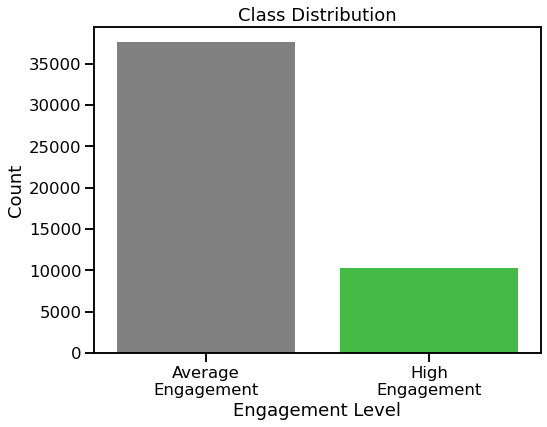

In [92]:
# plot count of target
my_palette = sns.color_palette(palette=['grey', 'limegreen'])

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(figsize=(8, 6))

    sns.countplot(data=df, x='all_binary', ax=ax, palette=my_palette)
    ax.set_title('Class Distribution')
    ax.set_xlabel('Engagement Level')
    ax.set_ylabel('Count')
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(labels=['Average\nEngagement', 'High\nEngagement'])
    ;

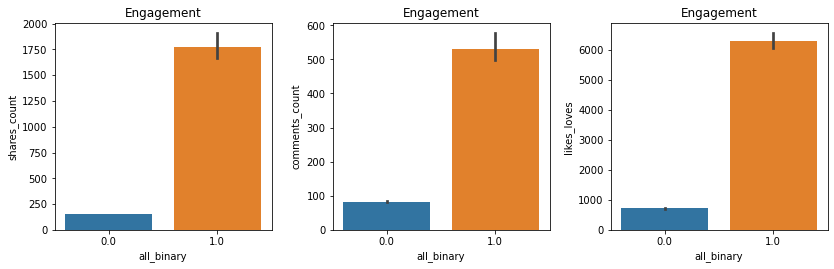

In [93]:
# plot mean per target for each engagement type

fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df, y=target, x='all_binary', ax=axes[i], 
                estimator=np.mean)
    axes[i].set_title(f"Mean {target} per target")
    axes[i].set_title(f"Engagement")

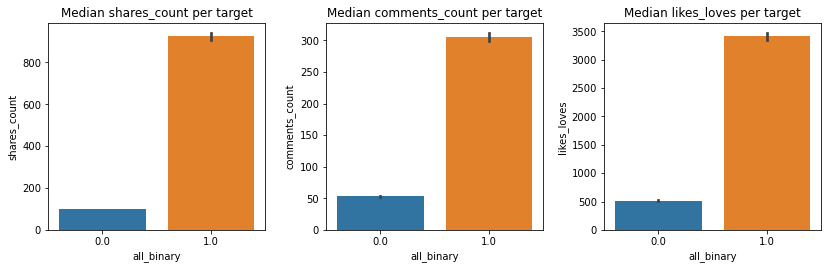

In [94]:
# plot median per target for each engagement type

fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df, y=target, x='all_binary', ax=axes[i], 
                estimator=np.median)
    axes[i].set_title(f"Median {target} per target")

The binary target I have engineered shows that both mean and median of the binary target category are significantly higher than the mean/median of the rest of posts in all three engagement metrics.

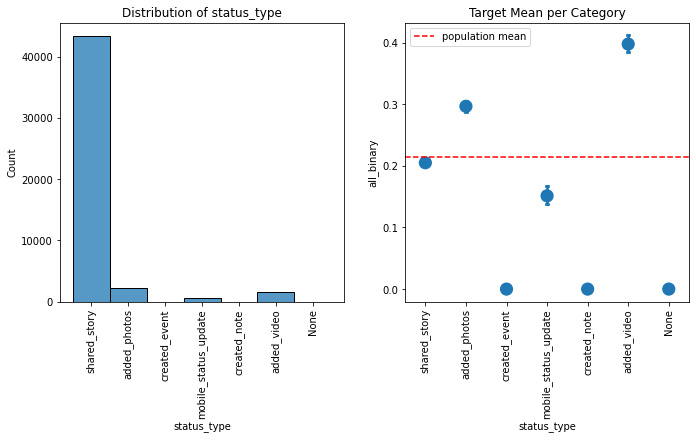

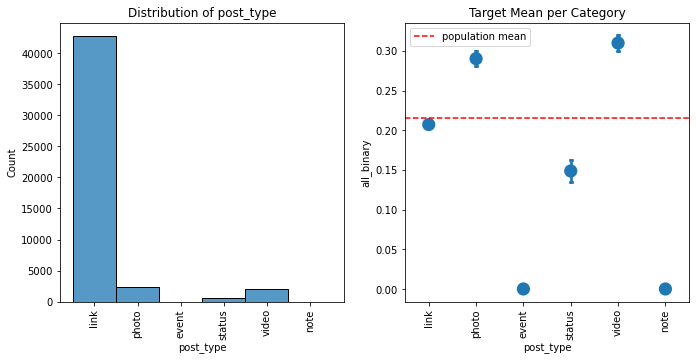

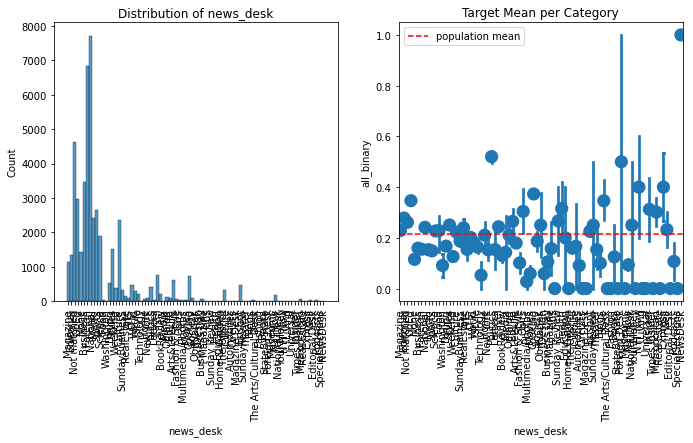

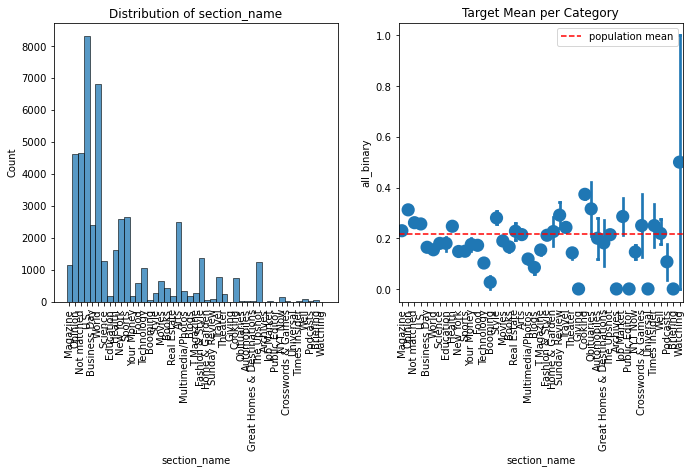

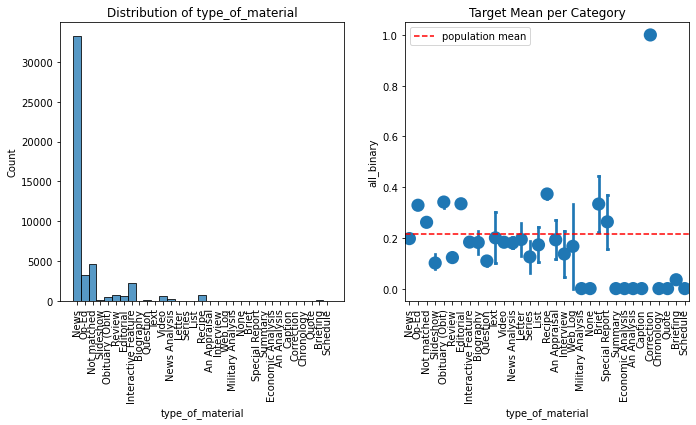

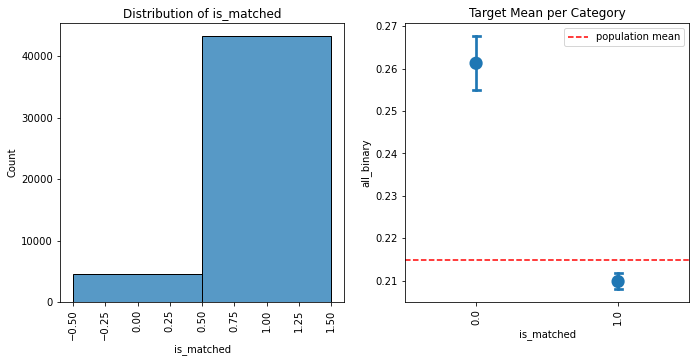

In [95]:
# Explore categorical variables' relationship to the new binary target
to_explore = ['status_type', 'post_type', 'news_desk', 'section_name', 
              'type_of_material', 'is_matched']
eda.explore_data_catbin(to_explore, df, 'all_binary')

### Multi-class target

Initially, I tried a binary target where `high engagement` was anything over the 75th percentile, and `average engagement` was everything else. However, the best models were only about 67% accurate on both classes.

I wondered if a multi-class problem might perform better. 

Based on where the percentiles fall on the distributions, I think it should be:
- Average = less than 25th percentile
- Moderate = 25th to 75th percentile
- High = Over 75th percentile

In [96]:
# Create column indicating outlier engagement in any category

# high, over 75th percentile
df.loc[df['mean_pct'] > 0.75, 'all_multi'] = 2

# low, under 25th percentile
df.loc[df['mean_pct'] < 0.25, 'all_multi'] = 0

# The rest, 25th to 50th percentile, are moderate
df.loc[df['all_multi'].isna(), 'all_multi'] = 1

df['all_multi'].value_counts(1)

1.0    0.571805
2.0    0.214808
0.0    0.213387
Name: all_multi, dtype: float64

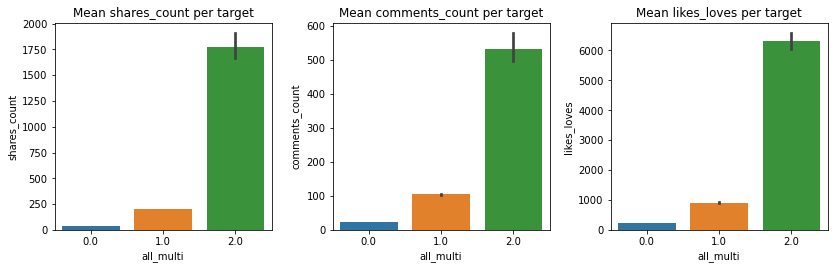

In [97]:
fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df, y=target, x='all_multi', ax=axes[i], 
                estimator=np.mean)
    axes[i].set_title(f"Mean {target} per target")

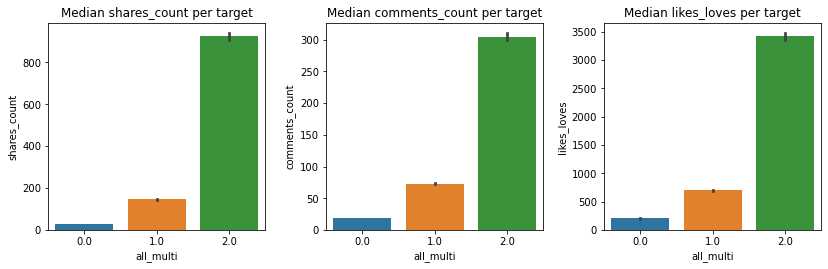

In [98]:
fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df, y=target, x='all_multi', ax=axes[i], 
                estimator=np.median)
    axes[i].set_title(f"Median {target} per target")

## Engineer target only for matched articles

### Try > 75th percentile as binary target

In [99]:
df.loc[df['is_matched']==0, 'mean_pct'].describe()

count    4639.000000
mean        0.509587
std         0.283270
min         0.002197
25%         0.262620
50%         0.511184
75%         0.760822
max         0.999756
Name: mean_pct, dtype: float64

In [100]:
df.loc[df['is_matched']==1, 'mean_pct'].describe()

count    43227.000000
mean         0.498983
std          0.260594
min          0.002490
25%          0.284825
50%          0.496574
75%          0.714274
max          0.999979
Name: mean_pct, dtype: float64

In [101]:
# populate the percentiles for each engagement metric
df.loc[df['is_matched']==1, 'comments_pct_m'] = \
    df.loc[df['is_matched']==1, 'comments_count'].rank(pct=True)

df.loc[df['is_matched']==1, 'shares_pct_m'] = \
    df.loc[df['is_matched']==1, 'shares_count'].rank(pct=True)

df.loc[df['is_matched']==1, 'likesloves_pct_m'] = \
    df.loc[df['is_matched']==1, 'likes_loves'].rank(pct=True)


df['max_pct_m'] = df[['comments_pct_m', 'shares_pct_m', 
    'likesloves_pct_m']].max(axis=1)
df['mean_pct_m'] = df[['comments_pct_m', 'shares_pct_m', 
    'likesloves_pct_m']].mean(axis=1)

In [102]:
# Create column indicating high engagement in any category
df.loc[df['mean_pct_m'] > 0.75, 'm_binary'] = 1

# populate null values with 0
df.loc[df['m_binary'].isna(), 'm_binary'] = 0

df['m_binary'].value_counts(1)

0.0    0.805687
1.0    0.194313
Name: m_binary, dtype: float64

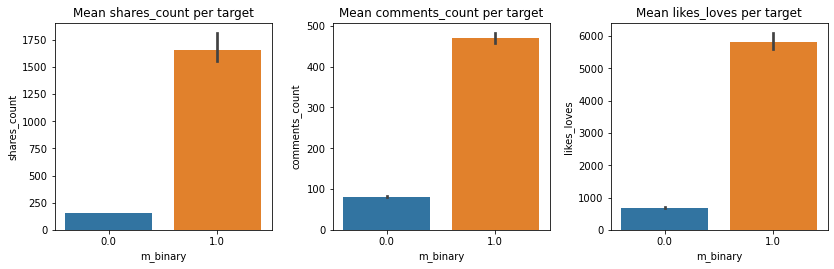

In [103]:
# plot mean per target for each engagement type

fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df.loc[df['is_matched']==1], y=target, x='m_binary', 
                ax=axes[i], estimator=np.mean)
    axes[i].set_title(f"Mean {target} per target")

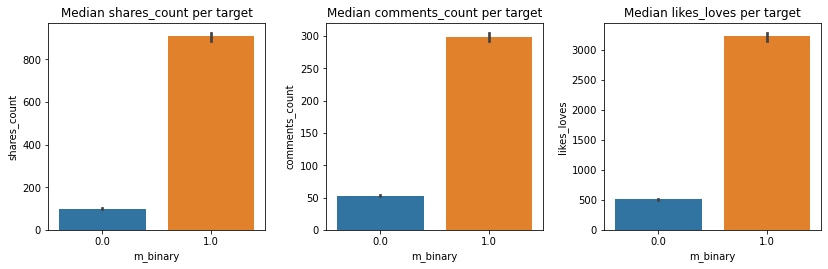

In [104]:
# plot median per target for each engagement type

fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df.loc[df['is_matched']==1], y=target, x='m_binary', 
                ax=axes[i], estimator=np.median)
    axes[i].set_title(f"Median {target} per target")

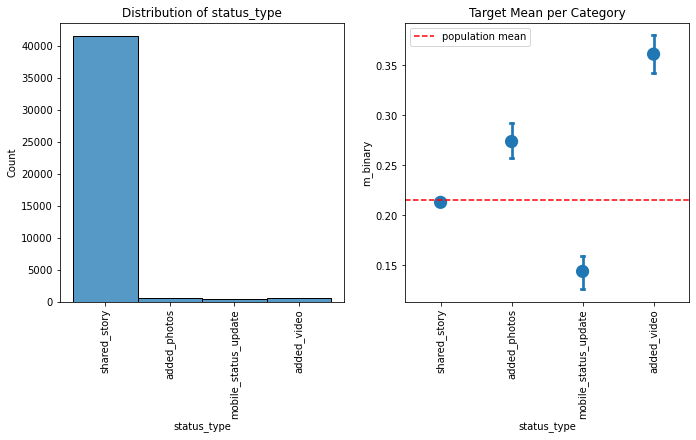

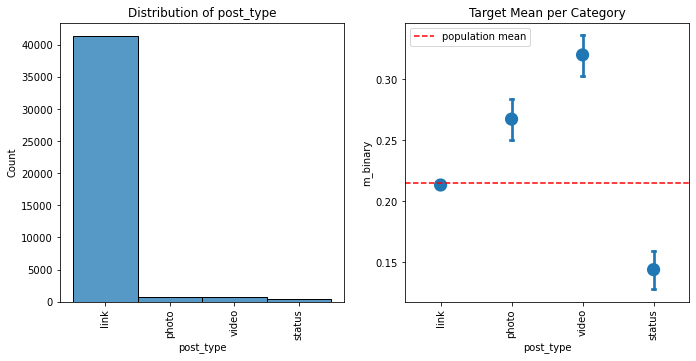

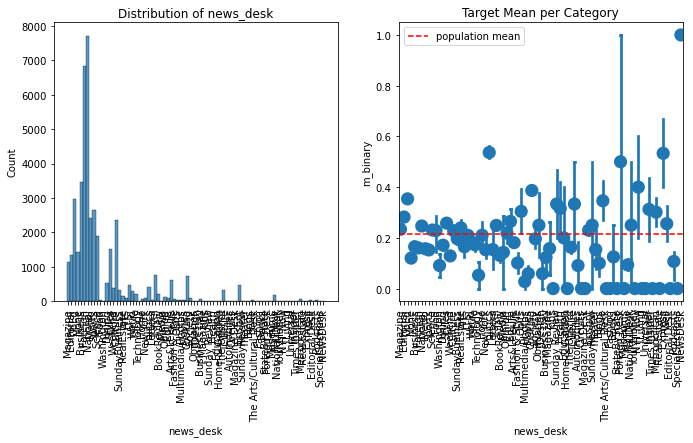

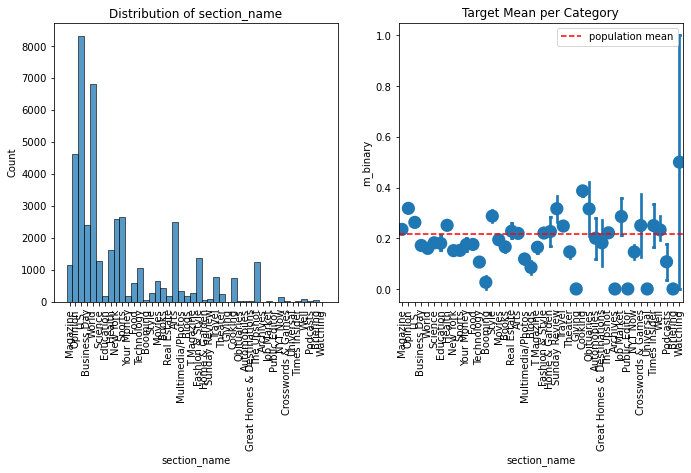

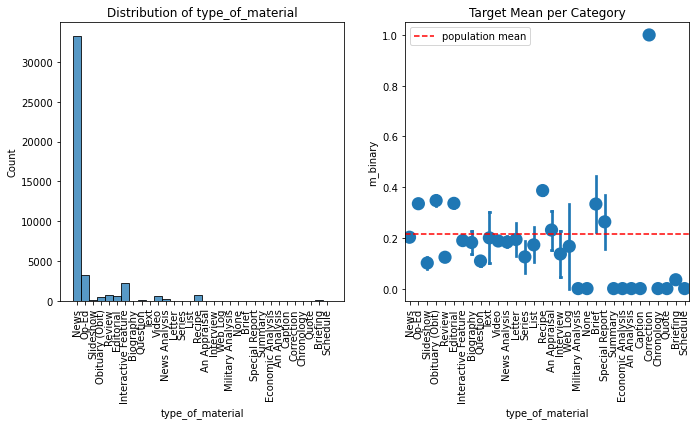

In [105]:
# Explore categorical variables' relationship to the new binary target
to_explore = ['status_type', 'post_type', 'news_desk', 'section_name', 
              'type_of_material']
eda.explore_data_catbin(to_explore, df.loc[df['is_matched']==1], 
                        'm_binary')

### Multi-class target

In [106]:
# Create column indicating outlier engagement in any category

# high, over 75th percentile
df.loc[df['mean_pct_m'] > 0.75, 'm_multi'] = 2

# low, under 25th percentile
df.loc[df['mean_pct_m'] < 0.25, 'm_multi'] = 0

# The rest, 25th to 50th percentile, are moderate
df.loc[df['m_multi'].isna(), 'm_multi'] = 1

df['m_multi'].value_counts(1)

1.0    0.613588
2.0    0.194313
0.0    0.192099
Name: m_multi, dtype: float64

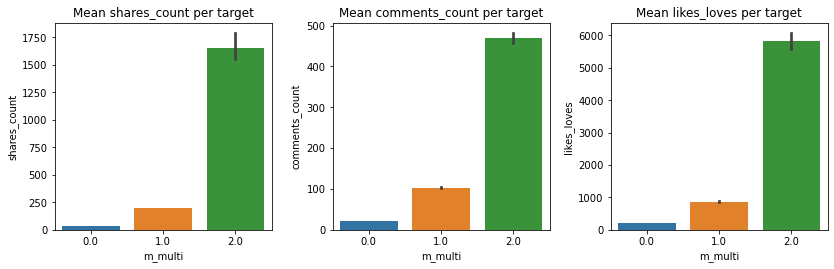

In [107]:
fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df.loc[df['is_matched']==1], y=target, 
                x='m_multi', ax=axes[i], estimator=np.mean)
    axes[i].set_title(f"Mean {target} per target")

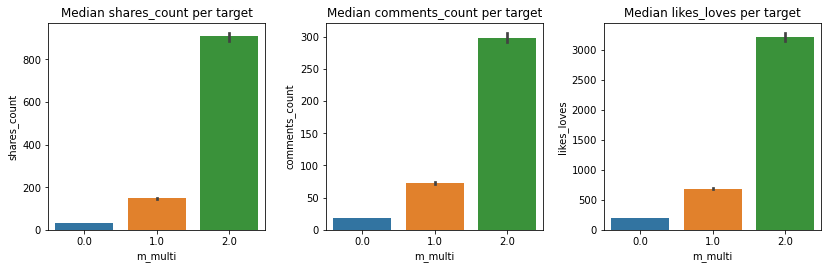

In [108]:
fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=3)
plt.tight_layout(pad=3)

for i, target in enumerate(['shares_count', 'comments_count', 'likes_loves']):
    sns.barplot(data=df.loc[df['is_matched']==1], y=target, 
                x='m_multi', ax=axes[i], estimator=np.median)
    axes[i].set_title(f"Median {target} per target")

### Engineer Features from Article-Only categorical fields

There are a few fields (`news_desk`, `section_name`, and `type_of_material` that seem to have some overlapping information.

I think I'm going to omit `news_desk`, use `section_name` as-is, and engineer some fields from `type_of_material` indicating whether a piece was interactive or video.

I'd also like to use `word_count`, but need to create categories.

#### Type of Material

In [109]:
df['type_of_material'].value_counts()

News                   33274
Not matched             4639
Op-Ed                   3272
Interactive Feature     2346
Review                   834
Recipe                   740
Editorial                622
Video                    602
Obituary (Obit)          510
News Analysis            289
Question                 193
Briefing                 172
Slideshow                119
Biography                 66
Letter                    31
List                      29
An Appraisal              26
Interview                 22
Special Report            19
Series                    16
Text                      10
Brief                      9
Web Log                    6
None                       5
Summary                    4
Caption                    2
Economic Analysis          2
An Analysis                2
Chronology                 1
Schedule                   1
Military Analysis          1
Quote                      1
Correction                 1
Name: type_of_material, dtype: int64

In [110]:
# Pull out interactive
df.loc[df['type_of_material']=='Interactive Feature', 'is_interactive'] = 1
df.loc[df['is_interactive'].isna(), 'is_interactive'] = 0

# Pull out video
df.loc[df['type_of_material']=='Video', 'is_video'] = 1
df.loc[df['is_video'].isna(), 'is_video'] = 0

# Pull out slideshow
df.loc[df['type_of_material']=='Slideshow', 'is_slideshow'] = 1
df.loc[df['is_slideshow'].isna(), 'is_slideshow'] = 0

#### Word Count

In [111]:
df['word_count'].describe()

count    47866.000000
mean       974.637216
std        938.075061
min          0.000000
25%        452.000000
50%        936.000000
75%       1267.000000
max      18273.000000
Name: word_count, dtype: float64

In [112]:
# get stats for articles that actually have word counts over 0
word_stats = df.loc[df['word_count']>0, 'word_count'].describe()

In [113]:
word_stats

count    39355.000000
mean      1185.414433
std        905.777252
min          1.000000
25%        786.000000
50%       1062.000000
75%       1334.000000
max      18273.000000
Name: word_count, dtype: float64

In [114]:
word_cat_col = 'word_count_cat'

df.loc[df['word_count']==0, word_cat_col] = 'None'
df.loc[(df[word_cat_col].isna()) & (df['word_count'] < word_stats['25%']), 
       word_cat_col] = 'Low'
df.loc[(df[word_cat_col].isna()) & (df['word_count'] < word_stats['75%']), 
       word_cat_col] = 'Average'
df.loc[df[word_cat_col].isna(), word_cat_col] = 'High'

df[word_cat_col].value_counts()

Average    19685
High        9864
Low         9806
None        8511
Name: word_count_cat, dtype: int64

#### Keywords

In [115]:
df['has_person'] = df['persons'].map(lambda x : 1 if type(x)==list else 0)
df['has_org'] = df['organizations'].map(lambda x : 1 if type(x)==list else 0)
df['has_geo'] = df['glocations'].map(lambda x : 1 if type(x)==list else 0)

In [116]:
# Fill nulls with placeholder list
for i in df.loc[df['subject'].isna(), 'subject'].index:
    df.at[i, 'subject'] = ['No Subject']

In [117]:
df['subject'][:5].values

array([list(['automobiles', 'economic conditions and trends', 'american recovery and reinvestment act (2009)', 'presidential election of 2012', 'labor and jobs']),
       list(['weather', 'books and literature', 'hurricanes and tropical storms', 'supercomputers']),
       list(['food', 'organic foods and products', 'medicine and health', 'social conditions and trends']),
       list(['No Subject']),
       list(['medical marijuana', 'marijuana', 'anxiety and stress', 'parenting'])],
      dtype=object)

### Explore Category Relationship to Target

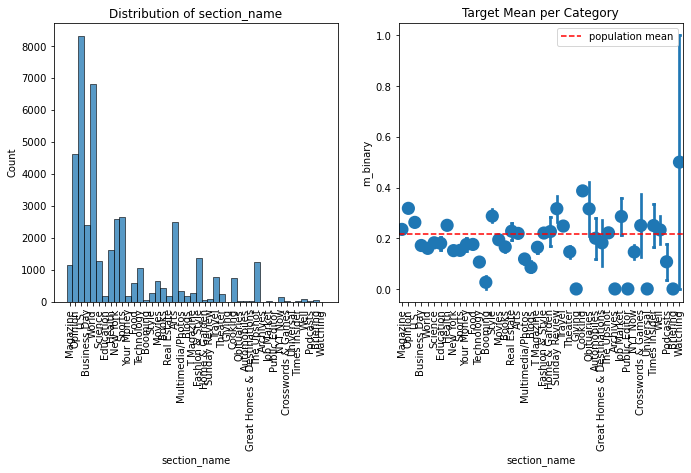

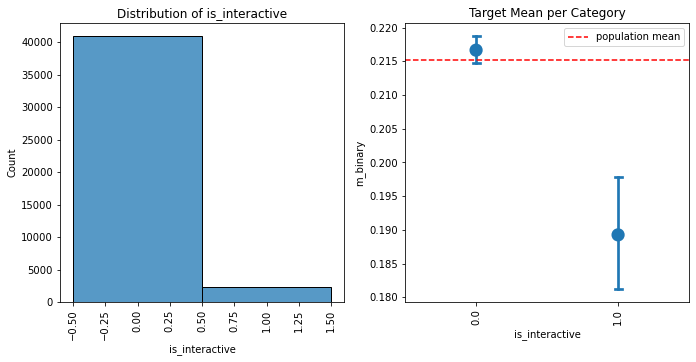

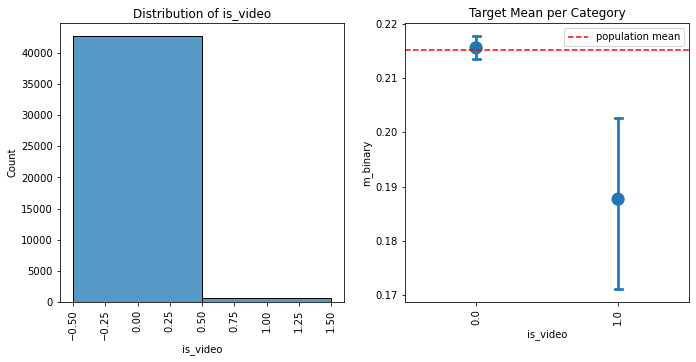

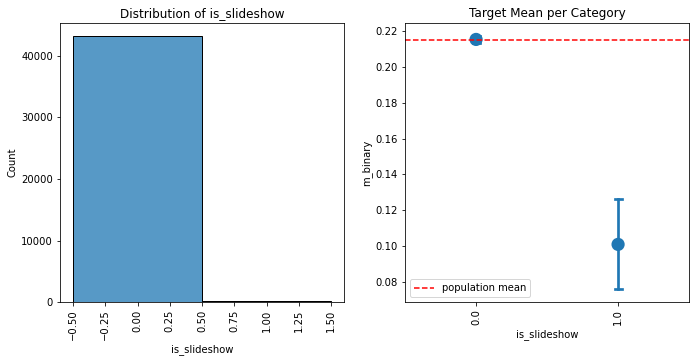

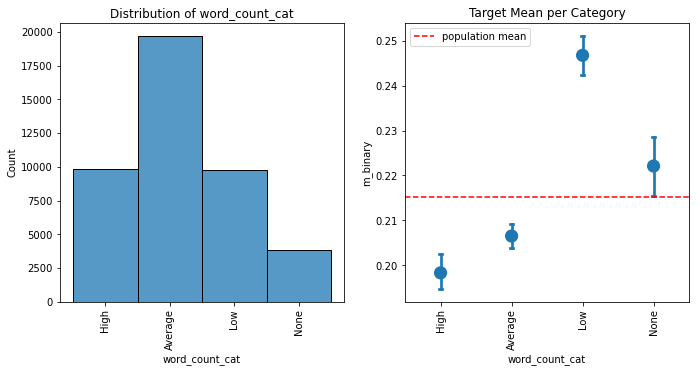

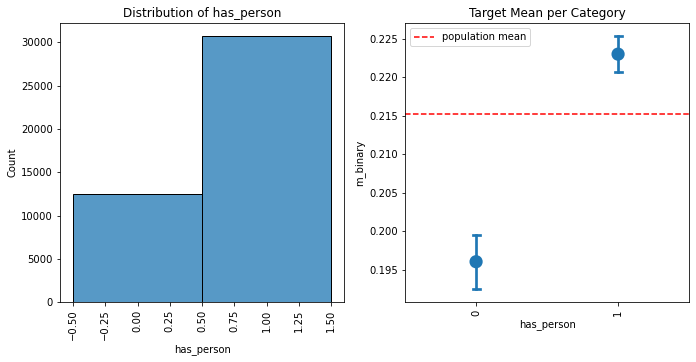

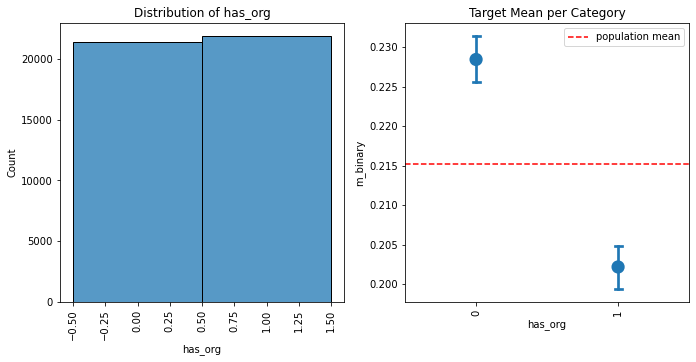

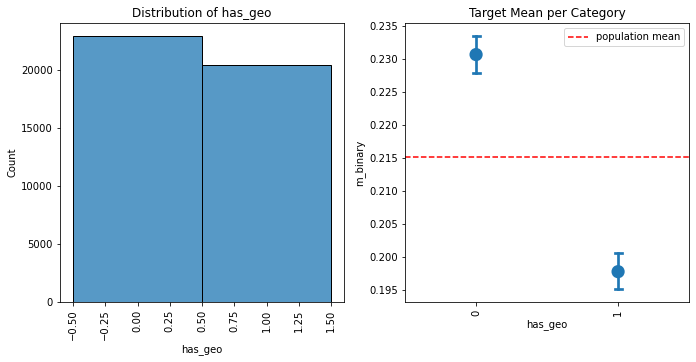

In [118]:
# Explore categorical variables' relationship to the new binary target
to_explore = ['section_name', 'is_interactive', 'is_video', 'is_slideshow', 
              'word_count_cat', 'has_person', 'has_org', 'has_geo']
eda.explore_data_catbin(to_explore, df.loc[df['is_matched']==1], 
                        'm_binary')

I'm realizing that not many of the articles are classified as interactive, videos, or a slideshow. I'm not sure I'll end up using them.

In [119]:
# create a single column for 'is_interactive', 'is_video', 'is_slideshow'
df.loc[(df['is_interactive']==1) | (df['is_video']==1) | 
       (df['is_slideshow']==1), 'is_multimedia'] = 1

df.loc[(df['is_multimedia'].isna()), 'is_multimedia'] = 0

df['is_multimedia'].value_counts()

0.0    44799
1.0     3067
Name: is_multimedia, dtype: int64

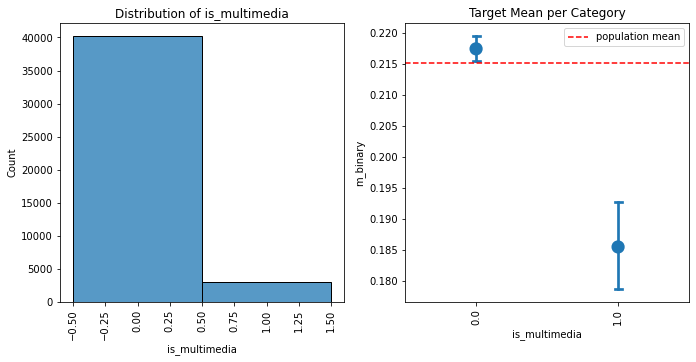

In [120]:
eda.explore_data_catbin(['is_multimedia'], df.loc[df['is_matched']==1], 
                        'm_binary')

In [121]:
df.loc[(df['is_matched']==1) & (df['is_multimedia']==1), 
       'post_type'].value_counts(1)

link      0.822954
video     0.093251
photo     0.070427
status    0.013368
Name: post_type, dtype: float64

In [122]:
df.loc[(df['is_matched']==1) & (df['is_multimedia']==0), 
       'post_type'].value_counts(1)

link      0.967455
video     0.011479
photo     0.010832
status    0.010234
Name: post_type, dtype: float64

82% of the articles that are multimedia were posted to Facebook as links, as opposed to uploaded as videos or photos to Facebook itself.

## Review All Post distribution versus Matched

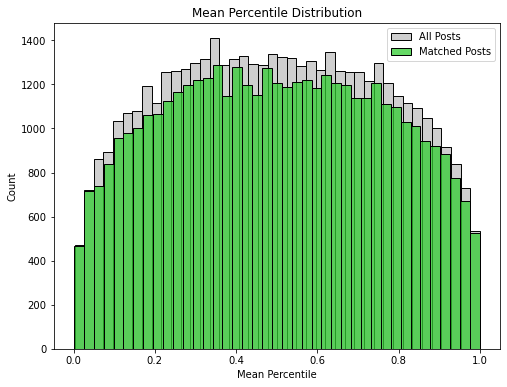

In [123]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=df, x='mean_pct', ax=ax, color='silver', 
             label='All Posts')
sns.histplot(data=df.loc[df['is_matched']==1], x='mean_pct_m', ax=ax,
            color='limegreen', label='Matched Posts') 
ax.set_title("Mean Percentile Distribution")
ax.set_xlabel("Mean Percentile")
plt.legend();
    

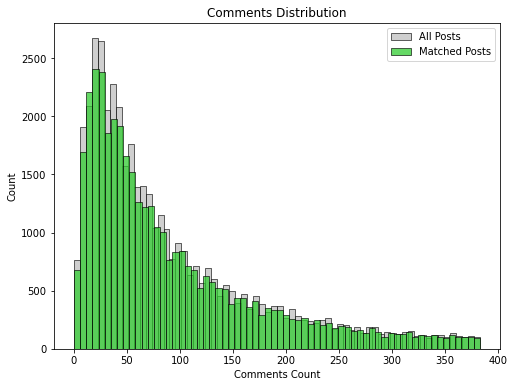

In [124]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=df.loc[df['comments_outliers'].isna()], 
             x='comments_count', ax=ax, color='silver', 
             label='All Posts')
sns.histplot(data=df.loc[(df['is_matched']==1) & 
            (df['comments_outliers'].isna())], x='comments_count', ax=ax,
            color='limegreen', label='Matched Posts') 
ax.set_title("Comments Distribution")
ax.set_xlabel("Comments Count")
plt.legend();

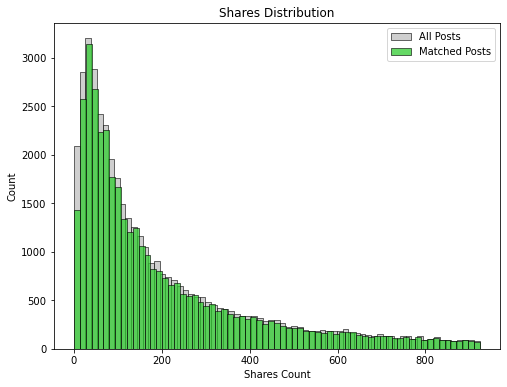

In [125]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=df.loc[df['shares_outliers'].isna()], 
             x='shares_count', ax=ax, color='silver', 
             label='All Posts')
sns.histplot(data=df.loc[(df['is_matched']==1) & 
            (df['shares_outliers'].isna())], x='shares_count', ax=ax,
            color='limegreen', label='Matched Posts') 
ax.set_title("Shares Distribution")
ax.set_xlabel("Shares Count")
plt.legend();

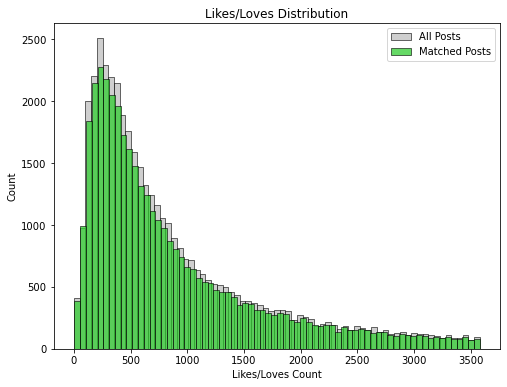

In [126]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(data=df.loc[df['likelove_outliers'].isna()], 
             x='likes_loves', ax=ax, color='silver', 
             label='All Posts')
sns.histplot(data=df.loc[(df['is_matched']==1) & 
            (df['likelove_outliers'].isna())], x='likes_loves', ax=ax,
            color='limegreen', label='Matched Posts') 
ax.set_title("Likes/Loves Distribution")
ax.set_xlabel("Likes/Loves Count")
plt.legend();

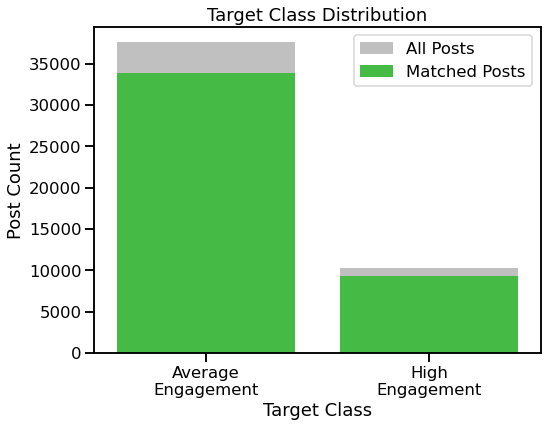

In [127]:
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(figsize=(8, 6))

    sns.countplot(data=df, x='all_binary', ax=ax, color='silver', 
                 label='All Posts', )
    sns.countplot(data=df.loc[df['is_matched']==1], x='m_binary', ax=ax,
                color='limegreen', label='Matched Posts') 
    ax.set_title("Target Class Distribution")
    ax.set_xlabel("Target Class")
    ax.set_ylabel("Post Count")
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(labels=['Average\nEngagement', 'High\nEngagement'])
    plt.legend();

The distributions are pretty close for matched versus unmatched.

## Explore Dates

### Timezone

Post ID `5281959998_10150952237769999` [here](https://www.facebook.com/nytimes/posts/10150952237769999) says it was posted on November 3, 2016 at 7:03 AM Eastern (on my laptop), but the timestamp in the CSV says 11:03 AM.

4 hours ahead on November 3, 2016 is just before daylight savings time ended, so Eastern was 4 hours behind GMT. I think the time stamps are in GMT.

In [128]:
# convert posted_at to datetime and set it as index
df['posted_at'] = pd.to_datetime(df['posted_at'])
df.set_index(['posted_at'], drop=False, inplace=True)

In [129]:
# make index time zone aware in UTC
df.index = df.index.tz_localize('UTC')

In [130]:
# convert time stamps to Eastern time
df.index = df.index.tz_convert('US/Eastern')

In [131]:
# check and see, is the example I used before in the right time zone now
df.loc[df['id']=='5281959998_10150952237769999']

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,m_binary,m_multi,is_interactive,is_video,is_slideshow,word_count_cat,has_person,has_org,has_geo,is_multimedia
posted_at,,,,,,,,,,,,,,,,,,,,,
2016-11-03 07:03:02-04:00,5281959998_10150952237769999,"Hillary Clinton Still Leads a Tighter Race, Ti...",Breaking News: Hillary Clinton holds a 3-point...,Most voters say that their minds are made up a...,nytimes.com,link,shared_story,634,628,http://www.nytimes.com/2016/11/04/us/politics/...,...,1.0,2.0,0.0,0.0,0.0,Average,1,1,0,0.0


In [132]:
# separate out months, days of the week, hours of the day (in 24-hour time)
# and year
# https://pandas.pydata.org/docs/reference/api/pandas.Timestamp.html
df['day_name'] = df.index.day_name()
df['month'] = df.index.month_name()
df['hour'] = df.index.hour
df['year'] = df.index.year

In [133]:
df[['month', 'day_name', 'hour', 'year']]

,month,day_name,hour,year
posted_at,,,,
2012-09-08 11:16:55-04:00,September,Saturday,11,2012
2012-09-08 12:01:13-04:00,September,Saturday,12,2012
2012-09-08 12:44:02-04:00,September,Saturday,12,2012
2012-09-08 13:32:18-04:00,September,Saturday,13,2012
2012-09-08 15:14:51-04:00,September,Saturday,15,2012
...,...,...,...,...
2016-11-07 17:40:27-05:00,November,Monday,17,2016
2016-11-07 17:55:00-05:00,November,Monday,17,2016
2016-11-07 18:26:25-05:00,November,Monday,18,2016


If I graph all of the data, it includes only a few months of 2012, which have lower volume than later years. 

Selecting everything after 2012 to use for visualization, so the graphs are easier to read. When I initially included everything, 2012 volumes were pretty low and consistent.

In [134]:
df_no2012 = df.loc['2013-01-01':]
df_no2012.head()

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,is_slideshow,word_count_cat,has_person,has_org,has_geo,is_multimedia,day_name,month,hour,year
posted_at,,,,,,,,,,,,,,,,,,,,,
2013-01-01 10:12:36-05:00,5281959998_128572180638748,Senate Passes Legislation to Allow Taxes on Af...,"The Senate, in a pre-dawn vote two hours after...","The Senate easily passed the measure, which al...",nytimes.com,link,shared_story,86,132,http://www.nytimes.com/2013/01/02/us/politics/...,...,0.0,High,1,1,0,0.0,Tuesday,January,10,2013
2013-01-01 11:29:39-05:00,5281959998_408744032538068,Trendy Spot Urges Tourists to Ride In and Spen...,Quotation of the Day: 'Psy appeared right when...,"The success of the video, by a midlevel star w...",nytimes.com,link,shared_story,34,31,http://www.nytimes.com/2013/01/01/world/asia/f...,...,0.0,Average,1,0,1,0.0,Tuesday,January,11,2013
2013-01-01 12:04:50-05:00,5281959998_10150274076714999,Timeline Photos,Browse some of the most memorable front pages ...,NaN,None,photo,added_photos,33,197,https://www.facebook.com/nytimes/photos/a.2835...,...,0.0,None,0,0,0,0.0,Tuesday,January,12,2013
2013-01-01 21:32:08-05:00,5281959998_576458589046743,2012: The Year in Graphics,"Using human figures on a 3D track, The New Yor...",A selection of graphics and interactives from ...,nytimes.com,link,shared_story,13,54,http://www.nytimes.com/interactive/2012/12/30/...,...,0.0,None,0,0,0,1.0,Tuesday,January,21,2013
2013-01-01 23:21:59-05:00,5281959998_407806775965238,"Amid Pressure, House Passes Fiscal Deal","House Republicans, fearful of blame and politi...",After spending much of the day exploring the p...,nytimes.com,link,shared_story,103,281,http://www.nytimes.com/2013/01/02/us/politics/...,...,0.0,Average,1,1,0,0.0,Tuesday,January,23,2013


In [135]:
def plot_posts_per_time(df, x_col):
    """Create histogram for count of posts per specified x_col. 
    Uses year as hue by default.
    """
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(data=df, x=x_col, hue='year', multiple='dodge', 
                 palette='tab10', )
    ax.set_title(f"Count of Facebook Posts per {x_col.title()} and Year")
    for tick in ax.get_xticklabels():
        tick.set_rotation(45);

### Histograms

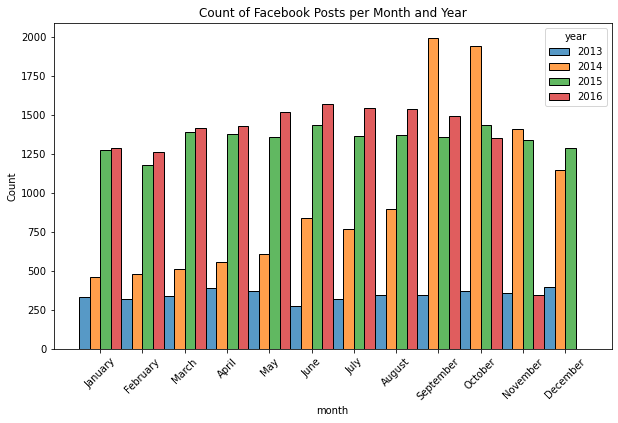

In [136]:
plot_posts_per_time(df_no2012, 'month')

The Times posted about 300-350 posts per month from the end of 2012 through 2013.

In 2014, number of posts started ramping up, hitting an all-time high of 1800-1900 per month in September and October.

After that, number of posts per month settled in at about 1300-1500 per month from the end of 2014. I believe November 2016 is a partial month, so the November count looks smaller than it probably actually was.

In [137]:
df.tail()

,id,name,message,description,caption,post_type,status_type,comments_count,shares_count,link,...,is_slideshow,word_count_cat,has_person,has_org,has_geo,is_multimedia,day_name,month,hour,year
posted_at,,,,,,,,,,,,,,,,,,,,,
2016-11-07 17:40:27-05:00,5281959998_10150958194759999,"‘Westworld’ Season 1, Episode 6: The Tipping P...",This week's 'Westworld' gave us the show's mos...,"The world as Maeve understood it is gone, as t...",nytimes.com,link,shared_story,37,40,http://www.nytimes.com/2016/11/06/arts/televis...,...,0.0,Average,0,0,0,0.0,Monday,November,17,2016
2016-11-07 17:55:00-05:00,5281959998_10150958250414999,What Ivanka Trump Can’t Sell,“She wants to preach an ideology of female emp...,She has remained loyal to her father. Will tha...,nytimes.com,link,shared_story,621,465,http://www.nytimes.com/2016/11/07/opinion/camp...,...,0.0,Average,1,0,0,0.0,Monday,November,17,2016
2016-11-07 18:26:25-05:00,5281959998_10150958439909999,"This Time, There Really Is a Hispanic Voter Surge","The Hispanic voter surge is real, and it’s big...",Early voting data unequivocally indicates that...,nytimes.com,link,shared_story,776,4286,http://www.nytimes.com/2016/11/08/upshot/this-...,...,0.0,Average,1,0,1,0.0,Monday,November,18,2016
2016-11-07 18:40:00-05:00,5281959998_10150958425294999,NYT Watching Recommendation of the Day: 'Bob's...,The most passionately pro-weirdo show on telev...,The comedy doesn’t just introduce weirdness bu...,nytimes.com,link,shared_story,428,503,http://www.nytimes.com/watching/recommendation...,...,0.0,None,0,0,0,0.0,Monday,November,18,2016
2016-11-07 18:55:00-05:00,5281959998_10150958224029999,Harry Belafonte: What Do We Have to Lose? Ever...,'What old men know is that things blown up — c...,Donald Trump and his “movement” put the painfu...,nytimes.com,link,shared_story,183,3283,http://www.nytimes.com/2016/11/07/opinion/camp...,...,0.0,Average,1,0,0,0.0,Monday,November,18,2016


Yes, it only goes until November 7, 2016.

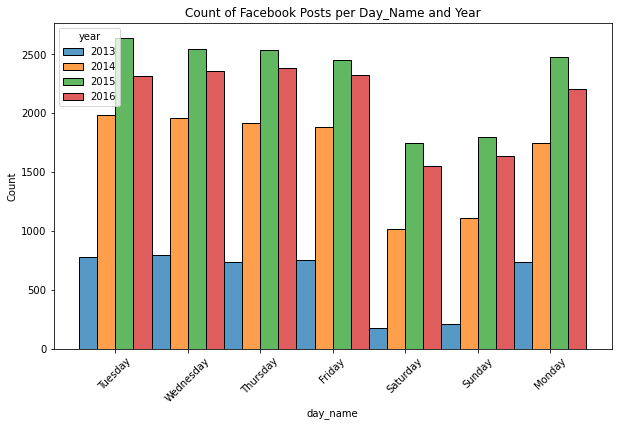

In [138]:
plot_posts_per_time(df_no2012, 'day_name')

The Times releases more posts during the week (particularly Tuesday through Friday) than it does on the weekend.

The difference in number of weekday posts compared to number of weekend posts seems to narrow as time goes on.

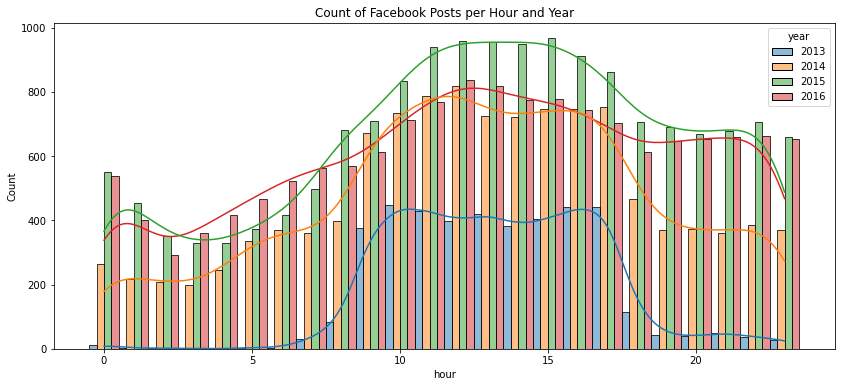

In [139]:
fig, ax = plt.subplots(figsize=(14, 6))
sns.histplot(data=df_no2012, x='hour', hue='year', multiple='dodge', 
             palette='tab10', discrete=True, kde=True)
ax.set_title(f"Count of Facebook Posts per Hour and Year");

In 2013, posts mostly went up from around 9 AM to 5 PM Eastern, with very few outside normal working hours.

9-5 continues to be the heaviest time for new posts through 2016, although more posts start to be added in off-hours so there's less of a difference.



### Shares, Comments, and Likes per Time Freq

Check for seasonality of number of comments, shares, or likes based on different time frequencies across multiple years.

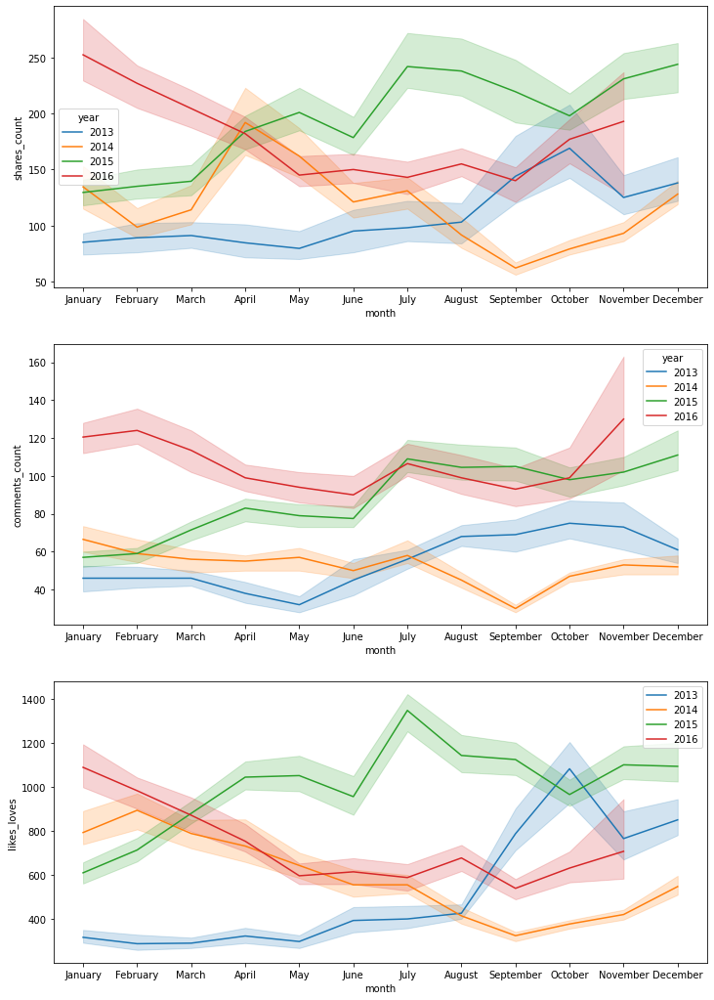

In [140]:
fig, [ax1,ax2,ax3] = plt.subplots(nrows=3, ncols=1, figsize=(12, 18))
sns.lineplot(data=df_no2012, x='month', y='shares_count', ax=ax1,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='month', y='comments_count', ax=ax2,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='month', y='likes_loves', ax=ax3, 
            hue='year', palette='tab10', estimator=np.median)
plt.legend();

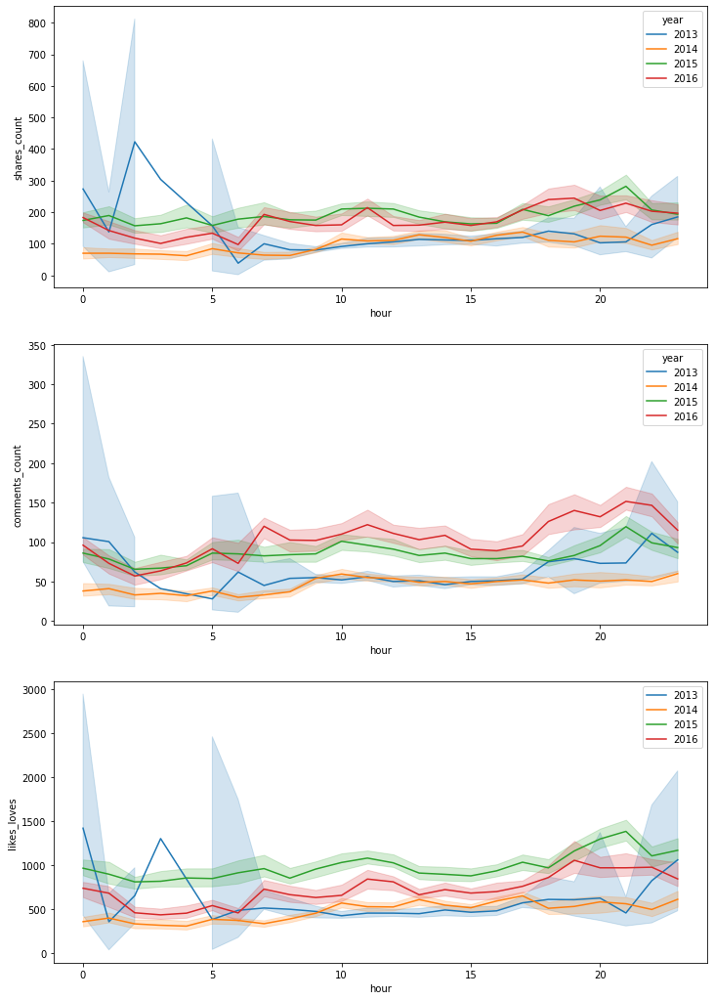

In [141]:
fig, [ax1,ax2,ax3] = plt.subplots(nrows=3, ncols=1, figsize=(12, 18))
sns.lineplot(data=df_no2012, x='hour', y='shares_count', ax=ax1,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='hour', y='comments_count', ax=ax2,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='hour', y='likes_loves', ax=ax3, 
            hue='year', palette='tab10', estimator=np.median)
plt.legend();

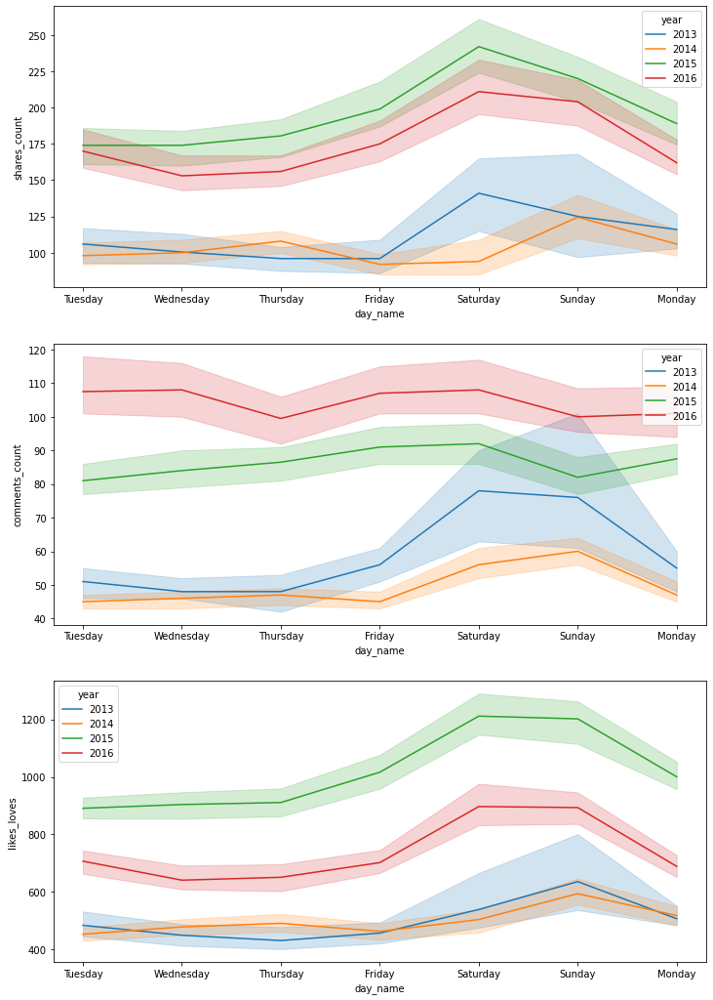

In [142]:
fig, [ax1,ax2,ax3] = plt.subplots(nrows=3, ncols=1, figsize=(12, 18))
sns.lineplot(data=df_no2012, x='day_name', y='shares_count', ax=ax1,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='day_name', y='comments_count', ax=ax2,
            hue='year', palette='tab10', estimator=np.median)
sns.lineplot(data=df_no2012, x='day_name', y='likes_loves', ax=ax3, 
            hue='year', palette='tab10', estimator=np.median);

- Busiest months seem to vary year by year, so I'm thinking there isn't any seasonality to activity, it's just based on what might be happening in any given month.
- People seem to interact with posts sightly more frequently when they're added in the evening hours. There are also slight increases in the morning.
- Posts added on Friday, Sunday, and Wednesday seemed to get the most engagement in years prior to 2016. In 2016 it's mostly the same, but Tuesday is more popular than Wednesday.

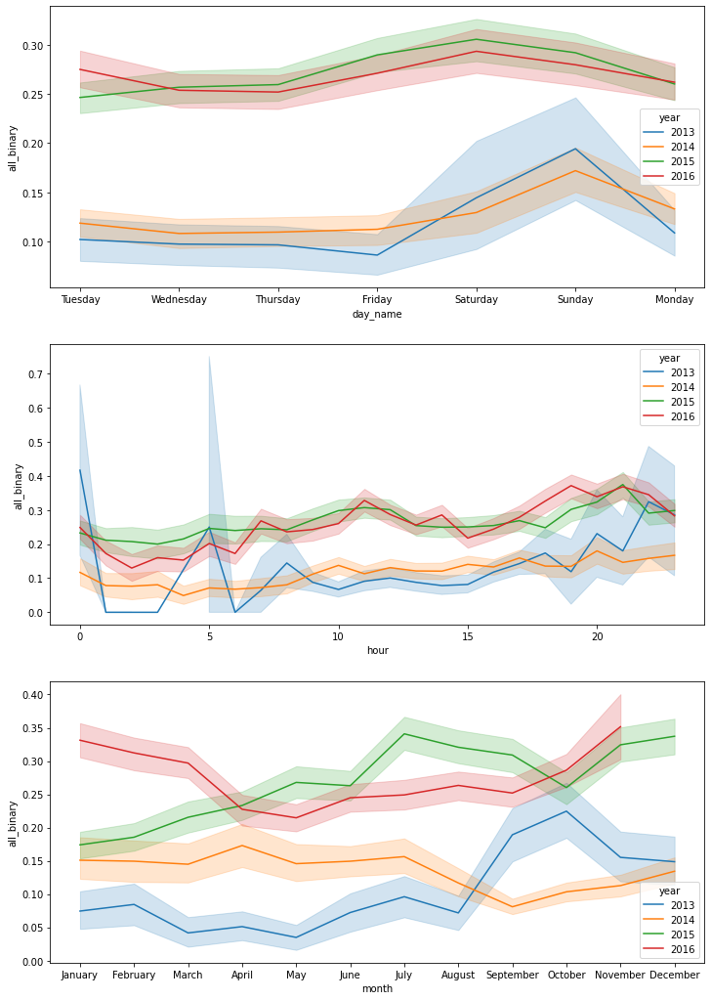

In [143]:
# plotting the binary target on the y-axis, we're getting the mean.
# 21.5% are high

fig, [ax1,ax2,ax3] = plt.subplots(nrows=3, ncols=1, figsize=(12, 18))
sns.lineplot(data=df_no2012, x='day_name', y='all_binary', ax=ax1,
            hue='year', palette='tab10')
sns.lineplot(data=df_no2012, x='hour', y='all_binary', ax=ax2,
            hue='year', palette='tab10')
sns.lineplot(data=df_no2012, x='month', y='all_binary', ax=ax3,
            hue='year', palette='tab10');

Posts made on the weekend seem to get somewhat more engagement than during the week.

There also look to be some spikes for posts added in the morning and the evening versus mid-day.

I don't see much of a pattern per month posted; I think it just depends what newsworthy things are happening in a given month in a given year.

### Create hour category

I would like to engineer a feature for time of day when a post was made, in Eastern time.

- Morning = 7 AM - 11 AM
- Midday = 11 AM - 3 PM
- Afternoon = 3 PM - 7 PM
- Evening = 7 PM - 11 PM
- Late night = 11 PM - 3 AM
- Early morning = 3 AM - 7 AM

In [144]:
df.loc[(7 <= df['hour']) & (df['hour'] < 11), 'hour_cat'] = '2_Morning (7-11)'
df.loc[(11 <= df['hour']) & (df['hour'] < 15), 'hour_cat'] = '3_Midday (11-15)'
df.loc[(15 <= df['hour']) & (df['hour'] < 19), 'hour_cat'] = '4_Afternoon (15-19)'
df.loc[(19 <= df['hour']) & (df['hour'] < 23), 'hour_cat'] = '5_Evening (19-23)'
df.loc[(23 <= df['hour']) | (df['hour'] < 3), 'hour_cat'] = '6_Late night (23-3)'
df.loc[(3 <= df['hour']) & (df['hour'] < 7), 'hour_cat'] = '1_Early morning (3-7)'

In [145]:
df['hour_cat'].value_counts()

3_Midday (11-15)         12078
4_Afternoon (15-19)      10702
2_Morning (7-11)          8572
5_Evening (19-23)         7099
6_Late night (23-3)       5039
1_Early morning (3-7)     4376
Name: hour_cat, dtype: int64

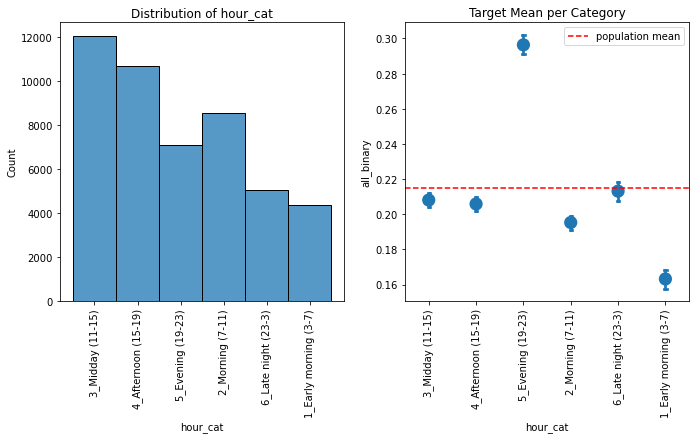

In [146]:
eda.explore_data_catbin(['hour_cat'], df, 'all_binary')

### Create Weekend category

In [147]:
df.loc[df['day_name'].isin(['Saturday', 'Sunday']), 
       'on_weekend'] = 1

df.loc[df['on_weekend'].isna(), 'on_weekend'] = 0

df['on_weekend'].value_counts(1)


0.0    0.803284
1.0    0.196716
Name: on_weekend, dtype: float64

## Duplicate Facebook Texts

These represent instances where the same exact message, description, and name were posted more than once, purposefully.

I'm curious whether I will see any patterns in these duplicates; if the first or last instance tends to get more engagement, if the time of day or day of the week seems to get more engagement, etc.

In [148]:
df.duplicated(subset=['all_text'], keep='first').sum()

194

In [149]:
def md5_hash(x):
    m = hashlib.md5(bytes(x, 'utf-8'))
    return m.hexdigest()

# hash the text to give it a unique ID that's easily sortable
df['text_hash'] = df['all_text'].map(lambda x: md5_hash(x))

In [150]:
#df.loc[df.duplicated(subset=['text_hash'], keep=False), 
#       ['post_type', 'text_hash', 'comments_count', 'shares_count', 'likes_loves',
#       'all_binary', 'day_name', 'hour']].to_csv('data/Review_Text_dupes.csv')

I exported the duplicates and reviewed them in Google Sheets. I didn't see any patterns that seemed to contribute to one post getting more engagement than other: some seemed to simply be first, some were posted on the weekend versus the weekday, some were posted at different times of day.

## Word Frequencies for Facebook text

### Text Preprocessing

In [151]:
# set index back to numbers
df.reset_index(drop=True, inplace=True)

In [152]:
# back up all_text into cleaned
df['cleaned'] = df['all_text']

In [153]:
# check for links or URLs
df.loc[df['cleaned'].str.contains("http[^ ]+|www\.[^ ]+"), 'cleaned'][:5].values

array(['The Weatherman Is Not a Moron. In 1940, the chance of an American being killed by lightning was about 1 in 400,000. Today it’s 1 in 11 million. This is partly because of changes in living patterns (more of our work is done indoors), but it’s also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: http://nyti.ms/U1RV8a. In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ.',
       "Timeline Photos. Our special Arts & Leisure section 'The New Season' is now online. Take a look at the upcoming offerings in arts and entertainment below. Are you looking forward to any particular events?Art: http://nyti.ms/TAYvoJClassical: http://nyti.ms/P41kvVDance: http://nyti.ms/Rx3YIhMovies: http://nyti.ms/Ow4dodPop: http://nyti.ms/RoEIJUTe

In [154]:
# map doc cleaning function onto 'cleaned' column
# urls have been replaced with links
df['cleaned'] = df['cleaned'].map(lambda x: nlp_prep.clean_docs(x))

df.loc[df['all_text'].str.contains("http[^ ]+|www\.[^ ]+"), 'cleaned'][:5].values

array(["The Weatherman Is Not a Moron. In 1940, the chance of an American being killed by lightning was about 1 in 400,000. Today it's 1 in 11 million. This is partly because of changes in living patterns (more of our work is done indoors), but it's also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ.",
       "Timeline Photos. Our special Arts & Leisure section 'The New Season' is now online. Take a look at the upcoming offerings in arts and entertainment below. Are you looking forward to any particular events?Art: Jonathan Bartlett)",
       'Timeline Photos. During a surprise visit to Gators Dockside bar in Orlando, Florida, President Obama was introduced to a boy who was

In [155]:
# check for non-ASCII characters
df.loc[df['all_text'].str.contains(r"[^\x00-\x7F]+"), ['cleaned', 'all_text']][:5].values

array([["Did Barack Obama Save Ohio?. 'There are several pivotal states Ohio, Florida, Nevada, Virginia where things are slowly turning around. In these states, the real issue may not be who deserves blame for economic ruin but rather who deserves credit for a rebound, and what really causes jobs to come back after they've been lost,' writes Matt Bai. Why the battle to take credit for Ohio's ever-so-slightly above-average economy could swing the presidential election.",
        "Did Barack Obama Save Ohio?. 'There are several pivotal states — Ohio, Florida, Nevada, Virginia — where things are slowly turning around. In these states, the real issue may not be who deserves blame for economic ruin but rather who deserves credit for a rebound, and what really causes jobs to come back after they’ve been lost,' writes Matt Bai. Why the battle to take credit for Ohio’s ever-so-slightly above-average economy could swing the presidential election."],
       ["The Weatherman Is Not a Moron. In 19

In [156]:
# check for number-only words
df.loc[df['cleaned'].str.contains(r"[$]*[0-9]+[,.:$%0-9]*\b"),
      ['all_text']][:5].values

array([['The Weatherman Is Not a Moron. In 1940, the chance of an American being killed by lightning was about 1 in 400,000. Today it’s 1 in 11 million. This is partly because of changes in living patterns (more of our work is done indoors), but it’s also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: http://nyti.ms/U1RV8a. In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ.'],
       ["The Organic Fable. 'Organic has long since become an ideology, the romantic back-to-nature obsession of an upper middle class able to afford it and oblivious, in their affluent narcissism, to the challenge of feeding a planet whose population will surge to 9 billion,' writes Op-Ed columnist Roger Cohen. A study exposes the hype behind a pseud

In [157]:
# remove numbers-only words
df = nlp_prep.pattern_match_in_df(df, doc_col='cleaned', hit_col='_', 
                pattern=r"[$]*[0-9]+[,.:$%0-9]*\b", 
                out_type='none', replace=True)

In [158]:
# check for number-only words again, have they been removed?
df.loc[df['all_text'].str.contains(r"[$]*[0-9]+[,.:$%0-9]*\b"),
      ['all_text', 'cleaned']][:5].values

array([['The Weatherman Is Not a Moron. In 1940, the chance of an American being killed by lightning was about 1 in 400,000. Today it’s 1 in 11 million. This is partly because of changes in living patterns (more of our work is done indoors), but it’s also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: http://nyti.ms/U1RV8a. In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ.',
        "The Weatherman Is Not a Moron. In , the chance of an American being killed by lightning was about in . Today it's in million. This is partly because of changes in living patterns (more of our work is done indoors), but it's also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which 

I also noticed that in some cases the newlines were removed, and there isn't appropriate spacing between the end of the previous sentence and the next one. I'm going to try to replace the end of sentence punctuation that blends together with another word.

In [159]:
df.loc[1, 'cleaned']

"The Weatherman Is Not a Moron. In , the chance of an American being killed by lightning was about in . Today it's in million. This is partly because of changes in living patterns (more of our work is done indoors), but it's also because better weather forecasts have helped us prepare.Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ."

In [160]:
def split_sentences(doc):
    # find instances of a sentence-ender followed by a sentence opener
    # capital letter 
    doc = re.sub(r"([?.])([A-Z])", r"\1 \2", doc)
    return doc
    
df['cleaned'] = df['cleaned'].map(lambda x: split_sentences(x))

df.loc[1, 'cleaned']

"The Weatherman Is Not a Moron. In , the chance of an American being killed by lightning was about in . Today it's in million. This is partly because of changes in living patterns (more of our work is done indoors), but it's also because better weather forecasts have helped us prepare. Nate Silver takes the long view and finds one area in which our predictions are making extraordinary progress: Weather forecasting. See some extraordinary photos of extreme weather: In the hocus-pocus realm of predicting the future, weather forecasting is an area of progress. Your own experience may differ."

### Stopwords

In [161]:
# starting with nltk's stopwords list
nltk_stopwords = stopwords.words('english')
nltk_stopwords.sort()
print(nltk_stopwords)

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', 'her', 'here', 'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in', 'into', 'is', 'isn', "isn't", 'it', "it's", 'its', 'itself', 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she', "she's", 'should', "should've", 'shouldn', "shouldn't", 'so', 'some',

In [162]:
import string
punc = list(string.punctuation)
print(punc)

['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']


### Tokenize - No stopwords or punctuation removed

I'm using a tokenizer function that leverages the TweetTokenizer, as it's something I've used before for Tweet processing. Although these are not tweets, they are short text and may contains @mentions that the TweetTokenizer can take out for us.

In [163]:
# Create a dictionary of tokens with class labels as keys
# removing punctuation only
token_dict = nlp_prep.tokenize_corpus_dict_tweet(df, [0, 1], 
            target_col='all_binary', stop_list=None, verbose=False)
token_dict[0][:5]

['did', 'barack', 'obama', 'save', 'ohio']

In [164]:
# create list of all word frequencies in the corpus
all_tokens = []
[all_tokens.extend(tokens) for tokens in token_dict.values()]

len(all_tokens)


2966067

In [165]:
# get frequency distribution for entire corpus
all_corpus = FreqDist(all_tokens)

corpus_freq_df = pd.DataFrame(all_corpus.most_common(100),
                              columns=['Word','Count'])
corpus_freq_df[:25]

,Word,Count
0,.,195675
1,the,143796
2,",",118178
3,a,75588
4,of,69621
5,to,64697
6,in,59552
7,and,53164
8,',34408
9,for,27065


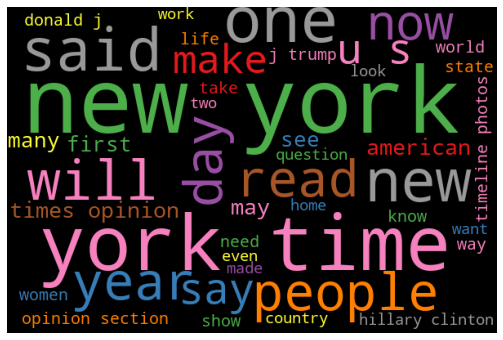

In [166]:
# Wordcloud for most common words in whole corpus, no stopwords
# or punctuation removed
nlp_prep.generate_wordcloud(docs=all_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='Entire Corpus')

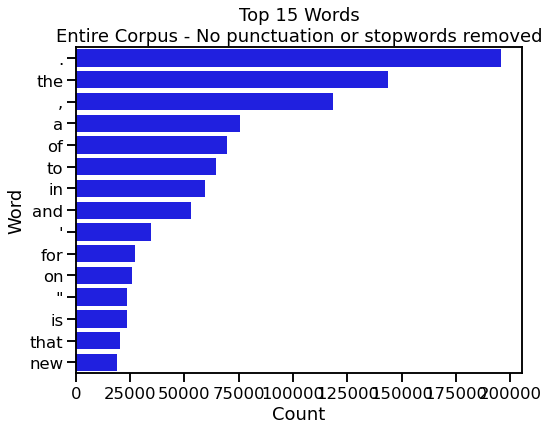

In [167]:
# Plot top 15 words across the entire corpus, no punctuation removed
nlp_prep.plot_wordfreqs(corpus_freq_df, 'Word', 'Count', 15, 
               "Entire Corpus - No punctuation or stopwords removed")

Well perhaps not surprisingly, the words "New York Times" are very common, and the top 15 words are all punctuation and stop words.

Let's take "new york times" out of the text, and try this out with stopwords and punctuation removed.

### Remove "New York Times"

In [168]:
# remove "New York Times"
df = nlp_prep.pattern_match_in_df(df, doc_col='cleaned', hit_col='_', 
                pattern=r"(?:^|\s)([Nn]ew [Yy]ork [Tt]imes)\b", 
                out_type='none', replace=True)

In [169]:
df.loc[df['all_text'].str.contains(r"[Nn]ew [Yy]ork [Tt]imes"), 
       ['all_text', 'cleaned']][:5].values

array([['Timeline Photos. During a surprise visit to Gators Dockside bar in Orlando, Florida, President Obama was introduced to a boy who was born in Hawaii. The president lit up and flashed the Hawaiian shaka hand sign, which the boy — Andre Wupperman, who will be 7 next week — returned. “You have a birth certificate?” the president asked the child. http://nyti.ms/NTb67a (Photo by Doug Mills/The New York Times)',
        'Timeline Photos. During a surprise visit to Gators Dockside bar in Orlando, Florida, President Obama was introduced to a boy who was born in Hawaii. The president lit up and flashed the Hawaiian shaka hand sign, which the boy Andre Wupperman, who will be next week returned. "You have a birth certificate?" the president asked the child. (Photo by Doug Mills/The )'],
       ['Timeline Photos. President Obama got a huge lift—literally — from a registered Republican Scott Van Duzer, during an unscheduled stop at Mr. Van Duzer’s Big Apple Pizza and Pasta Restaurant in For

### Tokenize - stopwords and punctuation removed

In [170]:
# Create a dictionary of tokens with class labels as keys
# removing punctuation and stopwords
token_dict = nlp_prep.tokenize_corpus_dict_tweet(df, [0, 1], 
            target_col='all_binary', stop_list=nltk_stopwords + punc, 
                                                 verbose=False)
token_dict[0][:5]

['barack', 'obama', 'save', 'ohio', 'several']

In [171]:
# create list of all word frequencies in the corpus
all_tokens = []
[all_tokens.extend(tokens) for tokens in token_dict.values()]

len(all_tokens)


1513457

Wow, we've cut the total word count down to 1.5 MM from 3 MM.

In [172]:
# get frequency distribution for entire corpus
all_corpus = FreqDist(all_tokens)

corpus_freq_df = pd.DataFrame(all_corpus.most_common(100),
                              columns=['Word','Count'])
corpus_freq_df[:5]

,Word,Count
0,new,11181
1,said,6927
2,one,5861
3,people,4865
4,president,4371


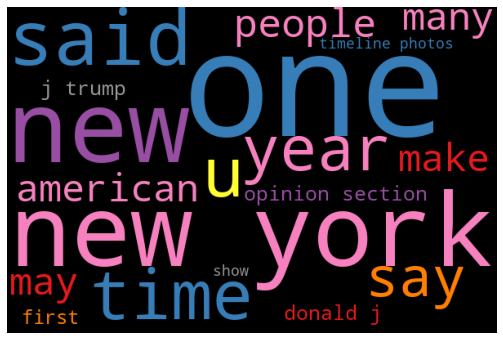

In [173]:
# Wordcloud for most common words in whole corpus, both stopwords
# and punctuation removed
nlp_prep.generate_wordcloud(docs=all_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='Entire Corpus')

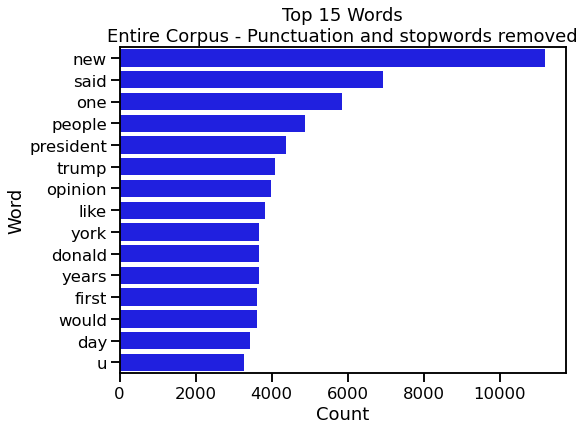

In [174]:
# Plot top 15 words across the entire corpus, punct and stopwords removed
nlp_prep.plot_wordfreqs(corpus_freq_df, 'Word', 'Count', 15, 
               "Entire Corpus - Punctuation and stopwords removed")

Looks like `new` and `york` are still pretty high up there. But if we're talking about the state or city, I'm not sure they should be removed.

### By Engagement Level

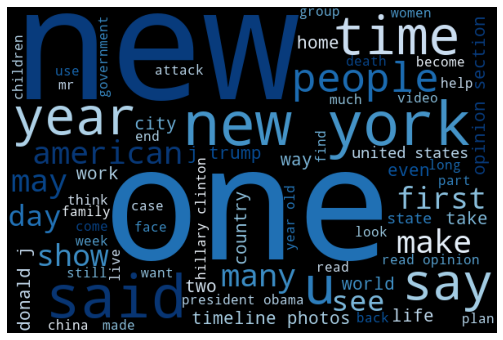

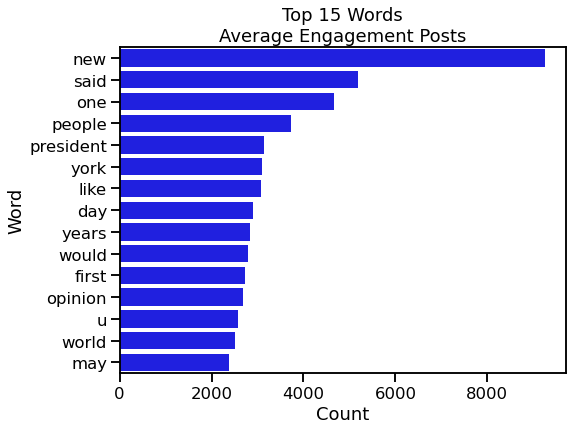

In [175]:
# get frequency distribution for posts with average engagement
avg_eng = FreqDist(token_dict[0])

avg_eng_freq_df = pd.DataFrame(avg_eng.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=token_dict[0], cmap="Blues", 
                   stopwords=None, min_font_size=14)

nlp_prep.plot_wordfreqs(avg_eng_freq_df, 'Word', 'Count', 15, 
               "Average Engagement Posts")

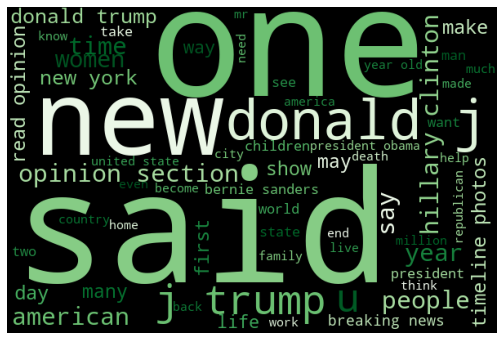

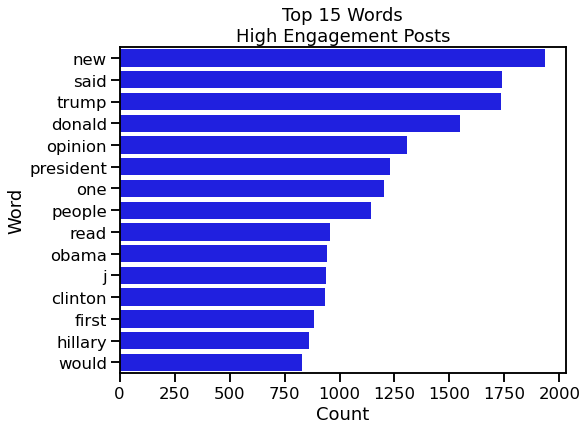

In [176]:
# get frequency distribution for posts with high engagement
high_eng = FreqDist(token_dict[1])

high_eng_freq_df = pd.DataFrame(high_eng.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=token_dict[1], cmap="Greens", 
                   stopwords=None, min_font_size=14)

nlp_prep.plot_wordfreqs(high_eng_freq_df, 'Word', 'Count', 15, 
               "High Engagement Posts")

Well I'm not totally surprised that the most common words and bigrams in the high engagement posts include `Donald J Trump`, `Obama`, and `Hillary Clinton`, given that this covers the time period running up to the 2016 presidential election.

That said, we have posts for just over 3 years, starting at the end of 2012, when it was far too early to talk about the 2016 election. Given, it seems like the Times wasn't posting as much in 2013; they really ramped up in 2014. It's possible that higher volumes of posts correlated with increased coverage of the 2016 election race.

Candidates didn't even begin to announce their candidacy [until March 2015](https://en.wikipedia.org/wiki/Timeline_of_the_2016_United_States_presidential_election#2014) at the earliest.

In [177]:
# How many posts were BEFORE March 2015?
print(len(df.loc[df['posted_at'] < 'March 1 2015', 'posted_at']))

# How many posts were AFTER March 2015?
print(len(df.loc[df['posted_at'] >= 'March 1 2015', 'posted_at']))

19373
28493


So 28k posts after March 1 2015, and 19k posts before. More posts after the election cycle started than before.

In [178]:
# what's the class distribution for posts before and after March 2015?

print(df.loc[df['posted_at'] < 'March 1 2015', 
             'all_binary'].value_counts(1))
print(df.loc[df['posted_at'] < 'March 1 2015', 
             'all_binary'].value_counts())

print()
# How many posts were AFTER March 2015?
print(df.loc[df['posted_at'] >= 'March 1 2015', 
             'all_binary'].value_counts(1))
print(df.loc[df['posted_at'] >= 'March 1 2015', 
             'all_binary'].value_counts(0))

0.0    0.876168
1.0    0.123832
Name: all_binary, dtype: float64
0.0    16974
1.0     2399
Name: all_binary, dtype: int64

0.0    0.723336
1.0    0.276664
Name: all_binary, dtype: float64
0.0    20610
1.0     7883
Name: all_binary, dtype: int64


The overall percentage of high engagement posts is 21.5%. Looks like only about 12% of posts before March 2015 were high engagement, compared to 27% after.

In [179]:
#  What are some examples of posts with `one` in them, since it ranks highly?
df.loc[df['cleaned'].str.contains(r'\b[Oo]ne\b'), ['cleaned']][5000:5005].values

array([["What Religion Would Jesus Belong To?. 'One puzzle of the world is that religions often don't resemble their founders,' writes Nicholas Kristof. Read on in The Opinion Section. Many faiths have lost sight of their founders' teachings."],
       ["Meet the -Year-Old Director Bringing Kanye West's Visions to Life. Eli Russell Linnetz is in the middle of a 'one-year residency with Kanye.'. The director Eli Russell Linnetz was when he first met the rapper."],
       ["British Radio Show 'The Archers' Divides Fans With Domestic Abuse Story Line. 'The story of Helen and Rob is a very ancient one and deep-seated in British culture, that of a violent man and an abused wife,' said the the editor of BBC The Archers. Set in a rural village, the BBC soap opera keeps finding ways to remain relevant. The trial of a character charged with attempting to murder her abusive husband has much of the nation buzzing."],
       ["Young Blacks Voice Skepticism on Hillary Clinton, Worrying Democrats. '

In [180]:
#  What are some examples of posts with `u` in them, since it ranks highly?
df.loc[df['cleaned'].str.contains(r'\b[Uu]\b'), ['cleaned']][:5].values

array([["Timeline Photos. Serena Williams defeated Victoria Azarenka to win the U. S. Open women's championship on Sunday. See more photos and read the recap of this championship match. (Photo by Chang W. Lee/The )"],
       ["Timeline Photos. Follow live updates from the U. S. Open Men's Final: Are you rooting for Novak Djokovic to repeat as U. S. Open champion or for Andy Murray (pictured) to win his first Grand Slam title?(Photo by Chang W. Lee/ The )"],
       ["Timeline Photos. Andy Murray defeated Novak Djokovic to win the U. S. Open Men's Championship, and his first Grand Slam title. See more photos and read the recap of this championship match. Photo: Andy Murray after he took the second set, - (Photo by Chang W. Lee /The )"],
       ["Timeline Photos. Photo: Andy Murray fended off a late rally by Novak Djokovic at the U. S. Open to win his first Grand Slam and become the first man from Britain to win a Grand Slam title since . (Photo by Chang W. Lee/The )'The crowd at Arthur A

That makes sense, it's being pulled out of `U.S.`.

## Word Frequencies for article text

## Combine Article Text

In [181]:
df['article_text'] = df['main_headline'].str.cat(df[['snippet', 'lead_paragraph']], 
                                             sep='. ', na_rep='')

In [182]:
df_articles = df.loc[df['is_matched']==1, ['article_text', 'section_name', 
        'word_count_cat', 'glocations', 'subject', 'persons', 'organizations',
        'has_person', 'has_org', 'has_geo', 'is_multimedia', 'on_weekend',
        'm_binary', 'm_multi', 'mean_pct', 'comments_pct', 'comments_count', 
        'likesloves_pct', 'likes_loves', 'shares_pct', 'shares_count']]

df_articles.head()

,article_text,section_name,word_count_cat,glocations,subject,persons,organizations,has_person,has_org,has_geo,...,on_weekend,m_binary,m_multi,mean_pct,comments_pct,comments_count,likesloves_pct,likes_loves,shares_pct,shares_count
0,Did Barack Obama Save Ohio?. Why the battle to...,Magazine,High,"[ohio, columbus (ohio), lorain (ohio), cincinn...","[automobiles, economic conditions and trends, ...","[kasich, john r, portman, rob, geithner, timot...",[jobsohio],1,1,1,...,1.0,0.0,1.0,0.313796,0.334089,44,0.316133,413,0.291167,68
1,The Weatherman Is Not a Moron. In the hocus-po...,Magazine,High,NaN,"[weather, books and literature, hurricanes and...","[richardson, lewis fry, lorenz, edward norton]","[national center for atmospheric research, int...",1,1,0,...,1.0,0.0,0.0,0.218147,0.076672,14,0.250366,338,0.327404,78
2,The Organic Fable. A study exposes the hype be...,Opinion,Average,[great britain],"[food, organic foods and products, medicine an...",NaN,NaN,0,0,1,...,1.0,0.0,1.0,0.722702,0.858710,290,0.550338,812,0.759057,421
4,"Pot for Parents. I am a more loving, attentive...",Opinion,Average,NaN,"[medical marijuana, marijuana, anxiety and str...",NaN,NaN,0,0,0,...,1.0,0.0,1.0,0.487263,0.540039,83,0.382620,502,0.539130,170
5,Obama Makes Birth Certificate Joke. Introduced...,U.S.,Low,[florida],[presidential election of 2012],"[obama, barack]",NaN,1,0,1,...,1.0,1.0,2.0,0.949853,0.947155,594,0.967284,9012,0.935121,1459


### Text Preprocessing

In [183]:
# back up all_text into cleaned
df_articles['cleaned'] = df_articles['article_text']

In [184]:
# check for links or URLs
df_articles.loc[df_articles['cleaned'].str.contains("http[^ ]+|www\.[^ ]+"), 
                'cleaned'][:5]

2093     Tournament Bracket and Forecast. Need help wit...
4326     Introducing The International New York Times. ...
4327     Introducing The International New York Times. ...
12173    Can a Social Network Stay Ad-Free?. Ello bills...
14510    Apple Cranberry Slab Pie. . A slab pie is noth...
Name: cleaned, dtype: object

In [185]:
df_articles.loc[2093, 'cleaned']

'Tournament Bracket and Forecast. Need help with your N.C.A.A. bracket? Nate Silver is estimating each team’s chance of advancing to any given stage of the N.C.A.A. bracket. View his estimates <a href="http://www.nytimes.com/interactive/2013/03/18/sports/ncaabasketball/nate-bracke.... Need help with your N.C.A.A. bracket? Nate Silver is estimating each team’s chance of advancing to any given stage of the N.C.A.A. bracket. View his estimates <a href="http://www.nytimes.com/interactive/2013/03/18/sports/ncaabasketball/nate-bracket.html#nytmm">as a table</a> and <a href="http://fivethirtyeight.blogs.nytimes.com/2013/03/18/parity-in-n-c-a-a-means-no-commanding-favorite/">read his pre-tournament analysis</a>.'

I see some HTML in here that I'll need to clean out.

In [186]:
from bs4 import BeautifulSoup

def remove_html_tags(doc):
    return BeautifulSoup(doc, 'html.parser').get_text()

df_articles['cleaned'] = df_articles['cleaned'].map(
    lambda x: remove_html_tags(x))

df_articles.loc[2093, 'cleaned']

'Tournament Bracket and Forecast. Need help with your N.C.A.A. bracket? Nate Silver is estimating each team’s chance of advancing to any given stage of the N.C.A.A. bracket. View his estimates as a table and read his pre-tournament analysis.'

In [187]:
# map doc cleaning function onto 'cleaned' column
# urls have been replaced with links
df_articles['cleaned'] = df_articles['cleaned'].map(
    lambda x: nlp_prep.clean_docs(x))

df_articles.loc[df_articles['article_text'].str.contains(
    "http[^ ]+|www\.[^ ]+"), 'cleaned'][:5].values

array(["Tournament Bracket and Forecast. Need help with your N.C.A.A. bracket? Nate Silver is estimating each team's chance of advancing to any given stage of the N.C.A.A. bracket. View his estimates as a table and read his pre-tournament analysis.",
       "Introducing The International New York Times. The move changes the name of The International Herald Tribune and strengthens The New York Times' 24-hour, global digital newsroom. Today we celebrate the debut of The International New York Times ( a news report tailored specifically for the valued members of our global audience.",
       "Introducing The International New York Times. The move changes the name of The International Herald Tribune and strengthens The New York Times' 24-hour, global digital newsroom. Today we celebrate the debut of The International New York Times ( a news report tailored specifically for the valued members of our global audience.",
       'Can a Social Network Stay Ad-Free?. Ello bills itself as proudly 

In [188]:
# check for non-ASCII characters
df_articles.loc[df_articles['article_text'].str.contains(r"[^\x00-\x7F]+"), 
                ['cleaned', 'article_text']][:5].values

array([['Did Barack Obama Save Ohio?. Why the battle to take credit for Ohio\'s ever-so-slightly above-average economy could swing the presidential election. The way John Kasich sees it, he is fulfilling a grand design, a mission for which he was chosen by God, to save Ohio. "It\'s like what what\'s-his-name told the hobbit," Ohio\'s Republican governor told me as we flew on the plane that ferries him around the state. "What\'s that guy\'s name? Gandel? Gandorf?" A pair of young aides seated across from Kasich called out helpfully over the drone of the engine. "Gandalf," Kasich repeated. "Do you remember what he told the hobbit?"',
        'Did Barack Obama Save Ohio?. Why the battle to take credit for Ohio’s ever-so-slightly above-average economy could swing the presidential election.. The way John Kasich sees it, he is fulfilling a grand design, a mission for which he was chosen by God, to save Ohio. “It’s like what what’s-his-name told the hobbit,” Ohio’s Republican governor told me

In [189]:
# check for number-only words
df_articles.loc[df_articles['cleaned'].str.contains(r"[$]*[0-9]+[,.:$%0-9]*\b"),
      ['article_text']][:5].values

array([['Debt Collectors Cashing In on Student Loans. In 2011 the Department of Education paid $1.4 billion to collection agencies to find defaulters, a group that includes nearly one in six borrowers with a balance.. At a protest last year at New York University, students called attention to their mounting debt by wearing T-shirts with the amount they owed scribbled across the front — $90,000, $75,000, $20,000.'],
       ['Five Crucial Factors to Watch, Just 58 Days From the Election. Two months before the election, President Obama and Mitt Romney agree on at least one thing: the collection of states where the race will be decided.. WASHINGTON — Two months before the election, President Obama and Mitt Romney agree on one thing: the collection of states where the race will be decided.'],
       ['Mow Yard. Drop Off Kids. Take a Drive on Mars.. As one member of the team that operates the remote rover Curiosity at NASA’s Jet Propulsion Laboratory put it, “Last night I drove on Mars, toda

In [190]:
# remove numbers-only words
df_articles = nlp_prep.pattern_match_in_df(df_articles, doc_col='cleaned', 
                hit_col='_', pattern=r"[$]*[0-9]+[,.:$%0-9]*\b", 
                out_type='none', replace=True)

In [191]:
# check for number-only words again, have they been removed?
df_articles.loc[df_articles['article_text'].str.contains(
    r"[$]*[0-9]+[,.:$%0-9]*\b"), ['article_text', 'cleaned']][:5].values

array([['Debt Collectors Cashing In on Student Loans. In 2011 the Department of Education paid $1.4 billion to collection agencies to find defaulters, a group that includes nearly one in six borrowers with a balance.. At a protest last year at New York University, students called attention to their mounting debt by wearing T-shirts with the amount they owed scribbled across the front — $90,000, $75,000, $20,000.',
        'Debt Collectors Cashing In on Student Loans. In the Department of Education paid billion to collection agencies to find defaulters, a group that includes nearly one in six borrowers with a balance. At a protest last year at New York University, students called attention to their mounting debt by wearing T-shirts with the amount they owed scribbled across the front , , .'],
       ['Five Crucial Factors to Watch, Just 58 Days From the Election. Two months before the election, President Obama and Mitt Romney agree on at least one thing: the collection of states where t

### Tokenize - No stopwords or punctuation removed

I'm using a tokenizer function that leverages the TweetTokenizer, as it's something I've used before for Tweet processing. Although these are not tweets, they are short text and may contains @mentions that the TweetTokenizer can take out for us.

In [192]:
# Create a dictionary of tokens with class labels as keys
# removing punctuation only
token_dict = nlp_prep.tokenize_corpus_dict_tweet(df_articles, [0, 1], 
            target_col='m_binary', stop_list=None, verbose=False)
token_dict[0][:5]

['did', 'barack', 'obama', 'save', 'ohio']

In [193]:
# create list of all word frequencies in the corpus
all_tokens = []
[all_tokens.extend(tokens) for tokens in token_dict.values()]

len(all_tokens)


3623483

In [194]:
# get frequency distribution for entire corpus
all_corpus = FreqDist(all_tokens)

corpus_freq_df = pd.DataFrame(all_corpus.most_common(100),
                              columns=['Word','Count'])
corpus_freq_df[:5]

,Word,Count
0,.,203755
1,the,178636
2,",",177194
3,a,103722
4,of,91429


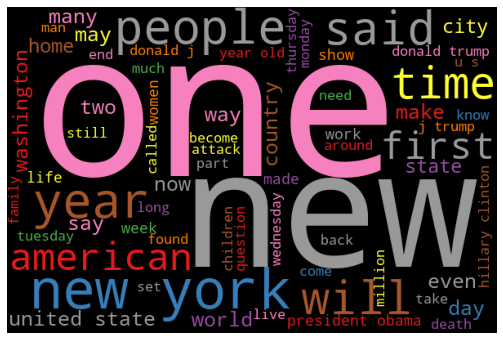

In [195]:
# Wordcloud for most common words in whole corpus, no stopwords
# or punctuation removed
nlp_prep.generate_wordcloud(docs=all_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='Entire Corpus')

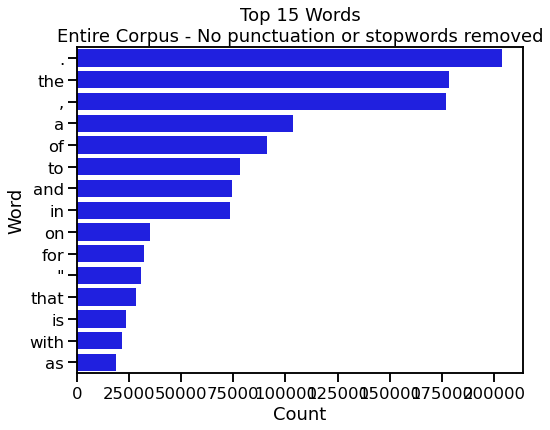

In [196]:
# Plot top 15 words across the entire corpus, no punctuation removed
nlp_prep.plot_wordfreqs(corpus_freq_df, 'Word', 'Count', 15, 
               "Entire Corpus - No punctuation or stopwords removed")

### Tokenize - stopwords and punctuation removed

In [197]:
# Create a dictionary of tokens with class labels as keys
# removing punctuation and stopwords
token_dict = nlp_prep.tokenize_corpus_dict_tweet(df_articles, [0, 1], 
            target_col='m_binary', stop_list=nltk_stopwords + punc, 
                                                 verbose=False)
token_dict[0][:5]

['barack', 'obama', 'save', 'ohio', 'battle']

In [198]:
# create list of all word frequencies in the corpus
all_tokens = []
[all_tokens.extend(tokens) for tokens in token_dict.values()]

len(all_tokens)


1890619

Wow, we've cut the total word count down to 1.9 MM from 3.5 MM.

In [199]:
# get frequency distribution for entire corpus
all_corpus = FreqDist(all_tokens)

corpus_freq_df = pd.DataFrame(all_corpus.most_common(100),
                              columns=['Word','Count'])
corpus_freq_df[:5]

,Word,Count
0,new,13876
1,one,8008
2,said,6276
3,years,5389
4,people,5348


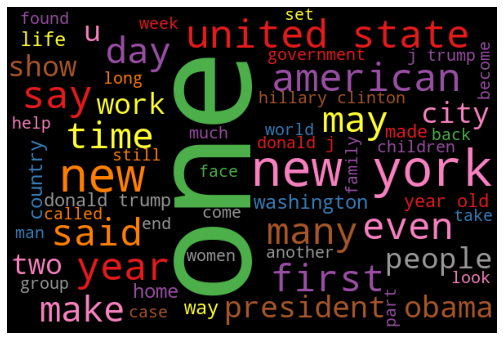

In [200]:
# Wordcloud for most common words in whole corpus, both stopwords
# and punctuation removed
nlp_prep.generate_wordcloud(docs=all_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='Entire Corpus')

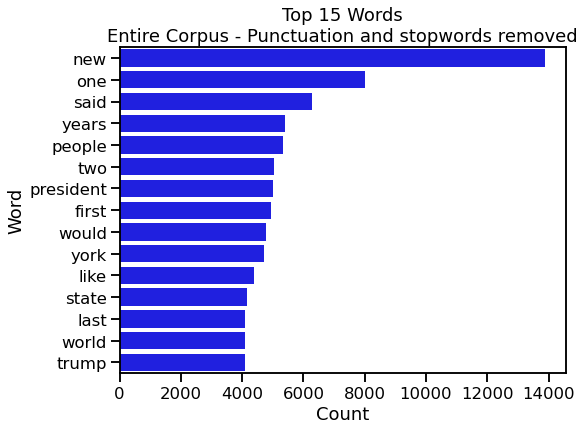

In [201]:
# Plot top 15 words across the entire corpus, no punctuation removed
nlp_prep.plot_wordfreqs(corpus_freq_df, 'Word', 'Count', 15, 
               "Entire Corpus - Punctuation and stopwords removed")

### By Engagement Level

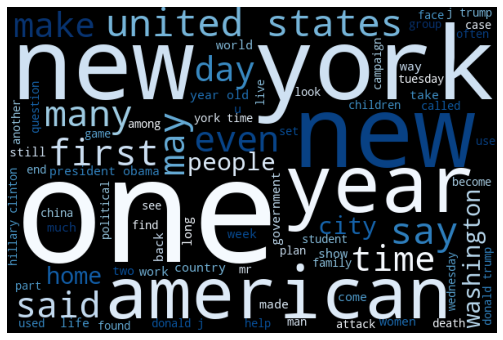

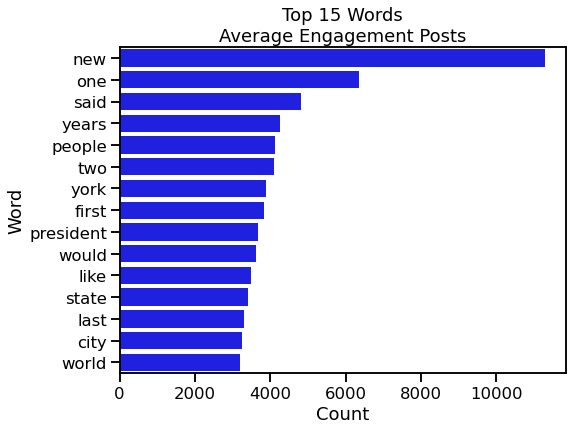

In [202]:
# get frequency distribution for articles with average engagement
avg_eng = FreqDist(token_dict[0])

avg_eng_freq_df = pd.DataFrame(avg_eng.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=token_dict[0], cmap="Blues", 
                   stopwords=None, min_font_size=14)

nlp_prep.plot_wordfreqs(avg_eng_freq_df, 'Word', 'Count', 15, 
               "Average Engagement Posts")

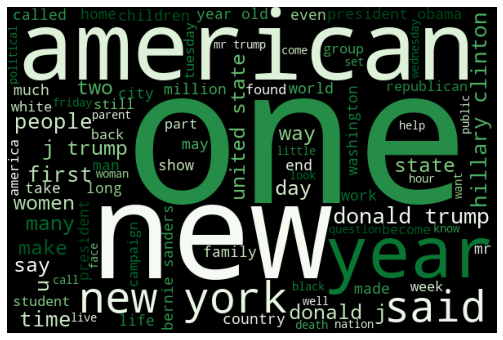

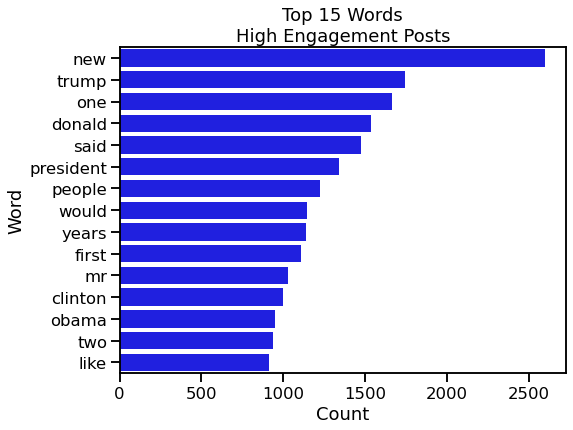

In [203]:
# get frequency distribution for posts with high engagement
high_eng = FreqDist(token_dict[1])

high_eng_freq_df = pd.DataFrame(high_eng.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=token_dict[1], cmap="Greens", 
                   stopwords=None, min_font_size=14)

nlp_prep.plot_wordfreqs(high_eng_freq_df, 'Word', 'Count', 15, 
               "High Engagement Posts")

In [204]:
#  What are some examples of posts with `one` in them, since it ranks highly?
df_articles.loc[df_articles['cleaned'].str.contains(r'\b[Oo]ne\b'), 
                ['cleaned']][5000:5005].values

array([['Decrease in Homeless Veterans in New York Far Outpaces National Drop. Even as homelessness has surged, the city has recorded a drop of percent in the number of veterans living in shelters or on the street since though some advocates question the counts. The bedraggled veteran draped in a flag, begging for spare change, has been one of the most persistent images of homelessness in this country.'],
       ['Experts Foresee Obstacles for Both Sides in Bill Cosby Case. Legal experts said the road to conviction was filled with significant hurdles, including a lack of forensic evidence related to the decade-old allegation by the woman at the center of the case. For years, as Bill Cosby and his lawyers aggressively rebutted accusations that he was a sexual predator, his defenders could point to one incontrovertible fact: He had never been charged with a crime.'],
       ["App Makers Reach Out to the Teenager on Mobile. One app's effort to understand its teenage audience illuminates t

## Keyword Frequencies

In [205]:
df_articles.columns

Index(['article_text', 'section_name', 'word_count_cat', 'glocations',
       'subject', 'persons', 'organizations', 'has_person', 'has_org',
       'has_geo', 'is_multimedia', 'on_weekend', 'm_binary', 'm_multi',
       'mean_pct', 'comments_pct', 'comments_count', 'likesloves_pct',
       'likes_loves', 'shares_pct', 'shares_count', 'cleaned'],
      dtype='object')

In [206]:
def visualize_tokens(token_list, title="Word Frequencies", cmap="Set1", 
                     show_viz=True):
    """Concatenates lists of tokens without further breaking them down, then
    creates frequency visualizations.
    
    `tokens` should be a list of lists of tokens; no nulls.
    """
    
    # create list of all word frequencies in the corpus
    all_tokens = []
    [all_tokens.extend(tokens) for tokens in token_list]

    # get frequency distribution for entire corpus
    all_corpus = FreqDist(all_tokens)

    freq_df = pd.DataFrame(all_corpus.most_common(100),
                                  columns=['Token','Count'])
    
    if show_viz:

        # Wordcloud for most common words in whole corpus, both stopwords
        # and punctuation removed
        nlp_prep.generate_wordcloud(docs=all_tokens, cmap=cmap, 
                           stopwords=None, min_font_size=16, 
                          title=title)

        # Plot top 15 words across the entire corpus, no punctuation removed
        nlp_prep.plot_wordfreqs(freq_df, 'Token', 'Count', 15, 
                       title)
    
    return freq_df

### Subjects

In [207]:
# how many unique subjects are there?
all_tokens = []
[all_tokens.extend(tokens) for tokens in list(df_articles.loc[
            df_articles['subject'].isna()==False, 'subject'].values)]

unique_subjects = list(set(all_tokens))
print(len(all_tokens))
print(len(unique_subjects))

127362
3369


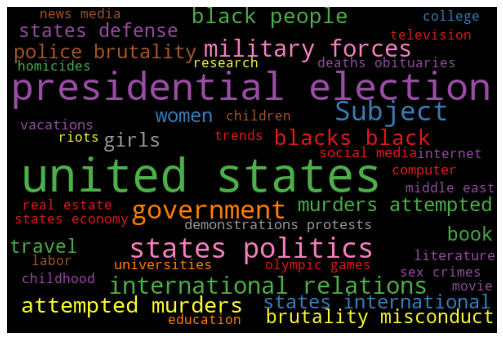

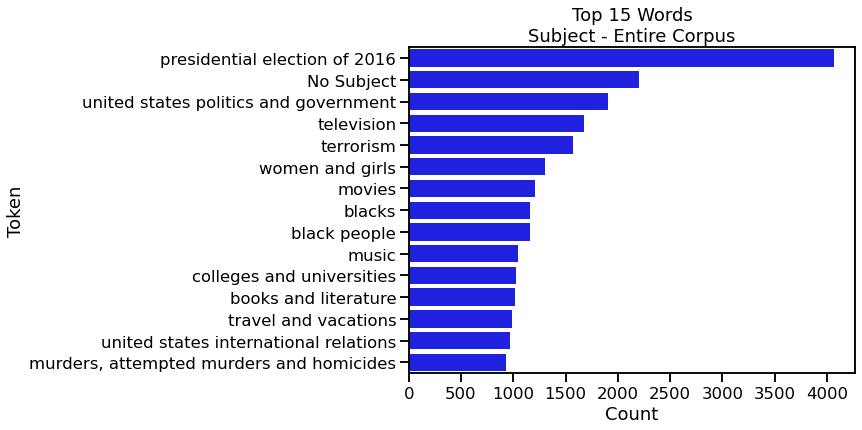

In [208]:
subject_freq_df = visualize_tokens(list(df_articles.loc[
                    df_articles['subject'].isna()==False, 'subject'].values), 
                    title='Subject - Entire Corpus', cmap="Set1")


### Glocations

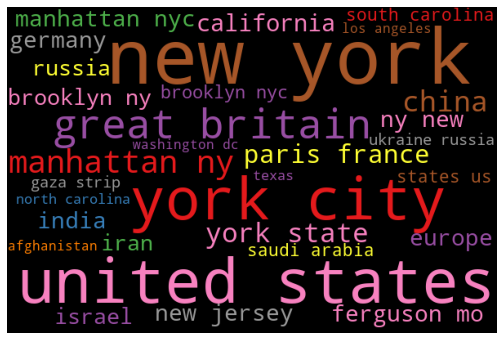

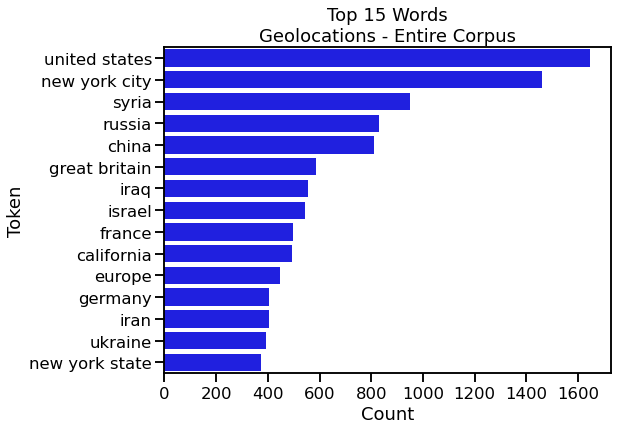

In [209]:
locations_freq_df = visualize_tokens(list(df_articles.loc[
            df_articles['glocations'].isna()==False, 'glocations'].values), 
            title='Geolocations - Entire Corpus', cmap="Set1")

### Organizations

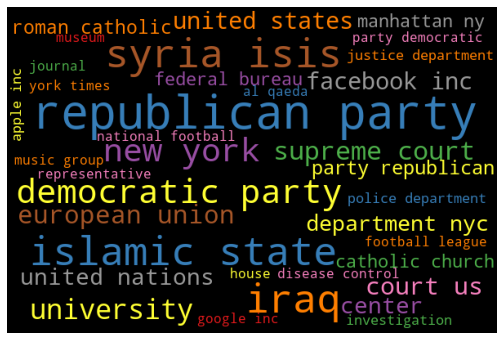

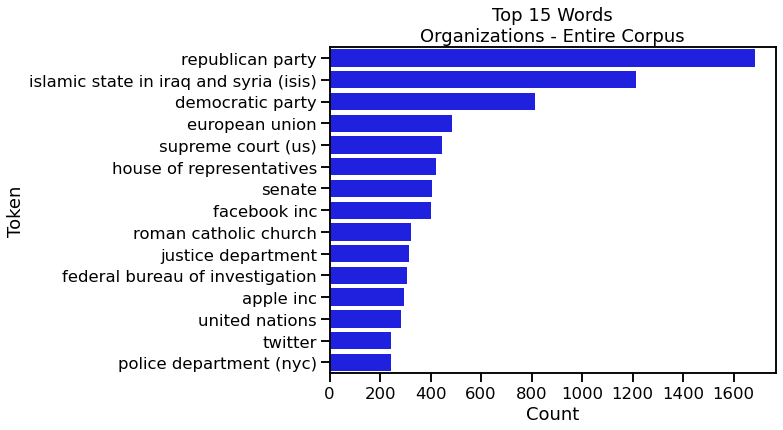

In [210]:
orgs_freq_df = visualize_tokens(list(df_articles.loc[
            df_articles['organizations'].isna()==False, 'organizations'].values), 
            title='Organizations - Entire Corpus', cmap="Set1")


### People

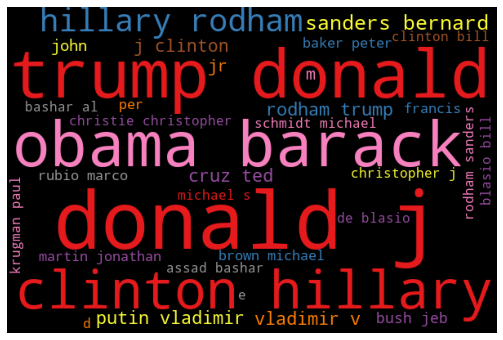

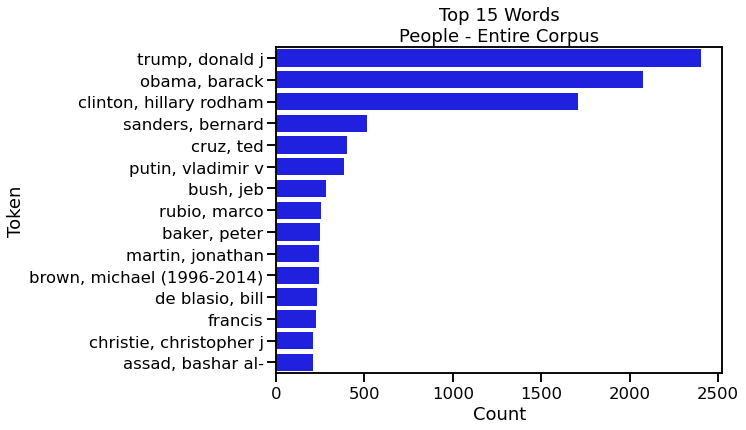

In [211]:
people_freq_df = visualize_tokens(list(df_articles.loc[
            df_articles['persons'].isna()==False, 'persons'].values), 
            title='People - Entire Corpus', cmap="Set1")


### By Engagement Level - Subject

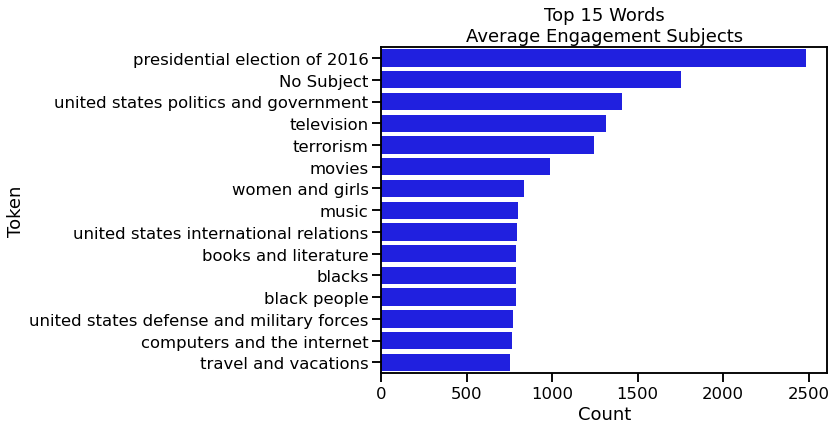

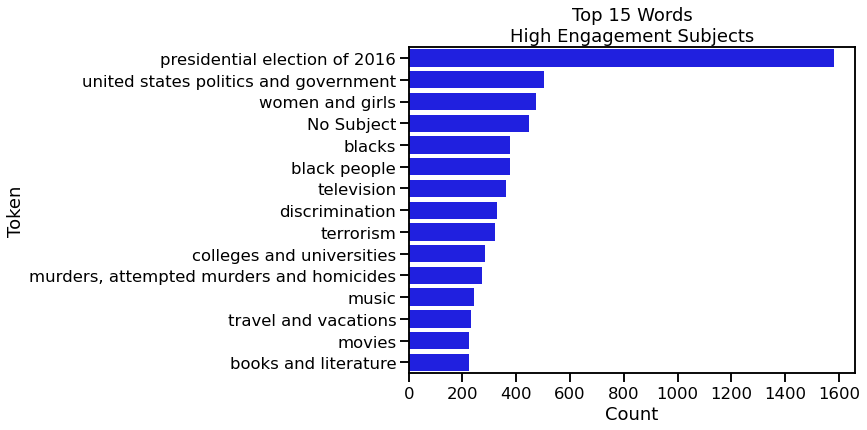

In [212]:
subject_avg = visualize_tokens(list(df_articles.loc[
        (df_articles['subject'].isna()==False) & 
        (df_articles['m_binary']==0), 'subject'].values),
        show_viz=False)

subject_high = visualize_tokens(list(df_articles.loc[
        (df_articles['subject'].isna()==False) & 
        (df_articles['m_binary']==1), 'subject'].values),
        show_viz=False)

nlp_prep.plot_wordfreqs(subject_avg, 'Token', 'Count', 15, 
               "Average Engagement Subjects")

nlp_prep.plot_wordfreqs(subject_high, 'Token', 'Count', 15, 
               "High Engagement Subjects")

### By Engagement Level - Glocations

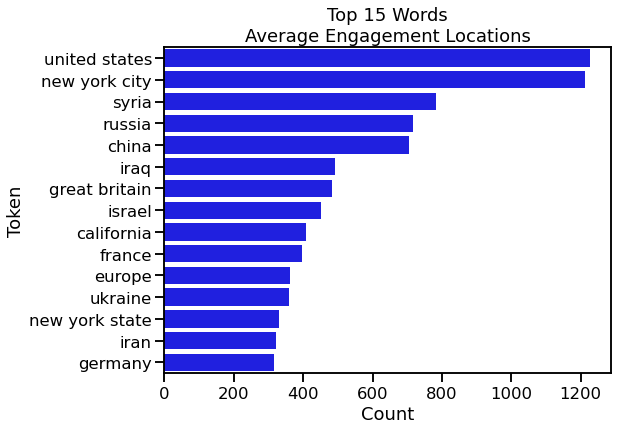

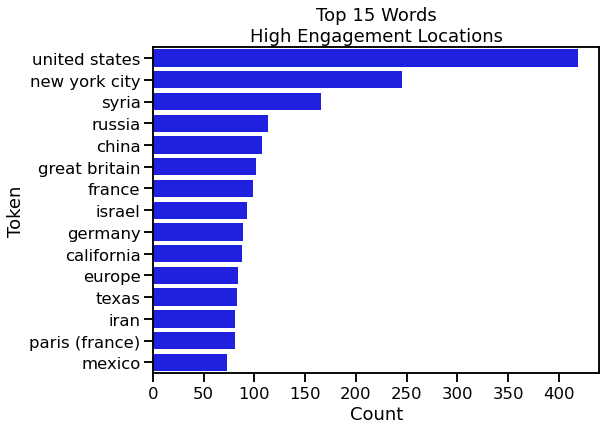

In [213]:
geo_avg = visualize_tokens(list(df_articles.loc[
        (df_articles['glocations'].isna()==False) & 
        (df_articles['m_binary']==0), 'glocations'].values),
        show_viz=False)

geo_high = visualize_tokens(list(df_articles.loc[
        (df_articles['glocations'].isna()==False) & 
        (df_articles['m_binary']==1), 'glocations'].values),
        show_viz=False)

nlp_prep.plot_wordfreqs(geo_avg, 'Token', 'Count', 15, 
               "Average Engagement Locations")

nlp_prep.plot_wordfreqs(geo_high, 'Token', 'Count', 15, 
               "High Engagement Locations")

### By Engagement Level - Organizations

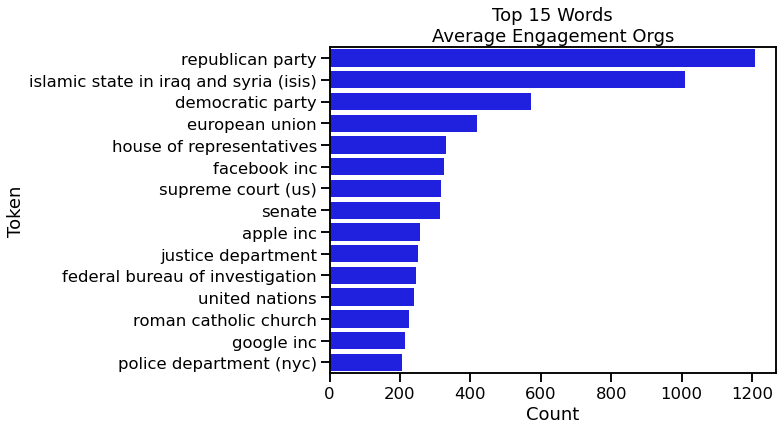

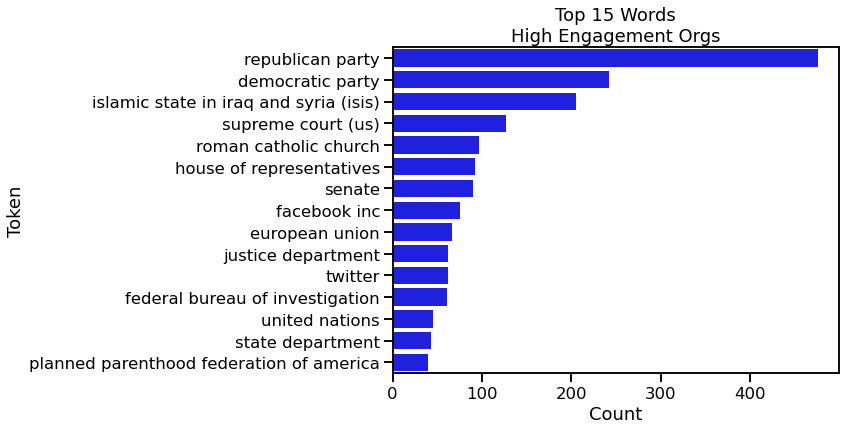

In [214]:
org_avg = visualize_tokens(list(df_articles.loc[
        (df_articles['organizations'].isna()==False) & 
        (df_articles['m_binary']==0), 'organizations'].values),
        show_viz=False)

org_high = visualize_tokens(list(df_articles.loc[
        (df_articles['organizations'].isna()==False) & 
        (df_articles['m_binary']==1), 'organizations'].values),
        show_viz=False)

nlp_prep.plot_wordfreqs(org_avg, 'Token', 'Count', 15, 
               "Average Engagement Orgs")

nlp_prep.plot_wordfreqs(org_high, 'Token', 'Count', 15, 
               "High Engagement Orgs")

### By Engagement Level - People

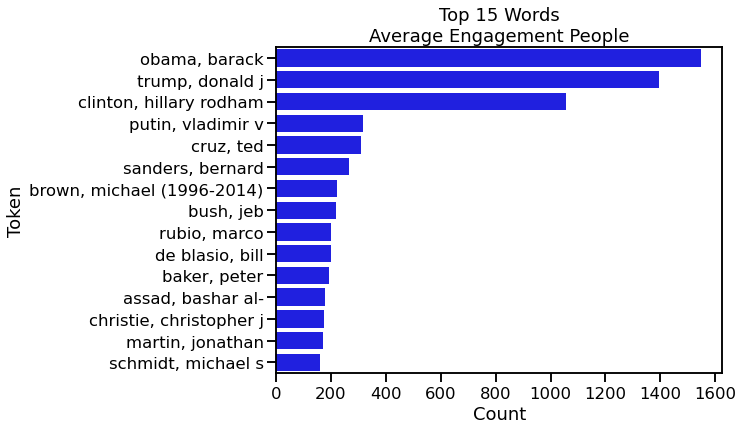

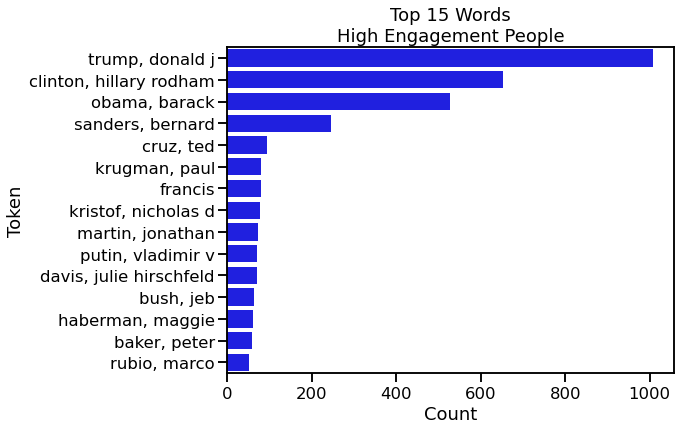

In [215]:
people_avg = visualize_tokens(list(df_articles.loc[
        (df_articles['persons'].isna()==False) & 
        (df_articles['m_binary']==0), 'persons'].values),
        show_viz=False)

people_high = visualize_tokens(list(df_articles.loc[
        (df_articles['persons'].isna()==False) & 
        (df_articles['m_binary']==1), 'persons'].values),
        show_viz=False)

nlp_prep.plot_wordfreqs(people_avg, 'Token', 'Count', 15, 
               "Average Engagement People")

nlp_prep.plot_wordfreqs(people_high, 'Token', 'Count', 15, 
               "High Engagement People")

I don't see much difference in the top entities between high and average engagement.

## Consolidate Rare Categories

In initial modeling, I ran into issues where there were `post_type` and `section_name` values in test that weren't in train. I'm going to combine all rare categories to hopefully avoid this.

In [216]:
df['post_type'].value_counts()

link      42785
photo      2340
video      2062
status      666
event        12
note          1
Name: post_type, dtype: int64

In [217]:
main_cats = ['photo', 'video', 'link']
df.loc[~df['post_type'].isin(main_cats), 'post_type'] = 'other'

In [218]:
df['post_type'].value_counts()

link     42785
photo     2340
video     2062
other      679
Name: post_type, dtype: int64

In [219]:
section_cats = df_articles['section_name'].value_counts()
section_cats

U.S.                          8314
World                         6811
Opinion                       4616
Sports                        2662
New York                      2586
Arts                          2501
Business Day                  2410
Health                        1614
Fashion & Style               1379
Science                       1280
The Upshot                    1229
Magazine                      1154
Technology                    1056
Travel                         762
Cooking                        737
Movies                         655
Food                           581
Books                          422
Multimedia/Photos              330
T Magazine                     286
Style                          282
Theater                        253
Education                      189
Your Money                     188
Real Estate                    180
Blogs                          165
NYT Now                        144
Sunday Review                   79
Well                

In [220]:
rare_sections = section_cats[section_cats < 100].index

df_articles.loc[df_articles['section_name'].isin(rare_sections), 
                'section_name'] = 'Other'

df_articles['section_name'].value_counts()

U.S.                 8314
World                6811
Opinion              4616
Sports               2662
New York             2586
Arts                 2501
Business Day         2410
Health               1614
Fashion & Style      1379
Science              1280
The Upshot           1229
Magazine             1154
Technology           1056
Travel                762
Cooking               737
Movies                655
Food                  581
Other                 441
Books                 422
Multimedia/Photos     330
T Magazine            286
Style                 282
Theater               253
Education             189
Your Money            188
Real Estate           180
Blogs                 165
NYT Now               144
Name: section_name, dtype: int64

## Summary of Explore before First Modeling

I will create my initial model using Facebook post and metadata for all posts. Separately, I will model the article text and metadata for posts I was able to match to actual articles.

I will model matched versus unmatched posts separately.

I included both text represented as a bag of words, as well as categorical metadata in the same model. Since I will normalize the text vectors and use one-hot-encoding, I believe these will be similar enough to include in a model and compare features.

In [393]:
# Dump cleaned data for all posts versus matched articles for use in
# another notebook (colab0)
f = gzip.open('data/cleaned_data.pickle.gz','wb')
pickle.dump(df, f)
f.close()

f = gzip.open('data/cleaned_article_data.pickle.gz','wb')
pickle.dump(df_articles, f)
f.close()

# Model Facebook Posts Only

Initially, I used a target consisting of outliers, and gridsearched for the best hyperparameters using Multinomial Bayes and Logistic Regression without lemmatization. Logistic Regression slightly outperformed Multinomial Bayes.

I took the best params from the LR model using outlier-based target, and experimented with lemmas as well as modeling only text or only metadata. I then applied the best model so far (with lemmatization and text only) to the target using over 75th percentile and it performed better.

Performance didn't get much above 60% for the target class, so I decided to adjust the binary percentile target to use the mean percentile across all categories instead of the max. I also decided to create a multi-class target to see how that performed.

Generally, the best parameters for Logistic Regression were:
- using Tfidf normalization for the text 
- (1,2) ngrams
- 10,000 max features
- C = 0.1 (1.0 might get slightly better recall but is more overfit)
- saga solver
- fit_intercept = False

Text vectorization tended to take quite a while with lemmatization, which made the gridsearching too time-consuming if I wanted to experiment with vectorization parameters such as different stopwords lists, using/not using Tfidf normalization, using/not using lemmatization, and using different numbers of max features. Ultimately, since the best parameters for both the full set of Facebook posts and the text of the matched articles were the same, I decided to apply those up front. I  considered these my baseline models.

I then ran gridsearching using the text vectorization parameters with the model parameters held constant. I compared the results of the best gridsearch params to the baseline models. Ultimately, I wasn't able to find better parameters, so the original models were kept as the best performing.

In [222]:
df.columns

Index(['id', 'name', 'message', 'description', 'caption', 'post_type',
       'status_type', 'comments_count', 'shares_count', 'link', 'posted_at',
       'print_section', 'print_page', 'snippet', 'lead_paragraph',
       'main_headline', 'news_desk', 'section_name', 'type_of_material',
       'word_count', 'glocations', 'subject', 'persons', 'organizations',
       'creative_works', 'is_matched', 'all_text', 'likes_loves',
       'shares_outliers', 'comments_outliers', 'likelove_outliers',
       'comments_pct', 'shares_pct', 'likesloves_pct', 'max_pct', 'mean_pct',
       'all_binary', 'all_multi', 'comments_pct_m', 'shares_pct_m',
       'likesloves_pct_m', 'max_pct_m', 'mean_pct_m', 'm_binary', 'm_multi',
       'is_interactive', 'is_video', 'is_slideshow', 'word_count_cat',
       'has_person', 'has_org', 'has_geo', 'is_multimedia', 'day_name',
       'month', 'hour', 'year', 'hour_cat', 'on_weekend', 'text_hash',
       'cleaned', 'article_text'],
      dtype='object')

## Different stopwords and punc

I noticed that many of the posts I couldn't match to articles included questions to readers, and asked them to give their opinion in comments. I'm going to remove the question mark and the you/your permutations from the stopwords list to see whether keeping these in affect model performance.

In [223]:
you_list = ['you', "you'd", "you'll", "you're", "you've", 'your', 'yours',
            'yourself', 'yourselves']
custom_stopwords = [word for word in nltk_stopwords if word not in you_list]

custom_punc = punc.copy()
custom_punc.remove('?')

## Preprocessing

In [224]:
# constants for column names involved
text_col = 'cleaned'
cat_cols = ['post_type', 'hour_cat', 'on_weekend']

In [225]:
# initial X and y set for all posts
X = df[[text_col] + cat_cols]
y = df['all_binary']

In [226]:
# 0 is average, 1 is high engagement
class_labels = ['Average', 'High Engagement']

# 0 is average, 1 is moderate, 2 is high
mclass_labels = ['Average', 'Moderate', 'High']

In [227]:
# train test split
X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(X, y, 
                                            test_size=0.2, stratify=y)
print(len(X_train_all))
print(len(y_train_all))
print(len(X_test_all))
print(len(y_test_all))

38292
38292
9574
9574


I will want to be able to use the same train-test split for binary as I do for multi-class, so they will be directly comparable.

Thankfully, the indexes in the split dfs stay the same as the original df, so I should be able to generate the same y_train and y_test splits using the multi-class target.

In [228]:
# Create multi-class y_train using the same indices as binary
y_train_all_multi = df[df.index.isin(y_train_all.index)]['all_multi']
y_train_all_multi = y_train_all_multi.reindex(index=list(y_train_all.index))

# Create multi-class y_test using the same indices as binary
y_test_all_multi = df[df.index.isin(y_test_all.index)]['all_multi']
y_test_all_multi = y_test_all_multi.reindex(index=list(y_test_all.index))

In [229]:
print(y_train_all_multi.isna().sum())
y_test_all_multi.isna().sum()

0


0

### Which categories will be dropped as first?

In [230]:
print(X['post_type'].unique())

['link' 'photo' 'other' 'video']


The first will be `link`, which most of the posts.

In [231]:
print(X['hour_cat'].unique())

['3_Midday (11-15)' '4_Afternoon (15-19)' '5_Evening (19-23)'
 '2_Morning (7-11)' '6_Late night (23-3)' '1_Early morning (3-7)']


The first will be Early Morning, which is rare.

## Transform X up front

To save time gridsearching and evaluating models based on model hyperparameters only.

In [232]:
# Transform text and cat cols ahead of time to save time when gridsearching
# further
txt_trans_pipe = Pipeline([
    ('vect', CountVectorizer(tokenizer=nlp_prep.tokenize_lemma,
                            stop_words=custom_stopwords + custom_punc,
                            ngram_range=(1, 2),
                            max_features=10000)),
    ('tfidf', TfidfTransformer())
])

# NOTE: The text transformers expect a single column, in a 1-D array.
# If you pass a list of strings as column names for the text transformer,
# it will crap out because it will receive a 2D array...
all_cols_trans = ColumnTransformer([
    ('ohe', OneHotEncoder(drop='first'), cat_cols),
    ('txt', txt_trans_pipe, text_col)
])

X_train_all_t = all_cols_trans.fit_transform(X_train_all)
X_test_all_t = all_cols_trans.transform(X_test_all)

/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['far'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


In [233]:
# Path I'm going to use to save best estimators from gridsearching
save_path = "models/"

In [234]:
rerun_grid = False

## Baseline Dummy Classifiers

### Binary

****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.79      0.79      0.79     30067
         1.0       0.22      0.22      0.22      8225

    accuracy                           0.67     38292
   macro avg       0.50      0.50      0.50     38292
weighted avg       0.66      0.67      0.66     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.79      0.79      0.79      7517
         1.0       0.22      0.22      0.22      2057

    accuracy                           0.66      9574
   macro avg       0.50      0.50      0.50      9574
weighted avg       0.66      0.66      0.66      9574


****************************** Training Scores ******************************
                  Training F1 = [0.7872 0.217 ]
              Training Recall = [0.7884 0.2158]
            Training A

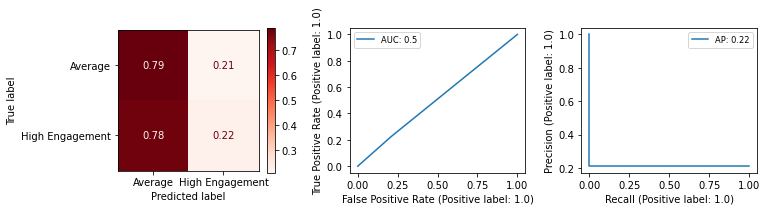

In [235]:
# Let's make a baseline classifier using the dummy model
dummy_clf = DummyClassifier(strategy='stratified')

dummy_clf.fit(X_train_all_t, y_train_all)

model_eval.eval_clf_model(dummy_clf, X_test_all_t, y_test_all, X_train_all_t, 
            y_train_all, labels=class_labels, score='std')

### Multi-class

****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.21      0.21      0.21      8111
         1.0       0.57      0.58      0.58     21956
         2.0       0.21      0.21      0.21      8225

    accuracy                           0.42     38292
   macro avg       0.33      0.33      0.33     38292
weighted avg       0.42      0.42      0.42     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.21      0.21      0.21      2103
         1.0       0.56      0.56      0.56      5414
         2.0       0.22      0.22      0.22      2057

    accuracy                           0.41      9574
   macro avg       0.33      0.33      0.33      9574
weighted avg       0.41      0.41      0.41      9574


****************************** Training Scores ******************************
          

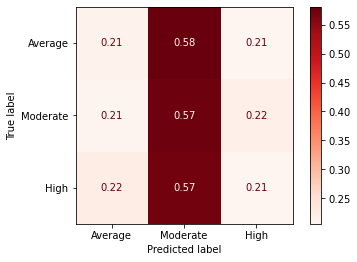

In [236]:
dummy_clf.fit(X_train_all_t, y_train_all_multi)

model_eval.eval_clf_model(dummy_clf, X_test_all_t, y_test_all_multi, 
        X_train_all_t, y_train_all_multi, labels=mclass_labels, score='std')

## Multinomial Bayes

### Baseline Binary

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.2s finished


0.5855319148936171
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.91      0.74      0.81     30067
         1.0       0.43      0.72      0.54      8225

    accuracy                           0.73     38292
   macro avg       0.67      0.73      0.68     38292
weighted avg       0.80      0.73      0.75     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.87      0.71      0.78      7517
         1.0       0.36      0.60      0.45      2057

    accuracy                           0.69      9574
   macro avg       0.61      0.65      0.62      9574
weighted avg       0.76      0.69      0.71      9574


****************************** Training Scores ******************************
                  Training F1 = [0.8134 0.5388]
              Training Recall = [0.7375 0.7227]
   

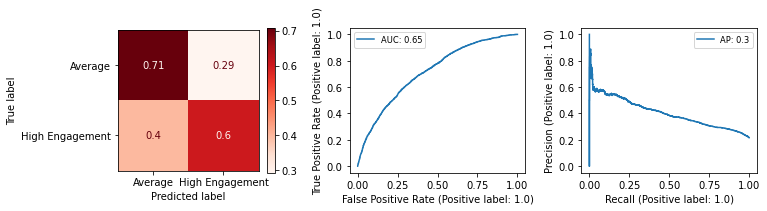

In [237]:
clf_mnb = MultinomialNB(fit_prior=False, alpha=0.5)

cv_scores = cross_val_score(clf_mnb, X_train_all_t, y_train_all, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

clf_mnb.fit(X_train_all_t, y_train_all)

model_eval.eval_clf_model(clf_mnb, X_test_all_t, y_test_all, X_train_all_t, 
            y_train_all, labels=class_labels, score='std')

### Baseline Multi-class

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished


0.5019858810421092
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.49      0.68      0.57      8111
         1.0       0.76      0.53      0.63     21956
         2.0       0.46      0.66      0.55      8225

    accuracy                           0.59     38292
   macro avg       0.57      0.63      0.58     38292
weighted avg       0.64      0.59      0.60     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.40      0.53      0.46      2103
         1.0       0.63      0.45      0.53      5414
         2.0       0.37      0.52      0.43      2057

    accuracy                           0.48      9574
   macro avg       0.47      0.50      0.47      9574
weighted avg       0.52      0.48      0.49      9574


****************************** Training Scores **********************

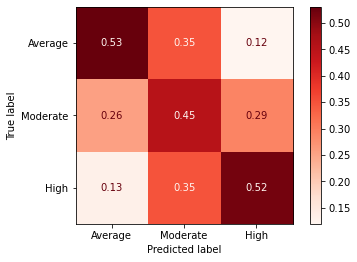

In [238]:
clf_mnb_multi = MultinomialNB(fit_prior=False, alpha=0.5)

cv_scores = cross_val_score(clf_mnb_multi, X_train_all_t, y_train_all_multi, 
            n_jobs=-1, scoring='recall_macro', verbose=1, error_score='raise')
print(np.mean(cv_scores))

clf_mnb_multi.fit(X_train_all_t, y_train_all_multi)

model_eval.eval_clf_model(clf_mnb_multi, X_test_all_t, y_test_all_multi,  
        X_train_all_t, y_train_all_multi, labels=mclass_labels, score='std')

## Logistic Regression

### Baseline Binary

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.1s finished


0.6062006079027357
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.90      0.71      0.79     30067
         1.0       0.39      0.70      0.50      8225

    accuracy                           0.70     38292
   macro avg       0.64      0.70      0.65     38292
weighted avg       0.79      0.70      0.73     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.87      0.69      0.77      7517
         1.0       0.36      0.63      0.45      2057

    accuracy                           0.67      9574
   macro avg       0.61      0.66      0.61      9574
weighted avg       0.76      0.67      0.70      9574


****************************** Training Scores ******************************
                  Training F1 = [0.7895 0.5034]
              Training Recall = [0.7062 0.6976]
   

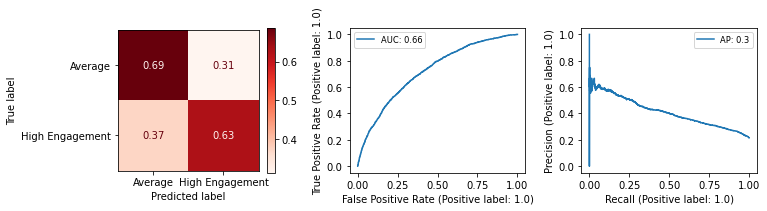

In [239]:
clf_lr = LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1)

cv_scores = cross_val_score(clf_lr, X_train_all_t, y_train_all, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

clf_lr.fit(X_train_all_t, y_train_all)

model_eval.eval_clf_model(clf_lr, X_test_all_t, y_test_all, X_train_all_t, 
            y_train_all, labels=class_labels, score='std')

### Gridsearch for Binary - no lemmas
### *** Best All Binary ***

/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator CountVectorizer from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator TfidfTransformer from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.

[('cols_trans', ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                 ['post_type', 'hour_cat', 'on_weekend']),
                                ('txt',
                                 Pipeline(steps=[('vect',
                                                  CountVectorizer(max_features=10000,
                                                                  ngram_range=(1,
                                                                               2),
                                                                  stop_words=['a',
                                                                              'about',
                                                                              'above',
                                                                              'after',
                                                                              'again',
                                                            

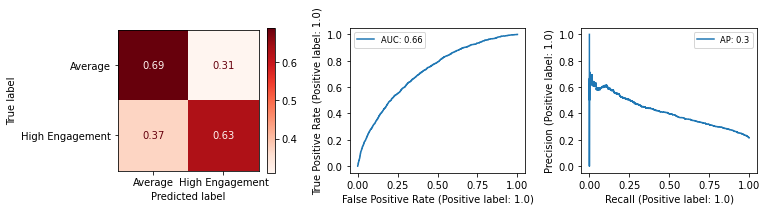

In [240]:
# Gridsearch was run in colab notebook, where I searched vectorization 
# parameters with no lemmatization. This just loads the best estimator.
# using the non-transformed X's since the gridsearch will do the transformation

gsfile_name = 'GSObject_LR_all_binary.joblib.gz'

best_LR_all_binary_pipe, best_LR_all_binary_gs = model_eval.\
        load_rebuild_eval_bestpipe(gsfile_name, X_train_all, y_train_all, 
        X_test_all, y_test_all, class_labels, load_path=save_path)

In [241]:
# what is the version of stopwords used?
best_LR_all_binary_pipe.named_steps['cols_trans'].named_transformers_['txt']\
    .named_steps['vect'].get_stop_words()


frozenset({'!',
           '"',
           '#',
           '$',
           '%',
           '&',
           "'",
           '(',
           ')',
           '*',
           '+',
           ',',
           '-',
           '.',
           '/',
           ':',
           ';',
           '<',
           '=',
           '>',
           '@',
           '[',
           '\\',
           ']',
           '^',
           '_',
           '`',
           'a',
           'about',
           'above',
           'after',
           'again',
           'against',
           'ain',
           'all',
           'am',
           'an',
           'and',
           'any',
           'are',
           'aren',
           "aren't",
           'as',
           'at',
           'be',
           'because',
           'been',
           'before',
           'being',
           'below',
           'between',
           'both',
           'but',
           'by',
           'can',
           'couldn',
           "could

The custom stopwords list (not including `?` or permutations of `your` was best, and lemmatization didn't add to performance.

The best binary classifier was ultimately using the same params I initially identified by experimenting with model params.

### Baseline Multi-class

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.2s finished


0.5121656070772158
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.44      0.70      0.54      8111
         1.0       0.77      0.43      0.55     21956
         2.0       0.43      0.68      0.53      8225

    accuracy                           0.54     38292
   macro avg       0.55      0.60      0.54     38292
weighted avg       0.63      0.54      0.54     38292


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.38      0.58      0.46      2103
         1.0       0.64      0.37      0.47      5414
         2.0       0.37      0.59      0.45      2057

    accuracy                           0.46      9574
   macro avg       0.46      0.51      0.46      9574
weighted avg       0.53      0.46      0.46      9574


****************************** Training Scores **********************

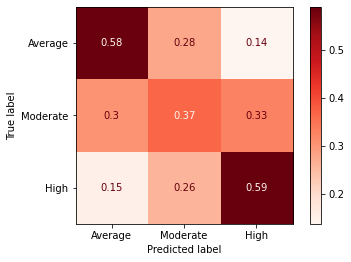

In [242]:
clf_lr = LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1)

cv_scores = cross_val_score(clf_lr, X_train_all_t, y_train_all_multi, n_jobs=-1, 
                            scoring='recall_macro', verbose=1)
print(np.mean(cv_scores))

clf_lr.fit(X_train_all_t, y_train_all_multi)

model_eval.eval_clf_model(clf_lr, X_test_all_t, y_test_all_multi, X_train_all_t, 
            y_train_all_multi, labels=mclass_labels, score='std')

### Gridsearch for Multi-class - no lemmas
### *** Best All Multi ***

/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator CountVectorizer from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator TfidfTransformer from version 0.22.2.post1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/base.

[('cols_trans', ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                 ['post_type', 'hour_cat', 'on_weekend']),
                                ('txt',
                                 Pipeline(steps=[('vect',
                                                  CountVectorizer(max_features=10000,
                                                                  ngram_range=(1,
                                                                               2),
                                                                  stop_words=['a',
                                                                              'about',
                                                                              'above',
                                                                              'after',
                                                                              'again',
                                                            

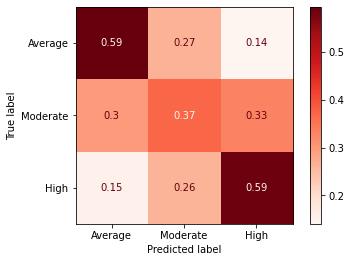

In [243]:
gsfile_name = 'GSObject_LR_all_multi.joblib.gz'

best_LR_all_multi_pipe, best_LR_all_multi_gs = model_eval.\
        load_rebuild_eval_bestpipe(gsfile_name, X_train_all, y_train_all_multi, 
        X_test_all, y_test_all_multi, mclass_labels, load_path=save_path)

In [244]:
# what is the version of stopwords used?
best_LR_all_multi_pipe.named_steps['cols_trans'].named_transformers_['txt']\
    .named_steps['vect'].get_stop_words()

frozenset({'!',
           '"',
           '#',
           '$',
           '%',
           '&',
           "'",
           '(',
           ')',
           '*',
           '+',
           ',',
           '-',
           '.',
           '/',
           ':',
           ';',
           '<',
           '=',
           '>',
           '@',
           '[',
           '\\',
           ']',
           '^',
           '_',
           '`',
           'a',
           'about',
           'above',
           'after',
           'again',
           'against',
           'ain',
           'all',
           'am',
           'an',
           'and',
           'any',
           'are',
           'aren',
           "aren't",
           'as',
           'at',
           'be',
           'because',
           'been',
           'before',
           'being',
           'below',
           'between',
           'both',
           'but',
           'by',
           'can',
           'couldn',
           "could

Custom stopwords again.

### LR results

The best binary LR identifies about 60% of high engagement posts correctly, and about 68% of average engagement posts correctly. As a reminder, for binary target, `high` defines posts with mean percentiles across all three engagement metrics greater than 75.

- Stopwords list that does not include permutations of `your` or `?` performs better than NLTK according to gridsearch optimized for recall.
- TF-IDF transformation does better than regular count or binary
- N-grams (1,2) are still better than (1,1), and max features 10k are better than 100k or no limit
- There is a slight performance difference between lemmatizing versus not, but not very much. Using regular Tweet Tokenizer is slightly better, and is also easier to interpret.

The best multi-class LR finds about ~60% of Average and High engagement posts correctly, but only about 37% of Moderate. For the multi-class target, High engagement is defined the same way as binary, but Average is defined as mean percentile under 25%, and Moderate is mean percentile between 25% and 75%.

In multi-class, posts are mis-classified fairly evenly. Both High and Average are mis-classified as Moderate most frequently (about 30%) but are confused for each other only about 14%.

- As with binary, the best params are custom stopwords TF-IDF text vectorization normalization, (1,2) n-grams, and 10k feature limit.
- Regular tweet-tokenizer actually did slightly better than using lemmatization in this case, although not by much.


# Model Matched Articles

## Preprocessing

In [245]:
cat_cols = ['section_name', 'word_count_cat', 'is_multimedia', 'has_person', 
            'has_org', 'has_geo']

Xmat = df_articles[['cleaned', 'subject'] + cat_cols]
ymat = df_articles['m_binary']

In [246]:
# train test split
X_train_mat, X_test_mat, y_train_mat, y_test_mat = train_test_split(Xmat, ymat, 
                                    test_size=0.2, stratify=ymat)
print(len(X_train_mat))
print(len(y_train_mat))
print(len(X_test_mat))
print(len(y_test_mat))

34581
34581
8646
8646


I will want to be able to use the same train-test split for binary as I do for multi-class, so they will be directly comparable.

Thankfully, the indexes in the split dfs stay the same as the original df, so I should be able to generate the same y_train and y_test splits using the multi-class target.

In [247]:
# Create multi-class y_train using the same indices as binary
y_train_mat_multi = df[df.index.isin(y_train_mat.index)]['all_multi']
y_train_mat_multi = y_train_mat_multi.reindex(index=list(y_train_mat.index))

# Create multi-class y_test using the same indices as binary
y_test_mat_multi = df[df.index.isin(y_test_mat.index)]['all_multi']
y_test_mat_multi = y_test_mat_multi.reindex(index=list(y_test_mat.index))

## Transform X up front

To save time gridsearching and evaluating models based on model hyperparameters only.

In [248]:
# Transform text and cat cols ahead of time to save time when gridsearching
# further
txt_trans_pipe = Pipeline([
    ('vect', CountVectorizer(tokenizer=nlp_prep.tokenize_lemma,
                            stop_words=custom_stopwords + custom_punc,
                            ngram_range=(1, 2),
                            max_features=10000)),
    ('tfidf', TfidfTransformer())
])

def no_analyzer(doc):
    return doc

# creating a column transformer to combine OHE of cat cols, basic count
# vectorization of subject, and tokenizing and vectorization of cleaned text
m_cols_trans = ColumnTransformer([
    ('ohe', OneHotEncoder(drop='first'), cat_cols),
    ('txt_kw', CountVectorizer(analyzer=no_analyzer), 'subject'),
    ('txt', txt_trans_pipe, 'cleaned')
])

X_train_mat_t = m_cols_trans.fit_transform(X_train_mat)
X_test_mat_t = m_cols_trans.transform(X_test_mat)

/Users/jessicamiles/opt/anaconda3/envs/learn-env2a/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['far'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


When gridsearching different text vectorization options, using lemmas versus using a basic TweetTokenizer was the only param that was selected differently. Going to transform using TweetTokenizer and try both ways, with all other params held constant, to compare.

In [249]:
# No lemmatization
tweettokenizer = TweetTokenizer(preserve_case=False, strip_handles=True)

txt_trans_pipe2 = Pipeline([
    ('vect', CountVectorizer(tokenizer=tweettokenizer.tokenize,
                            stop_words=custom_stopwords + custom_punc,
                            ngram_range=(1, 2),
                            max_features=10000)),
    ('tfidf', TfidfTransformer())
])

def no_analyzer(doc):
    return doc

# creating a column transformer to combine OHE of cat cols, basic count
# vectorization of subject, and tokenizing and vectorization of cleaned text
m_cols_trans2 = ColumnTransformer([
    ('ohe', OneHotEncoder(drop='first'), cat_cols),
    ('txt_kw', CountVectorizer(analyzer=no_analyzer), 'subject'),
    ('txt', txt_trans_pipe2, 'cleaned')
])

X_train_mat_t2 = m_cols_trans2.fit_transform(X_train_mat)
X_test_mat_t2 = m_cols_trans2.transform(X_test_mat)

## Baseline Dummy Classifier

### Binary

****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.79      0.79      0.79     27140
         1.0       0.22      0.22      0.22      7441

    accuracy                           0.67     34581
   macro avg       0.51      0.51      0.51     34581
weighted avg       0.67      0.67      0.67     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.78      0.78      0.78      6786
         1.0       0.20      0.20      0.20      1860

    accuracy                           0.66      8646
   macro avg       0.49      0.49      0.49      8646
weighted avg       0.66      0.66      0.66      8646


****************************** Training Scores ******************************
                  Training F1 = [0.7878 0.2232]
              Training Recall = [0.7884 0.2226]
            Training A

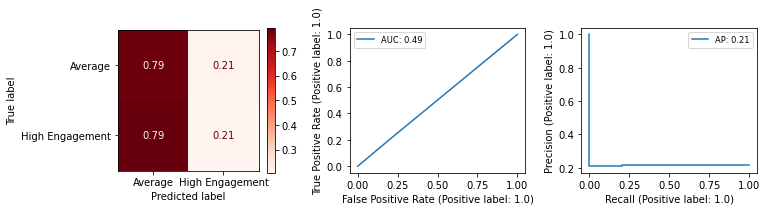

In [250]:
# Let's make a baseline classifier using the dummy model
dummy_clf = DummyClassifier(strategy='stratified')

dummy_clf.fit(X_train_mat_t, y_train_mat)

model_eval.eval_clf_model(dummy_clf, X_test_mat_t, y_test_mat, X_train_mat_t, 
            y_train_mat, labels=class_labels, score='std')

### Multi-class

****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.21      0.21      0.21      7295
         1.0       0.58      0.58      0.58     20029
         2.0       0.21      0.21      0.21      7257

    accuracy                           0.43     34581
   macro avg       0.33      0.33      0.33     34581
weighted avg       0.42      0.43      0.43     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.21      0.21      0.21      1804
         1.0       0.59      0.59      0.59      5029
         2.0       0.22      0.22      0.22      1813

    accuracy                           0.43      8646
   macro avg       0.34      0.34      0.34      8646
weighted avg       0.43      0.43      0.43      8646


****************************** Training Scores ******************************
          

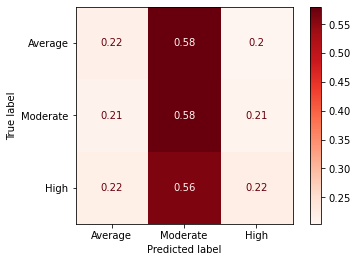

In [251]:
dummy_clf.fit(X_train_mat_t, y_train_mat_multi)

model_eval.eval_clf_model(dummy_clf, X_test_mat_t, y_test_mat_multi,  
        X_train_mat_t, y_train_mat_multi, labels=mclass_labels, score='std')

## Multinomial Bayes

### Baseline Binary

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.7s finished


0.6013966218216744
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79     27140
         1.0       0.40      0.71      0.51      7441

    accuracy                           0.70     34581
   macro avg       0.65      0.71      0.65     34581
weighted avg       0.79      0.70      0.73     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.86      0.67      0.76      6786
         1.0       0.34      0.61      0.44      1860

    accuracy                           0.66      8646
   macro avg       0.60      0.64      0.60      8646
weighted avg       0.75      0.66      0.69      8646


****************************** Training Scores ******************************
                  Training F1 = [0.7893 0.5081]
              Training Recall = [0.7041 0.7081]
   

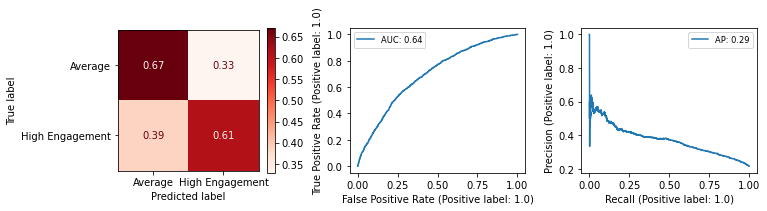

In [252]:
clf_mnb_m = MultinomialNB(fit_prior=False, alpha=0.5)

cv_scores = cross_val_score(clf_mnb_m, X_train_mat_t, y_train_mat, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

clf_mnb_m.fit(X_train_mat_t, y_train_mat)

model_eval.eval_clf_model(clf_mnb_m, X_test_mat_t, y_test_mat, X_train_mat_t, 
            y_train_mat, labels=class_labels, score='std')

### Binary - No lemmas

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished


0.6036814777905357
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79     27140
         1.0       0.40      0.71      0.51      7441

    accuracy                           0.70     34581
   macro avg       0.65      0.71      0.65     34581
weighted avg       0.79      0.70      0.73     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.86      0.67      0.75      6786
         1.0       0.34      0.61      0.43      1860

    accuracy                           0.66      8646
   macro avg       0.60      0.64      0.59      8646
weighted avg       0.75      0.66      0.69      8646


****************************** Training Scores ******************************
                  Training F1 = [0.7887 0.5079]
              Training Recall = [0.703  0.7092]
   

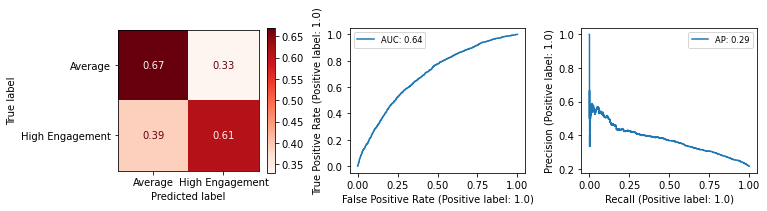

In [253]:
cv_scores = cross_val_score(clf_mnb_m, X_train_mat_t2, y_train_mat, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

clf_mnb_m.fit(X_train_mat_t2, y_train_mat)

model_eval.eval_clf_model(clf_mnb_m, X_test_mat_t2, y_test_mat, X_train_mat_t2, 
            y_train_mat, labels=class_labels, score='std')

### Baseline Multi-class

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished


0.49961637234410416
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.43      0.69      0.53      7295
         1.0       0.76      0.43      0.55     20029
         2.0       0.41      0.66      0.51      7257

    accuracy                           0.53     34581
   macro avg       0.53      0.59      0.53     34581
weighted avg       0.62      0.53      0.54     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.37      0.59      0.45      1804
         1.0       0.66      0.37      0.47      5029
         2.0       0.34      0.56      0.43      1813

    accuracy                           0.46      8646
   macro avg       0.46      0.51      0.45      8646
weighted avg       0.53      0.46      0.46      8646


****************************** Training Scores *********************

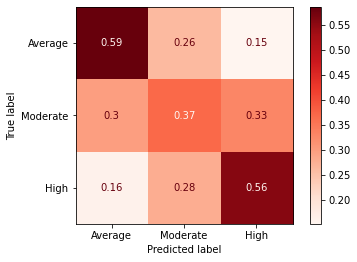

In [254]:
clf_mnb_m_multi = MultinomialNB(fit_prior=False, alpha=0.5)

clf_mnb_m_multi.fit(X_train_mat_t, y_train_mat_multi)

cv_scores = cross_val_score(clf_mnb_m_multi, X_train_mat_t, y_train_mat_multi, 
                            n_jobs=-1, scoring='recall_macro', verbose=1, )
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_mnb_m_multi, X_test_mat_t, y_test_mat_multi,  
            X_train_mat_t, y_train_mat_multi, labels=mclass_labels, score='std')

### Multi-class - No lemmas

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished


0.49779663159294163
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.43      0.69      0.53      7295
         1.0       0.76      0.43      0.55     20029
         2.0       0.41      0.66      0.51      7257

    accuracy                           0.53     34581
   macro avg       0.53      0.59      0.53     34581
weighted avg       0.62      0.53      0.53     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.37      0.59      0.45      1804
         1.0       0.65      0.36      0.47      5029
         2.0       0.34      0.56      0.42      1813

    accuracy                           0.45      8646
   macro avg       0.45      0.50      0.45      8646
weighted avg       0.53      0.45      0.45      8646


****************************** Training Scores *********************

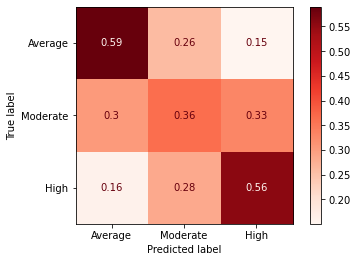

In [255]:
clf_mnb_m_multi.fit(X_train_mat_t2, y_train_mat_multi)

cv_scores = cross_val_score(clf_mnb_m_multi, X_train_mat_t2, y_train_mat_multi, 
                            n_jobs=-1, scoring='recall_macro', verbose=1, )
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_mnb_m_multi, X_test_mat_t2, y_test_mat_multi,  
            X_train_mat_t2, y_train_mat_multi, labels=mclass_labels, score='std')

## Logistic Regression

### Baseline Binary

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.6s finished


0.5929311365786376
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.90      0.72      0.80     27140
         1.0       0.41      0.71      0.52      7441

    accuracy                           0.71     34581
   macro avg       0.65      0.71      0.66     34581
weighted avg       0.79      0.71      0.74     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.86      0.69      0.77      6786
         1.0       0.35      0.61      0.44      1860

    accuracy                           0.67      8646
   macro avg       0.61      0.65      0.60      8646
weighted avg       0.75      0.67      0.70      8646


****************************** Training Scores ******************************
                  Training F1 = [0.7977 0.5174]
              Training Recall = [0.7162 0.7101]
   

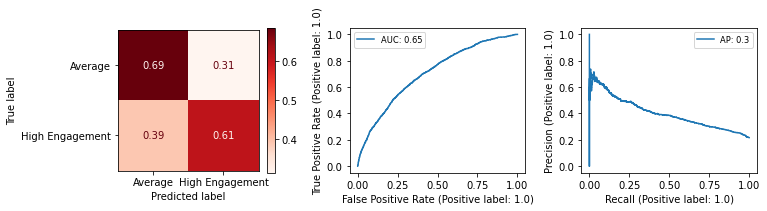

In [256]:
clf_lr_m = LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1)

clf_lr_m.fit(X_train_mat_t, y_train_mat)

cv_scores = cross_val_score(clf_lr_m, X_train_mat_t, y_train_mat, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_lr_m, X_test_mat_t, y_test_mat, X_train_mat_t, 
            y_train_mat, labels=class_labels, score='std')

### Binary - No lemmas
### *** Best Matched Binary ***

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.8s finished


0.5906471832867551
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.90      0.72      0.80     27140
         1.0       0.41      0.71      0.52      7441

    accuracy                           0.72     34581
   macro avg       0.66      0.72      0.66     34581
weighted avg       0.80      0.72      0.74     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.86      0.69      0.76      6786
         1.0       0.35      0.61      0.44      1860

    accuracy                           0.67      8646
   macro avg       0.60      0.65      0.60      8646
weighted avg       0.75      0.67      0.69      8646


****************************** Training Scores ******************************
                  Training F1 = [0.8    0.5215]
              Training Recall = [0.7188 0.7144]
   

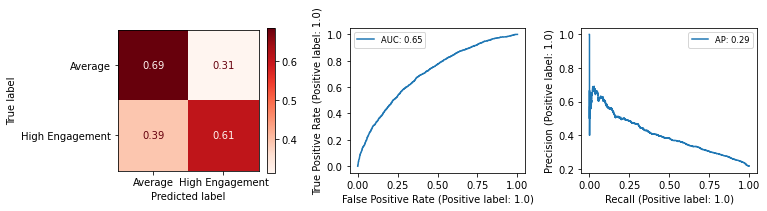

In [257]:
clf_lr_m.fit(X_train_mat_t2, y_train_mat)

cv_scores = cross_val_score(clf_lr_m, X_train_mat_t2, y_train_mat, n_jobs=-1, 
                            scoring='recall', verbose=1)
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_lr_m, X_test_mat_t2, y_test_mat, X_train_mat_t2, 
            y_train_mat, labels=class_labels, score='std')

### Build pipeline for best

In [258]:
txt_trans_pipe = Pipeline([
    ('vect', CountVectorizer(tokenizer=tweettokenizer.tokenize,
                            stop_words=custom_stopwords + custom_punc,
                            ngram_range=(1, 2),
                            max_features=10000)),
    ('tfidf', TfidfTransformer())
])

def no_analyzer(doc):
    return doc

# creating a column transformer to combine OHE of cat cols, basic count
# vectorization of subject, and tokenizing and vectorization of cleaned text
m_cols_trans = ColumnTransformer([
    ('ohe', OneHotEncoder(drop='first'), cat_cols),
    ('txt_kw', CountVectorizer(analyzer=no_analyzer), 'subject'),
    ('txt', txt_trans_pipe, 'cleaned')
])

best_LR_mat_binary_pipe = Pipeline([
    ('cols_trans', m_cols_trans),
    ('clf', LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1))
])

best_LR_mat_binary_pipe.fit(X_train_mat, y_train_mat)

Pipeline(steps=[('cols_trans',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(drop='first'),
                                                  ['section_name',
                                                   'word_count_cat',
                                                   'is_multimedia',
                                                   'has_person', 'has_org',
                                                   'has_geo']),
                                                 ('txt_kw',
                                                  CountVectorizer(analyzer=<function no_analyzer at 0x7fdba80cc310>),
                                                  'subject'),
                                                 ('txt',
                                                  Pipeline(steps=[('vect',
                                                                   CountVectorizer(max_features=10000,
              

### Baseline Multi-class

Best on previous best hyper params from gridsearching on slightly different targets.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.4s finished


0.5010270742273784
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.44      0.73      0.55      7295
         1.0       0.79      0.43      0.56     20029
         2.0       0.44      0.69      0.53      7257

    accuracy                           0.55     34581
   macro avg       0.55      0.62      0.55     34581
weighted avg       0.64      0.55      0.55     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.37      0.61      0.46      1804
         1.0       0.66      0.36      0.46      5029
         2.0       0.35      0.57      0.44      1813

    accuracy                           0.45      8646
   macro avg       0.46      0.51      0.45      8646
weighted avg       0.53      0.45      0.46      8646


****************************** Training Scores **********************

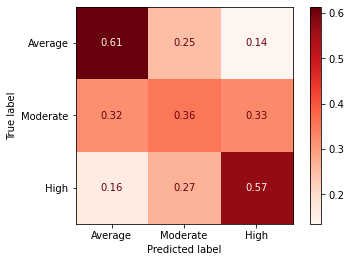

In [259]:
clf_lr_m_multi = LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1)

clf_lr_m_multi.fit(X_train_mat_t, y_train_mat_multi)

cv_scores = cross_val_score(clf_lr_m_multi, X_train_mat_t, y_train_mat_multi, 
                            n_jobs=-1, scoring='recall_macro', verbose=1)
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_lr_m_multi, X_test_mat_t, y_test_mat_multi,  
        X_train_mat_t, y_train_mat_multi, labels=mclass_labels, score='std')

### Multi-class - No lemmas
### *** Best Matched Multi ***

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    5.0s finished


0.5011144318663716
****************************** Training Data ******************************
              precision    recall  f1-score   support

         0.0       0.44      0.74      0.55      7295
         1.0       0.79      0.43      0.56     20029
         2.0       0.44      0.69      0.54      7257

    accuracy                           0.55     34581
   macro avg       0.56      0.62      0.55     34581
weighted avg       0.64      0.55      0.55     34581


****************************** Test Data ******************************
              precision    recall  f1-score   support

         0.0       0.37      0.62      0.46      1804
         1.0       0.66      0.36      0.47      5029
         2.0       0.36      0.57      0.44      1813

    accuracy                           0.46      8646
   macro avg       0.46      0.52      0.46      8646
weighted avg       0.54      0.46      0.46      8646


****************************** Training Scores **********************

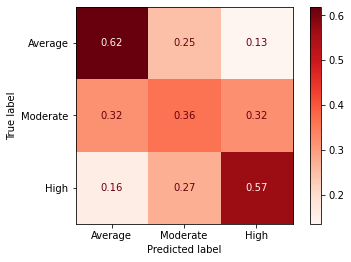

In [260]:
clf_lr_m_multi.fit(X_train_mat_t2, y_train_mat_multi)

cv_scores = cross_val_score(clf_lr_m_multi, X_train_mat_t2, y_train_mat_multi, 
                            n_jobs=-1, scoring='recall_macro', verbose=1)
print(np.mean(cv_scores))

model_eval.eval_clf_model(clf_lr_m_multi, X_test_mat_t2, y_test_mat_multi,  
        X_train_mat_t2, y_train_mat_multi, labels=mclass_labels, score='std')

### Build pipeline for best

In [261]:
best_LR_mat_multi_pipe = Pipeline([
    ('cols_trans', m_cols_trans),
    ('clf', LogisticRegression(max_iter=300, 
                            class_weight='balanced',
                            penalty='l2',
                            fit_intercept=False,
                            solver='saga',
                            C=0.1))
])

best_LR_mat_multi_pipe.fit(X_train_mat, y_train_mat_multi)

Pipeline(steps=[('cols_trans',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(drop='first'),
                                                  ['section_name',
                                                   'word_count_cat',
                                                   'is_multimedia',
                                                   'has_person', 'has_org',
                                                   'has_geo']),
                                                 ('txt_kw',
                                                  CountVectorizer(analyzer=<function no_analyzer at 0x7fdba80cc310>),
                                                  'subject'),
                                                 ('txt',
                                                  Pipeline(steps=[('vect',
                                                                   CountVectorizer(max_features=10000,
              

# iNTERPRET

## Best models overview

Binary classifiers performed slightly better on the `High engagement` target than multi-class, although the different is slight. 

Binary classifiers were able to predict about 60% of high engagement posts correctly, and about 70% of average engagement posts correctly. There was little difference in performance between analyzing Facebook text and metadata versus text and metadata from the original NYT articles that I could match.

Multi-class classifiers for all posts using Facebook data were able to predict about 60% of high engagement, 60% of average engagement, and 37% of moderate engagement posts correctly. Classifiers on matched articles were slightly worse at predicting high and moderate engagement, but not by much.

Although the models are not highly accurate, they do all perform quite a bit better on the high/average classes than guessing based on class balance. Rather than pursue more complex models which may achieve better performance but will also be more prone to overfitting on this data and will also be more difficult to interpret, I'm going to use these and see what insights we can get that might be applicable to future data.

In some cases, Multinomial Bayes performed slightly better than Logistic Regression, but again the difference wasn't much. I'm going to use the Logistic Regression models since they are very easy to interpret.

I'm also going to use the versions without lemmatization, as it didn't seem to add much in performance, if anything.

In [262]:
# save out best pipes
joblib.dump(best_LR_all_binary_pipe, 
            f"{save_path}BestPipe_LR_all_binary.joblib.gz")

joblib.dump(best_LR_all_multi_pipe, 
            f"{save_path}BestPipe_LR_all_multi.joblib.gz")

joblib.dump(best_LR_mat_binary_pipe, 
            f"{save_path}BestPipe_LR_mat_binary.joblib.gz")

joblib.dump(best_LR_mat_multi_pipe, 
            f"{save_path}BestPipe_LR_mat_multi.joblib.gz")

['models/BestPipe_LR_mat_multi.joblib.gz']

## Best LR Binary Facebook model

In [263]:
# load it back in from file
best_all_binary_pipe = joblib.load(f"{save_path}BestPipe_LR_all_binary.joblib.gz")


In [414]:
cat_cols = ['post_type', 'hour_cat', 'on_weekend']

# get the feature names from OHE columns
feature_names_ohe = list(best_all_binary_pipe.named_steps['cols_trans']\
    .named_transformers_['ohe'].get_feature_names(cat_cols))

# get the feature names from subject keywords
feature_names_txt = best_all_binary_pipe.named_steps['cols_trans']\
    .named_transformers_['txt'].named_steps['vect'].get_feature_names()

# combine the feature lists
feature_names = feature_names_ohe + feature_names_txt

len(feature_names)

10009

In [265]:
def binary_target_oddsdf(clf, feature_names, class_label, class_int):
    """Generates a dataframe of features from a logistic regression model
    along with odds for that feature.
    
    Feed in a fitted model, list of feature names from get_feature_names() on
    the appropriate transformation step, and the label to use to represent
    the target class.
    
    Specify `class_int` of 0 to get odds of the 0 class, and 1 to get odds of
    the 1 class.
    """
    
    # convert logit coefficients from log odds to odds ratios
    lr_odds = np.exp(clf.coef_[0])
    lr_odds_s = pd.Series(lr_odds, index=feature_names)
    
    # Create dataframe for odds greater than 1 (high engagement). 
    # Higher values represent greater odds of high engagement
    if class_int==1:
        df_odds = np.round(lr_odds_s.loc[lr_odds_s >= 1], 2).to_frame(
            name=class_label)
    elif class_int==0:
        df_odds = np.round(1/(lr_odds_s.loc[lr_odds_s < 1]), 2).to_frame(
            name=class_label)
    else:
        print("Error: `class_int` should be either 0 or 1.")
        return None
        
    df_odds.reset_index(inplace=True)
    df_odds.rename(columns={'index': 'Feature'}, inplace=True)
    df_odds['Formatted Feature'] = df_odds['Feature'].map(
        lambda x: x.replace("sub_", "").title() if x[:4]=="sub_" else x)

    # sort the dataframe by frequency
    df_odds.sort_values(by=class_label, ascending=False, inplace=True)
    
    return df_odds

### High Engagement

In [415]:
high_label = 'Odds of High Engagement'

high_eng = binary_target_oddsdf(best_all_binary_pipe.named_steps['clf'], 
                                   feature_names, high_label, class_int=1)
high_eng.head(15)

,Feature,Odds of High Engagement,Formatted Feature
477,breaking news,7.18,breaking news
476,breaking,6.15,breaking
3880,trump,3.49,trump
4177,writes opinion,3.29,writes opinion
1075,donald,3.22,donald
2505,news,3.13,news
3029,recipe,2.97,recipe
4140,women,2.93,women
382,bernie,2.84,bernie
3012,read opinion,2.79,read opinion


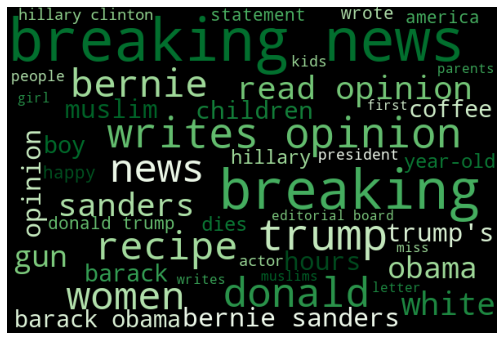

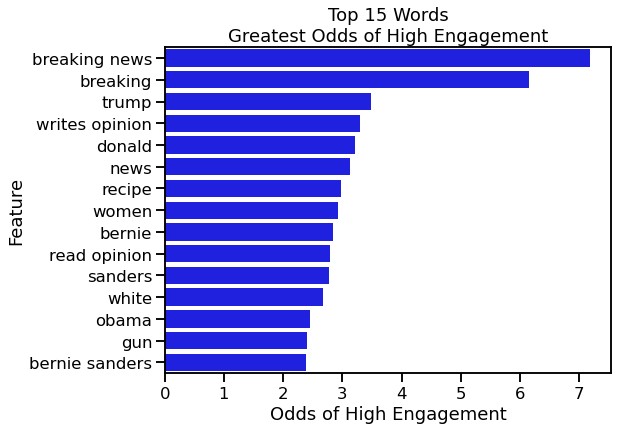

In [267]:
# Create visualizations for words with highest odds of high engagement
nlp_prep.generate_freqs_wordcloud(high_eng, 'Feature', high_label, 
                         cmap="Greens", min_font_size=16)

nlp_prep.plot_wordfreqs(high_eng, 'Feature', high_label, 15, 
               f"Greatest {high_label}")

Of all the Facebook posts, the most common words associated with high engagement are:
- Names associated with the 2016 presidential race, such as Donald Trump, Hillary Clinton, Bernie Sanders, and Obama.
- The phrase `breaking news`
- `Recipe`, which I think mostly refers to recipes
- `read opinion` and `write opinion`, which probably refers to various opinion pieces
- The words `gun`, `women`, and `white`, which sound to me like they could represent the themes of gun violence, gender equality, and racial equality--all of which are hot topics.

### Categorical Features Only

In [268]:
high_eng.loc[high_eng["Feature"].isin(feature_names_ohe)]

,Feature,Odds of High Engagement,Formatted Feature
1,post_type_video,1.67,post_type_video
0,post_type_photo,1.45,post_type_photo
2,hour_cat_5_Evening (19-23),1.33,hour_cat_5_Evening (19-23)
3,on_weekend_1.0,1.27,on_weekend_1.0


Being a video or photo Facebook post type both increase odds of high engagement compared to a link (which was the category dropped during OHE).

Posting in the evening (from 7 PM to 11 PM Eastern) or on the weekend also increased odds of high engagement somewhat. This may be because new posts would show up in users' feeds when they're online, so they would be seen right away as opposed to being buried under newer posts.

### Average Engagement

In [416]:
avg_label = 'Odds of Average Engagement'

avg_eng = binary_target_oddsdf(best_all_binary_pipe.named_steps['clf'], 
                                   feature_names, avg_label, class_int=0)
avg_eng.head(15)

,Feature,Odds of Average Engagement,Formatted Feature
21,?,2.95,?
4746,sports,2.87,sports
1566,ebola,2.73,ebola
5521,week,2.63,week
3314,new,2.61,new
4000,quotation day,2.51,quotation day
3999,quotation,2.44,quotation
5484,watch,2.25,watch
1900,fight,2.21,fight
1884,ferguson,2.17,ferguson


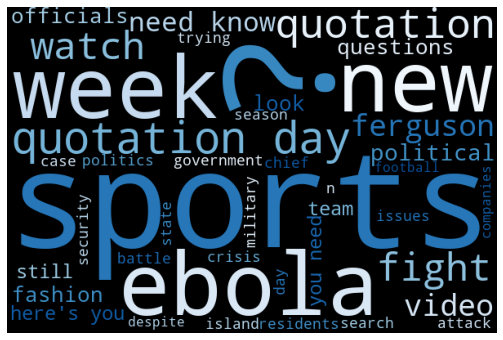

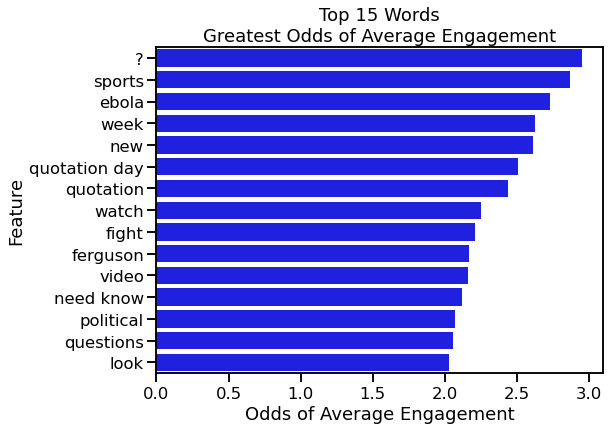

In [270]:
# Create visualizations for words with highest odds of average engagement
nlp_prep.generate_freqs_wordcloud(avg_eng, 'Feature', avg_label, 
                         cmap="Blues", min_font_size=16)

nlp_prep.plot_wordfreqs(avg_eng, 'Feature', avg_label, 15, 
               f"Greatest {avg_label}")

Words and phrases with the highest odds of average engagement are:
- `quotation day`, which is probably `quotation of the day` in full
- `week`, which may be related to weekly recaps or overviews
- `officials`, `government`, and `political`, which sound like terms related to general political happenings
- `ebola`, which is probably related to outbreaks in Africa
- `sports` and `fashion`
- `watch` and `video`
- `ferguson`, which probably refers to the unrest that happened in Ferguson, Missouri in August 2014
- The question mark, which I find interesting.

### Categorical Features Only

In [271]:
avg_eng.loc[avg_eng["Feature"].isin(feature_names_ohe)]

,Feature,Odds of Average Engagement,Formatted Feature
0,post_type_other,1.32,post_type_other
1,hour_cat_2_Morning (7-11),1.18,hour_cat_2_Morning (7-11)
2,hour_cat_3_Midday (11-15),1.15,hour_cat_3_Midday (11-15)
3,hour_cat_4_Afternoon (15-19),1.15,hour_cat_4_Afternoon (15-19)
4,hour_cat_6_Late night (23-3),1.09,hour_cat_6_Late night (23-3)


The `Other` post type category consisted of status, event, and note. These have slightly higher odds of resulting in a post with average engagement.

Posting between 7 AM and 7 PM, as well as from 11 PM to 3 AM, have slightly higher odds of average engagement compared to posting very late night (3 AM to 7 AM) which was the category dropped.

## Best LR Article Meta and Text model

In [272]:
# load it back in from file
best_mat_binary_pipe = joblib.load(f"{save_path}BestPipe_LR_mat_binary.joblib.gz")

In [417]:
cat_cols = ['section_name', 'word_count_cat', 'is_multimedia', 'has_person', 
            'has_org', 'has_geo']

# get the feature names from OHE columns
feature_names_ohe = list(best_mat_binary_pipe.named_steps['cols_trans']\
    .named_transformers_['ohe'].get_feature_names(cat_cols))

# get the feature names from subject keywords
feature_names_txt1 = best_mat_binary_pipe.named_steps['cols_trans']\
    .named_transformers_['txt_kw'].get_feature_names()

# add "sub_" to beginning of each subject feature name so they can be told
# apart from article text
feature_names_txt1 = ['sub_' + kw for kw in feature_names_txt1]

# get the feature names from subject keywords
feature_names_txt2 = best_mat_binary_pipe.named_steps['cols_trans']\
    .named_transformers_['txt'].named_steps['vect'].get_feature_names()

# combine the feature lists
feature_names = feature_names_ohe + feature_names_txt1 + feature_names_txt2

len(feature_names)

13246

### High Engagement

In [418]:
high_eng_art = binary_target_oddsdf(best_mat_binary_pipe.named_steps['clf'], 
                                   feature_names, high_label, class_int=1)
high_eng_art.head(15)

,Feature,Odds of High Engagement,Formatted Feature
3895,obama,2.96,obama
0,section_name_Cooking,2.76,section_name_Cooking
921,sub_presidential election of 2016,2.23,Presidential Election Of 2016
4231,president,2.13,president
331,sub_deaths (obituaries),2.12,Deaths (Obituaries)
70,sub_archaeology and anthropology,2.06,Archaeology And Anthropology
208,sub_cats,2.02,Cats
4639,sanders,2.01,sanders
5312,trump,1.97,trump
1202,sub_vaccination and immunization,1.95,Vaccination And Immunization


I see an interesting mix of predictors of high engagement from the matched articles model. The subject metadata definitely made the results differ from the Facebook post data, in which we didn't have subjects.

- As with the Facebook model, words and phrases related to the president and election are top predictors. The subject "Presidential Election of 2016" is also a top predictor.
- Apart from that, we have a pretty eclectic mix of subjects. Some are fairly neutral topics that people probably don't have strong feelings about: Cooking, Archeology and Anthropology, Cats, Walking, Happiness, Mathematics, iPhone.
- Other subjects may be controversial, or at the least subjects that people tend to have strong feelings about: Muslim Americans, Animal Abuse, Rights and Welfare
- Another trend in top subjects is beauty related: Hair, Beauty Contests, Cosmetics and Toiletries
- Although Sports was a top predictor of average engagement in the Facebook model, the 2016 Olympics was a top subject here
- Deaths and Obituaries are also a top predictor of high engagement, which I had seen during EDA

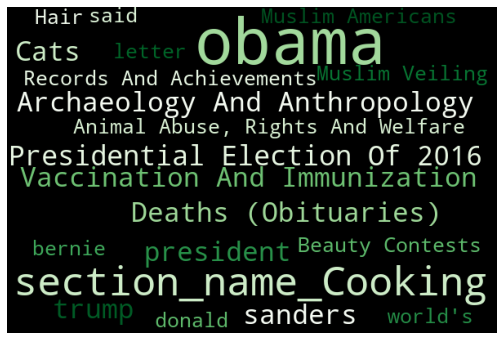

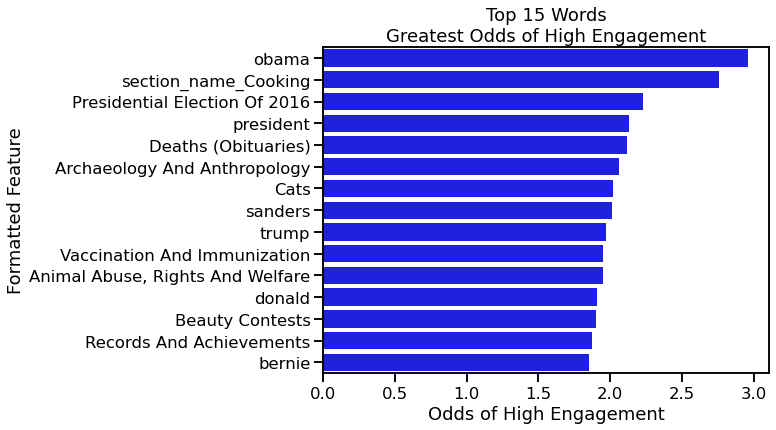

In [275]:
# Create visualizations for words with highest odds of high engagement
nlp_prep.generate_freqs_wordcloud(high_eng_art, 'Formatted Feature', high_label, 
                         cmap="Greens", min_font_size=16)

nlp_prep.plot_wordfreqs(high_eng_art, 'Formatted Feature', high_label, 15, 
               f"Greatest {high_label}")

### Categorical Features Only

In [276]:
high_eng_art.loc[high_eng_art["Feature"].isin(feature_names_ohe)]

,Feature,Odds of High Engagement,Formatted Feature
0,section_name_Cooking,2.76,section_name_Cooking
5,section_name_Travel,1.20,section_name_Travel
7,word_count_cat_None,1.20,word_count_cat_None
6,word_count_cat_Low,1.15,word_count_cat_Low
4,section_name_Style,1.12,section_name_Style
2,section_name_Opinion,1.10,section_name_Opinion
3,section_name_Real Estate,1.09,section_name_Real Estate
8,has_person_1,1.07,has_person_1
1,section_name_NYT Now,1.05,section_name_NYT Now
9,has_geo_1,1.00,has_geo_1


Cooking is by far the most popular section, followed by Travel, Style, and Opinion.

Low word count means slightly higher odds of being higher engagement, but not much.

### Subject KWs Only

In [419]:
display(high_eng_art.loc[high_eng_art["Feature"].isin(feature_names_txt1), 
                ["Formatted Feature", "Odds of High Engagement"]].head(15))

,Formatted Feature,Odds of High Engagement
921,Presidential Election Of 2016,2.23
331,Deaths (Obituaries),2.12
70,Archaeology And Anthropology,2.06
208,Cats,2.02
1202,Vaccination And Immunization,1.95
52,"Animal Abuse, Rights And Welfare",1.95
126,Beauty Contests,1.90
962,Records And Achievements,1.87
546,Hair,1.84
781,Muslim Americans,1.84


### Average Engagement

In [278]:
avg_eng_art = binary_target_oddsdf(best_mat_binary_pipe.named_steps['clf'], 
                                   feature_names, avg_label, class_int=0)
avg_eng_art.head(25)

,Feature,Odds of Average Engagement,Formatted Feature
1131,sub_midterm elections (2014),2.89,Midterm Elections (2014)
1151,sub_mobile applications,2.07,Mobile Applications
1180,sub_murders and attempted murders,2.00,Murders And Attempted Murders
15,section_name_Technology,1.99,section_name_Technology
4949,may,1.96,may
1569,sub_september fashion week (2014),1.95,September Fashion Week (2014)
5239,new,1.90,new
6312,security,1.88,security
3796,ferguson,1.87,ferguson
146,sub_automobile safety features and defects,1.86,Automobile Safety Features And Defects


- Although the presidential election was a top predictor of high engagement, general words such as `government`, and subjects such as 2014 Midterm Elections, Political Advertising, Jury System, and Politics and Government are top predictors of Average engagement. My reading of this is that the competition of the presidential election drew people in, but every day political events are less engaging.
- Some top predictors are also far away from the US, such as Ebola Virus, Middle East and North Africa Unrest, Brussels Attacks.
- Interestingly, the subject Multimedia/Photos is a top predictor of average, although when looking at the types of Facebook posts videos and photos seemed to get more engagement. It may be there is a difference between these classifications.

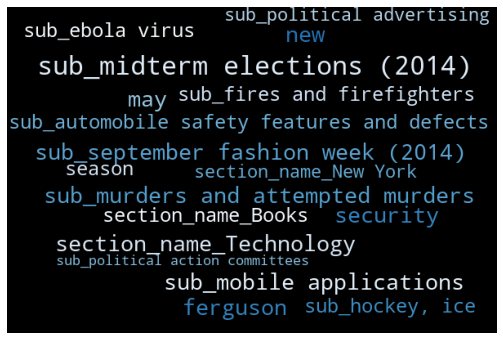

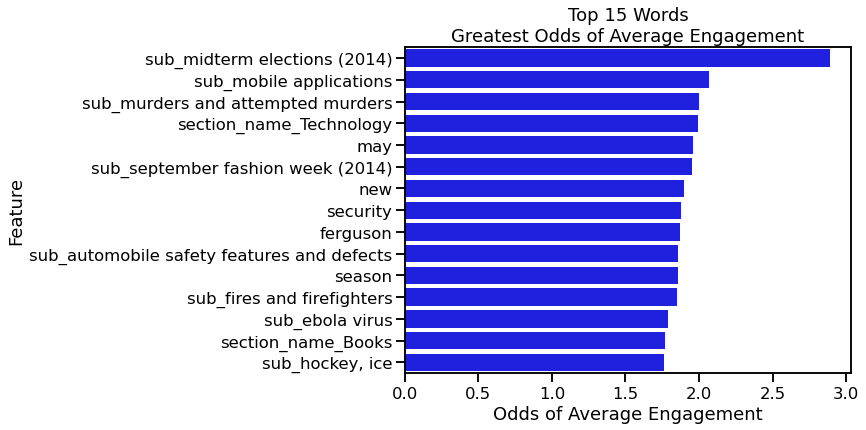

In [279]:
# Create visualizations for words with highest odds of average engagement
nlp_prep.generate_freqs_wordcloud(avg_eng_art, 'Feature', avg_label, 
                         cmap="Blues", min_font_size=16)

nlp_prep.plot_wordfreqs(avg_eng_art, 'Feature', avg_label, 15, 
               f"Greatest {avg_label}")

### Categorical Features Only

In [280]:
avg_eng_art.loc[avg_eng_art["Feature"].isin(feature_names_ohe)]

,Feature,Odds of Average Engagement,Formatted Feature
15,section_name_Technology,1.99,section_name_Technology
1,section_name_Books,1.77,section_name_Books
10,section_name_New York,1.73,section_name_New York
0,section_name_Blogs,1.67,section_name_Blogs
9,section_name_Multimedia/Photos,1.65,section_name_Multimedia/Photos
3,section_name_Education,1.63,section_name_Education
19,section_name_World,1.60,section_name_World
13,section_name_Sports,1.54,section_name_Sports
17,section_name_Theater,1.54,section_name_Theater
12,section_name_Science,1.44,section_name_Science


### Subject KWs Only

In [421]:
display(avg_eng_art.loc[avg_eng_art["Feature"].isin(feature_names_txt1), 
            ['Formatted Feature', 'Odds of Average Engagement']].head(15))

,Formatted Feature,Odds of Average Engagement
1131,Midterm Elections (2014),2.89
1151,Mobile Applications,2.07
1180,Murders And Attempted Murders,2.00
1569,September Fashion Week (2014),1.95
146,Automobile Safety Features And Defects,1.86
672,Fires And Firefighters,1.85
556,Ebola Virus,1.79
850,"Hockey, Ice",1.76
1374,Political Advertising,1.75
1373,Political Action Committees,1.72


## FB - Review Prediction Accuracy

In [282]:
# Get predictions for X (binary problem)
preds_all = best_all_binary_pipe.predict(X_test_all)

In [283]:
Xtest_all_df = X_test_all.copy()
Xtest_all_df['fb_pred'] = preds_all
Xtest_all_df.tail()

,cleaned,post_type,hour_cat,on_weekend,fb_pred
36595,The Last Thaw: U. S.-Cuban Relations in Pictur...,link,4_Afternoon (15-19),0.0,1.0
4882,"In Israel, a Push to Screen for Cancer Gene Le...",link,2_Morning (7-11),0.0,0.0
9442,Fast-Food Workers Intensify Fight for an Hour....,link,2_Morning (7-11),0.0,0.0
12261,Indelible Photos of Derek Jeter. Derek Jeter f...,link,4_Afternoon (15-19),1.0,0.0
45000,Disabled Victims of Mass Killing in Japan Kept...,link,2_Morning (7-11),0.0,0.0


In [284]:
df = df.join(Xtest_all_df[['fb_pred']])
df[['cleaned', 'fb_pred', 'all_binary']].head()

,cleaned,fb_pred,all_binary
0,Did Barack Obama Save Ohio?. 'There are severa...,NaN,0.0
1,"The Weatherman Is Not a Moron. In , the chance...",NaN,0.0
2,The Organic Fable. 'Organic has long since bec...,NaN,0.0
3,Timeline Photos. Our special Arts & Leisure se...,NaN,0.0
4,Pot for Parents. 'When I'm rolling around the ...,NaN,0.0


In [285]:
predict_cols = ['cleaned', 'fb_pred', 'all_binary',
            'max_pct', 'mean_pct', 'comments_pct', 'comments_count',  
            'shares_pct', 'shares_count', 'likesloves_pct', 'likes_loves']

df.loc[df['fb_pred'].isna()==False, predict_cols]

,cleaned,fb_pred,all_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
8,Potential for a Mining Boom Splits Factions in...,0.0,0.0,0.346634,0.250951,0.266295,35,0.346634,84,0.139922,224
15,"With No Contract Deal by Deadline in Chicago, ...",0.0,0.0,0.404692,0.293375,0.404692,55,0.282957,66,0.192475,277
18,Biden and the Bikers. Vice President Joe Biden...,0.0,0.0,0.169087,0.119048,0.169087,24,0.105910,27,0.082146,165
21,Romney's Tax Plan Leaves Key Variables Blank -...,0.0,0.0,0.668846,0.325241,0.668846,127,0.248527,57,0.058350,138
25,What Work Is Really For. Is work good or bad? ...,0.0,0.0,0.756215,0.583438,0.456733,64,0.756215,416,0.537365,782
...,...,...,...,...,...,...,...,...,...,...,...
47840,How to Be Mindful in the Voting Booth. Let go ...,0.0,0.0,0.380521,0.253809,0.380521,51,0.232472,53,0.148435,232
47845,The Chopped Cheese's Sharp Rise to Fame. Grab ...,0.0,0.0,0.392763,0.286710,0.392763,53,0.305833,72,0.161534,245
47848,Donald Trump's Big Bet on Less Educated Whites...,1.0,1.0,0.942705,0.871485,0.942705,563,0.917217,1182,0.754533,1666
47856,"'The Walking Dead' Season , Episode : The Ball...",0.0,0.0,0.659299,0.264210,0.659299,123,0.053932,16,0.079399,162


### Was High, predicted Average

In [286]:
total = len(df.loc[df['fb_pred'].isna()==False])
print(total)

total_wrong = len(df.loc[(df['all_binary']==1) & (df['fb_pred']==0)])
total_wrong

9574


765

In [287]:
df.loc[(df['all_binary']==1) & (df['fb_pred']==0), predict_cols].describe()

,fb_pred,all_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
count,765.0,765.0,765.000000,765.000000,765.000000,765.000000,765.000000,765.000000,765.000000,765.000000
mean,0.0,1.0,0.921046,0.850592,0.833733,410.615686,0.868748,1324.286275,0.849294,4857.564706
std,0.0,0.0,0.053250,0.064979,0.109945,424.026225,0.090276,1337.115027,0.098237,8515.752192
min,0.0,1.0,0.765899,0.750094,0.493482,72.000000,0.445817,121.000000,0.495665,694.000000
25%,0.0,1.0,0.884532,0.794910,0.753719,175.000000,0.816488,571.000000,0.787083,1918.000000
50%,0.0,1.0,0.928739,0.844413,0.848139,273.000000,0.883383,883.000000,0.863536,2927.000000
75%,0.0,1.0,0.966385,0.901649,0.924748,471.000000,0.941294,1589.000000,0.927401,4954.000000
max,0.0,1.0,0.999749,0.995467,0.999248,5100.000000,0.997869,13540.000000,0.999749,172585.000000


799 of the 9,574 posts in the test set were incorrectly classified as average engagement although they should have been high (defined as average engagement metric percentile being above 75th). 

The percentiles for comments, shares, and likes/loves are all consistently above 75, so I don't see any particular patterns. The model just wasn't able to pick up on whatever trends these represented.

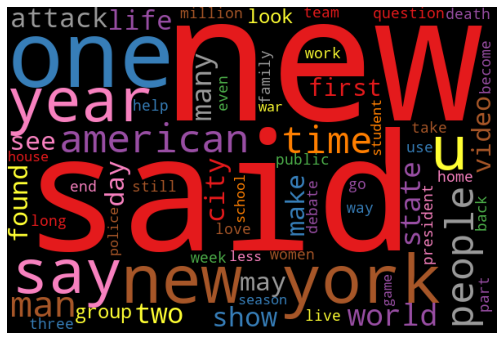

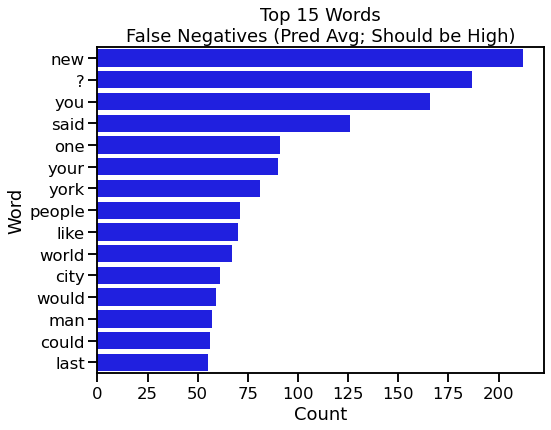

In [288]:
# False Negatives word frequencies
fn_token_dict = nlp_prep.tokenize_corpus_dict_tweet(
    df.loc[(df['all_binary']==1) & (df['fb_pred']==0)], [0, 1], 
    target_col='all_binary', stop_list=custom_stopwords + custom_punc, 
                                                 verbose=False)

fn_tokens = []
[fn_tokens.extend(tokens) for tokens in fn_token_dict.values()]

fn_corpus = FreqDist(fn_tokens)

fn_freq_df = pd.DataFrame(fn_corpus.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=fn_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='')

nlp_prep.plot_wordfreqs(fn_freq_df, 'Word', 'Count', 15, 
               "False Negatives (Pred Avg; Should be High)")

Even though I removed the you/your permutations from the stopwords list during modeling, the models still didn't pick up on those words being predictors of High engagement. I see here that you and your appear frequently in the posts that should have been classified as High but were mis-classified as Average. It's possible that TF-IDF normalization worked against me in that regard.

Otherwise, the top words look pretty average to me.

### Was Average, predicted High

In [289]:
print(total)

total_wrong2 = len(df.loc[(df['all_binary']==0) & (df['fb_pred']==1)])
total_wrong2

9574


2340

In [290]:
df.loc[(df['all_binary']==0) & (df['fb_pred']==1), predict_cols].describe()

,fb_pred,all_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
count,2340.0,2340.0,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,1.0,0.0,0.621284,0.474777,0.478050,109.629060,0.460815,191.688889,0.485467,973.614957
std,0.0,0.0,0.222130,0.192443,0.250317,128.676906,0.234352,197.546578,0.235420,1164.196964
min,1.0,0.0,0.015376,0.007636,0.000460,0.000000,0.006069,0.000000,0.001253,12.000000
25%,1.0,0.0,0.474275,0.329660,0.274234,36.000000,0.279227,65.000000,0.304663,400.000000
50%,1.0,0.0,0.668846,0.506861,0.479641,69.000000,0.487413,141.000000,0.505296,713.000000
75%,1.0,0.0,0.797769,0.637740,0.675709,130.000000,0.648185,260.000000,0.672523,1211.000000
max,1.0,0.0,0.994589,0.749875,0.987079,1361.000000,0.987319,4342.000000,0.994589,28470.000000


2,408 of the 9,574 posts in the test set were incorrectly classified as high engagement although they should have been average (defined as average engagement metric percentile being below 75th). 

The percentiles for comments, shares, and likes/loves are all consistently below 75, so I don't see any particular patterns.

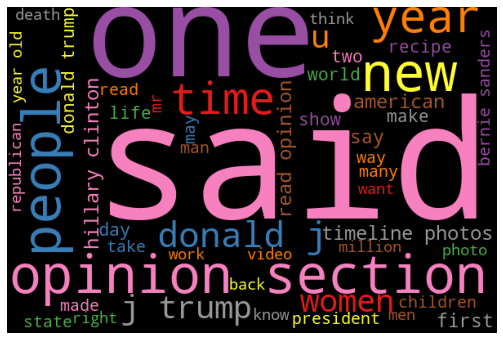

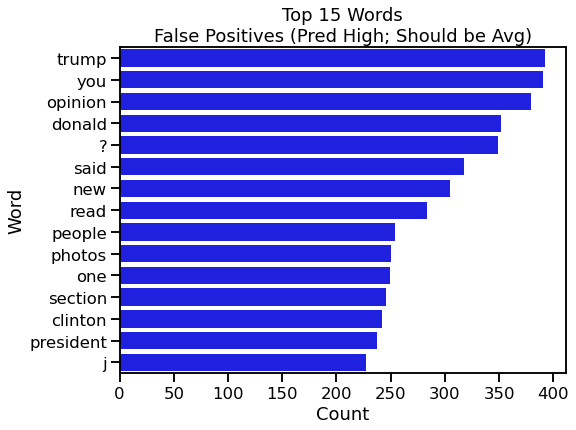

In [291]:
# False Positives word frequencies
fp_token_dict = nlp_prep.tokenize_corpus_dict_tweet(
    df.loc[(df['all_binary']==0) & (df['fb_pred']==1)], [0, 1], 
    target_col='all_binary', stop_list=custom_stopwords + custom_punc, 
                                                 verbose=False)

fp_tokens = []
[fp_tokens.extend(tokens) for tokens in fp_token_dict.values()]

fp_corpus = FreqDist(fp_tokens)

fp_freq_df = pd.DataFrame(fp_corpus.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=fp_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='False Positives (should be Avg)')

nlp_prep.plot_wordfreqs(fp_freq_df, 'Word', 'Count', 15, 
               "False Positives (Pred High; Should be Avg)")

I see lots of mentions of presidential stuff (Trump, Clinton, President), as well as Opinion. I can see why these might have been mis-classified as High even though they were Average.

## Matched - Review Prediction Accuracy

In [292]:
# Get predictions for X (binary problem)
preds_mat = best_mat_binary_pipe.predict(X_test_mat)

In [293]:
Xtest_mat_df = X_test_mat.copy()
Xtest_mat_df['mat_pred'] = preds_mat
Xtest_mat_df.tail()

,cleaned,subject,section_name,word_count_cat,is_multimedia,has_person,has_org,has_geo,mat_pred
43716,We're So Confused: The Problems With Food and ...,"[research, diet and nutrition, medicine and he...",The Upshot,Average,0.0,1,0,0,1.0
1050,The Colors of Travel . Explore the places we v...,[travel and vacations],Travel,None,1.0,0,0,0,1.0
9445,"Paying Ransoms, Europe Bankrolls Qaeda Terror....","[kidnapping, series, hostages, finances, terro...",World,High,0.0,0,1,1,0.0
40230,"The World Remembers Muhammad Ali. Athletes, ce...","[social media, boxing]",Sports,Average,0.0,1,0,0,1.0
26704,"A -Year-Old Girl, a Rape and a Bronx Neighborh...","[sex crimes, child abuse and neglect, children...",New York,Average,0.0,1,0,1,0.0


In [294]:
df = df.join(Xtest_mat_df[['mat_pred']])
df[['cleaned', 'mat_pred', 'm_binary']].head()

,cleaned,mat_pred,m_binary
0,Did Barack Obama Save Ohio?. 'There are severa...,NaN,0.0
1,"The Weatherman Is Not a Moron. In , the chance...",NaN,0.0
2,The Organic Fable. 'Organic has long since bec...,NaN,0.0
3,Timeline Photos. Our special Arts & Leisure se...,NaN,0.0
4,Pot for Parents. 'When I'm rolling around the ...,NaN,0.0


In [295]:
predict_cols = ['cleaned', 'mat_pred', 'm_binary',
            'max_pct', 'mean_pct', 'comments_pct', 'comments_count',  
            'shares_pct', 'shares_count', 'likesloves_pct', 'likes_loves']

df.loc[df['mat_pred'].isna()==False, predict_cols]

,cleaned,mat_pred,m_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
7,"New Rules. 'The truth is, if you want a decent...",0.0,1.0,0.922952,0.877780,0.839636,260,0.922952,1259,0.870754,3073
10,"More Choice, and More Confusion, in Quest for ...",1.0,0.0,0.454801,0.360346,0.282058,37,0.454801,125,0.344180,449
17,What Keeps the Chinese Up at Night. Op-Ed cont...,0.0,0.0,0.365322,0.187778,0.131711,20,0.365322,90,0.066300,147
18,Biden and the Bikers. Vice President Joe Biden...,0.0,0.0,0.169087,0.119048,0.169087,24,0.105910,27,0.082146,165
34,"Ovarian Cancer Screenings Are Not Effective, P...",1.0,0.0,0.295011,0.201887,0.215111,29,0.295011,69,0.095538,179
...,...,...,...,...,...,...,...,...,...,...,...
47829,The Biggest Turning Points in a Polarizing Cam...,1.0,0.0,0.524381,0.234345,0.524381,79,0.115813,29,0.062842,143
47834,Presidential Election: The Day Before the Stor...,1.0,0.0,0.705522,0.561401,0.705522,145,0.386819,97,0.591861,919
47848,Donald Trump's Big Bet on Less Educated Whites...,0.0,1.0,0.942705,0.871485,0.942705,563,0.917217,1182,0.754533,1666
47851,California Today: How Do Top Newspapers Line U...,0.0,0.0,0.319601,0.131499,0.319601,42,0.053932,16,0.020965,86


### Was High, predicted Average

In [296]:
total = len(df.loc[df['mat_pred'].isna()==False])
print(total)

total_wrong = len(df.loc[(df['m_binary']==1) & (df['mat_pred']==0)])
total_wrong

8646


731

In [297]:
df.loc[(df['m_binary']==1) & (df['mat_pred']==0), predict_cols].describe()

,mat_pred,m_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
count,731.0,731.0,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,0.0,1.0,0.918696,0.850744,0.826288,395.466484,0.870771,1377.518468,0.855175,5518.826265
std,0.0,0.0,0.054814,0.069762,0.114506,420.703061,0.089502,1405.758166,0.099713,11756.503668
min,0.0,1.0,0.765899,0.745369,0.489115,71.000000,0.563709,187.000000,0.411158,545.000000
25%,0.0,1.0,0.882876,0.788230,0.747545,171.000000,0.819940,583.500000,0.790634,1954.000000
50%,0.0,1.0,0.926493,0.840618,0.845151,268.000000,0.887582,913.000000,0.870754,3073.000000
75%,0.0,1.0,0.965790,0.909478,0.917718,442.000000,0.942893,1617.000000,0.937226,5577.000000
max,0.0,1.0,0.999937,0.997458,0.999102,4647.000000,0.996992,10846.000000,0.999937,241832.000000


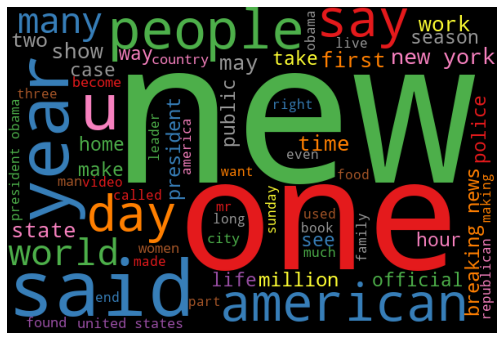

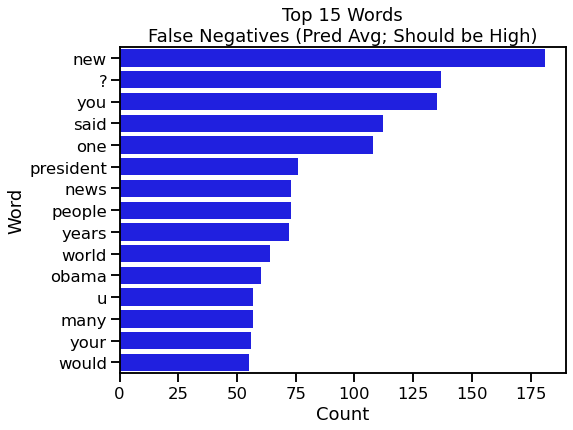

In [298]:
# False Negatives word frequencies
fn_token_dict = nlp_prep.tokenize_corpus_dict_tweet(
    df.loc[(df['m_binary']==1) & (df['mat_pred']==0)], [0, 1], 
    target_col='m_binary', stop_list=custom_stopwords + custom_punc, 
                                                 verbose=False)

fn_tokens = []
[fn_tokens.extend(tokens) for tokens in fn_token_dict.values()]

fn_corpus = FreqDist(fn_tokens)

fn_freq_df = pd.DataFrame(fn_corpus.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=fn_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='')

nlp_prep.plot_wordfreqs(fn_freq_df, 'Word', 'Count', 15, 
               "False Negatives (Pred Avg; Should be High)")

Even though I removed the you/your permutations from the stopwords list during modeling, the models still didn't pick up on those words being predictors of High engagement. I see here that you and your appear frequently in the posts that should have been classified as High but were mis-classified as Average. It's possible that TF-IDF normalization worked against me in that regard.

Otherwise, the top words look pretty average to me.

### Was Average, predicted High

In [299]:
print(total)

total_wrong2 = len(df.loc[(df['m_binary']==0) & (df['mat_pred']==1)])
total_wrong2

8646


2137

In [300]:
df.loc[(df['m_binary']==0) & (df['mat_pred']==1), predict_cols].describe()

,mat_pred,m_binary,max_pct,mean_pct,comments_pct,comments_count,shares_pct,shares_count,likesloves_pct,likes_loves
count,2137.0,2137.0,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000
mean,1.0,0.0,0.629243,0.478194,0.503826,114.819841,0.471976,195.010295,0.458780,830.647169
std,0.0,0.0,0.208690,0.183044,0.241276,128.788175,0.225241,176.322007,0.229607,662.660973
min,1.0,0.0,0.014206,0.006619,0.003604,2.000000,0.006069,0.000000,0.002047,17.000000
25%,1.0,0.0,0.504795,0.348887,0.319601,42.000000,0.298824,70.000000,0.272417,362.000000
50%,1.0,0.0,0.675709,0.503311,0.520150,78.000000,0.489397,142.000000,0.477061,658.000000
75%,1.0,0.0,0.785328,0.629995,0.697698,141.000000,0.654431,267.000000,0.645991,1101.000000
max,1.0,0.0,0.992886,0.746010,0.992886,1848.000000,0.935758,1471.000000,0.935466,5457.000000


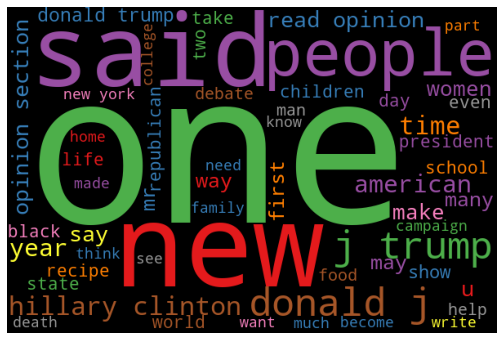

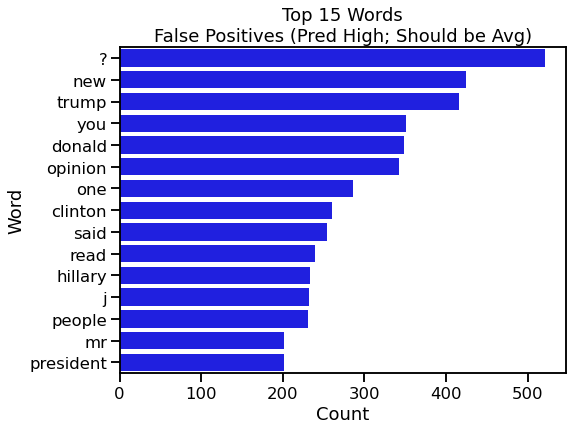

In [301]:
# False Positives word frequencies
fp_token_dict = nlp_prep.tokenize_corpus_dict_tweet(
    df.loc[(df['m_binary']==0) & (df['mat_pred']==1)], [0, 1], 
    target_col='m_binary', stop_list=custom_stopwords + custom_punc, 
                                                 verbose=False)

fp_tokens = []
[fp_tokens.extend(tokens) for tokens in fp_token_dict.values()]

fp_corpus = FreqDist(fp_tokens)

fp_freq_df = pd.DataFrame(fp_corpus.most_common(100),
                              columns=['Word','Count'])

nlp_prep.generate_wordcloud(docs=fp_tokens, cmap="Set1", 
                   stopwords=None, min_font_size=16, 
                  title='False Positives (should be Avg)')

nlp_prep.plot_wordfreqs(fp_freq_df, 'Word', 'Count', 15, 
               "False Positives (Pred High; Should be Avg)")

I see lots of mentions of presidential stuff (Trump, Clinton, President), as well as Opinion. I can see why these might have been mis-classified as High even though they were Average.

### Performance Insights

The binary classifiers performed slightly better than the multi-class, but looking at the confusion matrices for the multi-class classifiers, they show that High and Average posts are most often classified as Moderate.

I think one challenge to achieve better performance with these models is that there is no clear delineation between High engagement and any other level. I chose a reasonable cutoff point, but it could easily have been drawn elsewhere. Initially I also tried calling outliers in terms of any engagement category high engagement, but that didn't perform any better. The engagement metric distributions all had a pretty smooth taper off, so I'm not surprised that the models uniformly got confused.

The posts that were misclassified in both the Facebook and the matched article models shared most frequent words in common with the other class, so I can see why the models got confused.

Facebook has its own algorithm that ultimately decides what content is presented to users in their feed in what priority. I think it's likely the effect of their algorithm (which we can't model here) is the reason some posts got less engagement than others with similar words and topics.

Since the two models based on slightly different text agreed on many words, I think that although these models didn't achieve a high degree of accuracy, they did pick up on the strongest signals in the data. Because they only picked up on the strongest signals, with a little interpretation I think the results will be fairly applicable to future articles.

However, since the specific terms associated with topical themes will differ over time (candidates for a given presidential election year, for example) the model would probably not be very accurate in predicting future high engagement articles unless it was continually retrained. I believe that a general understanding of the topics and themes of highly engaging content is much more useful than using the model itself to choose which articles to post.

## Explore Top Predictors of High Engagement

In [340]:
def plot_hits_vs_pop(df, re_string, subset_title, display_hits=True,
                    search_text_col='cleaned', full_text_col='all_text'):
    """Searches for a regex string in the `cleaned` text column and marks hits.
    
    Re-formats dataframe to be able to plot engagement metric counts in the hits
    subset versus counts in the entire population.
    
    Plots engagement metric counts for entire population versus hits, using
    specified estimator (mean or median).
    """
    
    #search_text_col = 'cleaned'
    #full_text_col = 'all_text'
    value_cols = ['comments_count', 'shares_count', 'likes_loves']
    pct_cols = ['comments_pct', 'shares_pct', 'likesloves_pct', 'mean_pct']
    copy_cols = [search_text_col, full_text_col] + value_cols + pct_cols

    # copy relevant columns from main df
    df_temp = df[copy_cols].copy()
    df_temp['Population'] = 'All Posts'

    # copy relevant columns only for hits
    df_temp2 = df.loc[(df[search_text_col].str.contains(re_string, regex=True, 
                    case=False)), copy_cols].copy()
    df_temp2['Population'] = 'Subset'

    # concat dfs
    df_temp = df_temp.append(df_temp2, ignore_index=True)

    # melt df to convert to long form
    df_melted = pd.melt(df_temp, id_vars=['Population'], 
            value_vars=value_cols)

    # dict to map plotting-friendly names
    engage_dict = {'comments_count': "Comments", 'shares_count': 'Shares', 
                   'likes_loves': 'Likes/Loves'}
    
    # map plotting-friendly names
    df_melted['variable'] = df_melted['variable'].map(lambda x: engage_dict[x])
    
    print(f"Number of hits: {len(df_temp2)}")
    print()

    # plot
    my_palette = sns.color_palette(palette=['grey', 'limegreen'])

    with sns.plotting_context('talk'):
        # plot median
        fig, ax = plt.subplots(figsize=(8, 6))

        sns.barplot(data=df_melted, x='variable', y='value', hue='Population',
               estimator=np.median, palette=my_palette)

        ax.set_title(f'Median Engagement Counts for Subset:\n {subset_title}')
        ax.set_xlabel('Engagement Type')
        ax.set_ylabel(f'Median Count');
        
        fig, ax = plt.subplots(figsize=(8, 6))

        sns.barplot(data=df_melted, x='variable', y='value', hue='Population',
               estimator=np.mean, palette=my_palette)

        ax.set_title(f'Mean Engagement Counts for Subset:\n {subset_title}')
        ax.set_xlabel('Engagement Type')
        ax.set_ylabel(f'Mean Count');
        
    df_temp2.sort_values(by='mean_pct', inplace=True, ascending=False)
    
    if display_hits:
    
        # display top engagement
        print()
        print("Top engagement:")
        display(df_temp2[[full_text_col] + value_cols].head(10)\
                .style.set_properties(**{'white-space': 'pre-wrap', 
                                         'text-align': 'left'}))

        # display least engagement
        print()
        print("Least engagement:")
        display(df_temp2[[full_text_col] + value_cols].tail()\
                .style.set_properties(**{'white-space': 'pre-wrap', 
                                         'text-align': 'left'}))
        
    return df_temp2

In [341]:
def plot_listmatches_vs_pop(df, search_list, subset_title, display_hits=True,
                    search_text_col='cleaned', full_text_col='all_text'):
    """Searches list of values in a dataframe column that contains a list.
    
    Re-formats dataframe to be able to plot engagement metric counts in the hits
    subset versus counts in the entire population.
    
    Plots engagement metric counts for entire population versus hits, using
    specified estimator (mean or median).
    """
    
    #search_text_col = 'cleaned'
    #full_text_col = 'all_text'
    value_cols = ['comments_count', 'shares_count', 'likes_loves']
    pct_cols = ['comments_pct', 'shares_pct', 'likesloves_pct', 'mean_pct']
    copy_cols = [search_text_col, full_text_col] + value_cols + pct_cols

    # copy relevant columns from main df
    df_temp = df[copy_cols].copy()
    df_temp['Population'] = 'All Posts'

    # copy relevant columns only for hits
    df_temp2 = df.loc[df[search_text_col].map(
        lambda x: not set(search_list).isdisjoint(x)), copy_cols].copy()
    
    df_temp2['Population'] = 'Subset'

    # concat dfs
    df_temp = df_temp.append(df_temp2, ignore_index=True)

    # melt df to convert to long form
    df_melted = pd.melt(df_temp, id_vars=['Population'], 
            value_vars=value_cols)

    # dict to map plotting-friendly names
    engage_dict = {'comments_count': "Comments", 'shares_count': 'Shares', 
                   'likes_loves': 'Likes/Loves'}
    
    # map plotting-friendly names
    df_melted['variable'] = df_melted['variable'].map(lambda x: engage_dict[x])

    # plot
    my_palette = sns.color_palette(palette=['grey', 'limegreen'])

    with sns.plotting_context('talk'):
        # plot median
        fig, ax = plt.subplots(figsize=(8, 6))

        sns.barplot(data=df_melted, x='variable', y='value', hue='Population',
               estimator=np.median, palette=my_palette)

        ax.set_title(f'Median Engagement Counts for Subset:\n {subset_title}')
        ax.set_xlabel('Engagement Type')
        ax.set_ylabel(f'Median Count');
        
        fig, ax = plt.subplots(figsize=(8, 6))

        sns.barplot(data=df_melted, x='variable', y='value', hue='Population',
               estimator=np.mean, palette=my_palette)

        ax.set_title(f'Mean Engagement Counts for Subset:\n {subset_title}')
        ax.set_xlabel('Engagement Type')
        ax.set_ylabel(f'Mean Count');
        
    df_temp2.sort_values(by='mean_pct', inplace=True, ascending=False)
    
    if display_hits:
    
        # display top engagement
        print()
        print("Top engagement:")
        display(df_temp2[[full_text_col] + value_cols].head(10)\
                .style.set_properties(**{'white-space': 'pre-wrap', 
                                         'text-align': 'left'}))

        # display least engagement
        print()
        print("Least engagement:")
        display(df_temp2[[full_text_col] + value_cols].tail()\
                .style.set_properties(**{'white-space': 'pre-wrap', 
                                         'text-align': 'left'}))
        
    return df_temp2

### Names of 2016 Presidential Candidates

Number of hits: 3652


Top engagement:


,all_text,comments_count,shares_count,likes_loves
45936,2016 Presidential Debate. Watch Donald J. Trump and Hillary Clinton’s first debate live here. Follow along in the comments for NYT reporters’ live analysis of the debate,169805,40387,123533
45943,"Hillary Clinton's Political Stamina. 'As soon as he travels to 112 countries and negotiates a peace deal, a cease fire, a release of dissidents, an opening of new opportunities and nations around the world or even spends 11 hours testifying in front of a congressional committee, he can talk to me about stamina.' —Hillary Clinton",7073,34818,265234
47247,Donald J. Trump and Hillary Clinton roasted each other at the Al Smith charity dinner. Here are the highlights,10210,68632,74118
47796,"F.B.I. Says It Hasn’t Changed Its Conclusions on Hillary Clinton Email Case. Breaking News: The FBI says it hasn't changed its conclusion on Hillary Clinton's email server. This rules out a renewed investigation for now. The F.B.I. director informed Congress on Sunday that “based on our review, we have not changed our conclusions” about Mrs. Clinton’s use of a private server.",2738,16282,55045
41288,"To protest Donald J. Trump, Scottish residents are flying Mexican flags near his golf course",2204,50386,59509
32186,"British Petition to Keep Donald Trump Out of Country. So many people have signed the petition that Parliament is now legally required to consider debating the matter. Angered by the candidate’s comments about Muslims, more than 100,000 people have signed the petition to bar him from Britain on hate-speech grounds.",2643,11358,77739
22037,"Bernard Sanders to Announce Presidential Bid. Senator Bernie Sanders, who considers himself a “Democratic Socialist,' could draw Hillary Clinton to the left. Read on in The New York Times Politics and Washington. Senator Bernard Sanders, the independent from Vermont, plans to run for president as a Democrat, becoming the only official party challenger so far to Hillary Rodham Clinton.",3292,11967,49720
46198,"Trump Tax Records Obtained by The Times Reveal He Could Have Avoided Paying Taxes for Nearly Two Decades. Exclusive: The Times has obtained Donald J. Trump's 1995 tax records. They suggest he could have paid no federal income tax for 18 years. The Republican nominee reported nearly $1 billion in losses in 1995, opening the door to tax avoidance in subsequent years.",6500,39820,26314
45878,"Why Donald Trump Should Not Be President. Americans should 'take a hard look' and see Donald J. Trump for who he is, the Editorial Board writes in The New York Times Opinion Section. Donald Trump is a man who dwells in bigotry, bluster and false promises.",2536,16961,46401
45985,"Hillary Clinton Will Not Be Manterrupted. 'Hillary Clinton didn’t snap at Donald J. Trump when he interrupted her last night. Rather than engage in the Trump game of verbal chicken, she stood back, calmly, collectedly, and let him self-destruct. It’s safe to assume it’s a tool she’s had 6 decades to perfect.' (via The New York Times Opinion Section). Donald Trump’s behavior on the debate stage was reminiscent of what many women deal with every day.",2020,26227,105227



Least engagement:


,all_text,comments_count,shares_count,likes_loves
40776,"Orlando, Donald Trump, Hillary Clinton: Your Wednesday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.",12,11,83
42704,"Donald Trump and the Limits of the Improv Campaign. Live outside the U.S.? Our Cairo bureau chief is reporting on the 2016 U.S. presidential race for you. Here's Declan Walsh's final dispatch from the Republican National Convention. Donald J. Trump had some good moments at his convention, but there were signs that his seat-of-the-pants style may be failing him.",15,2,52
12124,"Taking Note: In Defense of Corporate Tax Dodging. From the Opinion section of The New York Times:. No one really cares what Bill Clinton thinks about corporate taxes. But what he thinks is assumed to be what Hillary Clinton thinks, and she is expected to run for president.",8,9,117
44360,"Italy, Hillary Clinton, Leslie Jones: Your Thursday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.",8,14,80
13681,'Homeland' Recap: Carrie Takes On the Men. Is Carrie Mathison channeling Hillary Clinton?. And is Carrie channeling Hillary Clinton?,5,3,17


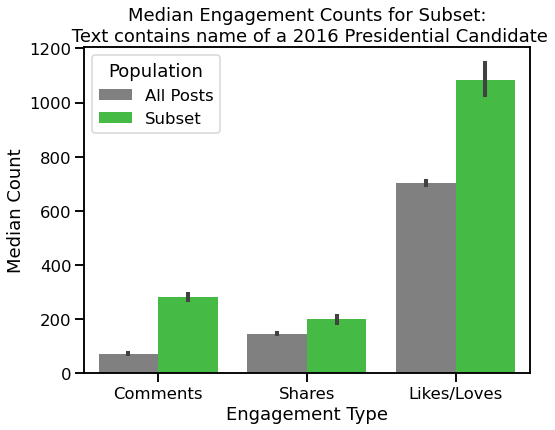

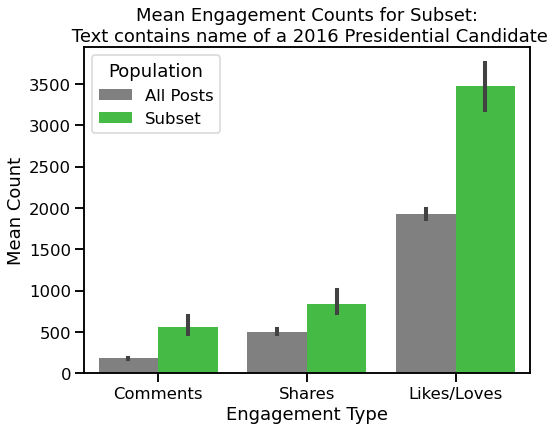

In [380]:
# posts containing 2016 presidential candidates names
terms = ['trump', 'donald', 'bernie', 'sanders', 'clinton', 'hillary']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains name of a 2016 Presidential Candidate'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

More likes/loves and comments than shares. People may not have been as eager to share these types of posts widely, given the polarity of that race and likelihood that they have friends in the opposite political party.

### Obama

Number of hits: 2094


Top engagement:


,all_text,comments_count,shares_count,likes_loves
13916,"Timeline Photos. In the Oval Office President Obama hugs Nina Pham, a nurse who was infected with Ebola while caring for a patient in Dallas. Ms. Pham was declared virus free and released from the hospital on Friday. Photo: Stephen Crowley/The New York Times",8351,20434,238585
17727,"“I know because I won both of them.”. “I have no more campaigns to run,” President Obama said in his State of the Union address. The Republican side of the chamber broke out in cheers and President Obama, cracking a sly smile, responded: “I know because I won both of them.”Sign up for our free video newsletter and get all of our State of the Union highlights tomorrow morning: http://nyti.ms/1ulbBXf",6078,31170,97538
27626,"Mount McKinley Will Be Renamed Denali. Breaking News: President Barack Obama has announced that Mount McKinley is being renamed Denali, restoring an Alaska Native name with deep cultural significance to the tallest mountain in North America. On the eve of his visit to Alaska, President Obama announced the restoration of the Alaska Native name for the tallest peak in North America.",2954,14242,78110
47562,President Obama and Michelle Obama danced to 'Thriller' and the president sang “Purple Rain” at the White House Halloween celebration,2686,13880,72537
43338,"Obama Writes Feminist Essay in Glamour. “We need to keep changing the attitude that raises our girls to be demure and our boys to be assertive, that criticizes our daughters for speaking out and our sons for shedding a tear,” President Obama wrote in Glamour. The president wrote a 1,500-word essay in the magazine, calling for equality and explaining that it was important to his daughters that he be a feminist.",2067,25531,161219
17726,Obama on Actions Against Climate Change. 'The Pentagon says that climate change poses immediate risks to our national security. We should act like it.' — President Barack ObamaSign up for our free video newsletter and get all of our State of the Union highlights tomorrow morning: http://nyti.ms/1ulbBXf,4372,8116,51895
46972,"To the First Lady, With Love. Michelle Obama has spent the past 8 years quietly and confidently changing the course of American history. Four thank-you notes to Michelle Obama.",1813,17589,117434
42285,"With Obama, the Personal Is Presidential. 'If, as was often said about black pioneers in sports, you had to be twice as good to succeed, Barack Obama’s personal behavior has set a standard few presidents have ever reached.' Read on in The New York Times Opinion Section. No matter what you think of his time in office, it’s hard to argue that the human being has been anything less than a model of class and dignity.",1883,13207,64968
29078,"Obama Reacts to Oregon Shooting: ‘We’ve Become Numb to This’. President Barack Obama, visibly angry and frustrated, lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.“Does anybody really believe that?” he asked, clearly outraged. During a televised briefing with reporters, President Obama lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.",2760,7078,49805
18420,Timeline Photos. A young Barack Obama was first profiled in The New York Times 25 years ago today: http://nyti.ms/1yQy6FD,1661,24291,63576



Least engagement:


,all_text,comments_count,shares_count,likes_loves
12968,"The New York Times. Please keep the great questions coming for Nick Confessore. We're chatting about his article, 'How School Lunch Became the Latest Political Battleground' (http://nyti.ms/ZRDfmt), for another 30 minutes. Join in: http://on.fb.me/ZSiqXZ . Live Now: Join Times reporter Nick Confessore for a Q&A on 'the strange and fascinating world of the American school lunch -- and the Obama administration's experiment in transforming what kids eat every day.' Some topics we're hoping to discuss: 1) For parents: What is your kids' favorite food at school? Least favorite?2) The government has set nutrition standards for school foods for decades, and spends billions of taxpayer dollars on school foods. Should the government play less or more of a role in setting standards?3) How much can we rely on schools to teach good eating habits, and how much on parents?",12,3,109
3234,"At Restaurant, Delay Is Help on Health Law. 'Another year to plan' for critics of the employer mandate in the Obama health care law. Businesses hovering around the threshold that would mandate health coverage for employees appreciate having another year to plan.",14,4,65
11088,"Timeline Photos. Background on goals, tactics and the potential long-term threat to the U.S. from the militant group known as the Islamic State in Iraq and Syria: http://nyti.ms/1uwMHpr (Credit: Reuters)Follow our analysis of President Barack Obama's speech on ISIS here: http://nyti.ms/1tLDRpK",13,7,70
14928,"John Doar, Federal Lawyer in Battle Against Segregation, Dies at 92. In 2012, John Doar was awarded the Presidential Medal of Freedom, the country’s highest civilian honor. In giving him the award, President Obama called him the “face of the Justice Department in the South.”. Mr. Doar who as chief lawyer for the Justice Department’s civil right divisions oversaw the prosecution of Klansmen and others in the south, later led the team advising the Judiciary Committee on whether to impeach President Nixon.",3,19,31
11266,"Op-Talk: Readers Respond: Wary Support for Obama’s ISIS Strategy. From the Opinion section of The New York Times:. In comments on various articles about the president’s speech, readers discussed ISIS and the perceived need for the U.S. to respond to recent events in Iraq.",8,1,91


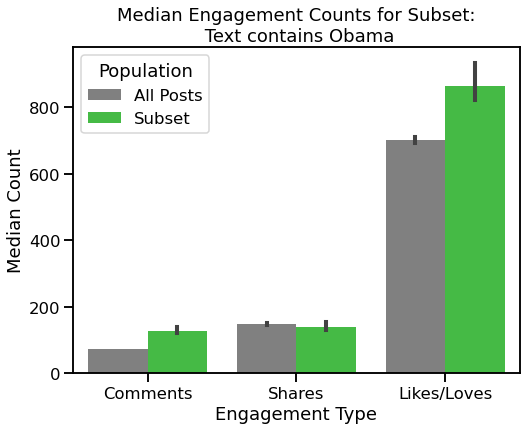

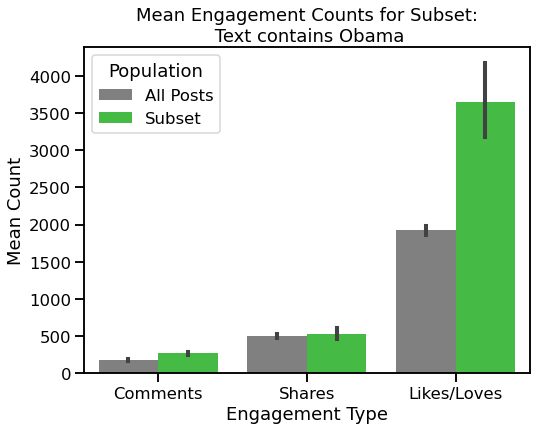

In [386]:
terms = ['obama', 'barack']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Obama'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Women

Number of hits: 1677


Top engagement:


,all_text,comments_count,shares_count,likes_loves
43587,"Goodbye to ‘Honeys’ in Court, by Vote of American Bar Association. It's official. The use of 'honey' or 'darling' to address women in court will now result in a penalty, the American Bar Association voted. The American Bar Association revised its ethics rule to forbid lawyers from using demeaning or misogynistic terms or actions.",3612,17473,123087
45985,"Hillary Clinton Will Not Be Manterrupted. 'Hillary Clinton didn’t snap at Donald J. Trump when he interrupted her last night. Rather than engage in the Trump game of verbal chicken, she stood back, calmly, collectedly, and let him self-destruct. It’s safe to assume it’s a tool she’s had 6 decades to perfect.' (via The New York Times Opinion Section). Donald Trump’s behavior on the debate stage was reminiscent of what many women deal with every day.",2020,26227,105227
46821,"The Times’s Lawyer Responds to Donald Trump. Donald J. Trump's lawyer asked The New York Times to retract an article that featured 2 women accusing Trump of touching them inappropriately years ago, and issue an apology. This was the NYT lawyer's response. This is the letter David McCraw, vice president and assistant general counsel of The New York Times, wrote in response to a request from Marc E. Kasowitz, Mr. Trump's lawyer, to retract an article that featured two women accusing Mr. Trump of touching them inappropriately years ago, and issue an apo...",2058,12180,67678
47167,"On Abortion, Clinton Takes Ownership of Her Feminism. 'Hillary Clinton owned her feminism. She sounded like the first woman running for president, defending other women — our autonomy and our control of our own bodies,' Emily Bazelon writes in The New York Times Opinion Section. Presidential candidates have soft-pedaled their views on the subject. Clinton hasn't.",2184,6119,115789
46822,"Michelle Obama on Donald J. Trump's comments on women: 'I have to tell you that I listen to all of this, and I feel it so personally .. The shameful comments about our bodies. The disrespect of our ambitions and intellect. The belief that you can do anything you want to a woman? It is cruel. It's frightening. And the truth is, it hurts.'",1662,14471,46119
46635,"Trump’s Second Debate, in Brief. He lied about a sex tape. He lied about tax rates. He lied about ISIS. He lied about the Benghazi attack. He lied about Russia's hacking. He lied about his history of groping women without their consent. Read on in The New York Times Opinion Section. He just lies. Relentlessly.",1762,11482,34464
37995,"Harriet Tubman to Appear on $20 Bill, While ‘Hamilton’ Mania Keeps Him on $10. Harriet Tubman, an African-American who ferried thousands of slaves to freedom, will replace the slaveholding Andrew Jackson on the center of a new $20 note. Ms. Tubman, who ferried thousands of slaves to freedom, will be just one among multiple depictions of women and civil rights leaders on new currency designs.",1253,12140,45682
46812,"Voice Shaking, Michelle Obama Calls Trump Comments on Women ‘Intolerable’. 'I can’t stop thinking about this — it has shaken me to my core,' Michelle Obama said of lewd remarks by Donald J. Trump. The first lady exhorted voters in visceral terms to reject Donald J. Trump’s candidacy and back Hillary Clinton as a matter of conscience.",1344,7295,42299
31015,"Uterus Transplants May Soon Help Some Infertile Women in the U.S. Become Pregnant. Breaking News: Within the next few months, surgeons at the Cleveland Clinic expect to become the first in the U.S. to transplant a uterus into a woman who lacks one, so that she can become pregnant and give birth. The recipients will be women who were either born without a uterus, had it removed or have uterine damage. The transplants will be temporary: Each uterus will be removed after the recipient has had 1 or 2 babies. Surgeons at the Cleveland Clinic are set to become the first in the United States to transplant a uterus.",1248,8812,20805
46516,"The Slea


Least engagement:


,all_text,comments_count,shares_count,likes_loves
17141,"Where Working Women Are Most Common. Where are women working in Detroit, and where aren't they? See the female employment rate for every Census tract in the United States, along with analysis of the trends. Female employment rates have continued rising in most rich countries, but they have been falling in the United States since 2000.",0,13,35
17152,"Where Working Women Are Most Common. Where are women working in San Francisco, and where aren't they? See the female employment rate for every Census tract in the United States, along with analysis of the trends. Female employment rates have continued rising in most rich countries, but they have been falling in the United States since 2000.",2,9,38
11163,"Movie Heroines Show What Girls Are Made Of. In many movie genres, the representation of girls and women is improving. But there’s a long way to go.",5,3,9
13419,"Freezing Plans for Motherhood and Staying on the Job - Room for Debate - NYTimes.com. Facebook and Apple have announced that they will cover up to $20,000 of the cost of egg freezing for female employees. Should doctors encourage women to use the procedure more routinely? Do companies send the wrong message by offering this coverage? Read the debate in Opinion. Should doctors encourage young women to freeze their eggs? Do companies send the wrong message by covering the procedure?",1,4,9
11162,"Representation of Female Characters in Movies Is Improving. In many movie genres, the representation of girls and women is improving. But there’s a long way to go.",0,0,12


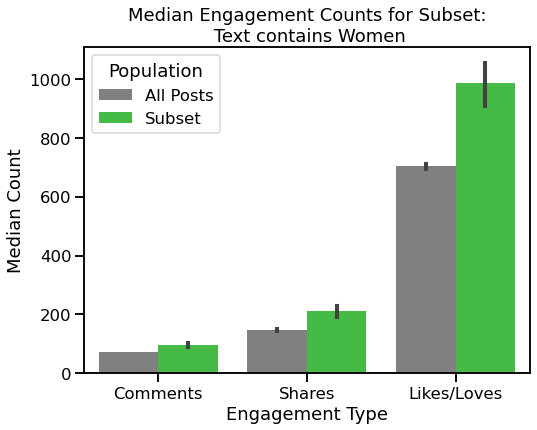

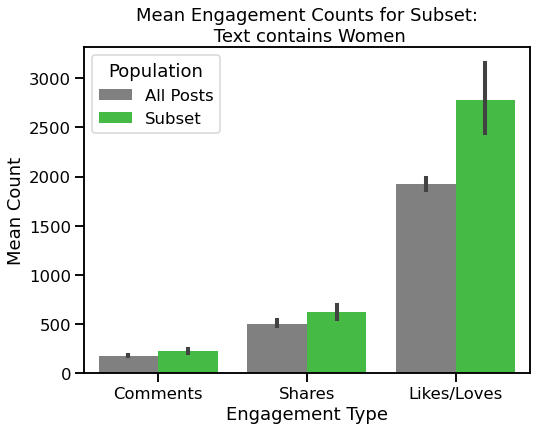

In [343]:
# posts containing women
terms = ['women']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Women'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

Many of the posts with the word 'women' are actually related to Donald Trump's words and actions regarding women, so I think the strength of this word is definitely partially due to its relation to the presidential race.

### Breaking News

Number of hits: 1074


Top engagement:


,all_text,comments_count,shares_count,likes_loves
31850,"Mark Zuckerberg and Wife Pledge 99% of Their Facebook Shares to Charity. Breaking News: Mark Zuckerberg and his wife, Dr. Priscilla Chan, pledged to give to charity 99% of their Facebook shares, currently worth $45 billion. The plan, involving a new organization to manage the money, was made in an open letter to their newborn daughter, Max.",2842,15801,104802
27626,"Mount McKinley Will Be Renamed Denali. Breaking News: President Barack Obama has announced that Mount McKinley is being renamed Denali, restoring an Alaska Native name with deep cultural significance to the tallest mountain in North America. On the eve of his visit to Alaska, President Obama announced the restoration of the Alaska Native name for the tallest peak in North America.",2954,14242,78110
27809,Kim Davis Ordered Jailed in Kentucky Gay Marriage Dispute. Breaking News: A federal judge has ordered Kim Davis to jail for contempt of court because of her refusal to issue marriage licenses to same-sex couples. A federal judge found the county clerk in contempt for refusing to obey court orders that she issue marriage licenses to same-sex couples.,4324,13821,50902
32534,"Martin Shkreli Arrested on Fraud Charges. Breaking News: Martin Shkreli has been arrested in a securities fraud case. His company, Turing Pharmaceuticals, has drawn scrutiny for acquiring a decades-old drug and raising the price of it overnight to $750 a pill, from $13.50. The entrepreneur, who has been criticized for price gouging on drugs, faces securities fraud charges related to his work at MSMB Capital Management and Retrophin.",3257,17060,47839
47796,"F.B.I. Says It Hasn’t Changed Its Conclusions on Hillary Clinton Email Case. Breaking News: The FBI says it hasn't changed its conclusion on Hillary Clinton's email server. This rules out a renewed investigation for now. The F.B.I. director informed Congress on Sunday that “based on our review, we have not changed our conclusions” about Mrs. Clinton’s use of a private server.",2738,16282,55045
46791,"Bob Dylan Wins Nobel Prize in Literature. Breaking News: Bob Dylan has won the Nobel Prize in Literature for 'poetic expressions within the great American song tradition.'. He is the first American to win since the novelist Toni Morrison, in 1993. The announcement, in Stockholm, came as something of a surprise.",2167,33683,79557
24729,"Gay Marriage Backers Win Supreme Court Victory. Breaking News: The Supreme Court ruled today that the Constitution guarantees a nationwide right to same-sex marriage. The decision came against the backdrop of fast-moving changes in public opinion, with polls indicating that most Americans now approve of same-sex marriage.",1934,36416,112449
35187,"Harper Lee, Author of ‘To Kill a Mockingbird,’ Dies at 89. Breaking News: Harper Lee is dead at 89. Her novel “To Kill a Mockingbird” became one of America's most beloved works of fiction. Ms. Lee’s novel about racial injustice in a small Alabama town became one of the most beloved and most taught works of fiction ever written by an American.",2373,52053,31229
34848,"Physicists Detect Gravitational Waves, Proving Einstein Right. Breaking News: Scientists have found evidence for one of Einstein’s famed prophecies. They captured the sound of black holes colliding. Scientists say they heard the faint chirp of two black holes colliding a billion light-years away, fulfilling Einstein’s general theory of relativity.",1632,26980,62199
9612,"American Major General Reported Killed in Afghanistan. Breaking News: A United States Army major general was killed on Tuesday by an Afghan soldier. The officer was the highest-ranking member of the American military to die in hostilities in the Afghanistan war. The American officer was shot at close range by an Afghan soldier at a military academy, a coalition official said.",3870,9816,23319



Least engagement:


,all_text,comments_count,shares_count,likes_loves
2248,"‘Swatting’ Hoax Tests the Police and Stars Alike. What once was merely a police annoyance in Southern California —pranksters filing a false report of a breaking horrific crime at celebrity’s home, designed to provoke the dispatch of SWAT teams — has turned into a full-blown “swatting” epidemic. See which stars have become victims of the pranks. Thrill-seeking pranksters have been filing false reports of breaking horrific crimes at celebrities’ homes, designed to provoke the dispatch of SWAT teams.",13,23,107
41615,"Sam Borden. Join Sam Borden for a discussion on UEFA EURO 2016. UEFA EURO 2016 has been full of surprises, but none bigger than how well Iceland played, most recently against the England Football Team. I’m here at the Stade Pierre Mauroy in Lille, France, breaking down the remaining quarter-final matches, and taking your questions on anything related to soccer and Euro 2016.",9,0,225
27449,"Steep Swings for Chinese Shares as Global Markets Turn Mixed. Breaking News: The major American indexes surged in afternoon trading in a reversal from the sharp sell-off in recent days. Shanghai stocks staged a wild ride before turning lower at the close, while Japanese and South Korean markets rebounded and European shares edged down.",10,20,117
9906,"After First Round of Balloting, Rob Manfred Is Within One Vote of Becoming New M.L.B. Commissioner. Breaking News: Rob Manfred, a high-ranking executive in Major League Baseball Players Association for many years, was chosen by the league’s owners to succeed Bud Selig as commissioner, one of the most powerful positions in sports. The vote was taken after Tim Brosnan, a top executive in Major League Baseball and a long-shot choice to become the next commissioner, withdrew from the race.",10,12,90
10281,Live Updates: Emmys 2014. Follow the Emmy Awards now on our live blog. Can any show supplant Breaking Bad or Modern Family as top drama or comedy? . The 66th Primetime Emmy Awards will take place Monday night in Los Angeles. Can any show supplant “Breaking Bad” or “Modern Family” as top drama or comedy?,8,4,96


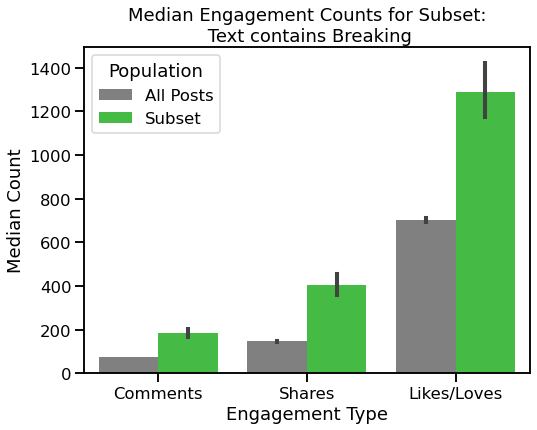

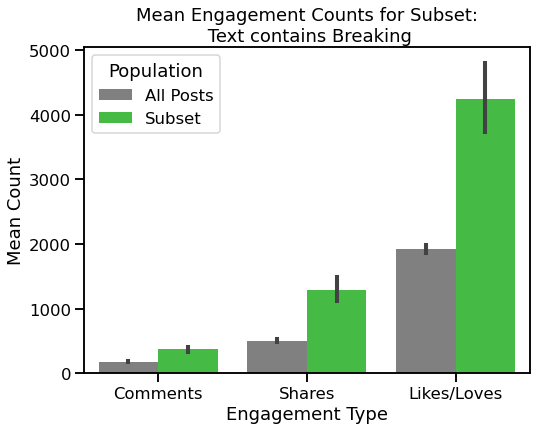

In [344]:
# posts containing breaking or breaking news
terms = ['breaking news', 'breaking']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Breaking'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)


A pretty broad set of topics here, and significantly higher engagement across all categories.

### Opinion

Number of hits: 3923


Top engagement:


,all_text,comments_count,shares_count,likes_loves
32003,"End the Gun Epidemic in America. It is a moral outrage and national disgrace, writes the Times Editorial Board, that Americans can purchase weapons designed to kill people with brutal speed and efficiency. Read the full editorial in The New York Times Opinion Section. It is a moral outrage and national disgrace that civilians can legally purchase weapons designed to kill people with brutal speed and efficiency.",3861,18625,47722
45878,"Why Donald Trump Should Not Be President. Americans should 'take a hard look' and see Donald J. Trump for who he is, the Editorial Board writes in The New York Times Opinion Section. Donald Trump is a man who dwells in bigotry, bluster and false promises.",2536,16961,46401
45985,"Hillary Clinton Will Not Be Manterrupted. 'Hillary Clinton didn’t snap at Donald J. Trump when he interrupted her last night. Rather than engage in the Trump game of verbal chicken, she stood back, calmly, collectedly, and let him self-destruct. It’s safe to assume it’s a tool she’s had 6 decades to perfect.' (via The New York Times Opinion Section). Donald Trump’s behavior on the debate stage was reminiscent of what many women deal with every day.",2020,26227,105227
24729,"Gay Marriage Backers Win Supreme Court Victory. Breaking News: The Supreme Court ruled today that the Constitution guarantees a nationwide right to same-sex marriage. The decision came against the backdrop of fast-moving changes in public opinion, with polls indicating that most Americans now approve of same-sex marriage.",1934,36416,112449
47615,"Donald Trump Voters, Just Hear Me Out. 'Yes, Hillary Clinton is a flawed leader. But Donald J. Trump is not only a flawed politician — he’s also an indecent human being,' Thomas Friedman writes in The New York Times Opinion Section. Fellow Americans, your concerns should be taken seriously. But let’s also look seriously at the candidates.",2255,11526,42158
42285,"With Obama, the Personal Is Presidential. 'If, as was often said about black pioneers in sports, you had to be twice as good to succeed, Barack Obama’s personal behavior has set a standard few presidents have ever reached.' Read on in The New York Times Opinion Section. No matter what you think of his time in office, it’s hard to argue that the human being has been anything less than a model of class and dignity.",1883,13207,64968
36458,"No, Not Trump, Not Ever. 'Donald J. Trump insults the office Abraham Lincoln once occupied by running for it with less preparation than most of us would undertake to buy a sofa.'Read on in The New York Times Opinion Section. Voters deserve respect, but this year, their candidate does not.",1820,17446,50482
27481,"Enough Is Enough. 'This man is not worthy of the attention he’s garnering. We in the media have to own our part in this. We can’t say he’s not serious and then cover him in a way that actually demonstrates that we are not serious,' writes Charles Blow. Read on in The New York Times Opinion. When people refer to the press as the fourth estate, it shouldn’t be confused with a Trump property.",2194,9576,36457
47167,"On Abortion, Clinton Takes Ownership of Her Feminism. 'Hillary Clinton owned her feminism. She sounded like the first woman running for president, defending other women — our autonomy and our control of our own bodies,' Emily Bazelon writes in The New York Times Opinion Section. Presidential candidates have soft-pedaled their views on the subject. Clinton hasn't.",2184,6119,115789
46971,"Donald Trump, the Worst of America. Donald J. Trump is the logical extension of toxic masculinity and ambient misogyny. He is the logical extension of rampant racism, Charles M. Blow writes in The New York Times Opinion Section. He has mocked, whined, chided, bemoaned and belittled",1968,10630,33426



Least engagement:


,all_text,comments_count,shares_count,likes_loves
8813,"Special Independence Day Offer. Get a New York Times subscription and save 50% for 26 weeks. Don’t miss this opportunity to enjoy exceptional savings on your choice of Times subscription: Home Delivery, Unlimited Digital or NYT Opinion.",3,9,34
9617,How Wikipedia Could Improve Your Internet Surfing. Getting lost in a Wikipedia rabbit hole could actually be a good thing. Read on in Opinion. Could the encyclopedia site reinsert the unexpected into what some say has become an all-too-predictable online world?,3,7,22
11242,"Letter: On Long Island, a Worthy Plan for Coastal Flooding. From the Opinion section of The New York Times:. Steve Bellone, the Suffolk County (N.Y.) executive, responds to an Op-Ed article, “A Beach Project Built on Sand.”",0,3,63
13419,"Freezing Plans for Motherhood and Staying on the Job - Room for Debate - NYTimes.com. Facebook and Apple have announced that they will cover up to $20,000 of the cost of egg freezing for female employees. Should doctors encourage women to use the procedure more routinely? Do companies send the wrong message by offering this coverage? Read the debate in Opinion. Should doctors encourage young women to freeze their eggs? Do companies send the wrong message by covering the procedure?",1,4,9
9792,"Will 3-D Printers Change the World?. Can 3-D printing live up to its hype? Read on in Opinion. For all the hype over three-dimensional printing, it’s still unclear exactly how and when it will have an impact on our daily lives.",1,3,15


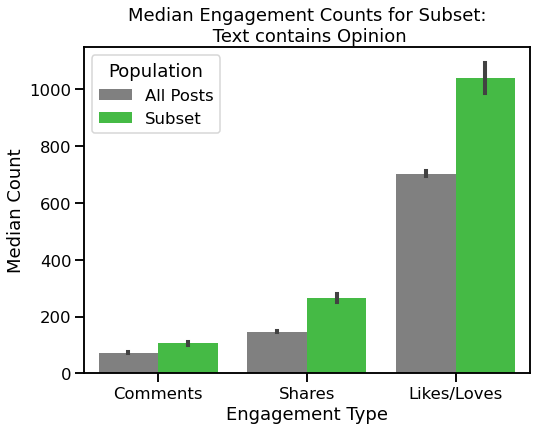

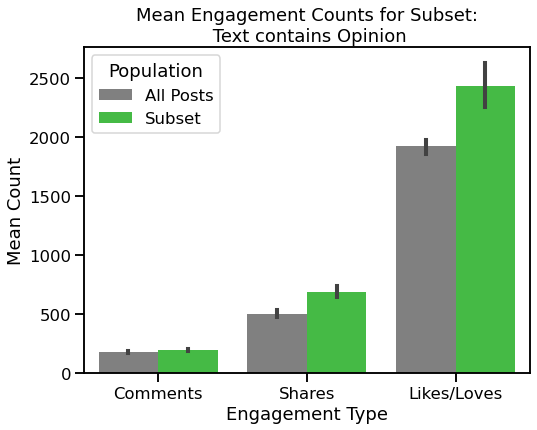

In [345]:
# posts containing opinion
terms = ['writes opinion', 'read opinion', 'opinion']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Opinion'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

The top opinion-related posts are also related to the presidential candidates, Trump's views on women, and gun violence.

### Recipe

Number of hits: 935


Top engagement:


,all_text,comments_count,shares_count,likes_loves
45139,Chocolate Chip Cookies. The only chocolate chip cookie you’ll ever need.Get the legendary recipe: http://nyti.ms/1RYcXIa,3634,35360,21355
44817,"Dutch Baby. The Dutch baby: When a light, crispy popover meets a tender, sweet pancake.Full recipe: http://nyti.ms/2bWcbLS",1212,6530,9575
44638,"Chicken shawarma, no food cart or rotisserie required.Full recipe: http://nyti.ms/1dlVWVe",1115,7755,8957
23715,"Lemon Bars With Olive Oil and Sea Salt Recipe. It's like your childhood favorite grew up and studied abroad in Italy for a semester. Traditional lemon bars balance the tangy sweetness of lemon curd with a rich shortbread crust This recipe adds extra notes of flavor to the mix: the compelling bitterness of good olive oil and a touch of sea salt sprinkled on top They lend a mild savory character to this childhood favorite, making i…",731,6922,15158
44939,"Cold sesame noodles: Salty, sweet, fiery and ready in 10 minutes.Full recipe: http://nyti.ms/1fbW0HT",931,5172,10164
33949,NYT Food on Instagram: “Make #baklava at home. @clarkbar has a new #NYTCooking recipe inspired... This pistachio baklava recipe comes from one of the most celebrated baklava shops in Istanbul. Check out the recipe: http://nyti.ms/1P91i6cPhoto: Andrew Scrivani for The New York Times. “Make #baklava at home. @clarkbar has a new #NYTCooking recipe inspired by a recent trip to Istanbul. You'll find it through our profile link. (Photo:…”,845,3463,11491
45674,How to Make Butter-Roasted Salmon. Mark Bittman's roasted salmon makes for an astonishingly easy dinner.Get the 15-minute recipe: http://nyti.ms/1LjazIp,889,4851,8489
37663,"Roasted Brussels Sprouts With Garlic Recipe. The only brussels sprouts recipe you'll ever need. If you haven’t yet figured out a go-to recipe for brussels sprouts, this simple dish is the answer It results in sweet caramelized brussels sprouts that will make a believer out of anyone.",879,4154,7164
21536,"Peanut Butter and Pickle Sandwich Recipe. Need a late-night snack?. This sandwich does not necessarily need a recipe, given its simplicity But it’s an unlikely pairing, is peanut butter and pickle, and sometimes that is what a recipe is for -- to prod you in a direction that you never considered Dwight Garner, a book critic for The Times, makes a strong case for thi…",1443,4339,5497
34589,"Milk Chocolate Hazelnut Panna Cotta Recipe. Attention, Nutella lovers. Set with gelatin instead of egg yolks, panna cottas are lighter - and easier to prepare - than most puddings This one owes its richness of flavor to a healthy dose of Nutella and bittersweet chocolate.",752,2426,7848



Least engagement:


,all_text,comments_count,shares_count,likes_loves
2984,"The New York Times Food. Love to cook? Participate in a Recipe Lab video chat: http://nyti.ms/11TUVq5. Calling all home cooks: Are you interested in participating in our monthly Recipe Lab live video chat?We're looking to cast home cooks for our chats with Dining reporter Julia Moskin, a featured chef and cookbook author and other Recipe Lab participants. Whether you're a passionate baker or interested in exploring global cuisine, we want to hear from you. Let us know you're interested by signing up here: http://nyti.ms/14sWDE8",4,10,144
1925,"Recipe Lab Video Chat With Nigella Lawson. Join Times Dining reporter Julia Moskin and the cookbook author Nigella Lawson for a live video chat today at 3:30 p.m. Eastern time to talk about food, cooking and Ms. Lawson's new cookbook, 'Nigellissima.'. Join the cookbook author Nigella Lawson, Julia Moskin of The Times and three home cooks for a live video chat about a recipe from Ms. Lawson’s new cookbook, “Nigellissima.”",6,15,93
15254,"Our Thanksgiving Recipe for Delaware: Du Pont Turkey With Truffled Zucchini Stuffing. If you had to pick one dish to represent Delaware on the Thanksgiving table, what would it be? Here's ours",6,18,16
3463,"Recipe Lab Video Chat on ‘Jerusalem’. Join the live video chat at 2 p.m. Eastern time about a fragrant one-pot chicken dish, infused with fresh herbs and served with a cooling yogurt sauce: http://nyti.ms/17U2FOh. Join Julia Moskin, “Jerusalem: A Cookbook” authors Yotam Ottolenghi and Sami Tamimi and three home cooks for a live video chat at 2 p.m. Eastern time.",4,11,104
3455,"Chicken With Cardamom Rice From ‘Jerusalem’. For this month’s Recipe Lab series by the Dining section of The New York Times, we will be discussing “Jerusalem: A Cookbook” by Yotam Ottolenghi and Sami Tamimi, a cookbook that has become a surprise hit with a near cult following (and 200,000 copies in print) since it was published last fall. Watch live from 2:00 to 2:30 p.m. Eastern time on Wednesday, July 31 as Mr. Ottolenghi, Mr. Tamimi and Julia Moskin of The Times speak with each other and three home cooks about why this cookbook has been such a hit and how to make the authors' recipe for chicken with cardamom rice. Post a comment or question here and the authors may answer it on air. Julia Moskin cooks chicken with onions and cardamom rice from the cookbook “Jerusalem.” The winner, and our featured Recipe Lab dish, is chicken with caramelized onion and cardamom rice.",6,5,23


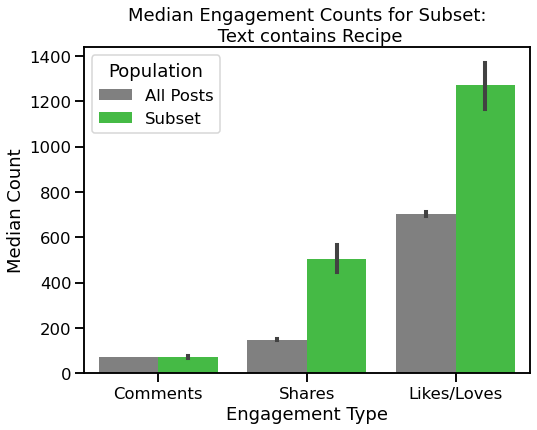

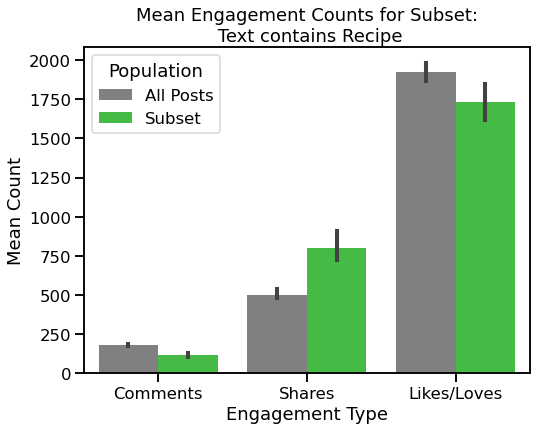

In [346]:
# posts containing recipe
terms = ['recipe']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Recipe'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

Recipes get a lot more likes/loves and shares than comments. Shares in particular make sense, since people like sharing recipes with each other offline too.

5 out of the top 10 recipes are for dessrts.

### Gun

Number of hits: 447


Top engagement:


,all_text,comments_count,shares_count,likes_loves
32003,"End the Gun Epidemic in America. It is a moral outrage and national disgrace, writes the Times Editorial Board, that Americans can purchase weapons designed to kill people with brutal speed and efficiency. Read the full editorial in The New York Times Opinion Section. It is a moral outrage and national disgrace that civilians can legally purchase weapons designed to kill people with brutal speed and efficiency.",3861,18625,47722
31972,How a Conservative-Led Australia Ended Mass Killings. The statistic in Australia is a simple one: There have been no mass killings since the nation significantly tightened its gun control laws almost 20 years ago. Australia has had no killings of five or more since a 1996 rampage spurred a tightening of laws. Other forms of gun violence have fallen as well.,2637,17872,68639
29078,"Obama Reacts to Oregon Shooting: ‘We’ve Become Numb to This’. President Barack Obama, visibly angry and frustrated, lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.“Does anybody really believe that?” he asked, clearly outraged. During a televised briefing with reporters, President Obama lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.",2760,7078,49805
32240,"Connecticut to Ban Gun Sales to Those on Federal Terrorism Lists. Breaking News: Gov. Dannel Malloy says he will ban people on federal terror lists from buying firearms in Connecticut. The state would become the first in the U.S. to enact such a measure. Gov. Dannel P. Malloy announced the executive order on Thursday, saying that Connecticut would become the first state in the nation to enact such a measure.",1657,4230,36655
33223,Timeline Photos. Breaking News: President Barack Obama will bypass Congress and announce executive actions on Tuesday to expand gun background checks and step up enforcement of gun laws. Read more: http://nyti.ms/1Z3ojhw,1257,5532,37478
21059,"South Carolina Officer Is Charged With Murder in Black Man’s Death. Breaking News: A white police officer in North Charleston, S.C., was charged with murder after a video surfaced showing him shooting in the back and killing an apparently unarmed black man while the man ran away. The North Charleston officer had said that the man took his stun gun, but a video shows the officer firing eight times as the man, who was apparently unarmed, fled.",2061,9128,13438
33251,"Tearful Obama, Announcing Gun Control Steps, Condemns Shootings. With tears streaming down his face, President Barack Obama condemned the repeated spasms of gun violence across America. “Every time I think about those kids, it gets me mad,” the president said, discussing the victims of the Sandy Hook Elementary School shooting.",1278,3755,37929
29082,President Barack Obama expressed frustration over the Oregon shooting: 'It cannot be this easy for somebody who wants to inflict harm on other people to get his or her hands on a gun.',1465,3345,21403
34307,"Facebook Moves to Ban Private Gun Sales on Its Site and Instagram. Breaking News: Facebook is banning gun sales on its network, which had become a way for private dealers to elude background checks. The ban, which does not apply to posts by licensed gun dealers, will also apply to the company’s photo-sharing service.",1023,3068,22306
32006,"Gun Debate Yields Page One Editorial. The last time The Times ran an editorial on the front page was in 1920. “The Gun Epidemic,” The New York Times’s first front page editorial since 1920, says it is “a national disgrace that people can legally purchase weapons designed specifically to kill people with brutal speed and efficiency.”",693,6024,24231



Least engagement:


,all_text,comments_count,shares_count,likes_loves
11868,"Your inaugural edition of First Draft. Today, the White House is reviewing the locks on its doors, 91-year-old Bob Dole hits the campaign trail, and the Clintons mix with scientists and starlets at their annual conference. You'll find it all in your inaugural edition of First Draft, a new politics site and daily newsletter from The Times. Gillibrand’s Weight Watcher Revealed, and a Presidential Nominee Is Sunk; Alaska Ad Finds a Target in Begich’s Support of Gun Rights;",14,11,160
12304,"City Room: New York Today: In Central Park, With a Speed Gun. Monday: Cyclists versus reporters in Central Park, more warm weather, and it’s National Coffee Day.",12,12,158
39984,Video From The New York Times. Veronica Lopez was one of the first fatalities due to gun violence this weekend in Chicago. We are at a memorial gathering organized for Veronica outside of North-Grand High School. Veronica Lopez was one of the first fatalities due to gun violence this past weekend in Chicago. The 15-year-old has become symbolic of the city's struggle with violence. We are at a memorial gathering organized for Veronica outside of North-Grand High School.,16,0,145
2239,"Video: The Top Democrats to Watch in Congress. Who are the Democrats to watch as Congress debates guns and immigration this week? Three Times’ reporters weigh in. And here are the Republicans they say to keep an eye on: http://nyti.ms/10Mzfxn. The Times’s Rick Berke, Ashley Parker and Jeremy Peters pick the top Democrats to watch as Congress begins a week of intense debate on gun legislation and immigration.",13,10,131
40278,"Video From The New York Times. Yesterday we published 'A Weekend in Chicago: Where Gunfire Is a Terrifying Norm': http://nyti.ms/1VDqLICThis video offers a glimpse into our reporting process. Last weekend, our reporter John Eligon met with Valencia Jenkins-Mosby and other residents to discuss their experiences living in the Englewood neighborhood. About 21 minutes into this video, Valencia shares her concerns about how the media covers Chicago. We’re in Chicago’s Englewood neighborhood with John Eligon, one of NYT’s national correspondents, talking withValencia Jenkins-Mosby, Shelton Finley, Sherm Murdock and other residents about their experiences living in one of the city’s roughest neighborhoods.This weekend, we’re examining gun violence in Chicago, one of America’s most violent cities. We will be live throughout the weekend with Times journalists who are exploring this issue.",6,0,60


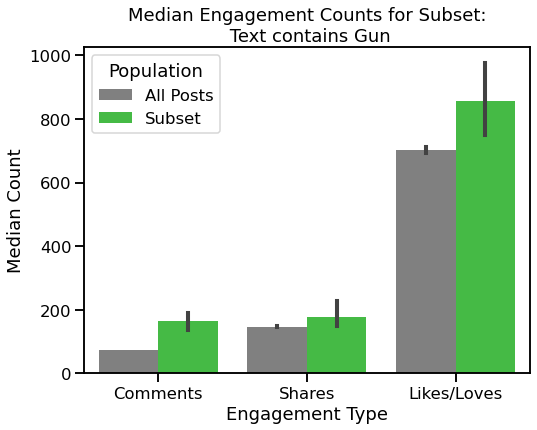

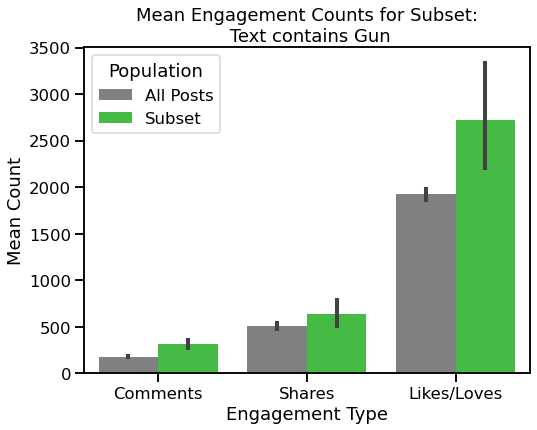

In [347]:
# posts containing gun
terms = ['gun']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Gun'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

Comments have the most significant increase over the general population; shares and likes/loves aren't significantly higher.

The topics are mostly on mass shootings and the gun control debate.

### White

Number of hits: 1140


Top engagement:


,all_text,comments_count,shares_count,likes_loves
47562,President Obama and Michelle Obama danced to 'Thriller' and the president sang “Purple Rain” at the White House Halloween celebration,2686,13880,72537
21059,"South Carolina Officer Is Charged With Murder in Black Man’s Death. Breaking News: A white police officer in North Charleston, S.C., was charged with murder after a video surfaced showing him shooting in the back and killing an apparently unarmed black man while the man ran away. The North Charleston officer had said that the man took his stun gun, but a video shows the officer firing eight times as the man, who was apparently unarmed, fled.",2061,9128,13438
24399,"Jon Stewart Addresses Charleston Shooting in His ‘Daily Show’ Monologue. “The Confederate flag flies over South Carolina, and the roads are named for Confederate generals, and the white guy is the one who feels like his country is being taken away from him.” –– Jon Stewart said on The Daily Show. The comedian did not include jokes in Thursday’s monologue, and chose instead to criticize what he felt was an idle response to the violence.",979,11237,46782
18034,Fading to White. Timelapse views of the snowstorm from around Manhattan,1023,10859,27323
34018,"Bloomberg, Sensing an Opening, Revisits a Potential White House Run. Breaking News: Michael Bloomberg is exploring plans for an independent presidential bid, advisers and allies say. Michael R. Bloomberg, the billionaire former mayor of New York City, is once again weighing a third-party bid for the presidency, frustrated by what he sees as a race gone haywire, associates said.",1718,5743,12590
45894,"For Some, Bush-Obama Rapport Recalls a Lost Virtue: Political Civility. The image of Michelle Obama hugging George W. Bush became an instant metaphor. The Bush and Obama families have a deep bond, thanks to the shared experience of life in the White House and George W. Bush’s decorum as an ex-president.",860,6779,54212
24771,Timeline Photos. The White House was illuminated in honor of same-sex marriage. http://nyti.ms/1SRw3N9(Photo by Zach Gibson/The New York Times),860,6121,66326
41905,What White America Fails to See. 'The greatest privilege that exists is for white folk to get stopped by a cop and not end up dead when the encounter is over.' Read on in The New York Times Opinion Section. The police and an undeclared war against blackness.,1022,7762,18015
36206,Timeline Photos. The geography of Trumpism: Donald J. Trump thrives in places with high concentrations of white “Americans” with no high school diploma: http://nyti.ms/1Wh8EFK,1373,7017,11432
45994,"Trump? How Could We?. 'It would be insanity to put him in the White House,' Thomas Friedman writes in The New York Times Opinion Section. It would be insanity to put him in the White House.",859,7012,23366



Least engagement:


,all_text,comments_count,shares_count,likes_loves
11115,"For White Sox’ Paul Konerko, 16 Years of Earning His Keep Is an Ample Farewell. Paul Konerko, a serious slugger who never left the South Side of Chicago, is retiring his way, quietly, proud of the 2005 championship and of his unbroken string of seasons in black.",7,15,121
10676,"A Wary ‘Normal’ in Ferguson, Mo. After Michael Brown was fatally shot by a police officer on Aug. 9, Ferguson, Mo., became the backdrop for a national debate. See what West Florissant Avenue looks like now. After the killing of a black teenager by a white police officer sparked a string of protests in Ferguson, Mo., the town is returning to a new normal as scars of the unrest remain.",10,6,117
18331,"Morning After Fatal Crash, Metro-North Riders Adjust to a New Commute. Did you witness the Metro-North train crash in Westchester County on Tuesday? Or do you know anyone who was involved? Times journalists would like to hear your story. Please reply below or write cityroom@nytimes.com with any information. Read more about the impact of the crash on area commuters. At the North White Plains station Wednesday morning, some passengers worried about possible delays, but no one said the accident would make them give up their rail routines.",3,13,62
11123,"Online Petitions Proposed to Offer New Yorkers a New Way to Speak Out. A councilman proposed creating a system, similar to the one used by the White House, to facilitate making requests to city officials.",1,5,78
14918,"Role for White Rat: Unexpected Star on Broadway. This rat is Broadway's unlikely new star, and she's more popular than the puppy. Toby, the rat kept by the teenager with autism in “The Curious Incident of the Dog in the Night-Time,” is so popular her role has been expanded.",1,4,25


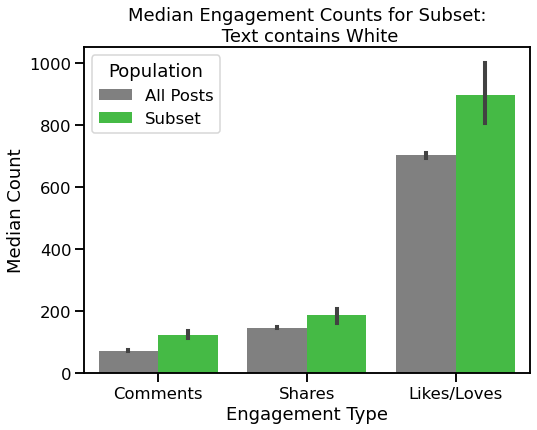

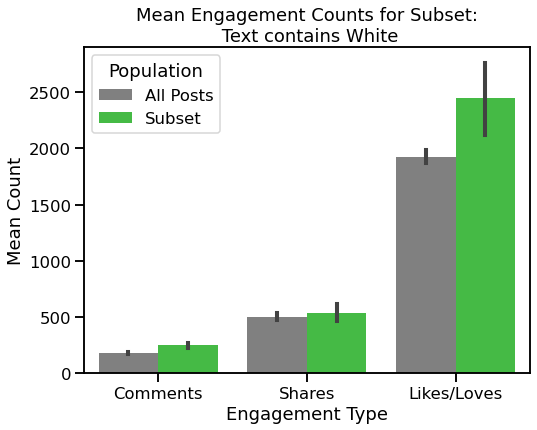

In [348]:
# posts containing recipe
terms = ['white']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains White'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

Some of these are about racial equity, but others are about the White House.

The engagement increase is most significant in likes/loves.

### Kids

Number of hits: 331


Top engagement:


,all_text,comments_count,shares_count,likes_loves
44641,What Kids Wish Their Teachers Knew. “I wish my teacher knew I don’t have pencils at home to do my homework.''I wish my teacher knew that my family and I live in a shelter.'“I wish my teacher knew how much I miss my dad because he got deported to Mexico.'. Some children were struggling with poverty (“I wish my teacher knew I don’t have pencils at home to do my homework”); an absent parent (“I wish my teacher knew that sometimes my reading log is not signed because my mom isn’t around a lot”); and a par,1639,21985,37820
36159,The Superior Social Skills of Bilinguals. Studies show being bilingual gives kids a social skills boost as well as a cognitive one. (via The New York Times Opinion Section). Yet another benefit to speaking multiple languages.,1324,14876,24836
25160,"Screen Addiction Is Taking a Toll on Children. 'If kids are allowed to play 'Candy Crush' on the way to school, the car ride will be quiet, but that’s not what kids need. They need time to daydream, deal with anxieties, process their thoughts and share them with parents, who can provide reassurance.'. American youths are plugged in and tuned out of the real world for many more hours of the day than experts consider healthy for normal development.",1105,24142,31592
33251,"Tearful Obama, Announcing Gun Control Steps, Condemns Shootings. With tears streaming down his face, President Barack Obama condemned the repeated spasms of gun violence across America. “Every time I think about those kids, it gets me mad,” the president said, discussing the victims of the Sandy Hook Elementary School shooting.",1278,3755,37929
20926,"No Kids for Me, Thanks. Whether you call it a “childless” life or going “child-free,” it represents a demographic shift. Whether you call it a “childless” life or going “child-free,” it represents a demographic shift.",1273,4035,17503
42856,"Bernie Sanders Hears Boos Again as He Asks Supporters to Back Hillary Clinton. “It’s easy, it is easy to boo,” Bernie Sanders said. “But it is harder to look your kids in the face who would be living under a Donald J. Trump presidency.”. Members of the California delegation at the Democratic convention heckled the Vermont senator as he kept trying to dissuade them from “a Donald Trump presidency.”",1060,3144,24411
31849,"Comedian Jim Gaffigan on How to Travel With 5 Kids. 'Traveling with 3- and 4-year-old boys is like transferring serial killers from a prison. You have to be constantly aware.' — Jim Gaffigan. A conversation with the comedian, who took his wife and five children on a monthlong bus tour this summer.",816,2751,22874
33085,"George Lucas Criticizes Latest ‘Star Wars’ Installment. “These are my kids. All the Star Wars films,” he said. “I love them, I created them, I’m very intimately involved in them.”He added, trailing off with a laugh: “And I sold them to the white slavers that take these things and. …”. In an interview released online this week, Mr. Lucas jokingly compared Disney, which bought the rights to the franchise in 2012, to “white slavers” who had bought his children.",1852,3854,6757
33269,"Timeline Photos. “First graders. Every time I think about those kids, it gets me mad.” President Barack Obama broke down today as he spoke about the children shot to death in 2012 at the Sandy Hook Elementary School in Connecticut. http://nyti.ms/1TCV12lPhoto: Doug Mills/The New York Times",1208,1566,25029
12928,"Rise and Shine: What Kids All Around the World Eat for Breakfast. It may be time for dinner where you are, but it's breakfast in Tokyo. See how kids around the world start their day. What do kids around the world eat for breakfast? It’s as likely to be coffee or kimchi as it is a sugary cereal.",505,8279,15306



Least engagement:


,all_text,comments_count,shares_count,likes_loves
36675,'Impossible' Homework Assignment? Let Your Child Do It. 'It's daring to step back and actually understand what your kids can do without your being present.'. I thought the assignment was too hard. It turns out it was just hard enough.,11,32,168
12936,"How School Lunch Became the Latest Political Battleground. You're invited to a lunchtime chat with Times reporter Nicholas Confessore at 12 noon, ET on Thurs. Oct. 9. Join us here on facebook.com/nytimes for a Q&A on the topics covered in his article below on 'the strange and fascinating world of the American school lunch -- and the Obama administration's experiment in transforming what kids eat every day.' . Inside the Obama administration’s standoff with Republicans, the food industry and the nation’s lunch ladies over the future of the cafeteria.",15,26,114
14297,"Bringing Lessons From a Pool in Pakistan to a Pitch Meeting With Investors. “I think I was eight and a half months pregnant when I did a final pitch at Hasbro Gaming,” said Shaan Kandawalla the creator of PlayDate Digital, which makes educational apps for kids. She won the business a week before her daughter was born. As a teenager in Pakistan, Shaan Kandawalla was not permitted to compete in the 1996 Olympics because of her gender. That background has prepared her to take on the male-dominated tech world.",10,31,126
12968,"The New York Times. Please keep the great questions coming for Nick Confessore. We're chatting about his article, 'How School Lunch Became the Latest Political Battleground' (http://nyti.ms/ZRDfmt), for another 30 minutes. Join in: http://on.fb.me/ZSiqXZ . Live Now: Join Times reporter Nick Confessore for a Q&A on 'the strange and fascinating world of the American school lunch -- and the Obama administration's experiment in transforming what kids eat every day.' Some topics we're hoping to discuss: 1) For parents: What is your kids' favorite food at school? Least favorite?2) The government has set nutrition standards for school foods for decades, and spends billions of taxpayer dollars on school foods. Should the government play less or more of a role in setting standards?3) How much can we rely on schools to teach good eating habits, and how much on parents?",12,3,109
10776,"Max Fish, Space Ibiza, Ludlow Hotel and More Open in Time for Fashion Week. 6 new bars, lounges and clubs enticing New York Fashion Week's cool kids. New bars, lounges and clubs that hope to lure the stylish pack.",7,11,113


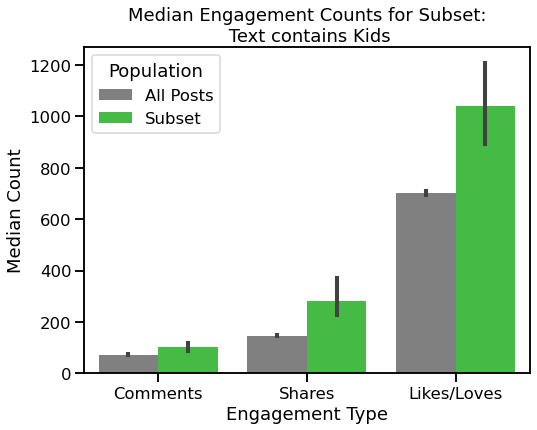

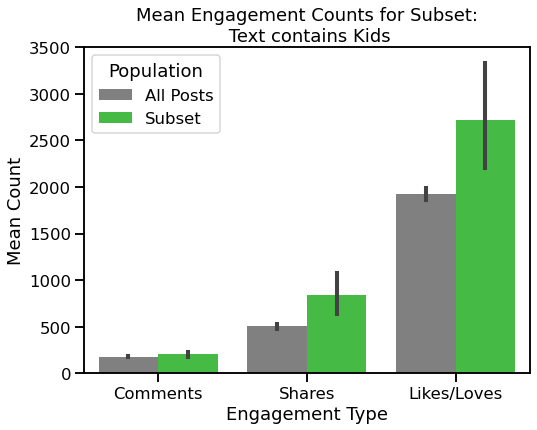

In [349]:
# posts containing kids
terms = ['kids']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Text contains Kids'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

- Video posts get significantly more comments, shares, and likes/loves.
- Photo posts get slightly more shares, and significantly more likes/loves.

### Obituaries


Top engagement:


,article_text,comments_count,shares_count,likes_loves
33487,"David Bowie Dies at 69; Star Transcended Music, Art and Fashion. Mr. Bowie taught generations of musicians about the power of drama, images and personas. He had been treated for cancer for the last 18 months.. David Bowie, the infinitely changeable, fiercely forward-looking songwriter who taught generations of musicians about the power of drama, images and personas, died on Sunday, two days after his 69th birthday.",3778,100931,51589
33647,"Alan Rickman, Watchable Villain in ‘Harry Potter’ and ‘Die Hard,’ Dies at 69. The British actor brought an erudite dignity to film roles like the nefarious mastermind of “Die Hard” and the dour master of potions in the “Harry Potter” series.. Alan Rickman, the accomplished British stage actor who brought an erudite dignity to film roles like Hans Gruber, the nefarious mastermind of “Die Hard,” and Severus Snape, the dour master of potions in the “Harry Potter” series, died on Thursday in London. He was 69.",3233,73007,36960
10938,"S. Truett Cathy, Chick-fil-A Founder, Dies at 93. Mr. Cathy ran his fast-food empire according to his conservative Christian principles, and it became a flash point in the debate over same-sex marriage.. When he introduced himself, S. Truett Cathy often played down his job.",3997,8146,66761
24972,"Nicholas Winton, Rescuer of 669 Children From Holocaust, Dies at 106. A London stockbroker in 1938, he rescued the youngsters from Czechoslovakia but then said nothing about his deeds for 50 years.. Nicholas Winton, a Briton who said nothing for a half-century about his role in organizing the escape of 669 mostly Jewish children from Czechoslovakia on the eve of World War II, a righteous deed like those of Oskar Schindler and Raoul Wallenberg, died on Wednesday in Maidenhead, England. He was 106.",1995,23828,72598
35187,"Harper Lee, Author of ‘To Kill a Mockingbird,’ Dies at 89. Ms. Lee’s novel about racial injustice in a small Alabama town became one of the most beloved works of fiction ever written by an American.. Harper Lee, whose first novel, “To Kill a Mockingbird,” about racial injustice in a small Alabama town, sold more than 40 million copies and became one of the most beloved and most taught works of fiction ever written by an American, died on Friday in Monroeville, Ala., where she lived. She was 89.",2373,52053,31229
19319,"Leonard Nimoy, Spock of ‘Star Trek,’ Dies at 83. Mr. Nimoy won a worshipful global following as Mr. Spock, the resolutely logical human-Vulcan first officer in the television and movie juggernaut “Star Trek.”. Leonard Nimoy, the sonorous, gaunt-faced actor who won a worshipful global following as Mr. Spock, the resolutely logical human-alien first officer of the Starship Enterprise in the television and movie juggernaut “Star Trek,” died on Friday morning at his home in the Bel Air section of Los Angeles. He was 83.",1828,28958,21214
27609,"Oliver Sacks, Neurologist Who Wrote About the Brain’s Quirks, Dies at 82. Dr. Sacks explored some of the brain’s strangest pathways in best-selling case histories like “The Man Who Mistook His Wife for a Hat,” achieving a level of renown rare among scientists.. Oliver Sacks, the neurologist and acclaimed author who explored some of the brain’s strangest pathways in best-selling case histories like “The Man Who Mistook His Wife for a Hat,” using his patients’ disorders as starting points for eloquent meditations on consciousness and the human condition, died on Sunday at his home in Manhattan. He was 82.",963,15418,18190
38053,"Prince, an Artist Who Defied Genre, Is Dead at 57. The prolific songwriter and performer’s decades of music transcended and remade funk, rock and R&B with hits like “Purple Rain” and “1999.”. Prince, the songwriter, singer, producer, one-man studio band and consummate showman, died on Thursday at his home, Paisley Park, in Chanhassen, Minn. He was 57.",1152,14133,10756
9769,"Robin Williams, Oscar-Winning Comedian, Dies a


Least engagement:


,article_text,comments_count,shares_count,likes_loves
14928,"John Doar, Federal Lawyer on Front Lines Against Segregation, Dies at 92. A Republican, Mr. Doar prosecuted some of the most notorious cases of murder in the South in the ’60s and was chief counsel to the House panel investigating Watergate.. John Doar, a country lawyer from northern Wisconsin who led the federal government’s on-the-ground efforts to dismantle segregation in the South, and who later headed the team that made the case for impeaching President Richard M. Nixon in the wake of the Watergate scandal, died on Tuesday at his home in Manhattan. He was 92. The cause was congestive heart failure, his son Robert said.",3,19,31
17271,"Jethro Pugh, Unsung Pillar for Cowboys on the Doomsday Defense, Is Dead at 70. Pugh played in four Super Bowls and was involved in the key play in the 1967 N.F.C. championship game known as the Ice Bowl.. Jethro Pugh, a durable lineman for the Dallas Cowboys who played in four Super Bowls as part of a famed unit nicknamed the Doomsday Defense, died on Wednesday. He was 70.",5,4,112
17268,"Jethro Pugh, Unsung Pillar for Cowboys on the Doomsday Defense, Is Dead at 70. Pugh played in four Super Bowls and was involved in the key play in the 1967 N.F.C. championship game known as the Ice Bowl.. Jethro Pugh, a durable lineman for the Dallas Cowboys who played in four Super Bowls as part of a famed unit nicknamed the Doomsday Defense, died on Wednesday. He was 70.",2,5,39
17269,"Jethro Pugh, Unsung Pillar for Cowboys on the Doomsday Defense, Is Dead at 70. Pugh played in four Super Bowls and was involved in the key play in the 1967 N.F.C. championship game known as the Ice Bowl.. Jethro Pugh, a durable lineman for the Dallas Cowboys who played in four Super Bowls as part of a famed unit nicknamed the Doomsday Defense, died on Wednesday. He was 70.",2,2,17
17270,"Jethro Pugh, Unsung Pillar for Cowboys on the Doomsday Defense, Is Dead at 70. Pugh played in four Super Bowls and was involved in the key play in the 1967 N.F.C. championship game known as the Ice Bowl.. Jethro Pugh, a durable lineman for the Dallas Cowboys who played in four Super Bowls as part of a famed unit nicknamed the Doomsday Defense, died on Wednesday. He was 70.",1,2,23


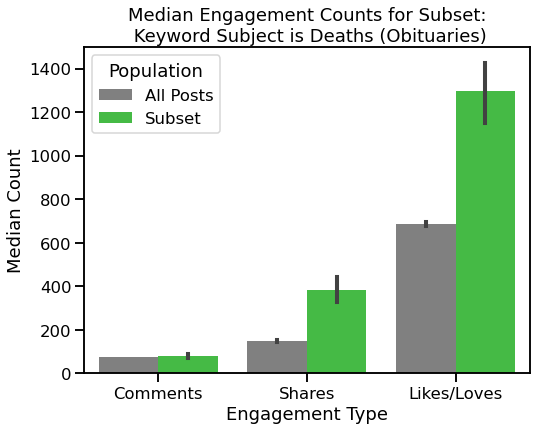

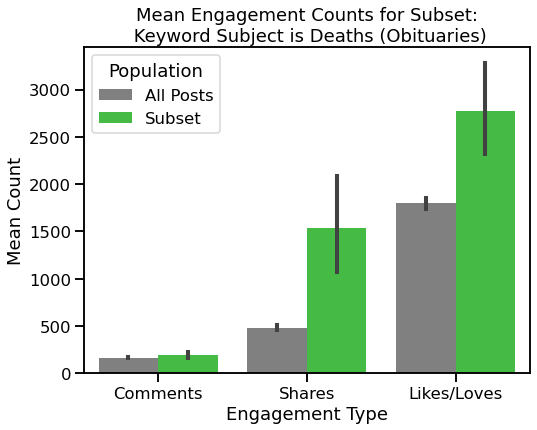

In [350]:
terms = ['deaths (obituaries)']

subset_title = 'Keyword Subject is Deaths (Obituaries)'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Archeology and Anthropology


Top engagement:


,article_text,comments_count,shares_count,likes_loves
28076,"Homo Naledi, New Species in Human Lineage, Is Found in South African Cave. A cave in South Africa yielded the discovery of a previously unidentified member of the early human lineage — Homo naledi, a hominin species who seem to have buried their dead.. Acting on a tip from spelunkers two years ago, scientists in South Africa discovered what the cavers had only dimly glimpsed through a crack in a limestone wall deep in the Rising Star Cave: lots and lots of old bones.",2479,5180,14347
37059,"View From Space Hints at a New Viking Site in North America. The site was identified last summer after satellite images showed possible man-made shapes under discolored vegetation on the Newfoundland coast.. A thousand years after the Vikings braved the icy seas from Greenland to the New World in search of timber and plunder, satellite technology has found intriguing evidence of a long-elusive prize in archaeology — a second Norse settlement in North America, further south than ever known.",896,7358,8618
22901,"Poor Little Rich Women. I studied the women of the Upper East Side as if they were a tribe in a faraway land.. WHEN our family moved from the West Village to the Upper East Side in 2004, seeking proximity to Central Park, my in-laws and a good public school, I thought it unlikely that the neighborhood would hold any big surprises. For many years I had immersed myself — through interviews, reviews of the anthropological literature and participant-observation — in the lives of women from the Amazon basin to sororities at a Big Ten school. I thought I knew from foreign.",763,3145,8685
27312,"ISIS Blows Up Ancient Temple at Syria’s Palmyra Ruins. Islamic State militants have detonated explosives around the Temple of Baalshamin, one of the most grand and well-preserved structures at the ancient ruins.. Militants from the Islamic State set off explosions at a temple in the ancient ruins of Palmyra in Syria, activists and government officials said on Sunday, continuing a pattern of destruction that they have visited upon historical sites across the territory they control there and in Iraq.",1241,4407,4005
46356,"Roman Artifacts Found in Okinawa Castle. It’s unclear how ancient Roman coins ended up buried in the ruins of a 12th-century castle in Okinawa.. Archaeologists have found ancient Roman coins buried in the ruins of a 12th-century castle in Okinawa, and no one knows how they got there.",424,3009,7352
45682,"A Single Migration From Africa Populated the World, Studies Find. Unprecedented DNA analyses of people in indigenous populations suggest that almost all non-Africans trace their roots to one migration from the continent.. Modern humans evolved in Africa roughly 200,000 years ago. But how did our species go on to populate the rest of the globe?",335,5202,8006
30193,"Grave of ‘Griffin Warrior’ at Pylos Could Be a Gateway to Civilizations. A warrior’s tomb full of precious metals and jewels is expected to give insight into the rise of the Mycenaeans, from whom Greek culture developed.. Archaeologists digging at Pylos, an ancient city on the southwest coast of Greece, have discovered the rich grave of a warrior who was buried at the dawn of European civilization.",234,3989,5572
30875,"Stonehenge Begins to Yield Its Secrets. Discoveries over the last decade have revealed more about the everyday lives of the people for whom the giant monuments held meaning.. AMESBURY, England — About 6,300 years ago, a tree here toppled over.",247,2188,6101
41490,"Escape Tunnel, Dug by Hand, Is Found at Holocaust Massacre Site. In 1944, 80 captive Jews who were being forced to burn bodies at a Nazi extermination site attempted an escape.. A team of archaeologists and mapmakers say they have uncovered a forgotten tunnel that 80 Jews dug largely by hand as they tried to escape from a Nazi extermination site in Lithuania about 70 years ago.",221,2336,3420
32543,"Poor Little Rich Women. I studied t


Least engagement:


,article_text,comments_count,shares_count,likes_loves
46300,"In Greek Warrior’s Grave, Rings of Power (and a Mirror and Combs). Archaeologists believe that elegant gold rings and engraved gemstones were not looted from Crete, but were signs of the growth of Minoan culture from the island.. A trove of beautifully engraved gold rings and gemstones, found in the untouched grave of an ancient Greek warrior last year, were possessions from his culture, not loot from the nearby island of Crete, archaeologists now believe.",11,126,452
47047,"Nat Turner’s Skull and My Student’s Purse of Skin. Americans have traded and passed down the remains of executed slaves for generations. It’s time to stop.. This month, Richard Hatcher, a former mayor of Gary, Ind., delivered what researchers suspect is the skull of Nat Turner, the rebel slave, to Turner’s descendants. The skull had been kept as a relic, sold and probably handed down through generations, for nearly 185 years. If DNA tests confirm that the skull is genuine, then Turner’s family will have the opportunity to lay their famous relative to rest.",32,104,128
31794,"With Shipwreck Treasure Easier to Reach, a Duel Is On. As technology exposes more sunken booty to commercial explorers, they are facing resistance and counterclaims by governments, the United Nations and marine archaeologists.. MIAMI — The Spanish galleon San José was overloaded with 200 passengers and 700 tons of cargo on a summer night in 1631 when it smashed into a rock off the Pacific coast of Panama, spilling silver coins and bars into the Gulf of Panama. More than 400,000 coins and at least 1,417 bars were lost over a 40-mile trail.",34,45,294
46476,"Archaeological Victims of ISIS Rise Again, as Replicas in Rome. Modern technology is used to reproduce artifacts that were destroyed in Iraq and Syria; the results are on display at the Colosseum in Rome.. ROME — A statue of a human-headed winged bull from the Northwest Palace in Nimrud, Iraq, that was bulldozed by the Islamic State last year to great outcry has been faithfully recreated using modern technology and put on exhibit at the Colosseum in Rome to spur discussion of the possible reconstruction of war-torn archaeological sites.",9,56,279
36094,"The Dream of Treasure Keeps Paraguayans Digging. Tales of gold buried more than a century ago, however dubious, entrance hunters of all persuasions while the government endeavors to protect cultural artifacts.. CAPIATÁ, Paraguay — Deep in the subtropical heart of South America, the hunt is on.",11,56,207


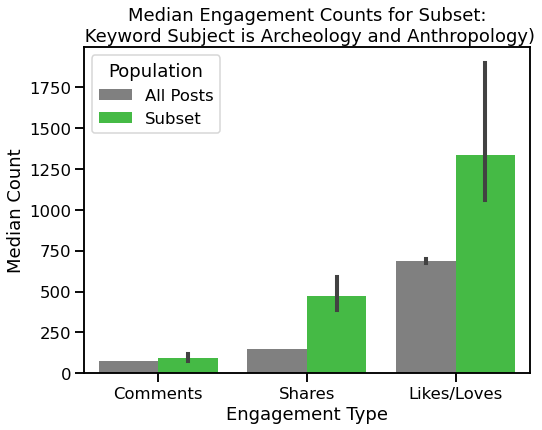

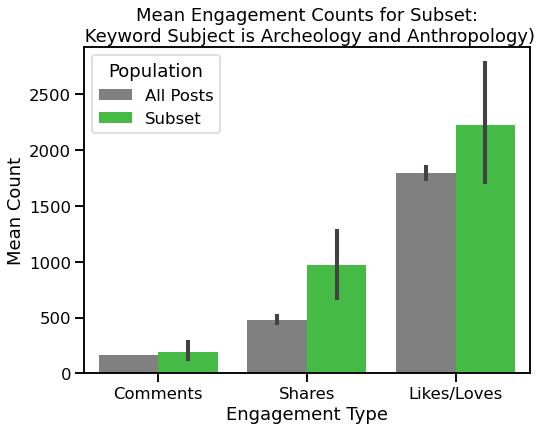

In [351]:
terms = ['archaeology and anthropology']

subset_title = 'Keyword Subject is Archeology and Anthropology)'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Muslim Americans and Migrant Crisis


Top engagement:


,article_text,comments_count,shares_count,likes_loves
31150,"Beirut, Also the Site of Deadly Attacks, Feels Forgotten. A global outpouring of grief followed the Paris assaults, but no such solidarity was expressed a day earlier when 43 civilians were killed in Lebanon.. BEIRUT, Lebanon — Ali Awad, 14, was chopping vegetables when the first bomb struck. Adel Tormous, who would die tackling the second bomber, was sitting at a nearby coffee stand. Khodr Alaa Deen, a registered nurse, was on his way to work his night shift at the teaching hospital of the American University at Beirut, in Lebanon.",4051,81005,139436
32276,"Syrian Refugees Greeted by Justin Trudeau in Canada. “You are home,” Mr. Trudeau said to 163 refugees after they landed in Toronto, the first of 25,000 the country has promised to take in.. OTTAWA — Prime Minister Justin Trudeau greeted a planeload of weary Syrian refugees landing in Toronto early Friday, telling the first to disembark that “you’re safe at home now” as he handed them winter coats.",3184,20613,120902
41271,"Aziz Ansari: Why Trump Makes Me Scared for My Family. The son of Muslim immigrants is worried about where his mother will pray.. “DON’T go anywhere near a mosque,” I told my mother. “Do all your prayer at home. O.K.?”",1559,13863,32054
43356,"I Ran the C.I.A. Now I’m Endorsing Hillary Clinton.. She is well prepared to be our commander in chief. Donald Trump, in contrast, is a national security threat.. During a 33-year career at the Central Intelligence Agency, I served presidents of both parties — three Republicans and three Democrats. I was at President George W. Bush’s side when we were attacked on Sept. 11; as deputy director of the agency, I was with President Obama when we killed Osama bin Laden in 2011.",1067,7756,39924
28094,"Obama Increases Number of Syrian Refugees for U.S. Resettlement to 10,000. Aid groups called the action a token one given the size of the U.S. economy and population, and some Republicans said President Obama was allowing in potential terrorists.. WASHINGTON — President Obama, under increasing pressure to demonstrate that the United States is joining European nations in the effort to resettle Syrian refugees, has told his administration to take in at least 10,000 displaced Syrians over the next year.",1636,3831,22649
43150,"John McCain Denounces Donald Trump’s Comments on Family of Muslim Soldier. In a strongly worded statement, Mr. McCain said Mr. Trump’s remarks disparaging a fallen soldier’s family do not “represent the views of our Republican Party.”. WASHINGTON — Senator John McCain sharply criticized Donald J. Trump’s comments about the family of a fallen Muslim Army captain on Monday, a rebuke that provided an opening for other vulnerable Republican senators to do the same, even though they all stopped short of rescinding their endorsements of him.",2486,2878,19235
43180,"Donald Trump’s Draft Deferments: Four for College, One for Bad Feet. With Mr. Trump accused by a dead soldier’s father of having never “sacrificed,” his medical deferment during the Vietnam era is facing new scrutiny.. Back in 1968, at the age of 22, Donald J. Trump seemed the picture of health.",1464,7822,10665
31388,"Donald Trump Says He’d ‘Absolutely’ Require Muslims to Register. Donald J. Trump, who earlier in the week said he was open to requiring Muslims in the United States to register in a database, said in Iowa on Thursday night that he “would certainly implement that — absolutely.”. NEWTON, Iowa — Donald J. Trump, who earlier in the week said he was open to requiring Muslims in the United States to register in a database, said on Thursday night that he “would certainly implement that — absolutely.”",2130,8582,8511
32106,"Donald Trump Calls for Barring Muslims From Entering U.S.. Mr. Trump called on Monday for the United States to bar all Muslims from entering the country until the nation’s leaders can “figure out what is going on” after the terrorist attacks in San Bernardino, Cal


Least engagement:


,article_text,comments_count,shares_count,likes_loves
47267,"‘I Am Alone’: Migrant Children in Calais ‘Jungle’ Face an Uncertain Fate. The fate of the young migrants has become a major sticking point in the French government’s plans to demolish the camp, which could happen within days.. CALAIS, France — They left their countries, mostly Afghanistan, Ethiopia or Eritrea. They traveled with smugglers, walked across countries and continents, crossed mountains and rough seas, and endured airless trunks, thieves and muggers.",17,16,73
43670,"From Syrian Rubble to German Concert Halls With a Piano, a Mission and Survivor’s Guilt. In a nation torn between embracing and fearing the migrants who have arrived in the past year, Aeham Ahmad has set himself the task of putting a human face on his fellow arrivals.. WIESBADEN, Germany — The pianist starts his show abruptly, with a wail. The words and music are Arabic, but the pain is clear in any language.",9,22,123
11695,"Murder in the Mediterranean . The international community must take collective action before more migrants perish.. Refugees fleeing wars and conflict in Syria, Gaza and Africa know the journey in smugglers’ boats across the Mediterranean is fraught with perils. Add now the risk of mass murder by their traffickers.",11,12,116
25847,"Tearful Moment With Merkel Turns Migrant Girl Into a Potent Symbol. German legislation may offer a chance for permanent residency to young asylum seekers like Reem Sahwil, who had a tearful exchange with Angela Merkel.. ROSTOCK, Germany — She stared down Greece and embraced her role as the rules enforcer of the European Union. But one teary-eyed young asylum seeker from the Middle East turned the tables on Chancellor Angela Merkel of Germany last week, raising questions about her compassion and focusing attention on Europe’s central humanitarian dilemma.",7,12,92
40506,"Questions About Suspect’s Identity Circle Human Trafficking Case. Doubts about the identity of an Eritrean suspect taken into custody were raised within hours of the announcement that an arrest had been made.. One day after trumpeting the capture and extradition of an Eritrean man they said was responsible for the deaths of hundreds of African migrants, the Italian authorities said on Thursday they were looking into the possibility that they had the wrong man.",9,8,47


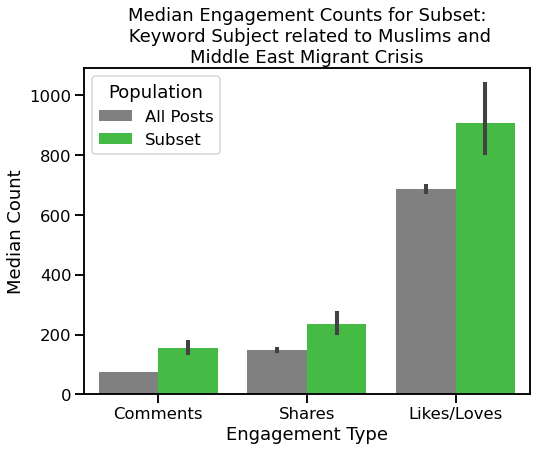

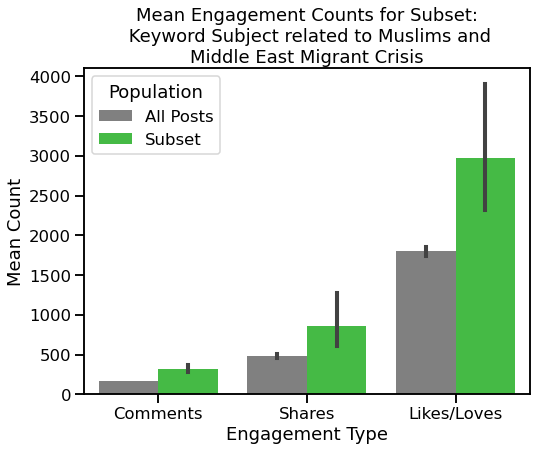

In [387]:
terms = ['muslim americans', 'middle east and africa migrant crisis',
        'muslim veiling']

subset_title = 'Keyword Subject related to Muslims and\nMiddle East Migrant Crisis'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Cats


Top engagement:


,article_text,comments_count,shares_count,likes_loves
35139,"Why Am I Obsessed With a Cellphone Game About Collecting Cats?. Where does the appeal of Neko Atsume: Kitty Collector lie — in the history of Japanese art, or the strange nature of the cat?. Neko Atsume: Kitty Collector is a cellphone game about collecting cats. It is not a complicated game. It is, in fact, barely a game at all. And yet I have become obsessed with it.",7762,13193,16239
30408,"Music to Cats’ Ears. Soundtracks to purr along to? A new project creates music meant to be audio catnip.. In the long battle for feline affection, cat owners may have some fresh ammunition.",869,4969,6433
20664,"Stand Up for Your Cats. We need to lose the stereotype of the pathetic female and her felines.. TAYLOR SWIFT, I salute you.",661,3258,9706
35075,"Fat Cats on a Diet: Will They Still Love You?. Cats don’t hold a grudge if you limit their food to help them slim down, a new study shows.. Maya has had a tough time slimming down. After 16 months of dieting, she’s dropped 10 pounds and 6 ounces.",1825,2949,4033
17510,"Cat Cafe Offers a Place to Snuggle, With Reservations. At Meow Parlour on the Lower East Side, cat lovers can get their fill (for a fee).. MADELINE WEINSTEIN was reaching for the top of the shelves at Meow Parlour, New York’s new cat cafe, going for the ultimate prize: Roger, the most antisocial animal in the place. Down below, on floor level, nine other cats roamed, batting at toys, leaping exuberantly, bumping heads affectionately against the outstretched hands of customers. Roger remained aloof.",450,2047,5017
26881,"How a Kitten Eased My Partner’s Depression . With a partner battling depression and her own mental state teetering toward perpetual grumpiness, a woman takes it upon herself to introduce a new member into the family.. When his depression was at its worst, my partner, Joe, would wake up in the morning engulfed in a fog so palpable that its presence would sometimes startle me awake, as if I had smelled something burning.",299,1726,7233
31518,"Twitter Cats to the Rescue in Brussels Lockdown. The police asked Belgians not to tweet details of antiterrorism raids over the weekend. The Internet responded with furry memes.. As the hunt for terrorism suspects intensified in Brussels, the authorities requested that Belgians refrain from posting messages on Sunday that might expose or interfere with police operations.",260,2358,7613
33926,"Animal Deaths Down and Adoptions Up Amid Reforms at New York Shelters. Euthanasia rates dropped 36 percent for dogs and 25 percent for cats in 2015 as adoptions climbed 17 percent, according to statistics from the agency that runs New York’s three animal shelters.. For a place often associated with confinement, suffering and death, the city animal shelter in Manhattan was a pretty happy spot last Friday afternoon, at least in the backyard.",253,1872,7998
34063,"Animal Deaths Down and Adoptions Up Amid Reforms at New York Shelters. Euthanasia rates dropped 36 percent for dogs and 25 percent for cats in 2015 as adoptions climbed 17 percent, according to statistics from the agency that runs New York’s three animal shelters.. For a place often associated with confinement, suffering and death, the city animal shelter in Manhattan was a pretty happy spot last Friday afternoon, at least in the backyard.",236,1728,12303
26311,"How to Cure a Cat’s Anxiety. Install a fish tank. Acknowledge the animal’s enigmatic nature.. Impulse-control problems, phobias, anxiety, violent outbursts and compulsive disorders are not uncommon in pets. ‘‘Unfortunately, you cannot put a cat on a couch and say, ‘Tell me about your mother,’ ” says E’Lise Christensen, a veterinary behaviorist with practices in Manhattan and Denver. (‘‘Think of us as animal psychiatrists,’’ she says.) Still, you can treat the kind of underlying feline psychological distress that leads to biting, scratching, moping and urinating outside the litter box. Selective serotonin reu


Least engagement:


,article_text,comments_count,shares_count,likes_loves
39664,"Missing: Chechen Strongman’s Cat. If Seen, Contact @kadyrov_95.. Ramzan A. Kadyrov, a Kremlin darling, told his Instagram followers his cat was missing. The Internet took it from there.. MOSCOW — When people disappear in the Russian republic of Chechnya — rights activists, journalists and government critics — there is usually no public discussion.",31,55,334
47241,"In Clinton Hill: Their First Apartment Together. Kelly Cho and Jaime Soriano wanted a one-bedroom for them and their cat.. In her first year as an architecture student at the Pratt Institute in Clinton Hill, Brooklyn, Kelly Cho lived in the dorms. In her second year, she moved nearby with a good friend.",55,16,233
1815,"Like Herding Cats? Well, Try It on Broadway. Will act for herring: The director of “Breakfast at Tiffany’s,” coming to Broadway, is facing predictable challenges in casting — and rehearsing — the onstage cat.. Four days before previews, the cast and crew of the new Broadway version of “Breakfast at Tiffany’s” were putting the finishing touches on the show’s blocking, lighting and costumes. But on this final day of February, there remained one gaping hole: the director still hadn’t cast the role of Holly Golightly’s cat.",10,78,183
45538,"Fashion’s Favorite Pets. How Neville Jacobs, Choupette Lagerfeld and Hector Browne stack up.. September sees not only the start of the women’s wear fashion season, but also the beginning of the fashion book season. As fall unfurls, glossy and gorgeous coffee table books appear: Grace Coddington’s “Grace: The American Vogue Years”; Alix Browne’s “Runway: The Spectacle of Fashion”; and Donatella Versace’s “Versace,” to name a few.",30,12,102
16279,"What We’re Reading. Get recommendations from New York Times reporters and editors, highlighting great stories from around the web. Today, great reads from John Branch, Ravi Somaiya and others.. Get recommendations from New York Times reporters and editors, highlighting great stories from around the web. What We’re Reading emails are sent twice a week. Sign up »",1,8,127


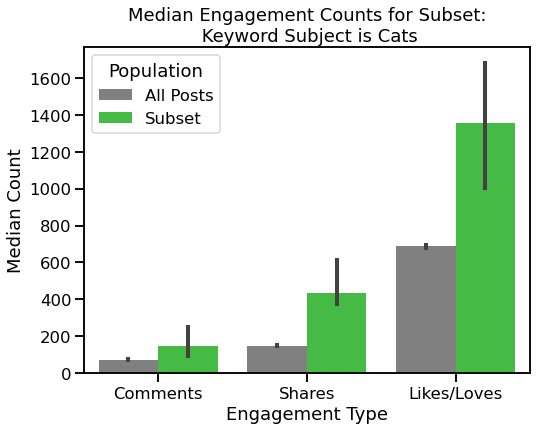

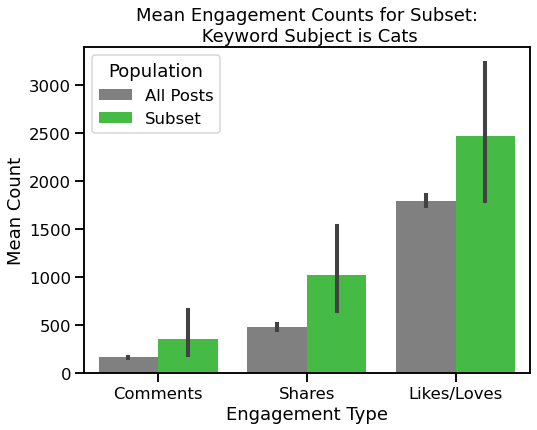

In [353]:
terms = ['cats']

subset_title = 'Keyword Subject is Cats'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Beauty


Top engagement:


,article_text,comments_count,shares_count,likes_loves
16289,"A Hairstylist Provides Free Cuts to the Homeless. Every Sunday, Mark Bustos, a hairstylist at an elite salon in Chelsea, hits the sidewalk and provides free cuts to the homeless.. David Terry is 50 years old, H.I.V. positive and homeless. He spends his nights at Bailey House, a nonprofit in Harlem that provides housing for people living with H.I.V., and his days wandering the streets. “I get very depressed because it’s like I’m on the treadmill going 80 miles an hour with the brakes on,” he said.",1094,7906,61193
26362,"Along With Babies, Hairstylists Are Arriving in Hospitals. Some new moms are getting ready for birth announcement photos with maternity-ward visits from hairdressers and makeup artists.. When Donna Yip, a lawyer who lives in the financial district, went into labor with her second child in June, she had more than just her husband and medical team in her room at NewYork-Presbyterian Morgan Stanley Children’s Hospital.",2369,2883,9806
46157,"Fat-Shamer in Chief. With little more than a month to go until the election, Donald Trump finds himself in a very public fight with a beauty queen. Sigh.. Apparently, millions of Americans don’t care that a man now within a nose-hair of the presidency may be the most prolific liar in modern political history. Nor do they care about the authoritarian policies he espouses, his truly scary embrace of dictators abroad and crackpots at home, or his monumental ignorance on every subject.",824,2499,13306
22554,"Perfect Nails, Poisoned Workers. Some ingredients used in nail products have been tied to cancer, miscarriages, lung diseases and other ailments. The industry has long fought regulations.. Each time a customer pulled open the glass door at the nail shop in Ridgewood, Queens, where Nancy Otavalo worked, a cheerful chorus would ring out from where she sat with her fellow manicurists against the wall: “Pick a color!”",981,7532,6577
25579,"Women Who Dye Their (Armpit) Hair . The Internet is up to its armpits with women who dye their armpit hair, including Miley Cyrus, who displayed her pink underarms in a photo posted on Instagram.. Destiny Moreno, who is 17, drove to a Sally Beauty Supply near her Seattle home last September with a newly hatched plan. She peppered a grandmotherly employee with questions about hair bleaches, developers and dyes, and the woman asked matter-of-factly if she were coloring her hair.",2033,3446,6033
39115,In Praise of Naturally Curly Hair. It has gotten a bad rap as a statement of quirky individuality — or a sign of laziness. But the look’s fresh appeal lies in its confidence.. It has gotten a bad rap as a statement of quirky individuality — or a sign of laziness. But the look’s fresh appeal lies in its confidence.,675,4237,7446
45968,"Shamed and Angry: Alicia Machado, a Miss Universe Mocked by Donald Trump. During Monday’s debate, Hillary Clinton put a spotlight on Ms. Machado, who was nicknamed “Miss Eating Machine” by Mr. Trump in 1996 and says she has never fully recovered.. For 20 years, Alicia Machado has lived with the agony of what Donald J. Trump did to her after she won the Miss Universe title: shame her, over and over, for gaining weight.",739,2350,6021
23147,"Fighting Pollution From Microbeads Used in Soaps and Creams. On Friday, the California State Assembly passed a bill that could become the strictest ban in the United States on the particles, which can carry pollutants into the food chain.. Stiv Wilson is not much of an exfoliator.",334,5357,9350
23420,"Biracial Beauty Queen Challenges Japan’s Self-Image. Ariana Miyamoto, the first half-black Miss Universe Japan, has endured slurs since she was a child. “Even today,” she said, “I am usually seen not as a Japanese but as a foreigner.”. TOKYO — WHEN Ariana Miyamoto was crowned Miss Universe Japan 2015, participants said she stole the show with a saucy strut, an infectious smile and a calm self-confidence that belied her 21 years


Least engagement:


,article_text,comments_count,shares_count,likes_loves
4533,"Halloween or Not, a Softer Shade of Goth Makeup. A look that could sometimes seem cartoonish tries to hold on to its sex appeal.. They appear at the front of drugstores every year: the Halloween makeup displays, bearing inky black nail polishes and blood-red lip shades. “Go goth,” they whisper, “Channel your inner Wednesday Addams.”",25,39,448
7851,"My No-Soap, No-Shampoo, Bacteria-Rich Hygiene Experiment. What happens when you leave cleanliness up to your microbiome?. For most of my life, if I’ve thought at all about the bacteria living on my skin, it has been while trying to scrub them away. But recently I spent four weeks rubbing them in. I was Subject 26 in testing a living bacterial skin tonic, developed by AOBiome, a biotech start-up in Cambridge, Mass. The tonic looks, feels and tastes like water, but each spray bottle of AO+ Refreshing Cosmetic Mist contains billions of cultivated Nitrosomonas eutropha, an ammonia-oxidizing bacteria (AOB) that is most commonly found in dirt and untreated water. AOBiome scientists hypothesize that it once lived happily on us too — before we started washing it away with soap and shampoo — acting as a built-in cleanser, deodorant, anti-inflammatory and immune booster by feeding on the ammonia in our sweat and converting it into nitrite and nitric oxide.",23,99,200
4988,"Heady Days for Hair in the N.F.L.. Helmets just get in the way of style in today’s N.F.L.. It was a scene worthy of the Roman Colosseum. After stuffing a run by Arizona’s Andre Ellington in a game Nov. 17, Jacksonville defensive end Jason Babin emerged from the pile of bodies clutching a mysterious black tangle of what looked like snakes; he thrust it into the air like a victorious gladiator.",28,21,333
1513,"The Cosmetics Wars. We’re all being used as guinea pigs in the test of new product safety.. If all goes according to schedule, next month the European Union will become “cruelty-free,” banning without exception the sale of cosmetics ingredients that were tested on animals.",16,52,211
44141,"What’s That on Your Bumper? A Hairy Kind of Car Insurance. Ponytails are attached to taxis for strength and good fortune in West Africa. Religious icons are also popular blessings for safe travel.. In some parts of West Africa, ponytails aren’t just hairdos. They dress up taxis, too.",16,15,108


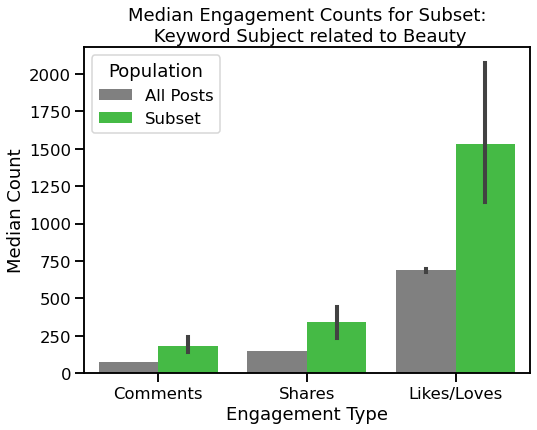

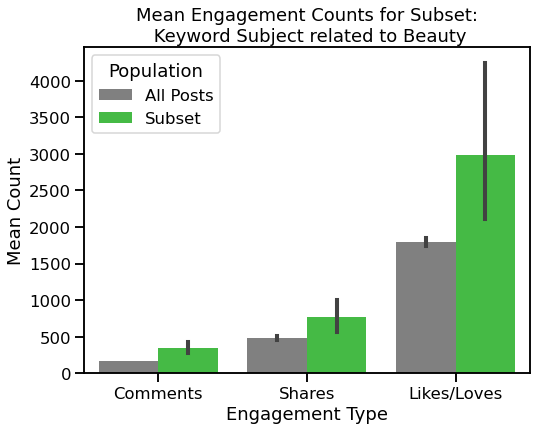

In [354]:
terms = ['beauty contests', 'hair', 'cosmetics and toiletries']

subset_title = 'Keyword Subject related to Beauty'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Post Type

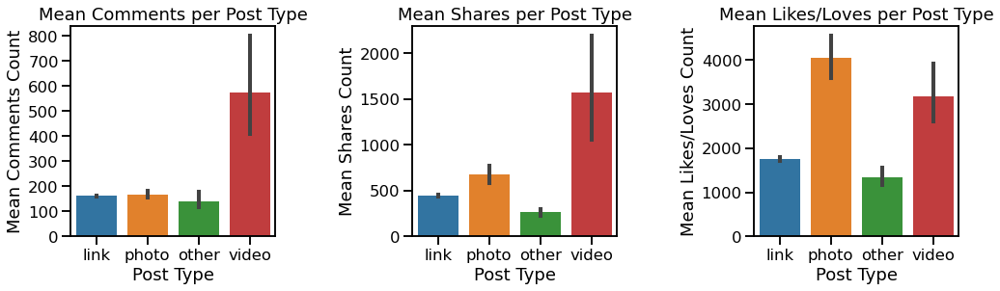

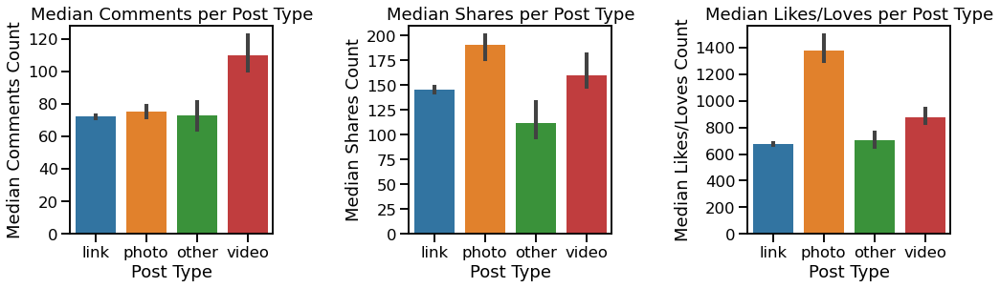

In [355]:
engage_dict = {'comments_count': "Comments", 'shares_count': 'Shares', 
                   'likes_loves': 'Likes/Loves'}
pred_col = 'post_type'
pred_label = 'Post Type'

with sns.plotting_context('talk'):

    fig, axes = plt.subplots(figsize=(16, 6), nrows=1, ncols=3)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, y=target, x=pred_col, ax=axes[i], 
                    estimator=np.mean)
        axes[i].set_title(f"Mean {engage_dict[target]} per {pred_label}")
        axes[i].set_xlabel(pred_label)
        axes[i].set_ylabel(f"Mean {engage_dict[target]} Count");
        
    fig2, axes2 = plt.subplots(figsize=(16, 6), nrows=1, ncols=3)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, y=target, x=pred_col, ax=axes2[i], 
                    estimator=np.median)
        axes2[i].set_title(f"Median {engage_dict[target]} per {pred_label}")
        axes2[i].set_xlabel(pred_label)
        axes2[i].set_ylabel(f"Median {engage_dict[target]} Count");

### Time of Day

In [356]:
# make categorical column
sorted_hours = list(df['hour_cat'].unique())
sorted_hours.sort()

cat_type = pd.api.types.CategoricalDtype(categories=sorted_hours, ordered=True)

df["hour_cat"] = df["hour_cat"].astype(cat_type)

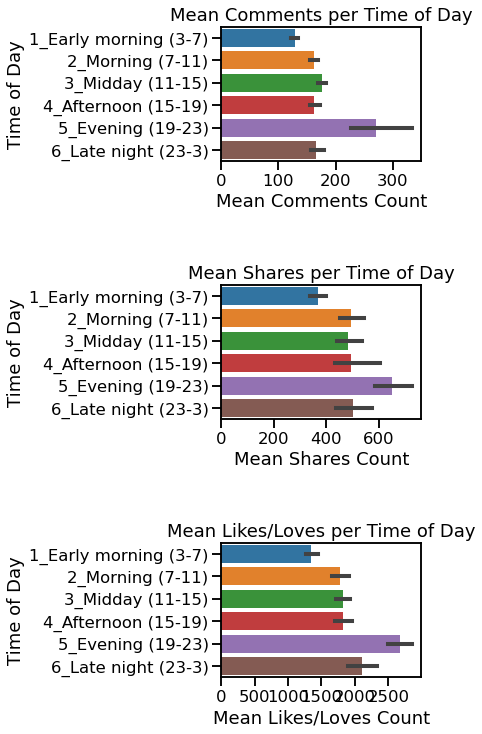

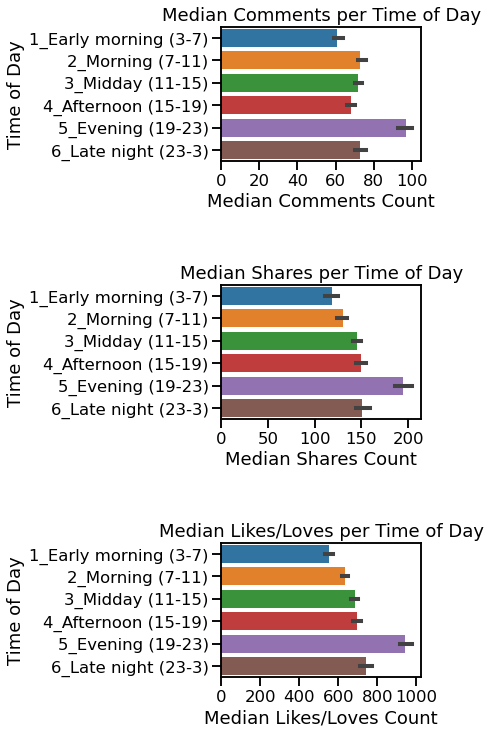

In [357]:
pred_col = 'hour_cat'
pred_label = 'Time of Day'

with sns.plotting_context('talk'):

    fig, axes = plt.subplots(figsize=(6, 12), nrows=3, ncols=1)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, x=target, y=pred_col, ax=axes[i], 
                    estimator=np.mean)
        axes[i].set_title(f"Mean {engage_dict[target]} per {pred_label}")
        axes[i].set_ylabel(pred_label)
        axes[i].set_xlabel(f"Mean {engage_dict[target]} Count");
        #for tick in axes[i].get_ticklabels():
        #   tick.set_rotation(90);
        
    fig2, axes2 = plt.subplots(figsize=(6, 12), nrows=3, ncols=1)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, x=target, y=pred_col, ax=axes2[i], 
                    estimator=np.median)
        axes2[i].set_title(f"Median {engage_dict[target]} per {pred_label}")
        axes2[i].set_ylabel(pred_label)
        axes2[i].set_xlabel(f"Median {engage_dict[target]} Count");
        #for tick in axes2[i].get_xticklabels():
        #    tick.set_rotation(90);

### Weekend

In [358]:
weekend_dict = {0:'Weekday', 1:'Weekend'}
df['on_weekend_plot'] = df['on_weekend'].map(lambda x: weekend_dict[x])

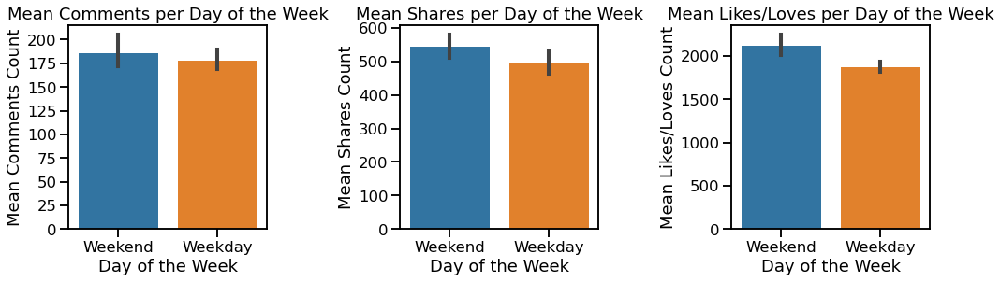

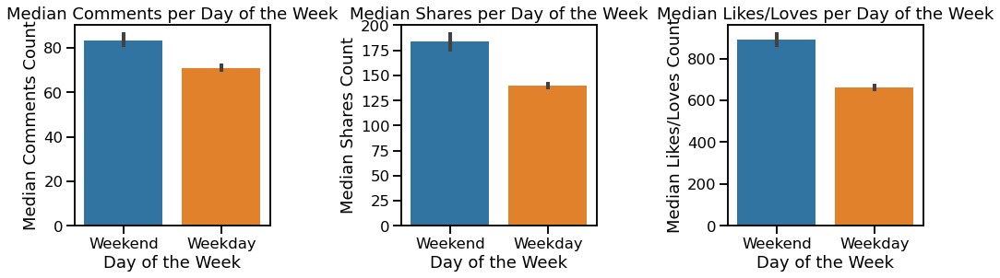

In [359]:
pred_col = 'on_weekend_plot'
pred_label = 'Day of the Week'

with sns.plotting_context('talk'):

    fig, axes = plt.subplots(figsize=(16, 6), nrows=1, ncols=3)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, y=target, x=pred_col, ax=axes[i], 
                    estimator=np.mean)
        axes[i].set_title(f"Mean {engage_dict[target]} per {pred_label}")
        axes[i].set_xlabel(pred_label)
        axes[i].set_ylabel(f"Mean {engage_dict[target]} Count");
        
    fig2, axes2 = plt.subplots(figsize=(16, 6), nrows=1, ncols=3)
    plt.tight_layout(pad=5)

    for i, target in enumerate(engage_dict.keys()):
        sns.barplot(data=df, y=target, x=pred_col, ax=axes2[i], 
                    estimator=np.median)
        axes2[i].set_title(f"Median {engage_dict[target]} per {pred_label}")
        axes2[i].set_xlabel(pred_label)
        axes2[i].set_ylabel(f"Median {engage_dict[target]} Count");

## Explore Top Predictors of Average Engagement

### Quotation of the Day

Number of hits: 934


Top engagement:


,all_text,comments_count,shares_count,likes_loves
10504,"DNA Evidence Clears Two Men in 1983 Murder. Quotation of the Day: “A long time ago, I wanted to find me a good wife, I wanted to raise a family, I wanted to have my own business and everything. I never got a chance to realize those dreams. Now I believe that God is going to bless me to get back out there.' — Henry Lee McCollum, who was declared innocent of murder and ordered released after three decades on death row in North Carolina. Two mentally disabled half brothers who were convicted in the rape and murder of an 11-year-old girl 30 years ago were declared innocent and ordered released by a judge.",910,4340,18450
1329,"President Obama’s Inaugural Address. Quotation of the Day: 'My fellow Americans, we are made for this moment, and we will seize it — so long as we seize it together. For we, the people, understand that our country cannot succeed when a shrinking few do very well and a growing many barely make it.' — President Obama. Reporters and editors from The New York Times offered context and analysis on President Obama’s inaugural address.",1839,1916,18073
3266,"Timeline Photos. Quotation of the Day: 'One child, one teacher, one book and one pen can change the world.' — Malala Yousafzai, who was shot by the Taliban last year after speaking out in favor of girls’ education in Pakistan: http://nyti.ms/18U4IpePhoto: Malala Yousafzai, 16, in pink head scarf, being introduced before speaking to the Youth Assembly at the United Nations. (Credit: Todd Heisler/The New York Times)",510,5327,14161
5897,"The Beatles’ Debut on ‘Ed Sullivan’. Quotation of the Day: 'I give them a year.' — Ray Bloch, musical director for “The Ed Sullivan Show,” on the Beatles, when they made their first live appearance on American television 50 years ago. Fifty years later, audience members who were present at the birth of Beatlemania remember the electric atmosphere and the screaming.",576,1394,19236
9067,"Pastor Led Son’s Gay Wedding, Revealing Fault Line in Church. Quotation of the Day: 'It’s so obvious you did not choose this for yourself. This is who you are, and this is who God created you to be.' — The Rev. Frank Schaefer, a Methodist minister, recalling what he told his son Tim before he violated church teachings and officiated at his son’s same-sex wedding. Frank Schaefer, like other leaders of congregations, had difficult choices to make when his son acknowledged that he is gay.",452,1608,13282
4750,"Young and Educated in Europe, but Desperate for Jobs. Quotation of the Day: 'On the bad days, it’s really hard to get out of bed. I ask myself, ‘What did I do wrong?’ ' — Alba Méndez, a 24-year-old with a master’s degree in sociology who was interviewing for a job at a supermarket in Madrid, the capital of Spain, where in September, unemployment among those 24 and younger stood at 56 percent. High unemployment in countries like Spain, Portugal and Greece is hitting young people hardest as they take jobs below their skill level and seek work abroad.",438,1550,5028
5094,"The Selling of Attention Deficit Disorder. Quotation of the Day: 'The numbers make it look like an epidemic. Well, it’s not. It’s preposterous. This is a concoction to justify the giving out of medication at unprecedented and unjustifiable levels.' — Keith Connors, a psychologist and professor emeritus at Duke University, criticizing the rise of attention deficit hyperactivity disorder or A.D.H.D. diagnoses and prescriptions for stimulants. The number of diagnoses soared as makers of the drugs used to treat attention deficit hyperactivity disorder found success with a two-decade marketing campaign.",353,1741,5006
13837,"From a Rwandan Dump to the Halls of Harvard. Quotation of the Day: 'My life changed because of her.' — Justus Uwayesu, a Rwandan orphan who lived in a garbage dump, on an American charity worker, Clare Effiong, who set him on a path that led to Harvard. Justus Uwayesu’s life was changed by a chance encounter


Least engagement:


,all_text,comments_count,shares_count,likes_loves
286,"Drought Leaves Cracks in Way of Life. Quotation of the Day: 'You probably can’t print our mood.' - Dallis Basel, a sheep rancher in South Dakota, on the effects of the drought. Lost amid the withered crops and dehydrated cattle that symbolize the most widespread drought in decades has been the toll on families that depend on farming.",2,23,84
14542,"Malcolm Livingston II Prepares to Move to Noma From WD-50. Quotation of the Day: 'I’m telling you, that banana pudding, really — it’s life-changing.' — Malcolm Livingston II, a well-regarded pastry chef, on an early inspiration made by his great-aunt in the Bronx. Malcolm Livingston II prepares to make the jump from WD-50 to being Noma’s pastry chef.",8,13,88
11428,"In Florida Student Assaults, an Added Burden on Accusers. Quotation of the Day: 'If you have a property crime, they don’t say: ‘Would you like me to dust for fingerprints? Would you like me to canvass the area for witnesses?'' -- Rebecca Campbell, a professor who researches law enforcement treatment of sexual assaults, on Florida police officers who drop assault cases if the accusers do not explicitly agree to an investigation. Last year, the Tallahassee police’s handling of a rape accusation against Jameis Winston drew attention to its failure to adequately investigate. Now, an examination shows a pattern to the handling of such complaints.",9,11,73
264,"Hey, @SeattlePD: What’s the Latest?. Quotation of the Day: 'More and more people want to know what’s going on on their piece of the rock.' - John Diaz, chief of police in Seattle, which is providing crime reports in neighborhood Twitter accounts. The Seattle Police Department has begun 51 hyper-local Twitter accounts to provide crime reports.",2,14,84
14729,"A Soul Steadied by Pigeons Stays True as Feathers Fly. Quotation of the Day: 'I’ve got a handful of hawk in my apartment.' — Rene LeClerc, on the day feathers flew in his Manhattan home. Rene LeClerc keeps pigeons in a loft outside the window of his Hamilton Heights apartment, a hobby he considers therapeutic, but the birds were threatened recently by the arrival of a red-tailed hawk.",7,6,73


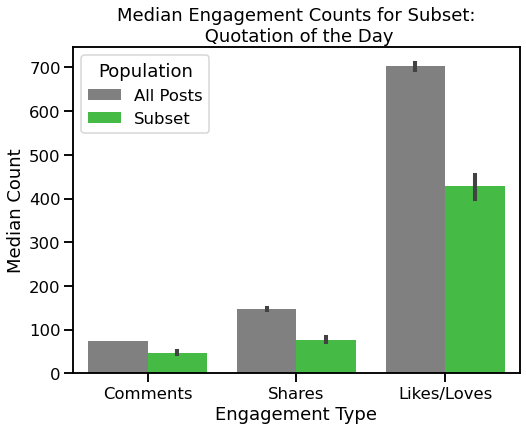

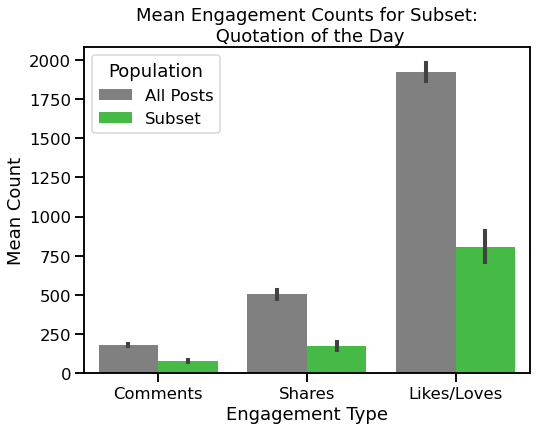

In [391]:
terms = ['quotation of the day']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = 'Quotation of the Day'

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Week

Number of hits: 1712


Top engagement:


,all_text,comments_count,shares_count,likes_loves
24584,"With a Tap of Taylor Swift’s Fingers, Apple Retreated. 'She is the most powerful person in the music industry.'. Taylor Swift’s victory in a one-day battle against Apple this week showed she has a rare power to influence the music business.",2380,6914,231311
45744,"Tulsa Officer Charged in Fatal Shooting of Black Driver. Breaking News: A Tulsa police officer was charged with manslaughter in last week’s shooting of Terence Crutcher. The officer, Betty Shelby, was charged with first-degree manslaughter in the death of Terence Crutcher, who was unarmed.",1543,6116,25168
45839,"A Week of Whoppers From Donald Trump. Donald J. Trump has unleashed a blizzard of falsehoods, exaggerations and outright lies in the general election. Here's our analysis of 31 untruths from Sept. 15-21. Mr. Trump has unleashed a blizzard of falsehoods, exaggerations and outright lies in the general election.",1332,9783,14057
30610,"Latino Groups Call on ‘SNL’ to Drop Donald Trump. The decision by 'Saturday Night Live' to invite Donald J. Trump as its host this week is no laughing matter for Hispanic and pro-immigration groups. Leading Hispanic groups are calling for “Saturday Night Live” to rescind an invitation to Donald J. Trump, citing comments he made about Mexican immigrants.",1540,3749,22499
31388,"Donald Trump Says He'd 'Absolutely' Require Muslims to Register. When asked how this would differ from Jews having to register in Nazi Germany, Donald J. Trump repeatedly said, 'You tell me,' until he stopped responding to the question. Donald J. Trump, who earlier in the week said he was open to requiring Muslims in the United States to register in a database, said in Iowa on Thursday night that he “would certainly implement that — absolutely.”",2130,8582,8511
21186,"Hillary Clinton to Announce 2016 Run for President on Sunday. The former secretary of state, senator and first lady is to announce that she will indeed seek the Democratic nomination for president. The former secretary of state, senator and first lady is expected to kick off her campaign with a video message on social media and then visit early primary states later in the week.",1174,3362,20940
28843,"An Emotional Blessing. Pope Francis got out of the car when he spotted a boy with cerebral palsy who had waited, in a wheelchair and purple rosary beads in hand, to see him. Pope Francis is visiting Washington, New York and Philadelphia this week during his first trip to the United States. The final leg of his trip in Philadelphia includes a Mass, a visit to the Independence Mall as well as a prison, and the World Meeting of Families.",886,3798,52302
24888,"Watch Venus Take Jupiter in a Race Around the Sun. On Tuesday, June 30, Venus will come neck-and-neck with Jupiter. Over the past week, you may have noticed what appears to be two super bright stars near the horizon. Those aren’t stars, they’re planets in a celestial race around the sun. On Tuesday, June 30, Venus w...",707,13675,25631
43000,"With Degree Debunked, Melania Trump Website Is Taken Down. Melania Trump's cribbing last week of Michelle Obama's lines was not the first time she claimed something that was not hers. The action was taken after Ms. Trump’s claim to have earned an undergraduate degree in her native Slovenia proved to be false.",1338,4789,11072
31195,"Timeline Photos. When a double suicide bombing rocked Beirut last week, there was no global outpouring of sympathy: http://nyti.ms/1N4Zn3m",831,5151,18928



Least engagement:


,all_text,comments_count,shares_count,likes_loves
9649,"What’s Your Favorite Out-of-Print Book?. Each week in Bookends, two writers take on questions about the world of books. This week, Adam Kirsch and Francine Prose discuss their favorite out-of-print books.",5,3,12
3840,"Final New York Mayoral Debate - 2013. Watch highlights from last night's final New York City Democratic mayoral primary debate.Read more about the relentless attacks on current frontrunner Bill de Blasio during last night's debate: http://nyti.ms/1dPkEfy. In a televised debate one week before the Democratic mayoral primary, Bill de Blasio's rivals tried to cut his lead in the polls by attacking his record and ...",4,4,26
20122,"Press Play. Every week, The New York Times will share tracks from an upcoming new album.Listen to an exclusive stream of 'Remain' by 'Them Are Us Too.'. Press Play is the place where The New York Times debuts noteworthy new music. Every week, we present tracks from an upcoming new album. Listen to them here exclusively.",2,3,25
9648,"What’s Your Favorite Out-of-Print Book?. Authors Adam Kirsch and Francine Prose discuss their favorite out-of-print books. Each week in Bookends, two writers take on questions about the world of books. This week, Adam Kirsch and Francine Prose discuss their favorite out-of-print books.",3,1,8
17505,"No Imminent Plans to Cut PATH Service, Port Authority Says. The PATH carries roughly 2,000 riders overnight during the week, about 1 percent of daily ridership. Even so, the trains, which come every 35 minutes, are often packed with workers and revelers heading home. The chairman of the Port Authority of New York and New Jersey told legislators that rail service would not be cut in the near term, and if cuts were made, they would follow a public review.",1,0,45


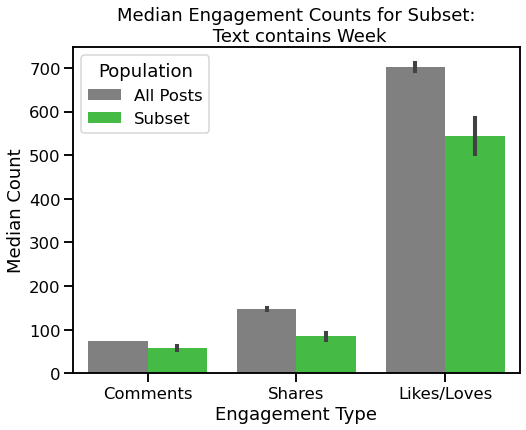

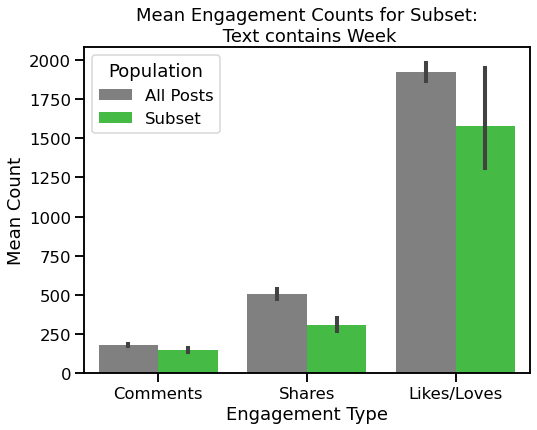

In [361]:
terms = ["week"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Week"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

Number of hits: 71


Top engagement:


,all_text,comments_count,shares_count,likes_loves
20411,'Better Call Saul' Recap: What Kind of Show Is This?. What kind of show is 'Better Call Saul'? The answer seems to change each week. (Spoilers ahead.). “Better Call Saul” is all over the place. Range or inconsistency?,784,398,7997
23098,Your Contribution to the California Drought. Love almonds? Here's how you're likely contributing to the California water shortage. The average American consumes more than 300 gallons of California water each week by eating food that was produced there.,514,718,1762
13401,"Because of Ebola, Ambulance Work in Liberia Is Busy and Lonely. In Monrovia, only about 15 ambulance teams are available to aid this city of nearly 1.5 million people, where hundreds of new Ebola cases are reported each week: http://nyti.ms/1rzXsCH",225,1227,1659
23093,The average American consumes more than 300 gallons of California water each week by eating food that was produced there.Learn more here: http://nyti.ms/1LhlFt9,137,773,1602
9273,"Times Video Email Newsletter - NYTimes.com. Every week, get a handpicked selection of the best videos from The New York Times. Subscribe to the Times Video newsletter for free and get a handpicked selection of the best videos from The New York Times every week.",127,170,8673
10870,"Some Retail Workers Find Better Deals With Unions. “I’m able to pay my rent, thank God, and go on vacation, at least once a year. There’s a sense of security,” says Debra Ryan, a sales associate at Macy's in Manhattan, where employees are represented by a union. Hourly workers often face unpredictable schedules and fluctuating hours each week, but at a Macy’s in Manhattan, a union has made a difference.",57,304,2233
1717,"Mediterranean Diet Can Cut Heart Disease, Study Finds. About 30 percent of heart attacks, strokes and deaths from heart disease can be prevented in people at high risk if they adopt a Mediterranean diet, a rigorous new study found. See what participants in the study were instructed to eat each week, and how many glasses of wine they were supposed to drink. About 30 percent of heart attacks, strokes and deaths from heart disease can be prevented in people at high risk if they switch to a Mediterranean diet, according to new research.",65,586,900
4779,"His Honor? Toronto’s Mayor Rampages On, to City’s Shame. Each week has brought reports of a new indiscretion by Rob Ford, the Toronto mayor who admitted to smoking crack, but he has no plan to resign. Even after the Toronto City Council voted to strip him of most of his budget and staff, Mayor Rob Ford refused to bow to pressure and leave office.",180,147,688
1591,"Why Four Workouts a Week May Be Better Than Six. How often should you workout each week to see fitness gains?. A fairly leisurely approach to scheduling workouts may actually be more beneficial than working out almost daily, a new study suggests.",50,477,734
27146,"Researchers Link Longer Work Hours and Stroke Risk. Do you work 55+ hours each week? You might have a 33% greater risk of stroke. An analysis of data on more than 600,000 people is the largest study thus far of the relationship between working hours and cardiovascular health.",64,398,571



Least engagement:


,all_text,comments_count,shares_count,likes_loves
7464,"Get NYT Now at the Exclusive Education Rate. College students and educators: This summer, make every minute count with NYT Now — your source for top stories selected by our editors. Get the first 4 weeks free then $1.50 every week thereafter. Now the news keeps up with you. Introducing the NYT Now app from The New York Times.",4,8,35
41050,"What You Should Watch This Week. Looking for something to watch this week? Look no further. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",3,3,78
9649,"What’s Your Favorite Out-of-Print Book?. Each week in Bookends, two writers take on questions about the world of books. This week, Adam Kirsch and Francine Prose discuss their favorite out-of-print books.",5,3,12
20122,"Press Play. Every week, The New York Times will share tracks from an upcoming new album.Listen to an exclusive stream of 'Remain' by 'Them Are Us Too.'. Press Play is the place where The New York Times debuts noteworthy new music. Every week, we present tracks from an upcoming new album. Listen to them here exclusively.",2,3,25
9648,"What’s Your Favorite Out-of-Print Book?. Authors Adam Kirsch and Francine Prose discuss their favorite out-of-print books. Each week in Bookends, two writers take on questions about the world of books. This week, Adam Kirsch and Francine Prose discuss their favorite out-of-print books.",3,1,8


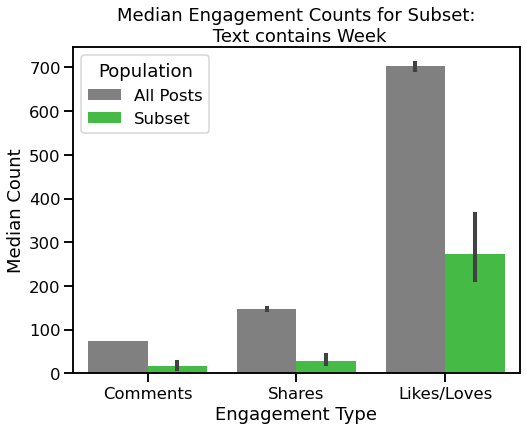

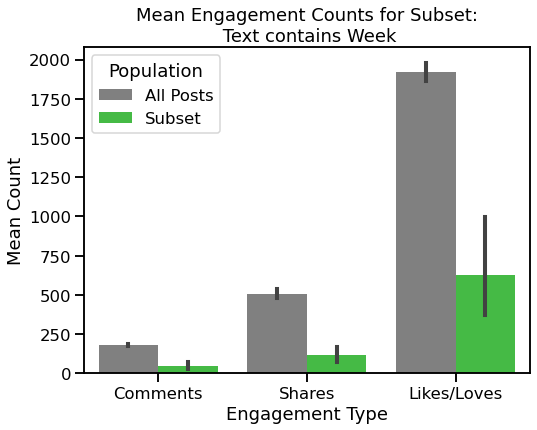

In [362]:
terms = ["each week", "every week", "what you should watch this week"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Week"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

In [363]:
df.loc[(df['cleaned'].str.contains('week', regex=False, case=False)),
      'name'].value_counts()[:30]

Timeline Photos                                       131
The New York Times Styles                              30
Video From The New York Times                          25
Press Play                                             15
What You Should Watch This Weekend                     12
What We're Reading                                     11
What You Should Watch This Week                         9
Do You Live Near I-35? Contribute to Our Reporting      8
What to Cook This Week                                  7
Photos from The New York Times's post                   7
The New York Times Food                                 7
The New York Times - Well - Health                      6
The New York Times - Lens - Photography                 4
The New York Times - Science                            4
Fashion Week Now Spring 2015                            4
36 Hours in Madrid                                      4
‘Out of My Mouth Comes Unimpeachable Manly Truth’       3
Our Best Comme

Number of hits: 49


Top engagement:


,all_text,comments_count,shares_count,likes_loves
44475,"What You Should Watch This Weekend if You Have Kids or Miss ‘Downton Abbey’. Here's what our NYT Watching experts recommend this weekend. From the Watching team, expert TV and movie recommendations for the next few days.",75,63,703
41676,"What You Should Watch This Fourth of July Weekend. Pop some popcorn and settle in. From the Watching team, expert TV and movie recommendations for the next few days.",42,84,558
40957,"What You Should Watch This Father’s Day Weekend. 17 great ideas for what to watch this weekend, from the NYT Watching team. From the Watching team, expert TV and movie recommendations for the next few days.",46,67,382
41879,"What You Should Watch This Week: ‘Hannibal’ and ‘Star Trek’ Films. What's new (and worthy of your time) on Netflix, HBO, Amazon Prime and Hulu. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",92,24,288
38237,"What You Should Watch This Week: British Baking (and Our Spring TV Breakups). It's time to break up with spring TV shows that don't bring you steady joy, writes our NYT Watching TV critic. What are you thinking about dropping from your queue?. Looking for something to watch this week? Look no further",51,51,323
38917,"What You Should Watch This Week: Spring Finales, ‘Peaky Blinders’ and ‘The Americans’. This week, the NYT Watching team wants to know: What shows do you feel like you missed the boat on?. From the Watching team, expert TV and movie recommendations for the next few days.",35,53,253
40757,"What You Should Watch This Week. 'Mr. Robot' is now on Amazon Prime, and Season 4 of 'Orange Is the New Black' hits Netflix on Friday. From the Watching team, expert TV recommendations for the next few days.",28,37,397
43873,"What You Should Watch This Week: ‘Brooklyn’ and Olympic Highlights. What's new to streaming (and worth your time), plus other top picks. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",35,24,335
45094,"What You Should Watch This Weekend. Here's what our NYT Watching experts recommend this weekend. From the Watching team, expert TV and movie recommendations for the next few days.",25,33,365
44775,"What You Should Watch This Labor Day Weekend. Here's what our NYT Watching experts recommend this weekend. From the Watching team, expert TV and movie recommendations for the next few days.",26,59,222



Least engagement:


,all_text,comments_count,shares_count,likes_loves
46291,"What You Should Watch This Week. Here's what our NYT Watching experts recommend this week. From the Watching team, expert TV and movie recommendations for the next few days.",7,8,115
40330,"What You Should Watch This Week: ‘UnREAL,’ ‘Angie Tribeca’ and ‘Wentworth’. Just add snacks. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",9,7,88
40182,"What You Should Watch This Weekend. There's so much good TV this month. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",10,4,69
47299,"What You Should Watch This Weekend. Grab the popcorn. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",8,5,81
41050,"What You Should Watch This Week. Looking for something to watch this week? Look no further. (via NYT Watching). From the Watching team, expert TV and movie recommendations for the next few days.",3,3,78


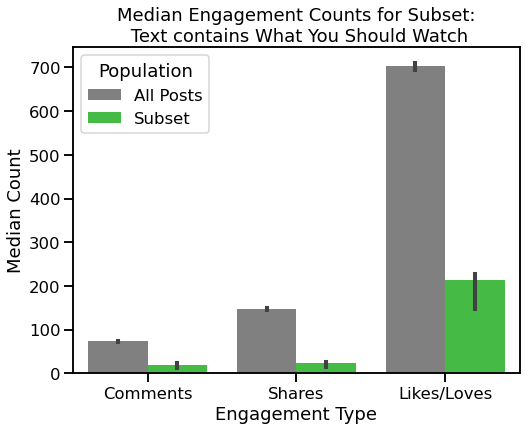

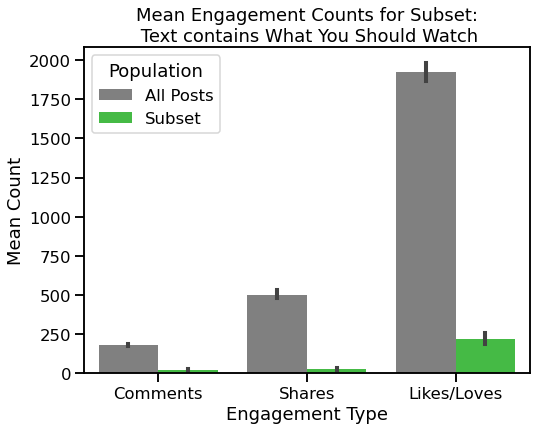

In [378]:
terms = ["what you should watch"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains What You Should Watch"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Question mark

Number of hits: 8245


Top engagement:


,all_text,comments_count,shares_count,likes_loves
20076,"Jessica Lange Says She's Done With 'American Horror Story'. Really, what is there left for one to do after playing a nun in charge of an insane asylum, a powerful New Orleans witch, and the proprietor of a Florida freak show? For Jessica Lange, not much more. She's done with American Horror Story. She won’t return for the fifth season of the show, which is to star Lady Gaga.",8841,12760,50545
7529,"The Premier League Standings if Only Goals by English Players Counted. No league would ever work this way, but it does show which clubs rely most on outside talent. What would the standings look like in a hypothetical league in which a goal does not count unless it is scored by an English player?",4347,29024,34488
43566,What Makes a Ryan Lochte a World-Class Swimmer. Has Ryan Lochte discovered the next big thing in swimming? http://nyti.ms/2axQIcz,3568,19910,38120
4464,"Timeline Photos. Eight Filipino servicemen live on this forsaken ship. Their job? To keep China in check. Yes, China: http://nyti.ms/1chw3UVHow did this shell of a ship become a battleground in a struggle that could shape the future of the South China Sea, and to some extent, the rest of the world? See the full interactive presentation of 'A Game of Shark and Minnow.' (Photo: Ashley Gilbertson/VIII, for The New York Times)",2761,11579,35251
37173,Photos from The New York Times's post. An island home to swimming pigs? One photographer's dream destination. http://nyti.ms/1UZvlRu Photos: Robin Schwartz for The New York Times,4936,7863,31193
29078,"Obama Reacts to Oregon Shooting: ‘We’ve Become Numb to This’. President Barack Obama, visibly angry and frustrated, lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.“Does anybody really believe that?” he asked, clearly outraged. During a televised briefing with reporters, President Obama lashed out at those who oppose gun limits by saying that their answer to such tragedies are more guns, not fewer.",2760,7078,49805
12490,"Narendra Modi Has American Facebook Fans, Too. Indian prime minister Narendra Modi has a larger American following on Facebook than most American politicians, including Governor Chris Christie and Senator Harry Reid. How did he become so globally 'Liked'?. The Indian prime minister’s base is larger than all but 21 American elected officials and current candidates, according to a site that tracks social media accounts.",1998,7573,178813
46822,"Michelle Obama on Donald J. Trump's comments on women: 'I have to tell you that I listen to all of this, and I feel it so personally .. The shameful comments about our bodies. The disrespect of our ambitions and intellect. The belief that you can do anything you want to a woman? It is cruel. It's frightening. And the truth is, it hurts.'",1662,14471,46119
10941,"Bill Clinton and George W. Bush Banter, and Introduce Leadership Program. Hope for bipartisanship? President Bill Clinton and President George W. Bush agree on something. The two former presidents exchanged compliments in Washington on Monday as part of an initiative involving four presidential libraries.",2950,5048,59327
32254,"'Do You Know Me? Do You Know My Heart?' On Being Muslim in NYC. “When I’m on the train, people don’t want to sit beside me. I’d like to talk but it’s easier to be silent. It’s sad. It’s easier for those who look American, but people who dress like me with a beard and kufi and my wife, who is covered, guys on the train see you and give you a grilled look.“Do you know me? Do you know my heart? Why are you judging by looking at me?”. New York City Muslims respond to Donald Trump’s call to bar followers of Islam from entering the United States.",2179,7054,32043



Least engagement:


,all_text,comments_count,shares_count,likes_loves
8708,"In Military Care, a Pattern of Errors but Not Scrutiny. What is your experience with America's military health-care system? Times reporters invite active-duty soldiers, their families and other people who have been treated at or worked in U.S. military hospitals to share their stories here: http://nyti.ms/VwJolM. Internal documents depict a military medical-care system in which scrutiny is sporadic and avoidable errors are chronic.",1,2,12
23041,"'The Affair' Recap: Does Noah Sound Like a Writer?. In Season 1, Episode 2 of The Affair, the moments of inauthenticity add up. And so do the caricatures. A few moments of inauthenticity add up.",1,1,14
14563,"'Sleepy Hollow' Recap: And the Father Has Eight Legs. Did you watch the latest episode of Sleepy Hollow?' It was the most demented episode of 'I Didn’t Know I Was Pregnant' ever.'. On this Election eve, is Ichabod Crane a conservative Republican or a liberal Democrat?",0,2,11
7187,"If a Bubble Bursts in Palo Alto, Does It Make a Sound?. The technology bubble may burst, but it won’t harm the rest of the country. Silicon Valley’s isolation from the rest of the economy guarantees it can’t hurt us (or help us) much.",0,2,6
7186,"If a Bubble Bursts in Palo Alto, Does It Make a Sound?. How the rest of the country will be affected if the technology bubble bursts. Silicon Valley’s isolation from the rest of the economy guarantees it can’t hurt us (or help us) much.",1,1,5


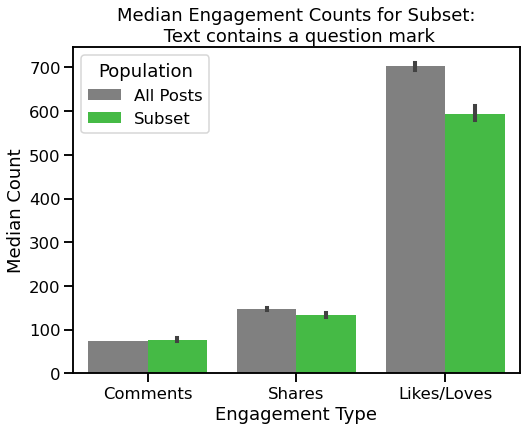

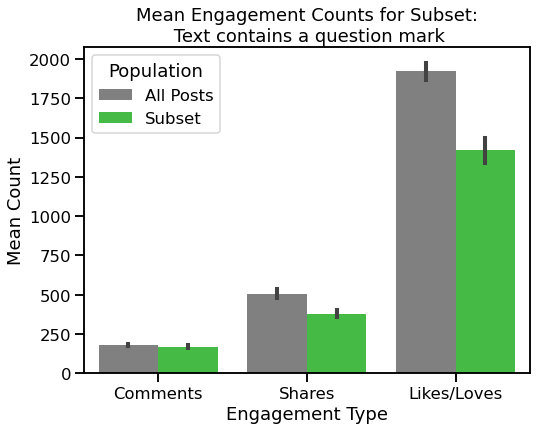

In [392]:
re_string = "[?]"

subset_title = "Text contains a question mark"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Here's what you need to know

Number of hits: 471


Top engagement:


,all_text,comments_count,shares_count,likes_loves
11557,"How ISIS Works. What you need to know about ISIS. With oil revenues, arms and organization, the jihadist group controls vast stretches of Syria and Iraq and aspires to statehood.",365,3438,3894
30207,Meat and Cancer: The W.H.O. Report and What You Need to Know. What you need to know about a report linking processed meats to cancer. Answers to a few questions about a report that linked colorectal cancer to the consumption of processed meats and red meat.,480,2262,2974
9528,What You Need to Know About the Ebola Outbreak. This is the biggest Ebola outbreak on record. Questions and answers on the scale of the outbreak and the science of the Ebola virus.,299,3301,3475
9485,Coconut Water Changes Its Claims. What you need to know about coconut water. The drink was once billed as a remedy for a number of health problems. But its marketers have changed their tune.,349,2204,3024
25827,"Travel to Cuba: The Latest on Flights, Hotels and Credit Cards. Who can travel to Cuba? How can you get there? Where would you stay? Here's what you need to know. As the United States reopens its Embassy in Havana, here’s what you need to know about traveling to Cuba.",191,1056,2848
35565,"Hillary Clinton's Legacy in Libya. What you need to know about Libya, the decision to intervene and the catastrophic results.Read our examination of the American intervention and Hillary Clinton's role in it: http://nyti.ms/21B9dh2",315,1301,1253
31225,"What Travelers Can Expect in Paris. What you need to know about traveling to Paris. If you’re visiting Paris, here’s what you need to know about flights, hotels, getting around and how to help in the wake of the attacks.",307,438,2373
12418,What You Need to Know About the Ebola Outbreak. When did the man infected with Ebola arrive in the U.S.? How big can the outbreak become? Here are answers to top questions about the Ebola outbreak. Questions and answers on the scale of the outbreak and the science of the Ebola virus.,230,1366,1273
10830,101 Places to Find Great Coffee in New York. Coffee lovers: Here's what you need to know to start your New York Sunday afternoon right. The number of serious coffee shops in New York has exploded. Enter your address to find the shops closest to you.,179,859,1863
33454,"What We Know About the Secret Meeting Between Sean Penn and 'El Chapo'. Sean Penn's interview included a seven-hour face-to-face meeting in the jungle, to which Penn didn't bring a pen, paper or a recording device. Here is what you need to know about the secret mountaintop meeting between Sean Penn and the drug lord Joaquín Guzmán Loera, also known as “El Chapo.”",194,541,2244



Least engagement:


,all_text,comments_count,shares_count,likes_loves
44190,Your Monday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,0,7,77
7086,Ask Well: Are Exercise Cool Downs Necessary?. What you need to know about post-workout cool downs. A reader asks: A lot of exercise routines call for a cool down at the end. Is this necessary?,3,8,20
7619,One Reason Health Insurance Premiums Vary So Much. What you need to know about the cost of health care. Paltry competition in some markets results in some areas charging much more for the same level of health insurance.,5,3,13
47387,Your Monday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,2,2,19
19543,"New York Today. The Times’s take on life in the New York region. What you need to know about politics, education, crime, real estate, culture, transportation and more.",0,0,0


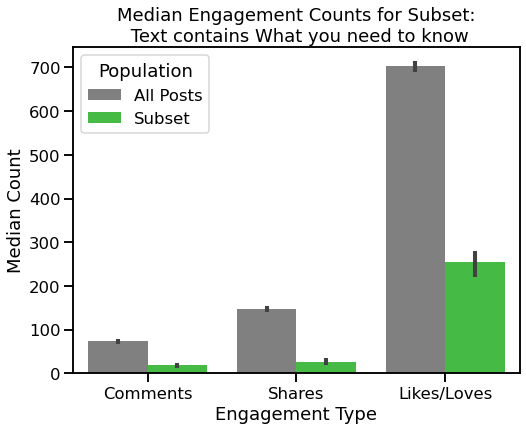

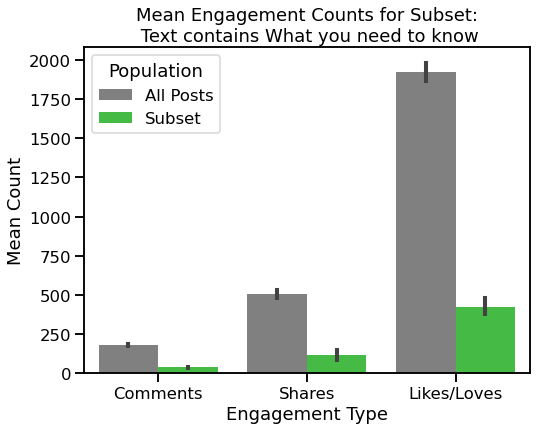

In [374]:
terms = ["what you need to know"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains What you need to know"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Daily Briefing

Number of hits: 125


Top engagement:


,all_text,comments_count,shares_count,likes_loves
38037,Your Thursday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,65,142,1728
39067,Your Thursday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,45,43,339
37749,"Your Friday Briefing: Bernie Sanders, Facebook Messenger, ‘The Jungle Book’. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.",82,23,240
39240,Your Monday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,40,34,377
37980,Your Wednesday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,71,21,243
39125,Your Friday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,55,37,225
40401,Your Wednesday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,62,15,187
14198,White House Imagines Life With G.O.P.-Controlled Senate. Your daily briefing from Washington. President Obama is starting to think about life after Nov. 4.,63,9,196
42840,"Bernie Sanders, Hillary Clinton, Solar Impulse: Your Tuesday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.",75,11,121
39298,Your Tuesday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,71,8,142



Least engagement:


,all_text,comments_count,shares_count,likes_loves
46067,Your Thursday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,7,8,46
40514,Your Friday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,4,7,73
45356,Your Thursday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,4,6,63
44190,Your Monday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,0,7,77
47387,Your Monday Briefing. Daily Briefing: Here's what you need to know today. Here’s what you need to know to start your day.,2,2,19


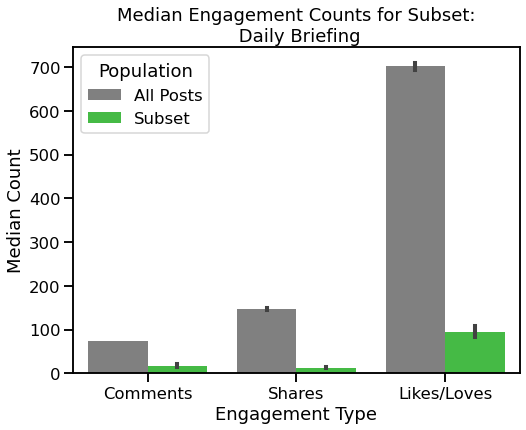

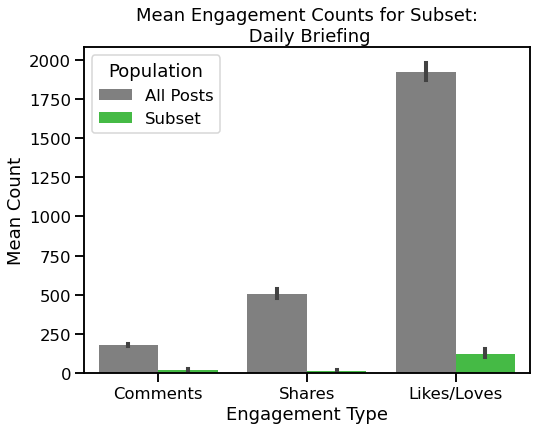

In [376]:
terms = ["daily briefing"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Daily Briefing"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### New York Today

Number of hits: 259


Top engagement:


,all_text,comments_count,shares_count,likes_loves
21672,"On Time-Lapse Rocket Ride to Trade Center’s Top, Glimpse of Do... From New York Today: Step inside the elevators at 1 World Trade Center and witness 515 years of history unfolding at the tip of Manhattan: http://nyti.ms/1Gb1lIA",3322,90812,69275
24183,"Review: ‘Flaming June’ Arrives in New York, Preceded by Its Reputation. It was once hailed as “the most wonderful painting in existence.” (via New York Today). Once hailed as “the most wonderful painting in existence” and later derided as kitsch, the Victorian masterpiece gets a solo show at the Frick.",394,3705,13408
26616,"She Answered His Ad for a Roommate, Moved In and Never Left. 'Strictly Platonic,' the advertisement said. And they were, for a while. (via New York Today). Kerry Ryan was 21 and had just arrived from Ireland when she replied to 43-year-old John Juback’s classified ad in The Village Voice. It has been 24 years since she came to check out the place.",375,881,10412
17940,"New York Today: 'Crippling and Potentially Historic Blizzard'. Here's what to expect from the storm. Monday: Gearing up for the storm, up to two feet of snow predicted, and Sheldon Silver steps aside.",290,2046,4862
23821,"Long Island Sees a Crisis as It Floats to the Surface. First came the dead turtles. Then came the dead fish, in numbers no one had ever seen before. There is little debate about what caused the die-offs. (via New York Today). In the largest kill of its kind that anyone can recall, thousands of dead fish washed ashore in the Peconic Estuary in recent months, victims of the nitrogen pollution that is the bane of the region.",312,2518,3497
4018,"Timeline Photos. On this date in 1851, The New-York Daily Times was born. It cost one cent and was the ancestor to The New York Times.Read all about it in New York Today: http://nyti.ms/1aT8wch",195,1026,5698
26990,"The Desnudas of Times Square, Topless but for the Paint. For these women in Times Square, being topless with body paint is performance art. The perks are the tips for photos. The downside is the criticism. (via New York Today). Seminude women in body paint stroll parts of Times Square to be photographed for tips, drawing curious onlookers and complaints.",442,341,2142
20102,"N.Y.U. Professor Is Barred by United Arab Emirates. The United Arab Emirates has barred a New York University professor from the country after he criticized the monarchy's treatment of migrant laborers.Check out New York Today for more news about New York City. Andrew Ross, who teaches at the New York campus and specializes in labor issues, has been an open critic of the poor treatment of migrant laborers in the monarchy.",127,461,2510
7865,"New York Today: Manhattanhenge. Here’s what you need to know in New York for Thursday. What you need to know for Thursday: A special golden hour, a chillier day, and a bear goes down in Albany.",87,808,2701
6908,"New York Today: Cherries Bloom in Brooklyn. Here's what you need to know in New York for Wednesday. What you need to know for Wednesday: a spring bud bursts forth, enjoyably average weather, and thieves target clunkers.",72,682,4498



Least engagement:


,all_text,comments_count,shares_count,likes_loves
11200,"City Room: New York Today: Last Chances for Art. Friday and the weekend: exhibits closing soon, partly delightful weather, and a smell map of the city.",1,6,106
10293,"New York Today: Improv, With Filters. Here’s what you need to know in New York for Tuesday. What you need to know for Tuesday: Comedy with a heart, another hot day, and 20,000 rolls of toilet paper.",1,7,95
20453,"Aging Ex-Mafia Boss’s Bid for Leniency on Jail Time Fails. A judge considered the health of a 71-year-old Mafia boss when sentencing him to 21 months, 14 of which he's served.Read more news about New York City on New York Today. Thomas DiFiore, 71, a former Bonanno family street boss who has been in jail for 14 months on a debt collection charge, highlighted his faltering health while seeking a shorter sentence.",2,9,22
19968,"Playing Police Officers, With a Car as Part of the Costume. How a bungled robbery revealed two volunteer police officers with other ambitions. Check out New York Today for more news about New York City. A widening investigation into two members of New York’s auxiliary police force suggests they may have aspirations other than fighting crime.",3,4,39
19543,"New York Today. The Times’s take on life in the New York region. What you need to know about politics, education, crime, real estate, culture, transportation and more.",0,0,0


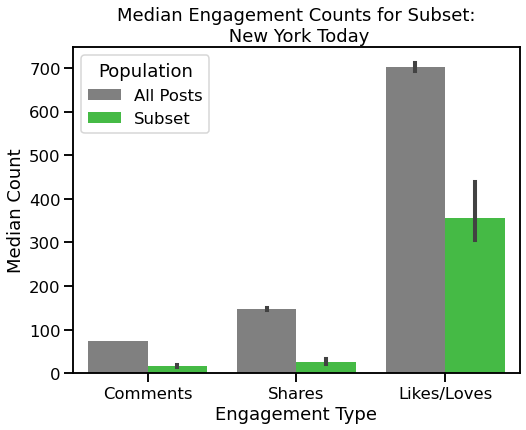

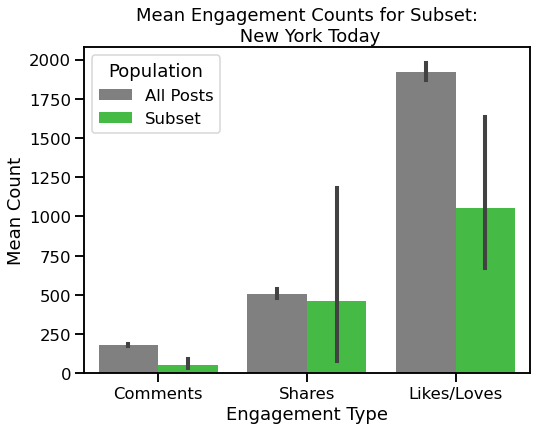

In [390]:
terms = ["new york today"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "New York Today"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Ebola

Number of hits: 436


Top engagement:


,all_text,comments_count,shares_count,likes_loves
13916,"Timeline Photos. In the Oval Office President Obama hugs Nina Pham, a nurse who was infected with Ebola while caring for a patient in Dallas. Ms. Pham was declared virus free and released from the hospital on Friday. Photo: Stephen Crowley/The New York Times",8351,20434,238585
22474,"Weeks After His Recovery, Ebola Lurked in a Doctor’s Eye. A doctor was told he had been cured of Ebola. But the virus was lurking in his eye. Dr. Ian Crozier, who survived an Ebola infection last fall, calls himself a poster child for “post-Ebola syndrome,” which is also being reported in West Africa.",503,3669,6986
13872,"Patient in New York City Tests Positive for Ebola. Dr. Craig Spencer, who recently returned from treating Ebola patients in Guinea tested positive for the Ebola virus Thursday, becoming New York City's first diagnosed case. The patient, Dr. Craig Spencer, returned from Guinea on Oct. 14. Health authorities are tracing anyone who might have come into contact with him recently.",912,6347,3763
13651,Cuba’s Impressive Role on Ebola. Cuba’s work to contain Ebola should be 'lauded and emulated.' The Times editorial board argues that the U.S. has a moral responsibility to assist Cuban medics on the front lines of the Ebola response. The efforts of this small country and its doctors are putting America’s contributions to shame.,367,4034,9779
9600,"Patient at Mount Sinai Has Ebola-Like Symptoms, Hospital Says. A patient in New York has Ebola-like symptoms, hospital says. The man is being kept in isolation in the Manhattan hospital while tests are being done for the virulent viral disease, but also for other illnesses that could cause his symptoms.",888,4743,3380
16291,"An Ebola Orphan’s Plea in Africa: ‘Do You Want Me?’. They call her Sweetie Sweetie. Her father had died of Ebola. So had her sister. When the ambulance arrived for her mother, Sweetie Sweetie climbed in, too. As her mother grew sicker, Sweetie Sweetie helped take care of her. After her mother died, the young girl stood outside the Ebola clinic’s gates looking around with enormous brown eyes. There was no one to pick her up. After her mother died of Ebola, a young girl in Sierra Leone was left an orphan when nobody in her village, even relatives, wanted to take her, though she showed no symptoms of the virus",456,2392,5459
14422,Timeline Photos. Take some time for these portraits of men and women who work at an Ebola treatment center in Liberia: http://nyti.ms/1wUZS4P,717,709,4656
9528,What You Need to Know About the Ebola Outbreak. This is the biggest Ebola outbreak on record. Questions and answers on the scale of the outbreak and the science of the Ebola virus.,299,3301,3475
9739,"Tracing Ebola’s Breakout to a 2-Year-Old. Patient Zero in the Ebola outbreak, researchers suspect, was a 2-year-old boy. Here's how it spread. The current Ebola outbreak, the largest ever, seems likely to surpass all previous known Ebola outbreaks combined, and epidemiologists predict it will take months to control.",242,3044,4470
13413,"A Hospital From Hell, in a City Swamped by Ebola. In recent weeks, the world has vowed to step up its response to the Ebola epidemic. Here's an article from earlier this month on one city in Sierra Leone, where Ebola patients are dying in foul-smelling hospital wards surrounded by pools of infectious waste, cared for as best they can by lightly trained nurses. Ebola is sweeping into areas of West Africa that had been largely spared the onslaught. The consequences in one Sierra Leone hospital have been devastating.",413,1999,2271



Least engagement:


,all_text,comments_count,shares_count,likes_loves
11205,Op-Ed Contributors: A Feeble Response to Ebola in Liberia. From the Opinion section of The New York Times:. The outbreak is an international threat and demands vigorous global action before all of West Africa collapses into chaos.,6,13,92
11252,Editorial: The Sluggish Fight Against Ebola. From the Opinion section of The New York Times:. American and other efforts are not moving fast enough to keep up with the increasing infection and death rates.,4,9,124
12562,"Contact Tracing Is Called Pivotal in Fighting Ebola. Although Ebola is new to the United States, the goal of contact tracing is the same in any disease: Track down those who could have been exposed.",5,11,60
19231,Ending the Ebola Outbreak. Months of declining cases have fed hopes that the Ebola outbreak might finally be ending. Months of declining cases have fed hopes that the Ebola outbreak might finally be ending.,1,12,19
19230,Ending the Ebola Outbreak. An uptick in new Ebola cases at the end of January in Sierra Leone and Guinea shows that the virus will not go away easily. Months of declining cases have fed hopes that the Ebola outbreak might finally be ending.,0,4,11


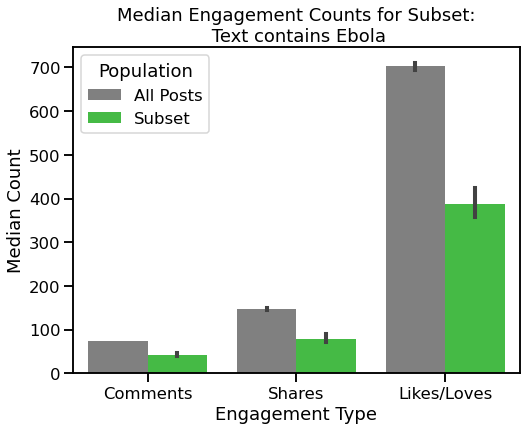

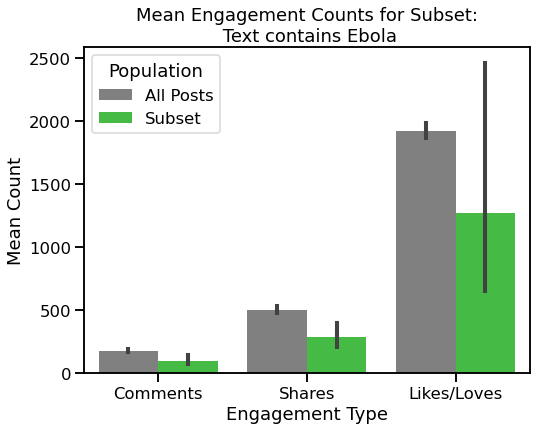

In [365]:
terms = ["ebola"]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Ebola"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### General Government and Politics

Number of hits: 2319


Top engagement:


,all_text,comments_count,shares_count,likes_loves
45943,"Hillary Clinton's Political Stamina. 'As soon as he travels to 112 countries and negotiates a peace deal, a cease fire, a release of dissidents, an opening of new opportunities and nations around the world or even spends 11 hours testifying in front of a congressional committee, he can talk to me about stamina.' —Hillary Clinton",7073,34818,265234
45832,"Hillary Clinton for President. The NYT editorial board endorses Hillary Clinton for president: 'We’re aiming .. to persuade those of you who are hesitating to vote for Mrs. Clinton — because you are reluctant to vote for a Democrat, or for another Clinton, or for a candidate who might appear, on the surface, not to offer change from an establishment that seems indifferent and a political system that seems broken.'. Our endorsement is rooted in respect for her intellect, experience and courage.",2598,10636,50078
38382,"John Boehner Describes Ted Cruz as 'Lucifer in the Flesh'. “I get along with almost everyone, but I have never worked with a more miserable son of a bitch in my life,' John Boehner said about Ted Cruz. During a forum at Stanford University in which he discussed the presidential election and his time in office, former House Speaker John A. Boehner’s harshest assessment was saved for Senator Ted Cruz, who he has not forgiven for spearheading the 2013 government shutdown.",2852,13481,25327
33653,"Why I Will Never Vote for Donald Trump. 'There are many reasons to abstain from voting for Donald J. Trump if he is nominated, starting with the fact that he would be the most unqualified president in American history.' Read on in The New York Times Opinion Section. Party loyalty has limits. Mr. Trump has altered the political equation because he has altered the moral equation.",2093,8171,27457
13199,"Imprinting the Face of Gandhi on a New Brand of Leadership. Watching Prime Minister Narendra Modi over the last month, one might have gotten the impression that Mohandas K. Gandhi was his ideological progenitor, or his running mate. Prime Minister Narendra Modi has attached himself to the image of India’s revered independence leader, even though their political beliefs diverge in many ways.",1709,4620,241832
17750,"The Megyn Kelly Moment. 'Attractive-looking blond anchorwomen are not rare,' Brit Hume, a Fox News senior political analyst said. 'Attractive-looking blond anchorwomen who speak with a fierce authority are rare.'. The anchor has brought Fox News a more unpredictable approach to red-meat politics. Can she draw a more unpredictable audience?",4201,3196,51594
30648,"Justin Trudeau Is Sworn In as Prime Minister of Canada. Half of Justin Trudeau's cabinet ministers are women. When a reporter asked why gender balance was important, he replied, “Because it’s 2015.”. Ending nearly a decade of Conservative government, Mr. Trudeau, the Liberal Party leader, took the oath of office at Rideau Hall in Ottawa on Wednesday.",1024,5210,44678
28790,"John Boehner Will Resign From Congress. Breaking News: Speaker John Boehner will resign from Congress at the end of October, aides say. Mr. Boehner, the House speaker since 2011, has decided to step down next month, throwing Congress into chaos as it tries to avert a government shutdown.",1470,8233,12855
45894,"For Some, Bush-Obama Rapport Recalls a Lost Virtue: Political Civility. The image of Michelle Obama hugging George W. Bush became an instant metaphor. The Bush and Obama families have a deep bond, thanks to the shared experience of life in the White House and George W. Bush’s decorum as an ex-president.",860,6779,54212
47680,"Donald Trump’s Impeachment Threat. 'Beyond simple hypocrisy, the Republican impeachment threat demonstrates their gathering disrespect for democracy,' the Editorial Board writes in The New York Times Opinion Section. Republicans are indicating that if they can’t gain control of government fairly, they’ll simply undermine it.",1847,7227,10823



Least engagement:


,all_text,comments_count,shares_count,likes_loves
25800,"As Germany Tries to Hold On to Its Art, Some Works Drop From View. With prices of contemporary art soaring, Germany is drafting laws intended to slow or block the movement of art to other countries for auctions, private sales, exhibitions or art fairs. The government is proposing legislation that would limit the export of valuable artwork for sale, prompting protests by artists and dealers.",4,10,36
11409,Renewing Health Coverage May Not Be as Automatic as Government Says. Officials are encouraging consumers to revisit the federal marketplace to compare plans and ensure that they get the right amount of financial assistance in 2015.,5,6,40
498,"Ask Janine di Giovanni About Reporting From Syria. How do Syria's soldiers who are fighting on the Assad government's side see their conflict against the country's armed resistance? Janine di Giovanni was granted a rare journalist's visa to report from their side of the conflict. Ask her your questions on The Lede blog.Also, watch this video on being embedded with the Syrian army: http://nyti.ms/RiDHlAAnd read Ms. di Giovanni's report from the battle for the city of Homs: http://nyti.ms/VIlWAm. Janine di Giovanni will respond to questions from readers on her experience of reporting from Syria.",1,5,50
10353,"Governor Cuomo’s Failure on Ethics Reform Hinders an Endorsement. Over on his Facebook page, Andrew Rosenthal writes: 'The editorial board’s decision not to endorse either candidate in the Democrat primary for governor was guaranteed to annoy partisans on both sides, and the comments on today’s editorial reflect that anger.'Follow the editorial page editor's updates here on Facebook: http://on.fb.me/YXEyQ2. The Times will not make an endorsement in the Democratic primary for governor because Andrew Cuomo failed to keep his most important campaign promise and Zephyr Teachout lacks political experience.",4,3,18
22409,"They Don’t Make Politicians – or Campaigns – the Way They Used To. This campaign is a far more dispiriting affair to try to cover. Prime Minister David Cameron, leader of the Conservative Party, aims to hold onto power and edge the Labour Party, led by Ed Miliband. It's a tight race and several other parties will play pivotal rolls in determining the direction and shape of the government, including the Liberal Democrats, led by…",3,1,12


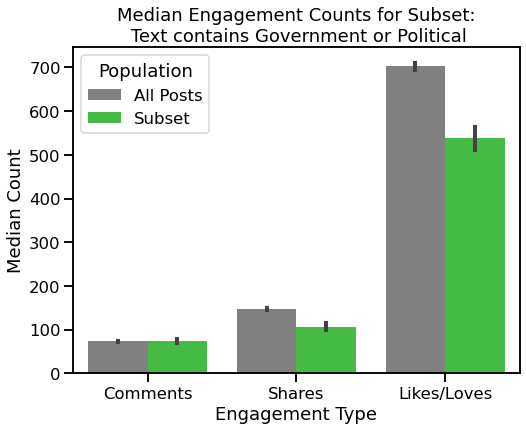

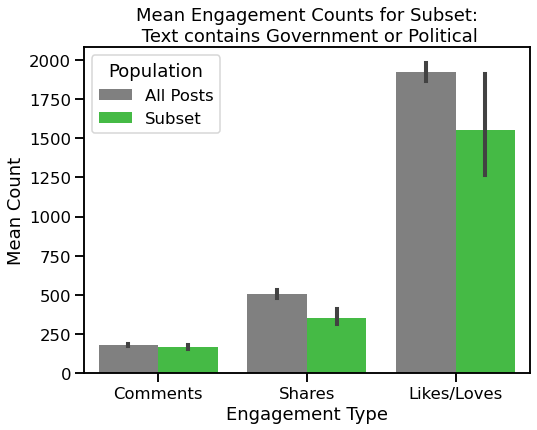

In [366]:
terms = ["government", 'political']

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Government or Political"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)


Top engagement:


,article_text,comments_count,shares_count,likes_loves
30648,"Justin Trudeau Is Sworn In as Prime Minister of Canada. Ending nearly a decade of Conservative government, Mr. Trudeau, the Liberal Party leader, took the oath of office at Rideau Hall in Ottawa on Wednesday.. OTTAWA — Justin Trudeau, the leader of the Liberal Party, was sworn in as prime minister of Canada on Wednesday morning, ending nearly a decade of Conservative dominance.",1024,5210,44678
46437,"Your Surgeon Is Probably a Republican, Your Psychiatrist Probably a Democrat. New data show distinct political leanings in many medical specialties. Over all, the field is becoming more Democratic.. We know that Americans are increasingly sorting themselves by political affiliation into friendships, even into neighborhoods. Something similar seems to be happening with doctors and their various specialties.",1053,4796,7510
35760,"Trump’s Il Duce Routine. Europe knows that democracies can collapse. It watches Trump with memories of when the sky darkened.. LONDON — Europe, the soil on which Fascism took root, is watching the rise of Donald Trump with dismay. Contempt for the excesses of America is a European reflex, but when the United States seems tempted by a latter-day Mussolini, smugness in London, Paris and Berlin gives way to alarm. Europe knows that democracies can collapse.",493,5141,9098
14797,"Triumph of the Wrong. It’s not often that a party that is so wrong about so much does as well as Republicans did on Tuesday.. The race is not to the swift, nor the battle to the strong, neither yet bread to the wise, nor yet midterms to men of understanding. Or as I put it on the eve of another Republican Party sweep, politics determines who has the power, not who has the truth. Still, it’s not often that a party that is so wrong about so much does as well as Republicans did on Tuesday.",584,1895,4673
14618,"Negativity Wins the Senate . Republicans returned to the majority by campaigning on basically one thing: what they called the failure of President Obama.. Republicans would like the country to believe that they took control of the Senate on Tuesday by advocating a strong, appealing agenda of job creation, tax reform and spending cuts. But, in reality, they did nothing of the sort.",373,1767,4419
32384,Trump’s Weimar America. It would be foolish not to take Trump seriously. The unthinkable has happened in Europe. It's not impossible in America.. NEW YORK — Welcome to Weimar America: It’s getting restive in the beer halls. People are sick of politics as usual. They want blunt talk. They want answers.,268,1581,5178
39184,"Brazil’s Graft-Prone Congress: A Circus That Even Has a Clown. The legislature contains a dizzying cast of characters, and, by one count, more than half of its 594 members face legal challenges.. BRASÍLIA — One of Brazil’s longest-running spectacles features a dizzying array of characters whose theatrics appear on millions of television sets most nights.",356,1995,2825
34293,"Michigan Gave State Employees Purified Water as It Denied Crisis, Emails Show. Months before Gov. Rick Snyder acknowledged a problem with the water in Flint, the state was providing coolers of purified water at its office there.. Throughout most of 2015, the administration of Gov. Rick Snyder told the residents of Flint, Mich., that their tap water was safe to drink. But emails released on Thursday suggest the state was concerned about its own employees’ exposure to the city’s water as early as January of last year, even arranging for purified water to be provided at a state office building there.",477,2063,2206
26932,"The Closing of the Canadian Mind. The tenure of Prime Minister Stephen Harper has seen the slow-motion erosion of the country’s reputation for open, responsible government.. THE prime minister of Canada, Stephen Harper, has called an election for Oct. 19, but he doesn’t want anyone to talk about it.",266,3504,3024
25797,Quiz: Name That Narcissist. Who said it: the bras


Least engagement:


,article_text,comments_count,shares_count,likes_loves
18328,"New Speaker in Albany: A Skilled Operator, Embracing Change. Carl E. Heastie says he hopes to reform the almost czarlike system in which the Assembly is ruled by its speaker, though his political career would seem to make him better suited to thrive in that environment.. ALBANY — After his election on Tuesday as speaker of the New York State Assembly, Carl E. Heastie echoed calls to reform the opaque and almost czarlike system in which the legislative chamber is ruled by its speaker, one of the “three men in a room” who dominate state government.",7,7,48
14612,"De Blasio Still Faces Uphill Battle in Trying to Connect With Cuomo. The tension between Gov. Andrew M. Cuomo and Mayor Bill de Blasio is not likely to change with the election results, public officials and political experts say.. For the most dysfunctional couple in New York politics, it was a chance for a feel-good moment after a feel-bad year.",6,9,39
14574,"Riding Wave of Discontent, G.O.P. Takes Senate. Republicans picked up seats in Arkansas, West Virginia, Montana, South Dakota, Colorado, North Carolina and Iowa, consolidating their power on Capitol Hill.. Resurgent Republicans took control of the Senate on Tuesday night, expanded their hold on the House, and defended some of the most closely contested governors’ races, in a repudiation of President Obama that will reorder the political map in his final years in office.",4,9,27
8559,"Cochran Holds Off Tea Party Challenger in Mississippi. A surge of voters showed up on Tuesday in African-American precincts and delivered Senator Thad Cochran a hard-fought victory over his Tea Party challenger, Chris McDaniel.. HATTIESBURG, Miss. — With an unusual assist from African-American voters and other Democrats who feared his opponent, Senator Thad Cochran on Tuesday beat back a spirited challenge from State Senator Chris McDaniel, triumphing in a Republican runoff and defeating the Tea Party in the state where the movement’s hopes were bright.",6,2,15
24522,Al Jazeera Journalist Held in Germany Awaits Verdict on Egyptian Arrest Warrant. Ahmed Mansour is one of many figures whose arrest and extradition Cairo has demanded. His lawyers said the charges were politically motivated.. BERLIN — An Egyptian-British journalist working for the television news network Al Jazeera remained in German custody on Sunday pending a court ruling on the validity of an Egyptian arrest warrant that served as grounds for his detention at a Berlin airport over the weekend. His lawyers said the charges were politically motivated.,1,3,16


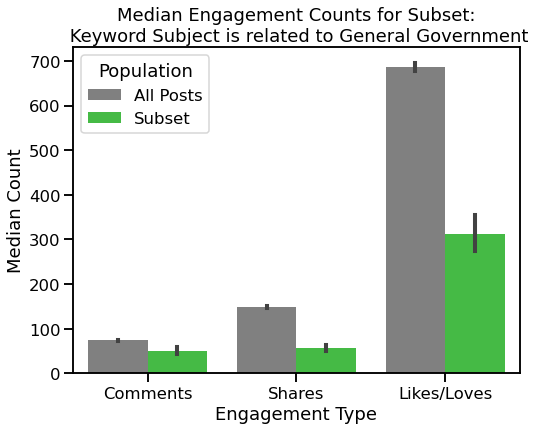

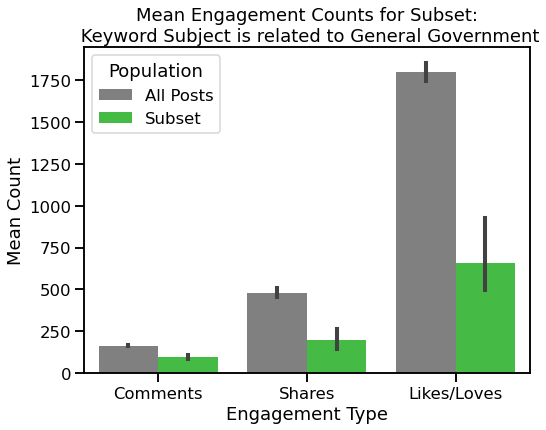

In [367]:
terms = ['midterm elections (2014)', 'politics and government', 'jury system',
        'political action commitees']

subset_title = 'Keyword Subject is related to General Government'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

### Fashion

Number of hits: 568


Top engagement:


,all_text,comments_count,shares_count,likes_loves
41315,"Bill Cunningham, Legendary Times Fashion Photographer, Dies at 87. Bill Cunningham, the legendary New York Times fashion photographer, has died. “To see a Bill Cunningham street spread was to see all of New York.'. In nearly 40 years working for The New York Times, Mr. Cunningham operated both as a chronicler of fashion and as an unlikely cultural anthropologist.",1143,11458,8699
24322,"36 Hours in Lima. Lima’s winning formula: A rich pre-Columbian heritage, emerging art and fashion scenes, and remarkably great food. http://nyti.ms/1BjrKpl",639,17529,9693
38618,"gph.is. They’re banned in France, mandated in Saudi Arabia and a fashion statement in Indonesia. Here’s your guide to Muslim veils. http://nyti.ms/1Tt5JqKIllustration: Antonio de Luca",1319,3569,6690
24985,"Macy's Drops Donald Trump's Fashion Line Over Immigrant Remarks. Macy's is ending its relationship with Donald J. Trump and phasing out his line of suits, shirts and ties after remarks he made about Mexican immigrants. Macy’s is ending its relationship with Mr. Trump and phasing out his line of suits, shirts and ties after remarks he made about Mexican immigrants.",1243,1403,19189
13674,"Oscar de la Renta, Fashion Designer, Dies at 82. Oscar de la Renta, the doyen of American fashion, whose career began in the 1950s in Spain and sprawled across Paris and New York, and who was the last survivor of that generation of bold, all-seeing tastemakers, dies at 82. Mr. de la Renta dressed the wives of four American presidents and untold numbers of the ladies who lunch.",495,4549,10355
42854,"Michelle Obama’s Dress May Have Looked Simple, but It Spoke Volumes. 'Fashion is not known for its embrace of togetherness (more for its exclusion). But Christian Siriano is,' fashion critic Vanessa Friedman writes. The first lady, in Christian Siriano, wore more than just a pretty frock. Read between the seams.",579,1900,17979
33527,"David Bowie Allowed His Art to Deliver a Final Message. David Bowie told very few people about the cancer that preceded his death. Mr. Bowie, who in his 50-year career reimagined the worlds of pop music, art and fashion, told very few people about the cancer that preceded his death on Sunday.",381,4439,30490
37345,Model in Gucci Ad Is Deemed ‘Unhealthily Thin’ by British Regulator. The Advertising Standards Authority of Britain ruled that a Gucci ad was 'irresponsible' and that this model looked 'unhealthily thin.'. The ruling by the Advertising Standards Authority fanned a perennial debate in the fashion industry about what constitutes underweight.,1410,1558,4907
1328,"Timeline Photos. Another look at the First Lady's Jason Wu gown, and this appraisal of her inaugural style by New York Times fashion critic Eric Wilson: http://nyti.ms/YjLbtO(Photo: Luke Sharrett for The New York Times)",482,1425,11523
20584,"As ‘Mad Men’ Comes to an End, Jon Hamm Reflects on Don Draper. “We got lucky — we got really lucky,” said Jon Hamm, who is several shades more modest (and bearded) than the irresistible if deeply flawed character he plays on 'Mad Men.'. The series, which revived the fashion and pop culture of a tumultuous decade and reminded viewers of the racism and sexism of the era, begins its final seven episodes on April 5.",373,1478,14157



Least engagement:


,all_text,comments_count,shares_count,likes_loves
1593,"Peter Som’s Digital Runway. Why did designer Peter Som sacrifice a coveted spot at the New York Fashion Week tents for a digital runway? 'The idea of doing a digital fashion show broke down the walls of what a traditional show was about, and my customers live online so much that this was an exciting way for me to give them a show,” Mr. Som said. The designer gave up his coveted spot at the tents for a digital presentation. The benefits, he believes, outweigh the sacrifices.",3,7,84
176,"Live Coverage of the Emmys. And the Emmy goes to.. The show has begun. Follow along with us! See a slide show of the nominees here: http://nyti.ms/NLlVXU. The fashion, the competition, the pomp and circumstance. Watch the Emmy Awards tonight with news and analysis from New York Times reporters and editors.",5,3,50
13412,"Apolis, Bespoken, Ovadia & Sons and More: Brothers in the Men’s Luxury Fashion Market. For five sets of brothers, blood and fashion mix well. In an American fashion movement, siblings are starting their own men’s wear labels and tapping into a growing luxury market.",3,3,24
38390,Vanessa Friedman. New York Times & INYT Fashion director/chief critic; On the Runway blogger; author 'Emilio Pucci',0,0,0
26996,"The New York Times Styles. Coverage of the fashion industry, lifestyle trends, beauty tips, well-known and lesser-known personalities and modern living from The New York Times.",0,0,0


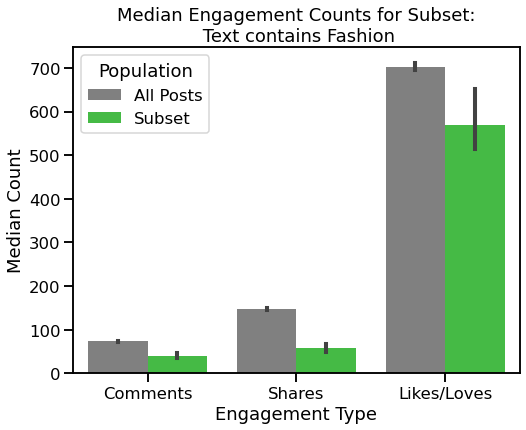

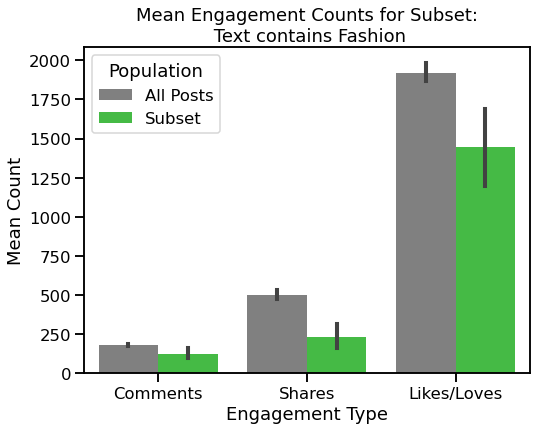

In [373]:
terms = ['fashion' ]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Fashion"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Sports

Number of hits: 718


Top engagement:


,all_text,comments_count,shares_count,likes_loves
42285,"With Obama, the Personal Is Presidential. 'If, as was often said about black pioneers in sports, you had to be twice as good to succeed, Barack Obama’s personal behavior has set a standard few presidents have ever reached.' Read on in The New York Times Opinion Section. No matter what you think of his time in office, it’s hard to argue that the human being has been anything less than a model of class and dignity.",1883,13207,64968
13601,"For South Korea, Host of League of Legends Championship, E-Sports Is National Pastime. Nearly 40,000 fans filled the soccer stadium in Seoul on Sunday to watch the world championship for League of Legends: http://nyti.ms/1vRznix.Watch 10,000 League of Legends games in 30 seconds here: http://nyti.ms/1snzGQN. The extent to which video games have become part of mainstream culture in South Korea may be a sign of things to come in the West.",1341,4543,59206
31081,"How the Paris Terror Attacks Unfolded. A series of 6 attacks in Paris from the main sports stadium, the Stade de France, to the Bataclan concert hall, spread terror across the city Friday night.Follow the latest updates: http://nyti.ms/1Src32P",1155,13997,19814
31062,"Attacks in Central Paris: Live Updates. PARIS UNDER SIEGE; MANY DEATHS. Shootings in central Paris on Friday night have left several people dead and wounded, French television reported, while an explosion near Paris at the country’s main sports stadium forced the hasty evacuation of President François Hollande. The explosion occurred during a France-Germany soccer match…",1245,14761,13118
31083,"Merkel Tells Germans, 'Freedom Is Stronger Than Terror'. 'Those who we mourn were murdered in front of cafes, in restaurants, in a concert hall or on the open street. They wanted to live the life of free people in a city that celebrates life,' Angela Merkel said, her voice breaking. 'And they met with murderers who hate this life of freedom.'. Shootings in central Paris on Friday night have left several people dead and wounded, French television reported, while an explosion near Paris at the country’s main sports stadium forced the hasty evacuation of President François Hollande. The explosion occurred during a France-Germany soccer match…",774,5269,36623
40200,"Muhammad Ali, Titan of Boxing and the 20th Century, Dies at 74. Muhammad Ali was the most charismatic and polarizing sports figure of the 20th century. Ali was the most thrilling if not the best heavyweight boxer of all time, a towering figure with an agile mind who was both admired and vilified for his religious, political and social stances.",672,10265,17755
24940,"United States Defeats Germany to Advance to World Cup Finals. Sports Alert: The U.S. advanced to the FIFA Women's World Cup finals with their most impressive performance in recent memory, notching a 2-0 victory over a top-ranked German team. Carli Lloyd scored on a penalty kick in the 69th minute and assisted on Kelley O’Hara’s goal 15 minutes later as the Americans topped the favored Germans.",498,3505,38056
21991,"Timeline Photos. Malcolm Taylor, a Baltimore city bus driver, was watching the riots unfold on television, and saw some of the players he coaches in youth football among the rioters. He gathered 15 friends, including some church pastors, and went to the riots near Mondawmin Mall to try to calm things down",446,3761,16747
25977,"It’s Time to Reconsider Barry Bonds for the Hall of Fame. Barry Bonds deserves to be in the Hall of Fame, writes sports reporter and columnist Harvey Araton. After an expensive, decade-plus chase of Bonds, baseball’s record-holder for home runs in a career and single season, even the government gave up trying to pin the rap on him.",1133,1561,8407
40997,"Cavaliers Defeat Warriors to Win Their First N.B.A. Title. LeBron James led the Cleveland Cavaliers to their first NBA championship with a 93-89 victory over the Golden State Warriors. The Cavaliers became the first team


Least engagement:


,all_text,comments_count,shares_count,likes_loves
23697,"The Most Cursed Sports Cities in America. Clutch City or Choke City? Houston is among America’s most cursed sports cities, according to a ranking of the nation’s 13 worst suffering fan bases. The N.B.A. finals feature two fan bases that have endured years of suffering: Cleveland’s and Oakland’s. Here, we rank the top 13 cities by sports agony.",3,7,18
47369,"Fantasy Sports Companies Near Settlement With New York State. The agreement was expected to cost DraftKings and FanDuel a total of $8 million to $12 million. DraftKings and FanDuel are close to an agreement with New York’s attorney general over claims that they engaged in false advertising, according to two people familiar with the discussions.",4,2,33
23694,"The Most Cursed Sports Cities in America. Cleveland has endured 147 consecutive sports seasons without a championship. A ranking looks at the country’s 13 most-cursed sports cities. The N.B.A. finals feature two fan bases that have endured years of suffering: Cleveland’s and Oakland’s. Here, we rank the top 13 cities by sports agony.",0,8,13
23692,"The Most Cursed Sports Cities in America. The Golden State Warriors are trying to end Oakland’s streak of 70 consecutive sports seasons without a championship – putting the city on a The New York Times ranking of the country’s 13 most cursed sports cities. The N.B.A. finals feature two fan bases that have endured years of suffering: Cleveland’s and Oakland’s. Here, we rank the top 13 cities by sports agony.",2,4,4
15093,"Timeline Photos. Clemson Football still has a path to the college football playoff: http://nyti.ms/14qNCzM. We lay it out, as well as the paths for other top teams",4,0,10


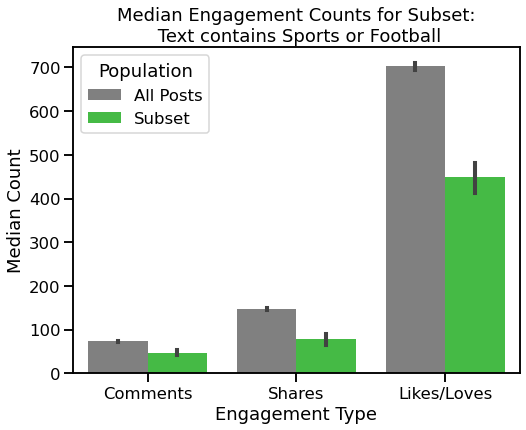

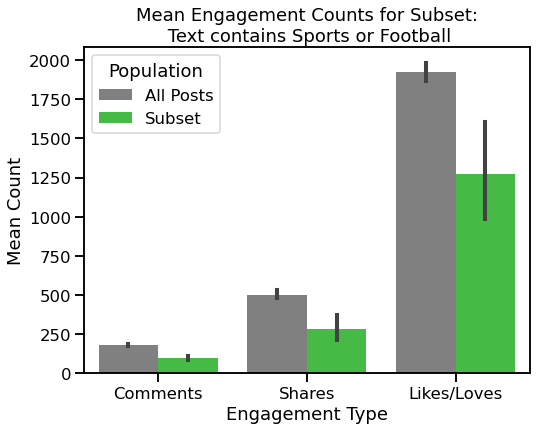

In [368]:
terms = ['sports', 'football' ]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Sports or Football"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)


Top engagement:


,article_text,comments_count,shares_count,likes_loves
15027,"Busting a Barrier, Preserving the Seams. A handful of clothing companies were founded within the last year to cater to muscular athletes whose proportions fall outside the average body type.. Beth Newell and Adil Abubakar hit a snag early in their attempt to start a clothing company. The manufacturer was having difficulty believing that their measurements were accurate.",546,1315,2605
44049,"Sure, These Women Are Winning Olympic Medals, but Are They Single?. News coverage of the Rio Games draws complaints about sexism in the media.. When Corey Cogdell-Unrein of the U.S. Olympic team won a bronze medal in women’s trap shooting, The Chicago Tribune left out a key detail when it shared the news: her name. It described her only as the wife of a Bears lineman.",216,1167,5328
44046,"Understanding the Controversy Over Caster Semenya. Naturally high testosterone levels in women have not been scientifically demonstrated to give them a more significant edge than many other factors.. RIO DE JANEIRO — Caster Semenya of South Africa, heavily favored to win the Olympic women’s 800 meters, ran a quick opening round this week and then breezed past reporters.",380,928,2875
8562,"‘Gnarly in Pink’. This short film celebrates the “Pink Helmet Posse,” three 6-year-old girls who share an unusual passion: skateboarding.. Last fall, when passing by a skate park in Encinitas, Calif., near San Diego, we were delighted to find three little girls skateboarding in pink tutus and helmets. We immediately decided to tell their story – in a documentary style as playful and eclectic as our subjects.",150,684,6348
43813,"The Secret of Jamaica’s Runners. How does this island nation dominate track and field? It’s about culture, not genetics.. CAMBRIDGE, Mass. — Among the most enigmatic features of Jamaica, an island of only 2.8 million people, is its astonishing supremacy in running. Currently, the world’s fastest man and woman are both Jamaicans. Nineteen of the 26 fastest times ever recorded in 100 meter races were by Jamaicans. The list goes on.",176,920,2237
45262,"Simone Biles and Williams Sisters Latest Target of Russian Hackers. Documents, published this week, show Simone Biles and Serena and Venus Williams received exemptions to use banned drugs.. Russian hackers — possibly the same group that compromised the Democratic National Committee’s computer servers — have made top American athletes their latest target.",440,666,1259
24950,"A Most Dangerous Game. Welcome to calcio storico, a centuries-old competition in Florence with very few rules and the sort of human wreckage generally associated with the gladiators.. FLORENCE, Italy — Last Tuesday, about 24 hours before he jammed his fingers into another man’s nose, dropped his elbow across another man’s neck and put another man’s feet where one’s ears are supposed to be, Rodrigue Nana considered, just for a moment, the basic notion of fear.",148,862,2042
26410,"When Will Fashion Discover Ronda Rousey?. It seems like a missed opportunity that designers have shown little interest in dressing top female athletes like the mixed martial arts star.. For a sector that has suddenly discovered its love of all things “athleisure” (Tory Sport, anyone? Stella McCartney for Adidas? Kering’s Sport & Lifestyle division?) — not to mention its love of all things celebrity — fashion has been extraordinarily slow to embrace female sports stars.",267,253,3166
45221,"As Colin Kaepernick’s Gesture Spreads, a Spirit Long Dormant Is Revived. Pro athletes in today’s branded age have tended toward self-censorship on divisive issues. Kaepernick’s recent protests may be changing that.. Colin Kaepernick, the San Francisco 49ers quarterback who touched off a national debate when he chose not to stand during the playing of the national anthem before games, has emboldened a handful of other players to follow suit.",265,228,2982
46704,"What Exactly Is ‘Locker-Room Talk’? Let an Exp


Least engagement:


,article_text,comments_count,shares_count,likes_loves
18105,"To Allay Fears, N.F.L. Huddles With Mothers . Through a nonprofit group, USA Football, the N.F.L. has tried to reassure mothers, many of whom decide which sports their children play, that football can be played safely.. KISSIMMEE, Fla. — Rebecca Morgan squared her feet, bent her knees, raised her hands and tried to connect with her inner linebacker. Beside her, two dozen other mothers did the same as they listened to Mike Haynes, a former N.F.L. defensive lineman, teach them how to tackle safely.",7,19,102
11528,"The Big Leagues. A killer three-pointer no longer cuts it in the world of pro basketball. To succeed as a multimillion-dollar brand, an athlete needs business savvy, fashion know-how and good table manners. Welcome to the N.B.A.’s other training camp.. A killer three-pointer no longer cuts it in the world of pro basketball. To succeed as a multimillion-dollar brand, an athlete needs business savvy, fashion know-how and good table manners. Welcome to the N.B.A.’s other training camp.",4,18,102
43317,"An Olympic Feat: Seeing Pictures Before They Happen. Drawing upon experience, instinct and visual virtuosity, Chang Lee elevates the art of sports photography to an Olympic-level event.. Being a top photographer at the Olympics takes meticulous planning, razor-sharp instincts, visual virtuosity and the ability to recognize drama – attributes that Chang Lee, a staff photographer for The New York Times, has in abundance. This week, he is in Rio de Janeiro covering his eighth Olympic Games. Despite that experience, he says he has found it more difficult to shoot each successive trip.",6,16,83
10708,"The Man Who Spins Pinstripes Into Gold. Brandon Steiner has been a force in the sports memorabilia business since the early 1990s, and he is a key figure in the selling of Derek Jeter’s final season with the Yankees.. Brandon Steiner’s mind was churning as he watched the groundskeepers carrying their rakes off the Yankee Stadium infield.",3,6,104
10750,"The Man Who Spins Pinstripes Into Gold. Brandon Steiner has been a force in the sports memorabilia business since the early 1990s, and he is a key figure in the selling of Derek Jeter’s final season with the Yankees.. Brandon Steiner’s mind was churning as he watched the groundskeepers carrying their rakes off the Yankee Stadium infield.",4,3,53


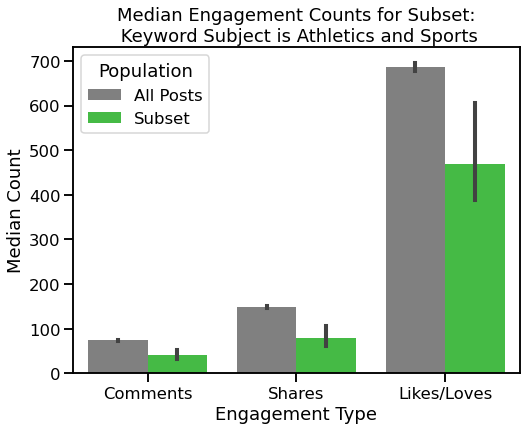

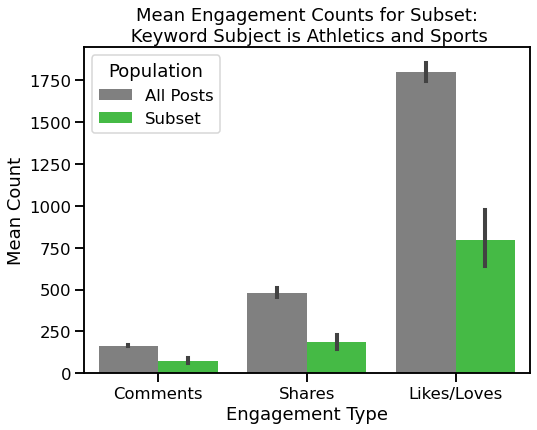

In [369]:
terms = ['athletics and sports']

subset_title = 'Keyword Subject is Athletics and Sports'

df_hits = plot_listmatches_vs_pop(df_articles, terms, subset_title, 
                           search_text_col='subject', 
                           full_text_col='article_text')

Some of these are about protecting kids (from gun violence, from Trump as president), but most are actually on the topic of raising kids.

Likes/loves and shares have the most significant elevation in engagement.

In [370]:
high_eng.head(25)

,Feature,Odds of High Engagement,Formatted Feature
477,breaking news,7.18,breaking news
476,breaking,6.15,breaking
3880,trump,3.49,trump
4177,writes opinion,3.29,writes opinion
1075,donald,3.22,donald
2505,news,3.13,news
3029,recipe,2.97,recipe
4140,women,2.93,women
382,bernie,2.84,bernie
3012,read opinion,2.79,read opinion


### Video or Watch

Number of hits: 2253


Top engagement:


,all_text,comments_count,shares_count,likes_loves
45936,2016 Presidential Debate. Watch Donald J. Trump and Hillary Clinton’s first debate live here. Follow along in the comments for NYT reporters’ live analysis of the debate,169805,40387,123533
17727,"“I know because I won both of them.”. “I have no more campaigns to run,” President Obama said in his State of the Union address. The Republican side of the chamber broke out in cheers and President Obama, cracking a sly smile, responded: “I know because I won both of them.”Sign up for our free video newsletter and get all of our State of the Union highlights tomorrow morning: http://nyti.ms/1ulbBXf",6078,31170,97538
46828,#thisis2016: Asian-Americans Respond to Racist Remarks. An editor for The New York Times wrote an open letter to a woman who told him to 'go back to China.' Asian-Americans responded by sharing their own racist moments using #thisis2016. Here are some of those moments.Warning: This video includes racial slurs and vulgarities,8335,124220,57676
31024,Watch Otto the bulldog break a Guinness World Records by skateboarding through a human tunnel of 30 people. http://nyti.ms/1lmsgf7,4857,33543,49961
42712,"Pilgrimage: A 21st-Century Journey to Mecca and Medina. Take a look around Mecca and Medina. Unless you are Muslim, you aren't normally allowed inside. You can watch the film from the NYT VR app. Here's how: http://nyti.ms/2ahFKsm",3032,36642,30785
43265,"At Donald J. Trump's rallies, some supporters express themselves with slurs and violent language. Here's what it's like up close.Warning: This video includes vulgarities and racial and ethnic slurs",21723,226738,23894
17726,Obama on Actions Against Climate Change. 'The Pentagon says that climate change poses immediate risks to our national security. We should act like it.' — President Barack ObamaSign up for our free video newsletter and get all of our State of the Union highlights tomorrow morning: http://nyti.ms/1ulbBXf,4372,8116,51895
46596,"Second Presidential Debate. Watch Hillary Clinton and Donald J. Trump’s second debate live. Follow along in the comments for live analysis of the debate from NYT reporters, George Takei, Erick Erickson, and others. And, at the end, NYT CEO Mark Thompson and NYT columnist Jim Rutenberg analyze the debate and take your questions",76666,7715,37357
21357,"‘Game of Thrones’ Season Premiere Draws 8 Million Viewers. 'Game of Thrones' is HBO's most-watched original series ever. The audience is expected to grow in the coming days as more people watch the popular HBO series, recorded and on demand.",2121,7061,158957
47150,"Third Presidental Debate. Watch Hillary Clinton and Donald J. Trump’s third debate live. Follow along in the comments for live analysis of the debate from NYT journalists. After the debate, NYT columnist Frank Bruni will reflect on where the race stands and take your questions",72332,5091,28836



Least engagement:


,all_text,comments_count,shares_count,likes_loves
498,"Ask Janine di Giovanni About Reporting From Syria. How do Syria's soldiers who are fighting on the Assad government's side see their conflict against the country's armed resistance? Janine di Giovanni was granted a rare journalist's visa to report from their side of the conflict. Ask her your questions on The Lede blog.Also, watch this video on being embedded with the Syrian army: http://nyti.ms/RiDHlAAnd read Ms. di Giovanni's report from the battle for the city of Homs: http://nyti.ms/VIlWAm. Janine di Giovanni will respond to questions from readers on her experience of reporting from Syria.",1,5,50
39180,"For years, couples have vied for a place in our wedding announcements. Now we get to celebrate with some of them on their big day.The New York Times Styles is live at the wedding of Julia Roberts and Prateesh Maheshwari, a Hindu ceremony which will include a Taiwanese tea ceremony. Watch the wedding here: http://bit.ly/1qkhND0",3,1,24
10314,"Video: ScienceTake | The Frog Slap Shot. The Pac-Man frog uses its super sticky tongue to attack its prey in mere milliseconds. Watch, but don’t blink. The fearsome Pac-Man frog has a huge mouth and a really sticky tongue.",1,4,15
166,"TimesTalks Madrid Live Webcast. TimesTalks is coming to you live from Madrid September 21 - 23. Watch live webcasts (http://bit.ly/NIGvrT) for free with the following luminaries of film, theater and music:Jeremy IronsAlison KlaymanTom HiddlestonBenh ZeitlinJuan Antonio BayonaJulie TaymorTori AmosTune in at http://bit.ly/NIGvrT all weekend!",2,0,55
14563,"'Sleepy Hollow' Recap: And the Father Has Eight Legs. Did you watch the latest episode of Sleepy Hollow?' It was the most demented episode of 'I Didn’t Know I Was Pregnant' ever.'. On this Election eve, is Ichabod Crane a conservative Republican or a liberal Democrat?",0,2,11


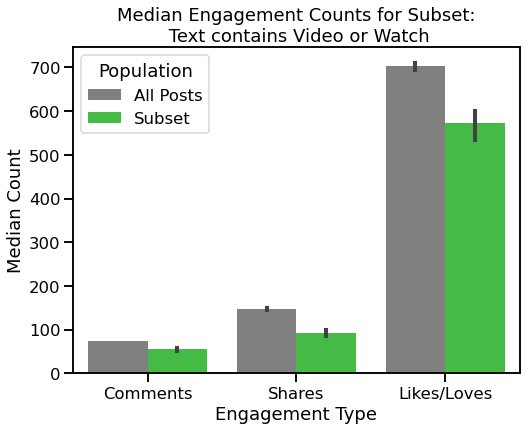

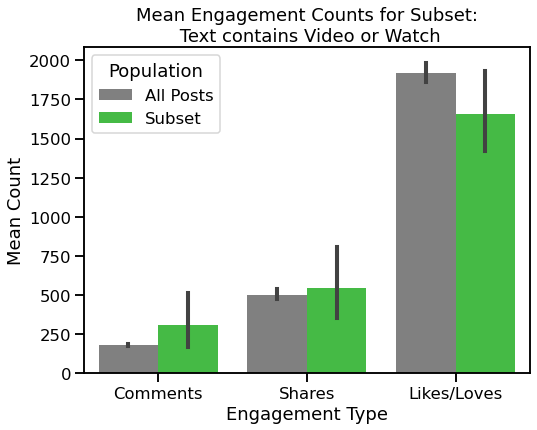

In [371]:
terms = ['video', 'watch' ]

re_string = '\\b' + '\\b|\\b'.join(terms) + '\\b'

subset_title = "Text contains Video or Watch"

df_hits = plot_hits_vs_pop(df, re_string, subset_title)

### Video Posts

In [334]:
df.loc[(df['cleaned'].str.contains('video', regex=False, case=False)) | 
      (df['cleaned'].str.contains('watch', regex=False, case=False)), 
       'post_type'].value_counts(1)

link     0.753229
video    0.188133
photo    0.040140
other    0.018499
Name: post_type, dtype: float64

OK so only 18% of posts that contain the word "video" or "watch" were actually posted as videos; 75% were posted as links.

Video posts are more popular, but it makes sense why the top predictors of average included the words "watch" and "video".

# CONCLUSIONS & RECOMMENDATIONS

## Highly Engaging Topics

### Divisive Topics
- 2016 presidential race
- Opinion pieces
- Topics that tend to be highly polarized such as gun violence, vaccination, racial justice and equality, feminism and gender equality, Muslim Americans and immigration

### Timeliness
- Breaking news

### Other neutral topics can also be highly engaging
- Obituaries
- Recipes
- Cats
- Happiness
- Beauty


## How and When posts are added to Facebook makes a difference
- Posting as a video or photo gets more  engagement than posting a regular message with a link to the article (even though most of these do also have photos). The ultimate format of the content (whether the piece is an article, video, interactive, etc) is less relevant than how the content is presented on Facebook.
- Posting in the evening (7 PM to 11 PM) and on weekends slightly increases odds of high engagement compared to other times of day and week.

## Less engaging

- Although the US 2016 presidential election was highly engaging, general political content is less so.
- Recurring features, such as Quotations of the day, New York Today, Daily Briefing
- Overviews that say "here's what you need to know" about a specific topic.
- Although the 2016 Olympics were fairly engaging, sports in general are not.
- Foreign affairs, such as unrest in the Middle East and Africa, the terrorist attack in Brussels, and the World news section


## Caveats

The model results are more useful to understand themes as opposed to making accurate predictions. Key terms and names will change, so a model trained to pick up on high engagement using the names of the 2016 presidential election candidates, for instance, would perform worse on the 2020 presidential election.

This analysis defines `high engagement` by taking the percentile for engagement in comments count, shares count and likes/loves count, and then getting the mean of those engagement percentiles. Anything over a mean percentile of 75 was considered high. 
-  Engagement went up over time, and this is not accounted for; all posts were considered as a single corpus and not normalized for level of engagement per year, for example.
- The 75th percentile was somewhat arbitrary, and a different choice may yield different results. The distributions did not have a clear change to indicate the most appropriate cutoff point.
- If the New York Times would benefit more from certain types of engagement (for example shares, which might spread content farther beyond direct followers) these models do not capture that. Modeling individual engagement metrics may provide different results.

The results were pulled from two slightly different populations, since I was not able to match up all of the Facebook posts to NYT articles to get the metadata such as subject keywords and section name. The posts that I could not match  tended to be more highly engaging than average.

Just because a certain type of content drives higher engagement doesn't necessarily mean The New York Times will want to post more of that. Divisive and controversial topics tend to receive more engagement, but focusing primarily on those topics would not necessarily be the right move from a journalistic perspective and may not be aligned with the Times' mission and values. 

## Future Steps

- Perform sentiment analysis on articles with different levels of engagement, to see if that plays a role.
- Compare Facebook engagement to NYT comment counts to see if there is a difference.
- Create an interactive dashboard to show engagement levels and top posts related to custom keywords and subjects.